Import Packages

In [1]:
conda config -- add channels conda-forge --quiet

usage: conda [-h] [-V] command ...
conda: error: unrecognized arguments: -- add channels conda-forge --quiet

Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip install pmdarima --quiet

In [3]:
conda install -c conda-forge statsmodels --quiet

Solving environment: ...working... done

## Package Plan ##

  environment location: /Users/mariosmenikou/opt/anaconda3

  added / updated specs:
    - statsmodels


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2022.9.14  |       h033912b_0         152 KB  conda-forge
    certifi-2022.9.14          |     pyhd8ed1ab_0         156 KB  conda-forge
    conda-4.14.0               |   py39h6e9494a_0        1022 KB  conda-forge
    statsmodels-0.13.2         |   py39h15b18c7_0        10.6 MB  conda-forge
    ------------------------------------------------------------
                                           Total:        11.9 MB

The following packages will be UPDATED:

  ca-certificates    pkgs/main::ca-certificates-2022.07.19~ --> conda-forge::ca-certificates-2022.9.14-h033912b_0
  certifi            pkgs/main/osx-64::certifi-2022.6.15-p~ --> conda-forge/noarch::certifi-

In [4]:
pip install statsmodels

     |████████████████████████████████| 40 kB 1.6 MB/s eta 0:00:01
  Attempting uninstall: packaging
    Found existing installation: packaging 21.0
    Uninstalling packaging-21.0:
      Successfully uninstalled packaging-21.0
Note: you may need to restart the kernel to use updated packages.


In [5]:
#pd.set_option("display.max_rows", None, "display.max_columns", None)
#pd.reset_option('^display.', silent=True)

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import statistics
from matplotlib.dates import DateFormatter
import numpy as np
from statsmodels.tsa.stattools import adfuller
from numpy import log
from pmdarima.arima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from math import sqrt

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose

import warnings
warnings.filterwarnings("ignore")


1) Trade in Goods - Annually

In [6]:
# Upload Excel File with: Trade in Goods Annually (TiG_A)
file1 = pd.read_excel('tradequarterlyq421seasonallyadjusted.xlsx', skiprows=3, sheet_name = '3 TiG by Country - A')

# Create a DataFrame, change N/A to zero's
TiG_A = pd.DataFrame(file1)
TiG_A = TiG_A.fillna(0)
TiG_A = TiG_A.drop(columns="Country Code")

# Create a column that counts the Mean
TiG_A['Mean'] = TiG_A.iloc[0:,1:].mean(axis=1)
TiG_A['Total'] = TiG_A.iloc[0:,1:24].sum(axis=1)



# Exports in all Countries
expGA = TiG_A.iloc[0:237,0:]
expGA = expGA[expGA['Country'].str.contains('Total EU27')== False]


# Exports in EU27 Countries
expGA_EU = TiG_A.iloc[0:27,0:]


# Exports in the rest of the world
expGA_Rest = TiG_A.iloc[28:237,0:]


# Total Exports in EU27
expGA_TEU = TiG_A.iloc[27,1:24]
expGA_TEU = pd.DataFrame(expGA_TEU)
expGA_TEU = expGA_TEU.rename(columns = {27: "Total Exports of EU27"})
expGA_TEU = expGA_TEU.reset_index()
expGA_TEU = expGA_TEU.rename(columns = {'index' : "Year"})


# Total Exports in the rest of the world
expGA_TRest = TiG_A.iloc[237,1:24]
expGA_TRest = pd.DataFrame(expGA_TRest)
expGA_TRest = expGA_TRest.rename(columns = {237: "Total Exports in the rest of the World"})
expGA_TRest = expGA_TRest.reset_index()
expGA_TRest = expGA_TRest.rename(columns = {'index' : "Year"})



# Total Exports in the World 
expGA_World = TiG_A.iloc[238,1:24]
expGA_World = pd.DataFrame(expGA_World)
expGA_World = expGA_World.rename(columns = {238: "Total Exports in the World"})
expGA_World = expGA_World.reset_index()
expGA_World = expGA_World.rename(columns = {'index' : "Year"})

#########################################

# Imports in all Countries
impGA = TiG_A.iloc[241:478,0:]
impGA = impGA[impGA['Country'].str.contains('Total EU27')== False]



# Imports in EU27 Countries
impGA_EU = TiG_A.iloc[241:268,0:]



# Imports in the rest of the world
impGA_Rest = TiG_A.iloc[269:478,0:]



# Total Imports in EU27
impGA_TEU = TiG_A.iloc[268,1:24]
impGA_TEU = pd.DataFrame(impGA_TEU)
impGA_TEU = impGA_TEU.rename(columns = {268: "Total Imports of EU27"})
impGA_TEU = impGA_TEU.reset_index()
impGA_TEU = impGA_TEU.rename(columns = {'index' : "Year"})



# Total imports in the rest of the world
impGA_TRest = TiG_A.iloc[478,1:24]
impGA_TRest = pd.DataFrame(impGA_TRest)
impGA_TRest = impGA_TRest.rename(columns = {478: "Total Imports in the rest of the World"})
impGA_TRest = impGA_TRest.reset_index()
impGA_TRest = impGA_TRest.rename(columns = {'index' : "Year"})


# Total imports in the World 
impGA_World = TiG_A.iloc[479,1:24]
impGA_World = pd.DataFrame(impGA_World)
impGA_World = impGA_World.rename(columns = {479: "Total Imports in the World"})
impGA_World = impGA_World.reset_index()
impGA_World = impGA_World.rename(columns = {'index' : "Year"})


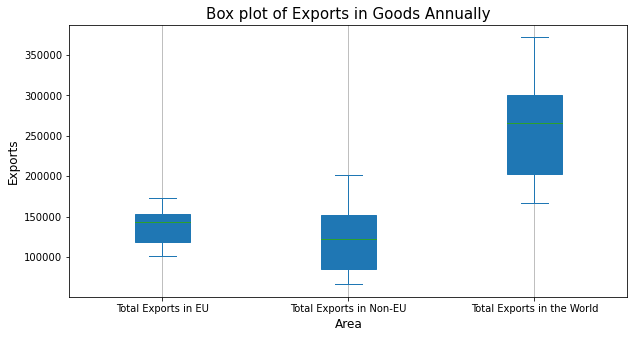

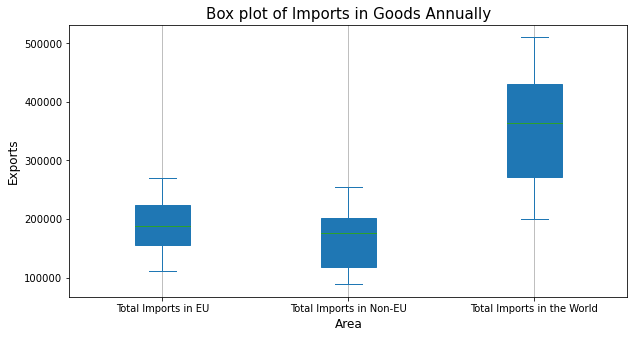

In [7]:
# Box plots of Total Exports in EU, Non-Eu and All countries from 1999-2021

# Figure size
plt.rcParams["figure.figsize"] = (10,5)

# Dataframe
data = pd.DataFrame({"Total Exports in EU": TiG_A.iloc[27,1:-2], "Total Exports in Non-EU": TiG_A.iloc[237,1:-2]
                    ,"Total Exports in the World": TiG_A.iloc[238,1:-2]})

# Plot the Dataframe
ax = data[['Total Exports in EU', 'Total Exports in Non-EU',"Total Exports in the World" ]].astype(float).plot(kind='box',
                                                                                                 patch_artist = True)

plt.title("Box plot of Exports in Goods Annually", size = 15)
plt.xlabel('Area', size = 12)
plt.ylabel('Exports', size = 12)
plt.grid(axis = 'x')
plt.show()



# ******************************************


# Boxplot of Total Imports in EU, Non-Eu and All countries from 1999-2021

# Figure size
plt.rcParams["figure.figsize"] = (10,5)

# Dataframe
data = pd.DataFrame({"Total Imports in EU": TiG_A.iloc[268,1:-2], "Total Imports in Non-EU": TiG_A.iloc[478,1:-2]
                    ,"Total Imports in the World": TiG_A.iloc[479,1:-2]})

# Plot the Dataframe
ax = data[['Total Imports in EU', 'Total Imports in Non-EU',"Total Imports in the World" ]].astype(float).plot(kind='box',
                                                                                                 patch_artist = True)

plt.title("Box plot of Imports in Goods Annually", size = 15)
plt.xlabel('Area', size = 12)
plt.ylabel('Exports', size = 12)
plt.grid(axis = 'x')
plt.show()


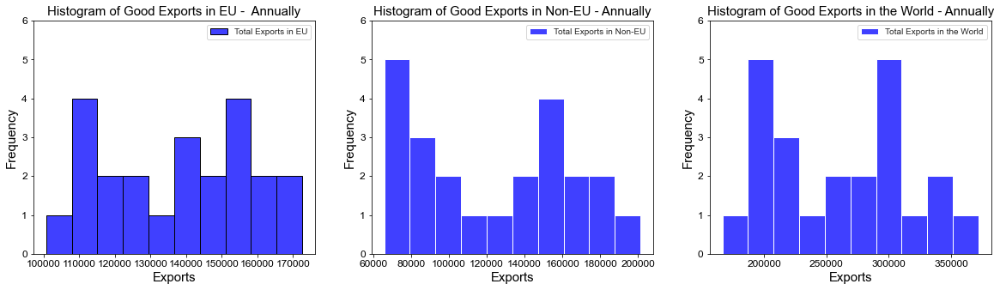

In [8]:
# Plot histogram of Good exports in EU, Non-EU and World from 1999 - 2021 (Goods)

fig, axes = plt.subplots(1,3, figsize=(20, 5))



sns.histplot(ax=axes[0],data=TiG_A.iloc[27,1:-2], bins=10, color = "blue")
sns.set_style("ticks")
axes[0].set_title('Histogram of Good Exports in EU -  Annually', fontsize = 15)
axes[0].set_xlabel('Exports', size= 15)
axes[0].set_ylabel('Frequency', size= 15)
axes[0].legend(labels=["Total Exports in EU"],fontsize = 'medium')
axes[0].xaxis.set_tick_params(labelsize=12)
axes[0].yaxis.set_tick_params(labelsize=12)
axes[0].set_ylim(0, 6)


sns.histplot(ax=axes[1],data=TiG_A.iloc[237,1:-2], bins=10, color = "blue")
axes[1].set_title('Histogram of Good Exports in Non-EU - Annually', fontsize = 15)
axes[1].set_xlabel('Exports', size= 15)
axes[1].set_ylabel('Frequency', size= 15)
axes[1].legend(labels=["Total Exports in Non-EU"],fontsize = 'medium')
axes[1].xaxis.set_tick_params(labelsize=12)
axes[1].yaxis.set_tick_params(labelsize=12)
axes[1].set_ylim(0, 6)


sns.histplot(ax=axes[2],data=TiG_A.iloc[238,1:-2], bins=10, color = "blue")
axes[2].set_title('Histogram of Good Exports in the World - Annually', fontsize = 15)
axes[2].set_xlabel('Exports', size= 15)
axes[2].set_ylabel('Frequency', size= 15)
axes[2].legend(labels=["Total Exports in the World"],fontsize = 'medium')
axes[2].xaxis.set_tick_params(labelsize=12)
axes[2].yaxis.set_tick_params(labelsize=12)
axes[2].set_ylim(0, 6);


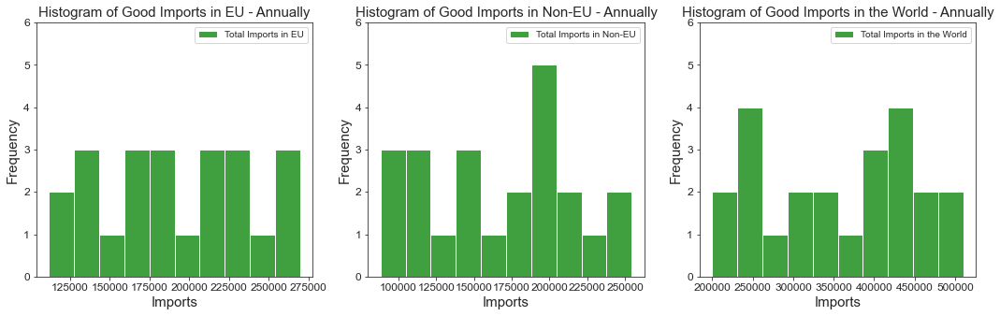

In [9]:
# Plot histogram of Good imports in EU, Non-EU and World from 1999 - 2021

fig, axes = plt.subplots(1,3, figsize=(18, 5))


sns.histplot(ax=axes[0],data=TiG_A.iloc[268,1:-2], bins=10, color = "green")
sns.set_style("ticks")
axes[0].set_title('Histogram of Good Imports in EU - Annually', fontsize = 15)
axes[0].set_xlabel('Imports', size= 15)
axes[0].set_ylabel('Frequency', size= 15)
axes[0].legend(labels=["Total Imports in EU"],fontsize = 'medium')
axes[0].xaxis.set_tick_params(labelsize=12)
axes[0].yaxis.set_tick_params(labelsize=12)
axes[0].set_ylim(0, 6)


sns.histplot(ax=axes[1],data=TiG_A.iloc[478,1:-2], bins=10, color = "green")
axes[1].set_title('Histogram of Good Imports in Non-EU - Annually', fontsize = 15)
axes[1].set_xlabel('Imports', size= 15)
axes[1].set_ylabel('Frequency', size= 15)
axes[1].legend(labels=["Total Imports in Non-EU"],fontsize = 'medium')
axes[1].xaxis.set_tick_params(labelsize=12)
axes[1].yaxis.set_tick_params(labelsize=12)
axes[1].set_ylim(0, 6)


sns.histplot(ax=axes[2],data=TiG_A.iloc[479,1:-2], bins=10, color = "green")
axes[2].set_title('Histogram of Good Imports in the World - Annually', fontsize = 15)
axes[2].set_xlabel('Imports', size= 15)
axes[2].set_ylabel('Frequency', size= 15)
axes[2].legend(labels=["Total Imports in the World"],fontsize = 'medium')
axes[2].xaxis.set_tick_params(labelsize=12)
axes[2].yaxis.set_tick_params(labelsize=12)
axes[2].set_ylim(0, 6);


2) Trade in Goods - Quarterly 

In [10]:
# Upload Excel File with: Trade in Goods Quarterly (TiG_Q)
file2 = pd.read_excel('tradequarterlyq421seasonallyadjusted.xlsx', skiprows=3, sheet_name = '4 TiG by Country - Q')

# Create a DataFrame, change N/A to zero's
TiG_Q = pd.DataFrame(file2)
TiG_Q = TiG_Q.fillna(0)
TiG_Q = TiG_Q.drop(columns="Country Code")



# Exports in all Countries 
expGQ = TiG_Q.iloc[0:237,0:]
expGQ = expGQ[expGQ['Country'].str.contains('Total EU27')== False]


# Exports in EU27 Countries
expGQ_EU = TiG_Q.iloc[0:27,0:]


# Exports in the rest of the world
expGQ_Rest = TiG_Q.iloc[28:237,0:]


# Total Exports in EU27
expGQ_TEU = TiG_Q.iloc[27,1:25]
expGQ_TEU = pd.DataFrame(expGQ_TEU)
expGQ_TEU = expGQ_TEU.rename(columns = {27: "Total Exports of EU27"})
expGQ_TEU = expGQ_TEU.reset_index()
expGQ_TEU = expGQ_TEU.rename(columns = {'index' : "Year"})



# Total Exports in the rest of the world
expGQ_TRest = TiG_Q.iloc[237,1:25]
expGQ_TRest = pd.DataFrame(expGQ_TRest)
expGQ_TRest = expGQ_TRest.rename(columns = {237: "Total Exports in the rest of the World"})
expGQ_TRest = expGQ_TRest.reset_index()
expGQ_TRest = expGQ_TRest.rename(columns = {'index' : "Year"})



# Total Exports in the World 
expGQ_World = TiG_Q.iloc[238,1:24]
expGQ_World = pd.DataFrame(expGQ_World)
expGQ_World = expGQ_World.rename(columns = {238: "Total Exports in the World"})
expGQ_World = expGQ_World.reset_index()
expGQ_World = expGQ_World.rename(columns = {'index' : "Year"})



#########################################


# Imports in all Countries
impGQ = TiG_Q.iloc[241:478,0:]
impGQ = impGQ[impGQ['Country'].str.contains('Total EU27')== False]



# Imports in EU27 Countries
impGQ_EU = TiG_Q.iloc[241:268,0:]



# Imports in the rest of the world
impGQ_Rest = TiG_Q.iloc[269:478,0:]



# Total Imports in EU27
impGQ_TEU = TiG_Q.iloc[268,1:25]
impGQ_TEU = pd.DataFrame(impGQ_TEU)
impGQ_TEU = impGQ_TEU.rename(columns = {268: "Total Imports of EU27"})
impGQ_TEU = impGQ_TEU.reset_index()
impGQ_TEU = impGQ_TEU.rename(columns = {'index' : "Year"})


# Total imports in the rest of the world
impGQ_TRest = TiG_Q.iloc[478,1:25]
impGQ_TRest = pd.DataFrame(impGQ_TRest)
impGQ_TRest = impGQ_TRest.rename(columns = {478: "Total Imports in the rest of the World"})
impGQ_TRest = impGQ_TRest.reset_index()
impGQ_TRest = impGQ_TRest.rename(columns = {'index' : "Year"})


# Total imports in the World 
impGQ_World = TiG_Q.iloc[479,1:25]
impGQ_World = pd.DataFrame(impGQ_World)
impGQ_World = impGQ_World.rename(columns = {479: "Total Imports in the World"})
impGQ_World = impGQ_World.reset_index()
impGQ_World = impGQ_World.rename(columns = {'index' : "Year"})

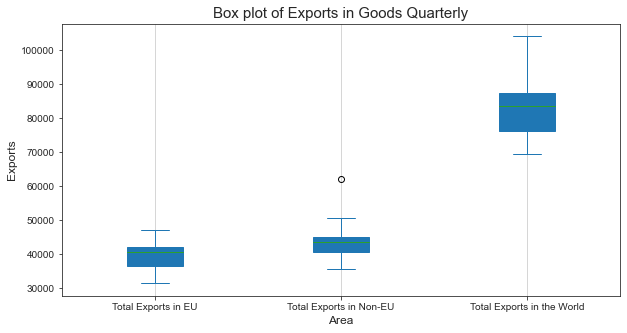

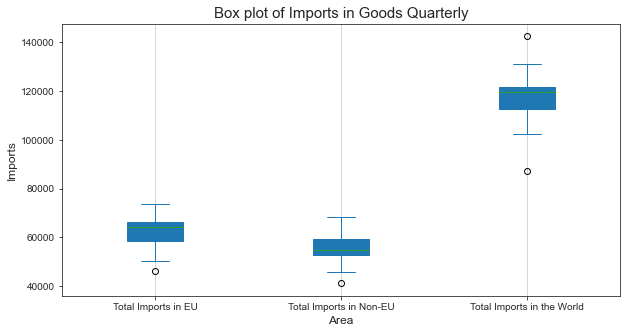

In [11]:
# Box plots of Total Exports in EU, Non-Eu and All countries from 1999-2021 

# Figure size
plt.rcParams["figure.figsize"] = (10,5)

# Dataframe
data = pd.DataFrame({"Total Exports in EU": TiG_Q.iloc[27,1:-2], "Total Exports in Non-EU": TiG_Q.iloc[237,1:-2]
                    ,"Total Exports in the World": TiG_Q.iloc[238,1:-2]})

# Plot the Dataframe
ax = data[['Total Exports in EU', 'Total Exports in Non-EU',"Total Exports in the World" ]].astype(float).plot(kind='box',
                                                                                                 patch_artist = True)

plt.title("Box plot of Exports in Goods Quarterly", size = 15)
plt.xlabel('Area', size = 12)
plt.ylabel('Exports', size = 12)
plt.grid(axis = 'x')
plt.show()



# ******************************************


# Boxplot of Total Imports in EU, Non-Eu and All countries from 1999-2021 

# Figure size
plt.rcParams["figure.figsize"] = (10,5)

# Dataframe
data = pd.DataFrame({"Total Imports in EU": TiG_Q.iloc[268,1:-2], "Total Imports in Non-EU": TiG_Q.iloc[478,1:-2]
                    ,"Total Imports in the World": TiG_Q.iloc[479,1:-2]})

# Plot the Dataframe
ax = data[['Total Imports in EU', 'Total Imports in Non-EU',"Total Imports in the World" ]].astype(float).plot(kind='box',
                                                                                                 patch_artist = True)

plt.title("Box plot of Imports in Goods Quarterly", size = 15)
plt.xlabel('Area', size = 12)
plt.ylabel('Imports', size = 12)
plt.grid(axis = 'x')
plt.show()

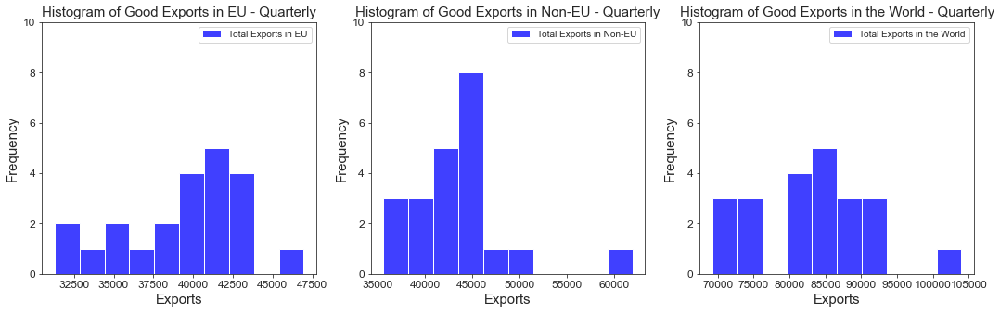

In [12]:
# Plot histogram of exports in EU, Non-EU and World from 1999 - 2021

fig, axes = plt.subplots(1,3, figsize=(18, 5))


sns.histplot(ax=axes[0],data=TiG_Q.iloc[27,1:-2], bins=10, color = "blue")
sns.set_style("ticks")
axes[0].set_title('Histogram of Good Exports in EU - Quarterly', fontsize = 15)
axes[0].set_xlabel('Exports', size= 15)
axes[0].set_ylabel('Frequency', size= 15)
axes[0].legend(labels=["Total Exports in EU"],fontsize = 'medium')
axes[0].xaxis.set_tick_params(labelsize=12)
axes[0].yaxis.set_tick_params(labelsize=12)
axes[0].set_ylim(0, 10)


sns.histplot(ax=axes[1],data=TiG_Q.iloc[237,1:-2], bins=10, color = "blue")
axes[1].set_title('Histogram of Good Exports in Non-EU - Quarterly', fontsize = 15)
axes[1].set_xlabel('Exports', size= 15)
axes[1].set_ylabel('Frequency', size= 15)
axes[1].legend(labels=["Total Exports in Non-EU"],fontsize = 'medium')
axes[1].xaxis.set_tick_params(labelsize=12)
axes[1].yaxis.set_tick_params(labelsize=12)
axes[1].set_ylim(0, 10)


sns.histplot(ax=axes[2],data=TiG_Q.iloc[238,1:-2], bins=10, color = "blue")
axes[2].set_title('Histogram of Good Exports in the World - Quarterly', fontsize = 15)
axes[2].set_xlabel('Exports', size= 15)
axes[2].set_ylabel('Frequency', size= 15)
axes[2].legend(labels=["Total Exports in the World"],fontsize = 'medium')
axes[2].xaxis.set_tick_params(labelsize=12)
axes[2].yaxis.set_tick_params(labelsize=12)
axes[2].set_ylim(0, 10);


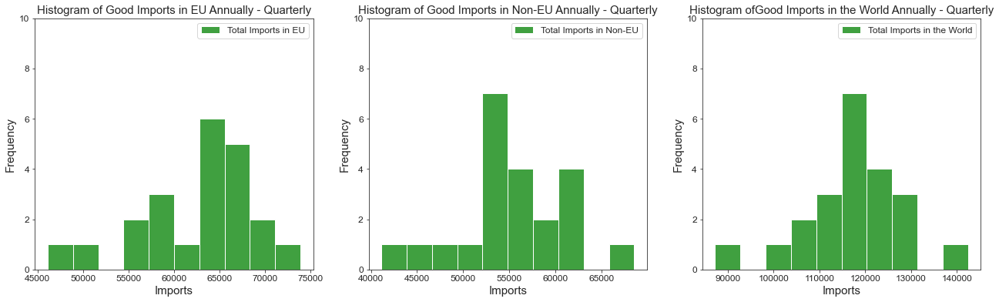

In [13]:
# Plot histogram of imports in EU, Non-EU and World from 1999 - 2021

fig, axes = plt.subplots(1,3, figsize=(22, 6))



sns.histplot(ax=axes[0],data=TiG_Q.iloc[268,1:-2], bins=10, color = "green")
sns.set_style("ticks")
axes[0].set_title('Histogram of Good Imports in EU Annually - Quarterly', fontsize = 15)
axes[0].set_xlabel('Imports', size= 15)
axes[0].set_ylabel('Frequency', size= 15)
axes[0].legend(labels=["Total Imports in EU"],fontsize = 'large')
axes[0].xaxis.set_tick_params(labelsize=12)
axes[0].yaxis.set_tick_params(labelsize=12)
axes[0].set_ylim(0, 10)


sns.histplot(ax=axes[1],data=TiG_Q.iloc[478,1:-2], bins=10, color = "green")
axes[1].set_title('Histogram of Good Imports in Non-EU Annually - Quarterly', fontsize = 15)
axes[1].set_xlabel('Imports', size= 15)
axes[1].set_ylabel('Frequency', size= 15)
axes[1].legend(labels=["Total Imports in Non-EU"],fontsize = 'large')
axes[1].xaxis.set_tick_params(labelsize=12)
axes[1].yaxis.set_tick_params(labelsize=12)
axes[1].set_ylim(0, 10)


sns.histplot(ax=axes[2],data=TiG_Q.iloc[479,1:-2], bins=10, color = "green")
axes[2].set_title('Histogram ofGood Imports in the World Annually - Quarterly', fontsize = 15)
axes[2].set_xlabel('Imports', size= 15)
axes[2].set_ylabel('Frequency', size= 15)
axes[2].legend(labels=["Total Imports in the World"],fontsize = 'large')
axes[2].xaxis.set_tick_params(labelsize=12)
axes[2].yaxis.set_tick_params(labelsize=12);
axes[2].set_ylim(0, 10);


3) Trade in Services - Annually

In [14]:
# Upload Excel File with: Trade in Services Annually (TiS_A)
file3 = pd.read_excel('tradequarterlyq421seasonallyadjusted.xlsx', skiprows=3, sheet_name = '5 TiS by Country - A')

# Create a DataFrame, change N/A to zero's
TiS_A = pd.DataFrame(file3)
TiS_A = TiS_A.fillna(0)
TiS_A = TiS_A.drop(columns="Country Code")

# Create a column that counts the Mean
TiS_A['Mean'] = TiS_A.iloc[0:,1:].mean(axis=1)
TiS_A['Total'] = TiS_A.iloc[0:,1:24].sum(axis=1)




# Exports in all Countries
expSA = TiS_A.iloc[0:240,0:]
expSA = expSA[expSA['Country'].str.contains('Total EU27')== False]


# Exports in EU27 Countries
expSA_EU = TiS_A.iloc[0:29,0:]


# Exports in the rest of the world
expSA_Rest = TiS_A.iloc[30:240,0:]


# Total Exports in EU27
expSA_TEU = TiS_A.iloc[29,1:24]
expSA_TEU = pd.DataFrame(expSA_TEU)
expSA_TEU = expSA_TEU.rename(columns = {29: "Total Exports of EU27"})
expSA_TEU = expSA_TEU.reset_index()
expSA_TEU = expSA_TEU.rename(columns = {'index' : "Year"})


# Total Exports in the rest of the world
expSA_TRest = TiS_A.iloc[240,1:24]
expSA_TRest = pd.DataFrame(expSA_TRest)
expSA_TRest = expSA_TRest.rename(columns = {240: "Total Exports in the rest of the World"})
expSA_TRest = expSA_TRest.reset_index()
expSA_TRest = expSA_TRest.rename(columns = {'index' : "Year"})


# Total Exports in the World 
expSA_World = TiS_A.iloc[241,1:24]
expSA_World = pd.DataFrame(expSA_World)
expSA_World = expSA_World.rename(columns = {241: "Total Exports in the World"})
expSA_World = expSA_World.reset_index()
expSA_World = expSA_World.rename(columns = {'index' : "Year"})


###############################


# Imports in all Countries
impSA = TiS_A.iloc[244:484,0:]
impSA = impSA[impSA['Country'].str.contains('Total EU27')== False]



# Imports in EU27 Countries
impSA_EU = TiS_A.iloc[244:273,0:]



# Imports in the rest of the world
impSA_Rest = TiS_A.iloc[274:484,0:]



# Total Imports in EU27
impSA_TEU = TiS_A.iloc[273,1:24]
impSA_TEU = pd.DataFrame(impSA_TEU)
impSA_TEU = impSA_TEU.rename(columns = {273: "Total Imports of EU27"})
impSA_TEU = impSA_TEU.reset_index()
impSA_TEU = impSA_TEU.rename(columns = {'index' : "Year"})


# Total imports in the rest of the world
impSA_TRest = TiS_A.iloc[484,1:24]
impSA_TRest = pd.DataFrame(impSA_TRest)
impSA_TRest = impSA_TRest.rename(columns = {484: "Total Imports in the rest of the World"})
impSA_TRest = impSA_TRest.reset_index()
impSA_TRest = impSA_TRest.rename(columns = {'index' : "Year"})


# Total imports in the World 
impSA_World = TiS_A.iloc[485,1:24]
impSA_World = pd.DataFrame(impSA_World)
impSA_World = impSA_World.rename(columns = {485: "Total Imports in the World"})
impSA_World = impSA_World.reset_index()
impSA_World = impSA_World.rename(columns = {'index' : "Year"})


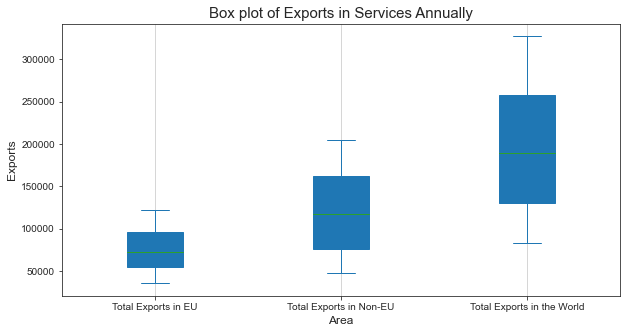

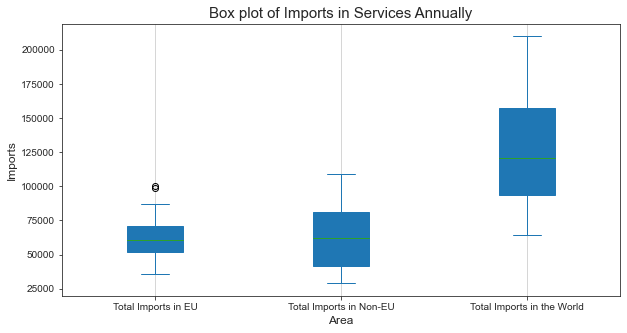

In [15]:
# Box plots of Total Exports in EU, Non-Eu and All countries from 1999-2021

# Figure size
plt.rcParams["figure.figsize"] = (10,5)

# Dataframe
data = pd.DataFrame({"Total Exports in EU": TiS_A.iloc[29,1:-2], "Total Exports in Non-EU": TiS_A.iloc[240,1:-2]
                    ,"Total Exports in the World": TiS_A.iloc[241,1:-2]})

# Plot the Dataframe
ax = data[['Total Exports in EU', 'Total Exports in Non-EU',"Total Exports in the World" ]].astype(float).plot(kind='box',
                                                                                                 patch_artist = True)

plt.title("Box plot of Exports in Services Annually", size = 15)
plt.xlabel('Area', size = 12)
plt.ylabel('Exports', size = 12)
plt.grid(axis = 'x')
plt.show()



# ******************************************


# Boxplot of Total Imports in EU, Non-Eu and All countries from 1999-2021

# Figure size
plt.rcParams["figure.figsize"] = (10,5)

# Dataframe
data = pd.DataFrame({"Total Imports in EU": TiS_A.iloc[273,1:-2], "Total Imports in Non-EU": TiS_A.iloc[484,1:-2]
                    ,"Total Imports in the World": TiS_A.iloc[485,1:-2]})

# Plot the Dataframe
ax = data[['Total Imports in EU', 'Total Imports in Non-EU',"Total Imports in the World" ]].astype(float).plot(kind='box',
                                                                                                 patch_artist = True)

plt.title("Box plot of Imports in Services Annually", size = 15)
plt.xlabel('Area', size = 12)
plt.ylabel('Imports', size = 12)
plt.grid(axis = 'x')
plt.show()


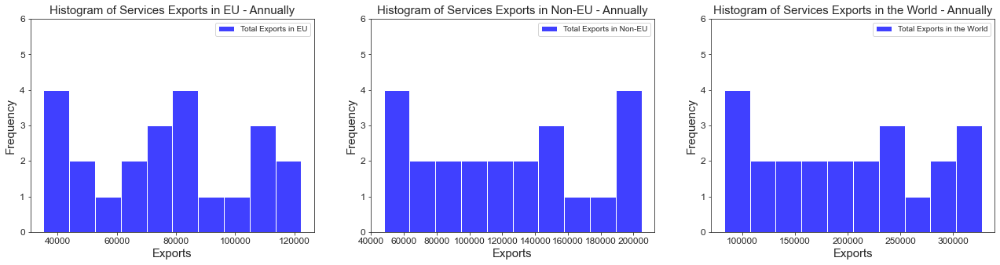

In [16]:
# Plot histogram of exports in EU, Non-EU and World from 1999 - 2021

fig, axes = plt.subplots(1,3, figsize=(22, 5))


sns.histplot(ax=axes[0],data=TiS_A.iloc[29,1:-2], bins=10, color = "blue")
sns.set_style("ticks")
axes[0].set_title('Histogram of Services Exports in EU - Annually', fontsize = 15)
axes[0].set_xlabel('Exports', size= 15)
axes[0].set_ylabel('Frequency', size= 15)
axes[0].legend(labels=["Total Exports in EU"],fontsize = 'medium')
axes[0].xaxis.set_tick_params(labelsize=12)
axes[0].yaxis.set_tick_params(labelsize=12)
axes[0].set_ylim(0, 6)


sns.histplot(ax=axes[1],data=TiS_A.iloc[240,1:-2], bins=10, color = "blue")
axes[1].set_title('Histogram of Services Exports in Non-EU - Annually', fontsize = 15)
axes[1].set_xlabel('Exports', size= 15)
axes[1].set_ylabel('Frequency', size= 15)
axes[1].legend(labels=["Total Exports in Non-EU"],fontsize = 'medium')
axes[1].xaxis.set_tick_params(labelsize=12)
axes[1].yaxis.set_tick_params(labelsize=12)
axes[1].set_ylim(0, 6)


sns.histplot(ax=axes[2],data=TiS_A.iloc[241,1:-2], bins=10, color = "blue")
axes[2].set_title('Histogram of Services Exports in the World - Annually', fontsize = 15)
axes[2].set_xlabel('Exports', size= 15)
axes[2].set_ylabel('Frequency', size= 15)
axes[2].legend(labels=["Total Exports in the World"],fontsize = 'medium')
axes[2].xaxis.set_tick_params(labelsize=12)
axes[2].yaxis.set_tick_params(labelsize=12)
axes[2].set_ylim(0, 6);


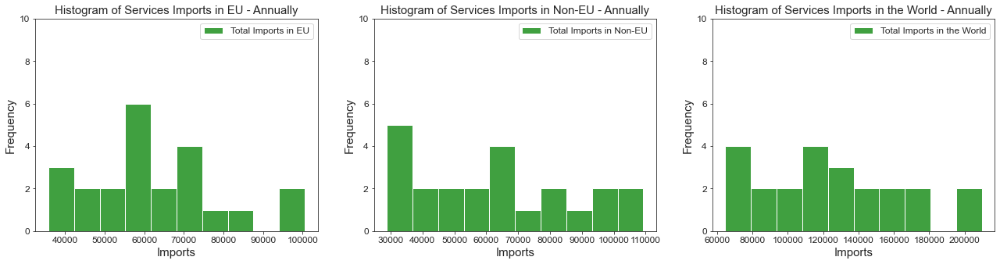

In [17]:
# Plot histogram of imports in EU, Non-EU and World from 1999 - 2021

fig, axes = plt.subplots(1,3, figsize=(22, 5))


sns.histplot(ax=axes[0],data=TiS_A.iloc[273,1:-2], bins=10, color = "green")
sns.set_style("ticks")
axes[0].set_title('Histogram of Services Imports in EU - Annually', fontsize = 15)
axes[0].set_xlabel('Imports', size= 15)
axes[0].set_ylabel('Frequency', size= 15)
axes[0].legend(labels=["Total Imports in EU"],fontsize = 'large')
axes[0].xaxis.set_tick_params(labelsize=12)
axes[0].yaxis.set_tick_params(labelsize=12)
axes[0].set_ylim(0, 10)


sns.histplot(ax=axes[1],data=TiS_A.iloc[484,1:-2], bins=10, color = "green")
axes[1].set_title('Histogram of Services Imports in Non-EU - Annually', fontsize = 15)
axes[1].set_xlabel('Imports', size= 15)
axes[1].set_ylabel('Frequency', size= 15)
axes[1].legend(labels=["Total Imports in Non-EU"],fontsize = 'large')
axes[1].xaxis.set_tick_params(labelsize=12)
axes[1].yaxis.set_tick_params(labelsize=12)
axes[1].set_ylim(0, 10)


sns.histplot(ax=axes[2],data=TiS_A.iloc[485,1:-2], bins=10, color = "green")
axes[2].set_title('Histogram of Services Imports in the World - Annually', fontsize = 15)
axes[2].set_xlabel('Imports', size= 15)
axes[2].set_ylabel('Frequency', size= 15)
axes[2].legend(labels=["Total Imports in the World"],fontsize = 'large')
axes[2].xaxis.set_tick_params(labelsize=12)
axes[2].yaxis.set_tick_params(labelsize=12);
axes[2].set_ylim(0, 10);


4) Trade in Services - Quarterly

In [18]:
# Upload Excel File with: Trade in Services Quarterly (TiS_Q)
file4 = pd.read_excel('tradequarterlyq421seasonallyadjusted.xlsx', skiprows=3, sheet_name = '6 TiS by Country - Q')

# Create a DataFrame, change N/A to zero's
TiS_Q = pd.DataFrame(file4)
TiS_Q = TiS_Q.fillna(0)
TiS_Q = TiS_Q.drop(columns="Country Code")


# Exports in all Countries
expSQ = TiS_Q.iloc[0:240,0:]
expSQ = expSQ[expSQ['Country'].str.contains('Total EU27')== False]


# Exports in EU27 Countries
expSQ_EU = TiS_Q.iloc[0:29,0:]


# Exports in the rest of the world
expSQ_Rest = TiS_Q.iloc[30:240,0:]


# Total Exports in EU27
expSQ_TEU = TiS_Q.iloc[29,1:24]
expSQ_TEU = pd.DataFrame(expSQ_TEU)
expSQ_TEU = expSQ_TEU.rename(columns = {29: "Total Exports of EU27"})
expSQ_TEU = expSQ_TEU.reset_index()
expSQ_TEU = expSQ_TEU.rename(columns = {'index' : "Year"})

# Total Exports in the rest of the world
expSQ_TRest = TiS_Q.iloc[240,1:24]
expSQ_TRest = pd.DataFrame(expSQ_TRest)
expSQ_TRest = expSQ_TRest.rename(columns = {240: "Total Exports in the rest of the World"})
expSQ_TRest = expSQ_TRest.reset_index()
expSQ_TRest = expSQ_TRest.rename(columns = {'index' : "Year"})


# Total Exports in the World 
expSQ_World = TiS_Q.iloc[241,1:24]
expSQ_World = pd.DataFrame(expSQ_World)
expSQ_World = expSQ_World.rename(columns = {241: "Total Exports in the World"})
expSQ_World = expSQ_World.reset_index()
expSQ_World = expSQ_World.rename(columns = {'index' : "Year"})


###############################


# Imports in all Countries
impSQ = TiS_Q.iloc[244:484,0:]
impSQ = impSQ[impSQ['Country'].str.contains('Total EU27')== False]



# Imports in EU27 Countries
impSQ_EU = TiS_Q.iloc[244:273,0:]



# Imports in the rest of the world
impSQ_Rest = TiS_Q.iloc[274:484,0:]



# Total Imports in EU27
impSQ_TEU = TiS_Q.iloc[273,1:24]
impSQ_TEU = pd.DataFrame(impSQ_TEU)
impSQ_TEU = impSQ_TEU.rename(columns = {273: "Total Imports of EU27"})
impSQ_TEU = impSQ_TEU.reset_index()
impSQ_TEU = impSQ_TEU.rename(columns = {'index' : "Year"})


# Total imports in the rest of the world
impSQ_TRest = TiS_Q.iloc[484,1:24]
impSQ_TRest = pd.DataFrame(impSQ_TRest)
impSQ_TRest = impSQ_TRest.rename(columns = {484: "Total Imports in the rest of the World"})
impSQ_TRest = impSQ_TRest.reset_index()
impSQ_TRest = impSQ_TRest.rename(columns = {'index' : "Year"})


# Total imports in the World 
impSQ_World = TiS_Q.iloc[485,1:24]
impSQ_World = pd.DataFrame(impSQ_World)
impSQ_World = impSQ_World.rename(columns = {485: "Total Imports in the World"})
impSQ_World = impSQ_World.reset_index()
impSQ_World = impSQ_World.rename(columns = {'index' : "Year"})


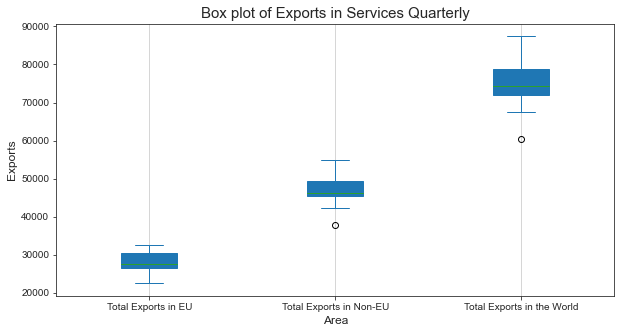

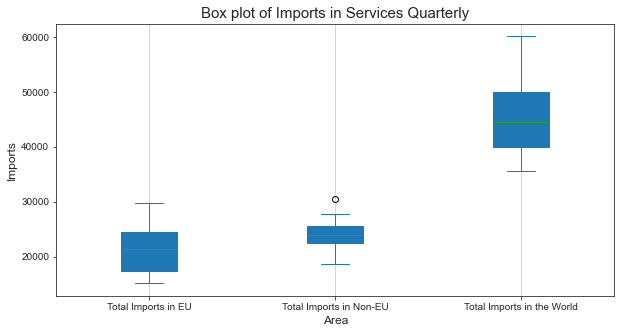

In [19]:
# Box plots of Total Exports in EU, Non-Eu and All countries from 1999-2021

# Figure size
plt.rcParams["figure.figsize"] = (10,5)

# Dataframe
data = pd.DataFrame({"Total Exports in EU": TiS_Q.iloc[29,1:-2], "Total Exports in Non-EU": TiS_Q.iloc[240,1:-2]
                    ,"Total Exports in the World": TiS_Q.iloc[241,1:-2]})

# Plot the Dataframe
ax = data[['Total Exports in EU', 'Total Exports in Non-EU',"Total Exports in the World" ]].astype(float).plot(kind='box',
                                                                                                 patch_artist = True)

plt.title("Box plot of Exports in Services Quarterly", size = 15)
plt.xlabel('Area', size = 12)
plt.ylabel('Exports', size = 12)
plt.grid(axis = 'x')
plt.show()



# ******************************************


# Boxplot of Total Imports in EU, Non-Eu and All countries from 1999-2021

# Figure size
plt.rcParams["figure.figsize"] = (10,5)

# Dataframe
data = pd.DataFrame({"Total Imports in EU": TiS_Q.iloc[273,1:-2], "Total Imports in Non-EU": TiS_Q.iloc[484,1:-2]
                    ,"Total Imports in the World": TiS_Q.iloc[485,1:-2]})

# Plot the Dataframe
ax = data[['Total Imports in EU', 'Total Imports in Non-EU',"Total Imports in the World" ]].astype(float).plot(kind='box',
                                                                                                 patch_artist = True)

plt.title("Box plot of Imports in Services Quarterly", size = 15)
plt.xlabel('Area', size = 12)
plt.ylabel('Imports', size = 12)
plt.grid(axis = 'x')
plt.show()

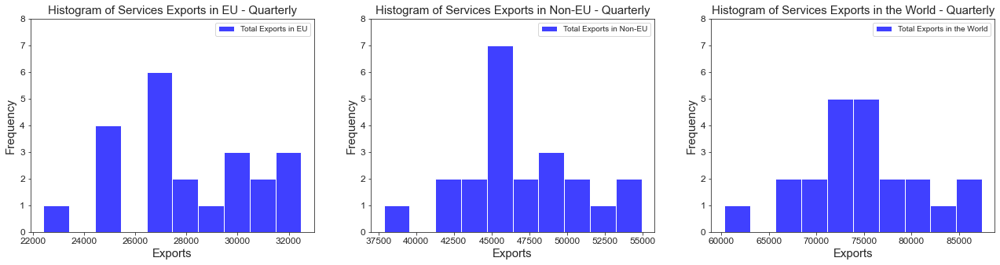

In [20]:
# Plot histogram of exports in EU, Non-EU and World from 1999 - 2021

fig, axes = plt.subplots(1,3, figsize=(22, 5))


sns.histplot(ax=axes[0],data=TiS_Q.iloc[29,1:-2], bins=10, color = "blue")
sns.set_style("ticks")
axes[0].set_title('Histogram of Services Exports in EU - Quarterly', fontsize = 15)
axes[0].set_xlabel('Exports', size= 15)
axes[0].set_ylabel('Frequency', size= 15)
axes[0].legend(labels=["Total Exports in EU"],fontsize = 'medium')
axes[0].xaxis.set_tick_params(labelsize=12)
axes[0].yaxis.set_tick_params(labelsize=12)
axes[0].set_ylim(0, 8)


sns.histplot(ax=axes[1],data=TiS_Q.iloc[240,1:-2], bins=10, color = "blue")
axes[1].set_title('Histogram of Services Exports in Non-EU - Quarterly', fontsize = 15)
axes[1].set_xlabel('Exports', size= 15)
axes[1].set_ylabel('Frequency', size= 15)
axes[1].legend(labels=["Total Exports in Non-EU"],fontsize = 'medium')
axes[1].xaxis.set_tick_params(labelsize=12)
axes[1].yaxis.set_tick_params(labelsize=12)
axes[1].set_ylim(0, 8)


sns.histplot(ax=axes[2],data=TiS_Q.iloc[241,1:-2], bins=10, color = "blue")
axes[2].set_title('Histogram of Services Exports in the World - Quarterly', fontsize = 15)
axes[2].set_xlabel('Exports', size= 15)
axes[2].set_ylabel('Frequency', size= 15)
axes[2].legend(labels=["Total Exports in the World"],fontsize = 'medium')
axes[2].xaxis.set_tick_params(labelsize=12)
axes[2].yaxis.set_tick_params(labelsize=12)
axes[2].set_ylim(0, 8);


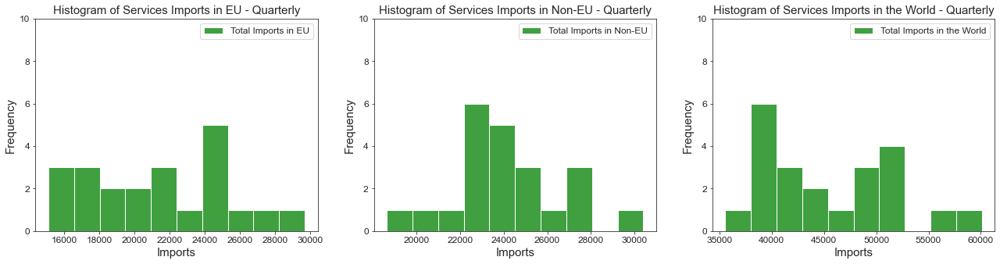

In [21]:
# Plot histogram of imports in EU, Non-EU and World from 1999 - 2021

fig, axes = plt.subplots(1,3, figsize=(22, 5))


sns.histplot(ax=axes[0],data=TiS_Q.iloc[273,1:-2], bins=10, color = "green")
sns.set_style("ticks")
axes[0].set_title('Histogram of Services Imports in EU - Quarterly', fontsize = 15)
axes[0].set_xlabel('Imports', size= 15)
axes[0].set_ylabel('Frequency', size= 15)
axes[0].legend(labels=["Total Imports in EU"],fontsize = 'large')
axes[0].xaxis.set_tick_params(labelsize=12)
axes[0].yaxis.set_tick_params(labelsize=12)
axes[0].set_ylim(0, 10)


sns.histplot(ax=axes[1],data=TiS_Q.iloc[484,1:-2], bins=10, color = "green")
axes[1].set_title('Histogram of Services Imports in Non-EU - Quarterly', fontsize = 15)
axes[1].set_xlabel('Imports', size= 15)
axes[1].set_ylabel('Frequency', size= 15)
axes[1].legend(labels=["Total Imports in Non-EU"],fontsize = 'large')
axes[1].xaxis.set_tick_params(labelsize=12)
axes[1].yaxis.set_tick_params(labelsize=12)
axes[1].set_ylim(0, 10)


sns.histplot(ax=axes[2],data=TiS_Q.iloc[485,1:-2], bins=10, color = "green")
axes[2].set_title('Histogram of Services Imports in the World - Quarterly', fontsize = 15)
axes[2].set_xlabel('Imports', size= 15)
axes[2].set_ylabel('Frequency', size= 15)
axes[2].legend(labels=["Total Imports in the World"],fontsize = 'large')
axes[2].xaxis.set_tick_params(labelsize=12)
axes[2].yaxis.set_tick_params(labelsize=12);
axes[2].set_ylim(0, 10);


5) Total Trade - Annually

In [22]:
# Upload Excel File with: Total Trade Annually (TTA)
file5 = pd.read_excel('tradequarterlyq421seasonallyadjusted.xlsx', skiprows=3, sheet_name = '1 Total Trade by Country - A')

# Create a DataFrame, change N/A to zero's
TTA = pd.DataFrame(file5)
TTA = TTA.fillna(0)
TTA = TTA.drop(columns="Country Code")

# Create a column that counts the Mean
TTA['Mean'] = TTA.iloc[0:,1:].mean(axis=1)
TTA['Total'] = TTA.iloc[0:,1:24].sum(axis=1)



# Exports in all Countries
expTTA = TTA.iloc[0:240,0:]
expTTA = expTTA[expTTA['Country'].str.contains('Total EU27')== False]


# Exports in EU27 Countries
expTTA_EU = TTA.iloc[0:29,0:24]


# Exports in the rest of the world
expTTA_Rest = TTA.iloc[30:240,0:24]


# Total Exports in EU27
expTTA_TEU = TTA.iloc[29,1:24]
expTTA_TEU = pd.DataFrame(expTTA_TEU)
expTTA_TEU = expTTA_TEU.rename(columns = {29: "Total Exports of EU27"})
expTTA_TEU = expTTA_TEU.reset_index()
expTTA_TEU = expTTA_TEU.rename(columns = {'index' : "Year"})

# Total Exports in the rest of the world
expTTA_TRest = TTA.iloc[240,1:24]
expTTA_TRest = pd.DataFrame(expTTA_TRest)
expTTA_TRest = expTTA_TRest.rename(columns = {240: "Total Exports in the rest of the World"})
expTTA_TRest = expTTA_TRest.reset_index()
expTTA_TRest = expTTA_TRest.rename(columns = {'index' : "Year"})


# Total Exports in the World 
expTTA_World = TTA.iloc[241,1:24]
expTTA_World = pd.DataFrame(expTTA_World)
expTTA_World = expTTA_World.rename(columns = {241: "Total Exports in the World"})
expTTA_World = expTTA_World.reset_index()
expTTA_World = expTTA_World.rename(columns = {'index' : "Year"})


###############################



# Imports in all Countries
impTTA = TTA.iloc[244:484,0:]
impTTA = impTTA[impTTA['Country'].str.contains('Total EU27')== False]



# Imports in EU27 Countries
impTTA_EU = TTA.iloc[244:273,0:]



# Imports in the rest of the world
impTTA_Rest = TTA.iloc[274:484,0:]



# Total Imports in EU27
impTTA_TEU = TTA.iloc[273,1:24]
impTTA_TEU = pd.DataFrame(impTTA_TEU)
impTTA_TEU = impTTA_TEU.rename(columns = {273: "Total Imports of EU27"})
impTTA_TEU = impTTA_TEU.reset_index()
impTTA_TEU = impTTA_TEU.rename(columns = {'index' : "Year"})


# Total imports in the rest of the world
impTTA_TRest = TTA.iloc[484,1:24]
impTTA_TRest = pd.DataFrame(impTTA_TRest)
impTTA_TRest = impTTA_TRest.rename(columns = {484: "Total Imports in the rest of the World"})
impTTA_TRest = impTTA_TRest.reset_index()
impTTA_TRest = impTTA_TRest.rename(columns = {'index' : "Year"})


# Total imports in the World 
impTTA_World = TTA.iloc[485,1:24]
impTTA_World = pd.DataFrame(impTTA_World)
impTTA_World = impTTA_World.rename(columns = {485: "Total Imports in the World"})
impTTA_World = impTTA_World.reset_index()
impTTA_World = impTTA_World.rename(columns = {'index' : "Year"})

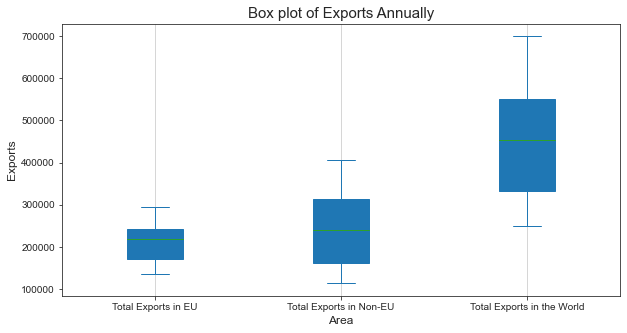

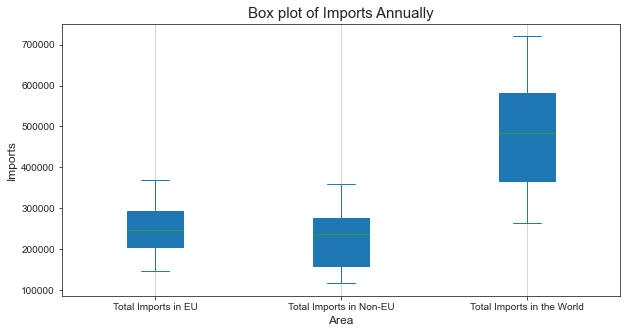

In [23]:
# Box plots of Total Exports in EU, Non-Eu and All countries from 1999-2021

# Figure size
plt.rcParams["figure.figsize"] = (10,5)

# Dataframe
data = pd.DataFrame({"Total Exports in EU": TTA.iloc[29,1:-2], "Total Exports in Non-EU": TTA.iloc[240,1:-2]
                    ,"Total Exports in the World": TTA.iloc[241,1:-2]})

# Plot the Dataframe
ax = data[['Total Exports in EU', 'Total Exports in Non-EU',"Total Exports in the World" ]].astype(float).plot(kind='box',
                                                                                                 patch_artist = True)

plt.title("Box plot of Exports Annually", size = 15)
plt.xlabel('Area', size = 12)
plt.ylabel('Exports', size = 12)
plt.grid(axis = 'x')
plt.show()



# ******************************************


# Boxplot of Total Imports in EU, Non-Eu and All countries from 1999-2021

# Figure size
plt.rcParams["figure.figsize"] = (10,5)

# Dataframe
data = pd.DataFrame({"Total Imports in EU": TTA.iloc[273,1:-2], "Total Imports in Non-EU": TTA.iloc[484,1:-2]
                    ,"Total Imports in the World": TTA.iloc[485,1:-2]})

# Plot the Dataframe
ax = data[['Total Imports in EU', 'Total Imports in Non-EU',"Total Imports in the World" ]].astype(float).plot(kind='box',
                                                                                                 patch_artist = True)

plt.title("Box plot of Imports Annually", size = 15)
plt.xlabel('Area', size = 12)
plt.ylabel('Imports', size = 12)
plt.grid(axis = 'x')
plt.show()

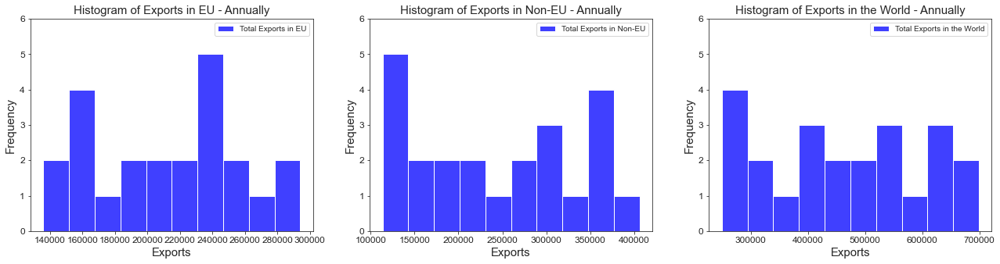

In [24]:
# Plot histogram of exports in EU, Non-EU and World from 1999 - 2021

fig, axes = plt.subplots(1,3, figsize=(22, 5))


sns.histplot(ax=axes[0],data=TTA.iloc[29,1:-2], bins=10, color = "blue")
sns.set_style("ticks")
axes[0].set_title('Histogram of Exports in EU - Annually', fontsize = 15)
axes[0].set_xlabel('Exports', size= 15)
axes[0].set_ylabel('Frequency', size= 15)
axes[0].legend(labels=["Total Exports in EU"],fontsize = 'medium')
axes[0].xaxis.set_tick_params(labelsize=12)
axes[0].yaxis.set_tick_params(labelsize=12)
axes[0].set_ylim(0, 6)


sns.histplot(ax=axes[1],data=TTA.iloc[240,1:-2], bins=10, color = "blue")
axes[1].set_title('Histogram of Exports in Non-EU - Annually', fontsize = 15)
axes[1].set_xlabel('Exports', size= 15)
axes[1].set_ylabel('Frequency', size= 15)
axes[1].legend(labels=["Total Exports in Non-EU"],fontsize = 'medium')
axes[1].xaxis.set_tick_params(labelsize=12)
axes[1].yaxis.set_tick_params(labelsize=12)
axes[1].set_ylim(0, 6)


sns.histplot(ax=axes[2],data=TTA.iloc[241,1:-2], bins=10, color = "blue")
axes[2].set_title('Histogram of Exports in the World - Annually', fontsize = 15)
axes[2].set_xlabel('Exports', size= 15)
axes[2].set_ylabel('Frequency', size= 15)
axes[2].legend(labels=["Total Exports in the World"],fontsize = 'medium')
axes[2].xaxis.set_tick_params(labelsize=12)
axes[2].yaxis.set_tick_params(labelsize=12)
axes[2].set_ylim(0, 6);


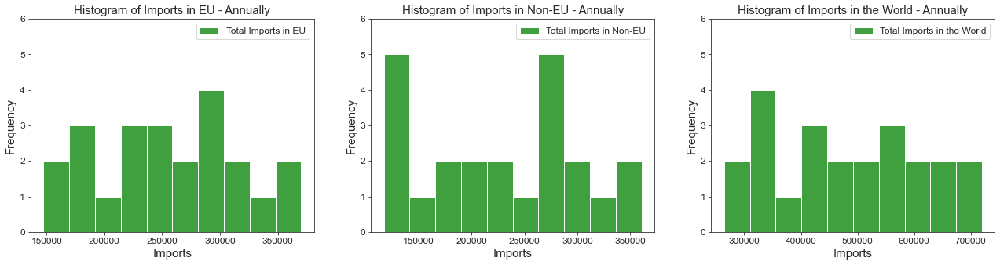

In [25]:
# Plot histogram of imports in EU, Non-EU and World from 1999 - 2021

fig, axes = plt.subplots(1,3, figsize=(22, 5))


sns.histplot(ax=axes[0],data=TTA.iloc[273,1:-2], bins=10, color = "green")
sns.set_style("ticks")
axes[0].set_title('Histogram of Imports in EU - Annually', fontsize = 15)
axes[0].set_xlabel('Imports', size= 15)
axes[0].set_ylabel('Frequency', size= 15)
axes[0].legend(labels=["Total Imports in EU"],fontsize = 'large')
axes[0].xaxis.set_tick_params(labelsize=12)
axes[0].yaxis.set_tick_params(labelsize=12)
axes[0].set_ylim(0, 6)


sns.histplot(ax=axes[1],data=TTA.iloc[484,1:-2], bins=10, color = "green")
axes[1].set_title('Histogram of Imports in Non-EU - Annually', fontsize = 15)
axes[1].set_xlabel('Imports', size= 15)
axes[1].set_ylabel('Frequency', size= 15)
axes[1].legend(labels=["Total Imports in Non-EU"],fontsize = 'large')
axes[1].xaxis.set_tick_params(labelsize=12)
axes[1].yaxis.set_tick_params(labelsize=12)
axes[1].set_ylim(0, 6)


sns.histplot(ax=axes[2],data=TTA.iloc[485,1:-2], bins=10, color = "green")
axes[2].set_title('Histogram of Imports in the World - Annually', fontsize = 15)
axes[2].set_xlabel('Imports', size= 15)
axes[2].set_ylabel('Frequency', size= 15)
axes[2].legend(labels=["Total Imports in the World"],fontsize = 'large')
axes[2].xaxis.set_tick_params(labelsize=12)
axes[2].yaxis.set_tick_params(labelsize=12);
axes[2].set_ylim(0, 6);


6) Total Trade - Quarterly

In [26]:
# Upload Excel File with: Total Trade Quarterly (TTQ)
file6 = pd.read_excel('tradequarterlyq421seasonallyadjusted.xlsx', skiprows=3, sheet_name = '2 Total Trade by Country - Q')

# Create a DataFrame, change N/A to zero's
TTQ = pd.DataFrame(file6)
TTQ = TTQ.fillna(0)
TTQ = TTQ.drop(columns="Country Code")


# Exports in all Countries
expTTQ = TTQ.iloc[0:240,0:]
expTTQ= expTTQ[expTTQ['Country'].str.contains('Total EU27')== False]


# Exports in EU27 Countries
expTTQ_EU = TTQ.iloc[0:29,0:24]


# Exports in the rest of the world
expTTQ_Rest = TTQ.iloc[30:240,0:24]


# Total Exports in EU27
expTTQ_TEU = TTQ.iloc[29,1:24]
expTTQ_TEU = pd.DataFrame(expTTQ_TEU)
expTTQ_TEU = expTTQ_TEU.rename(columns = {29: "Total Exports of EU27"})
expTTQ_TEU = expTTQ_TEU.reset_index()
expTTQ_TEU = expTTQ_TEU.rename(columns = {'index' : "Year"})

# Total Exports in the rest of the world
expTTQ_TRest = TTQ.iloc[240,1:24]
expTTQ_TRest = pd.DataFrame(expTTQ_TRest)
expTTQ_TRest = expTTQ_TRest.rename(columns = {240: "Total Exports in the rest of the World"})
expTTQ_TRest = expTTQ_TRest.reset_index()
expTTQ_TRest = expTTQ_TRest.rename(columns = {'index' : "Year"})


# Total Exports in the World 
expTTQ_World = TTQ.iloc[241,1:24]
expTTQ_World = pd.DataFrame(expTTQ_World)
expTTQ_World = expTTQ_World.rename(columns = {241: "Total Exports in the World"})
expTTQ_World = expTTQ_World.reset_index()
expTTQ_World = expTTQ_World.rename(columns = {'index' : "Year"})


###############################



# Imports in all Countries
impTTQ = TTQ.iloc[244:484,0:]
impTTQ = impTTQ[impTTQ['Country'].str.contains('Total EU27')== False]



# Imports in EU27 Countries
impTTQ_EU = TTQ.iloc[244:273,0:]



# Imports in the rest of the world
impTTQ_Rest = TTQ.iloc[274:484,0:]



# Total Imports in EU27
impTTQ_TEU = TTA.iloc[273,1:24]
impTTQ_TEU = pd.DataFrame(impTTQ_TEU)
impTTQ_TEU = impTTQ_TEU.rename(columns = {273: "Total Imports of EU27"})
impTTQ_TEU = impTTQ_TEU.reset_index()
impTTQ_TEU = impTTQ_TEU.rename(columns = {'index' : "Year"})


# Total imports in the rest of the world
impTTQ_TRest = TTQ.iloc[484,1:24]
impTTQ_TRest = pd.DataFrame(impTTQ_TRest)
impTTQ_TRest = impTTQ_TRest.rename(columns = {484: "Total Imports in the rest of the World"})
impTTQ_TRest = impTTQ_TRest.reset_index()
impTTQ_TRest = impTTQ_TRest.rename(columns = {'index' : "Year"})


# Total imports in the World 
impTTQ_World = TTQ.iloc[485,1:24]
impTTQ_World = pd.DataFrame(impTTQ_World)
impTTQ_World = impTTQ_World.rename(columns = {485: "Total Imports in the World"})
impTTQ_World = impTTQ_World.reset_index()
impTTQ_World = impTTQ_World.rename(columns = {'index' : "Year"})


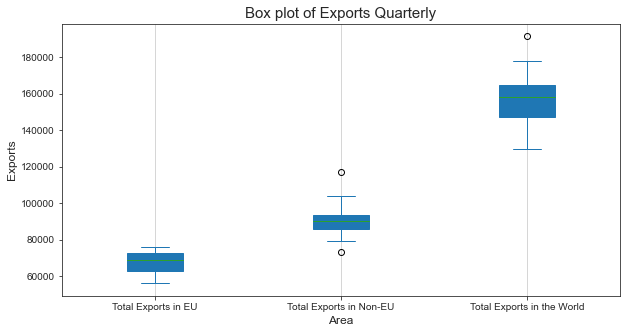

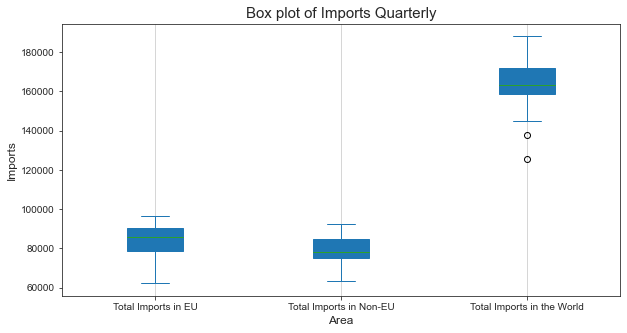

In [27]:
# Box plots of Total Exports in EU, Non-Eu and All countries from 1999-2021

# Figure size
plt.rcParams["figure.figsize"] = (10,5)

# Dataframe
data = pd.DataFrame({"Total Exports in EU": TTQ.iloc[29,1:-2], "Total Exports in Non-EU": TTQ.iloc[240,1:-2]
                    ,"Total Exports in the World": TTQ.iloc[241,1:-2]})

# Plot the Dataframe
ax = data[['Total Exports in EU', 'Total Exports in Non-EU',"Total Exports in the World" ]].astype(float).plot(kind='box',
                                                                                                 patch_artist = True)

plt.title("Box plot of Exports Quarterly", size = 15)
plt.xlabel('Area', size = 12)
plt.ylabel('Exports', size = 12)
plt.grid(axis = 'x')
plt.show()



# ******************************************


# Boxplot of Total Imports in EU, Non-Eu and All countries from 1999-2021

# Figure size
plt.rcParams["figure.figsize"] = (10,5)

# Dataframe
data = pd.DataFrame({"Total Imports in EU": TTQ.iloc[273,1:-2], "Total Imports in Non-EU": TTQ.iloc[484,1:-2]
                    ,"Total Imports in the World": TTQ.iloc[485,1:-2]})

# Plot the Dataframe
ax = data[['Total Imports in EU', 'Total Imports in Non-EU',"Total Imports in the World" ]].astype(float).plot(kind='box',
                                                                                                 patch_artist = True)

plt.title("Box plot of Imports Quarterly", size = 15)
plt.xlabel('Area', size = 12)
plt.ylabel('Imports', size = 12)
plt.grid(axis = 'x')
plt.show()

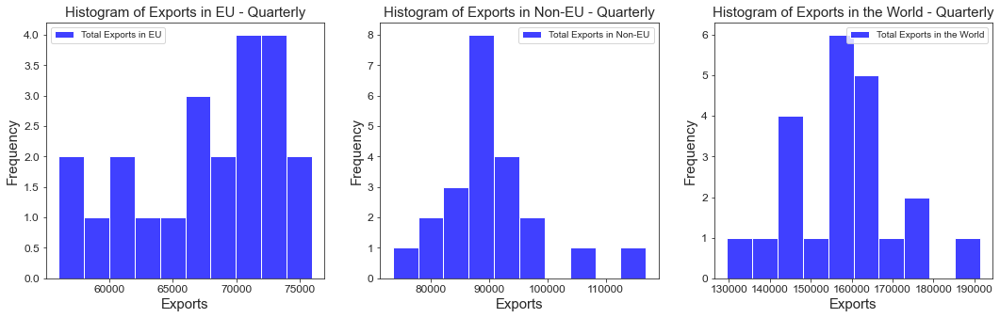

In [28]:
# Plot histogram of exports in EU, Non-EU and World from 1999 - 2021

fig, axes = plt.subplots(1,3, figsize=(18, 5))


sns.histplot(ax=axes[0],data=TTQ.iloc[29,1:-2], bins=10, color = "blue")
sns.set_style("ticks")
axes[0].set_title('Histogram of Exports in EU - Quarterly', fontsize = 15)
axes[0].set_xlabel('Exports', size= 15)
axes[0].set_ylabel('Frequency', size= 15)
axes[0].legend(labels=["Total Exports in EU"],fontsize = 'medium')
axes[0].xaxis.set_tick_params(labelsize=12)
axes[0].yaxis.set_tick_params(labelsize=12)


sns.histplot(ax=axes[1],data=TTQ.iloc[240,1:-2], bins=10, color = "blue")
axes[1].set_title('Histogram of Exports in Non-EU - Quarterly', fontsize = 15)
axes[1].set_xlabel('Exports', size= 15)
axes[1].set_ylabel('Frequency', size= 15)
axes[1].legend(labels=["Total Exports in Non-EU"],fontsize = 'medium')
axes[1].xaxis.set_tick_params(labelsize=12)
axes[1].yaxis.set_tick_params(labelsize=12)


sns.histplot(ax=axes[2],data=TTQ.iloc[241,1:-2], bins=10, color = "blue")
axes[2].set_title('Histogram of Exports in the World - Quarterly', fontsize = 15)
axes[2].set_xlabel('Exports', size= 15)
axes[2].set_ylabel('Frequency', size= 15)
axes[2].legend(labels=["Total Exports in the World"],fontsize = 'medium')
axes[2].xaxis.set_tick_params(labelsize=12)
axes[2].yaxis.set_tick_params(labelsize=12);


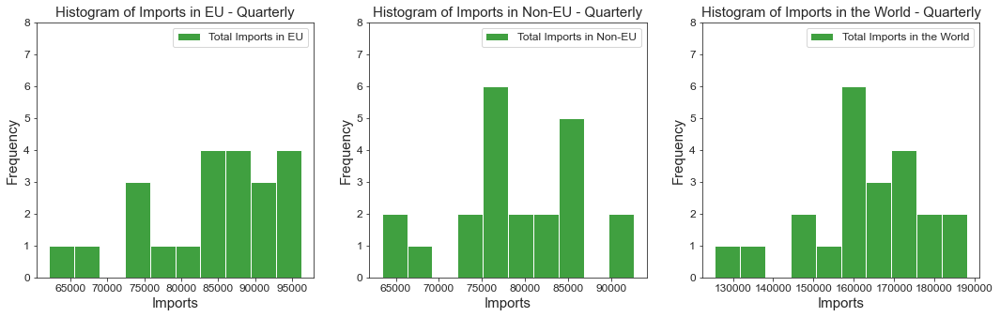

In [29]:
# Plot histogram of imports in EU, Non-EU and World from 1999 - 2021

fig, axes = plt.subplots(1,3, figsize=(18, 5))


sns.histplot(ax=axes[0],data=TTQ.iloc[273,1:-2], bins=10, color = "green")
sns.set_style("ticks")
axes[0].set_title('Histogram of Imports in EU - Quarterly', fontsize = 15)
axes[0].set_xlabel('Imports', size= 15)
axes[0].set_ylabel('Frequency', size= 15)
axes[0].legend(labels=["Total Imports in EU"],fontsize = 'large')
axes[0].xaxis.set_tick_params(labelsize=12)
axes[0].yaxis.set_tick_params(labelsize=12)
axes[0].set_ylim(0, 8)


sns.histplot(ax=axes[1],data=TTQ.iloc[484,1:-2], bins=10, color = "green")
axes[1].set_title('Histogram of Imports in Non-EU - Quarterly', fontsize = 15)
axes[1].set_xlabel('Imports', size= 15)
axes[1].set_ylabel('Frequency', size= 15)
axes[1].legend(labels=["Total Imports in Non-EU"],fontsize = 'large')
axes[1].xaxis.set_tick_params(labelsize=12)
axes[1].yaxis.set_tick_params(labelsize=12)
axes[1].set_ylim(0, 8)


sns.histplot(ax=axes[2],data=TTQ.iloc[485,1:-2], bins=10, color = "green")
axes[2].set_title('Histogram of Imports in the World - Quarterly', fontsize = 15)
axes[2].set_xlabel('Imports', size= 15)
axes[2].set_ylabel('Frequency', size= 15)
axes[2].legend(labels=["Total Imports in the World"],fontsize = 'large')
axes[2].xaxis.set_tick_params(labelsize=12)
axes[2].yaxis.set_tick_params(labelsize=12);
axes[2].set_ylim(0, 8);


7) Trade in Goods by Category (Annually, Quarterly AND Monthly) - (2018 - 2021)


In [30]:
# Upload Excel File with Exports in Goods Annually

import warnings
warnings.simplefilter("ignore")
file44 = pd.read_excel('Country by commodity exports.xlsx', skiprows=3, sheet_name = 3)
dfEGA = pd.DataFrame(file44)

dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Food & live animals") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Beverages & tobacco") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Crude materials") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Animal & vegetable oils & fats") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Fuels") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Oil") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Chemicals") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Material manufactures") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Machinery & transport equipment") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Mechanical machinery") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Electrical machinery") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Electrical machinery (intermediate)") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Road vehicles") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Other transport equipment") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Ships & aircraft") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Miscellaneous manufactures") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Other manufactures") == False]
dfEGA = dfEGA[dfEGA["COMMODITY"].str.contains("Unspecified goods") == False]
dfEGA = dfEGA.drop([28455,28495,28669,28692,28732,28906])



# Trade in Goods of Total EU28  - Exports 
exp_GA_EU = dfEGA[dfEGA['COUNTRY'] == 'B5 Total EU(28)']
exp_GA_EU = exp_GA_EU.drop(columns = "COUNTRY")
exp_GA_EU = exp_GA_EU.drop(columns = "DIRECTION")

for i in range(0,len(exp_GA_EU)): 
    if i <= len(exp_GA_EU):
        exp_GA_EU.iloc[i,0] = exp_GA_EU.iloc[i,0].split(None, 1)[1]
        i = i + 1
exp_GA_EU = exp_GA_EU.iloc[:-1,:]
exp_GA_EU['Mean'] = exp_GA_EU.iloc[:,1:5].mean(axis=1)




# Trade in Goods in Rest of the World - Exports 
exp_GA_RW = dfEGA[dfEGA['COUNTRY'] == 'D5 Extra EU 28 (Rest of World)']
exp_GA_RW = exp_GA_RW.drop(columns = "COUNTRY")
exp_GA_RW = exp_GA_RW.drop(columns = "DIRECTION")

for i in range(0,len(exp_GA_RW)):  
    if i <= len(exp_GA_RW):
        exp_GA_RW.iloc[i,0] = exp_GA_RW.iloc[i,0].split(None, 1)[1]
        i = i + 1
exp_GA_RW = exp_GA_RW.iloc[:-1,:]
exp_GA_RW['Mean'] = exp_GA_RW.iloc[:,1:5].mean(axis=1)





# Trade in Goods in the World  - Exports 
exp_GA_WW = dfEGA[dfEGA['COUNTRY'] == 'W1 Whole world']
exp_GA_WW = exp_GA_WW.drop(columns = "COUNTRY")
exp_GA_WW = exp_GA_WW.drop(columns = "DIRECTION")

for i in range(0,len(exp_GA_WW)):
    if i <= len(exp_GA_WW):
        exp_GA_WW.iloc[i,0] = exp_GA_WW.iloc[i,0].split(None, 1)[1]
        i = i + 1
exp_GA_WW = exp_GA_WW.iloc[:-1,:]
exp_GA_WW['Mean'] = exp_GA_WW.iloc[:,1:5].mean(axis=1)



#*********************************************************************


# Upload Excel File with Exports in Goods Quarterly

import warnings
warnings.simplefilter("ignore")
file45 = pd.read_excel('Country by commodity exports.xlsx', skiprows=3, sheet_name = 4)
dfEGQ = pd.DataFrame(file45)

dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Food & live animals") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Beverages & tobacco") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Crude materials") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Animal & vegetable oils & fats") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Fuels") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Oil") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Chemicals") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Material manufactures") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Machinery & transport equipment") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Mechanical machinery") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Electrical machinery") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Electrical machinery (intermediate)") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Road vehicles") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Other transport equipment") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Ships & aircraft") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Miscellaneous manufactures") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Other manufactures") == False]
dfEGQ = dfEGQ[dfEGQ["COMMODITY"].str.contains("Unspecified goods") == False]
dfEGQ = dfEGQ.drop([28455,28495,28669,28692,28732,28906])


# Trade in Goods of Total EU28  - Exports 
exp_GQ_EU = dfEGQ[dfEGQ['COUNTRY'] == 'B5 Total EU(28)']
exp_GQ_EU = exp_GQ_EU.drop(columns = "COUNTRY")
exp_GQ_EU = exp_GQ_EU.drop(columns = "DIRECTION")

for i in range(0,len(exp_GQ_EU)): 
    if i <= len(exp_GQ_EU):
        exp_GQ_EU.iloc[i,0] = exp_GQ_EU.iloc[i,0].split(None, 1)[1]
        i = i + 1
exp_GQ_EU = exp_GQ_EU.iloc[:-1,:]
exp_GQ_EU['Mean18'] = exp_GQ_EU.iloc[:,1:9].mean(axis=1)
exp_GQ_EU['Mean21'] = exp_GQ_EU.iloc[:,9:17].mean(axis=1)




# Trade in Goods in Rest of the World - Exports 
exp_GQ_RW = dfEGQ[dfEGQ['COUNTRY'] == 'D5 Extra EU 28 (Rest of World)']
exp_GQ_RW = exp_GQ_RW.drop(columns = "COUNTRY")
exp_GQ_RW = exp_GQ_RW.drop(columns = "DIRECTION")

for i in range(0,len(exp_GQ_RW)):  
    if i <= len(exp_GQ_RW):
        exp_GQ_RW.iloc[i,0] = exp_GQ_RW.iloc[i,0].split(None, 1)[1]
        i = i + 1
exp_GQ_RW = exp_GQ_RW.iloc[:-1,:]
exp_GQ_RW['Mean18'] = exp_GQ_RW.iloc[:,1:9].mean(axis=1)
exp_GQ_RW['Mean21'] = exp_GQ_RW.iloc[:,9:17].mean(axis=1)




# Trade in Goods in the World  - Exports 
exp_GQ_WW = dfEGQ[dfEGQ['COUNTRY'] == 'W1 Whole world']
exp_GQ_WW = exp_GQ_WW.drop(columns = "COUNTRY")
exp_GQ_WW = exp_GQ_WW.drop(columns = "DIRECTION")

for i in range(0,len(exp_GQ_WW)):
    if i <= len(exp_GQ_WW):
        exp_GQ_WW.iloc[i,0] = exp_GQ_WW.iloc[i,0].split(None, 1)[1]
        i = i + 1
exp_GQ_WW = exp_GQ_WW.iloc[:-1,:]
exp_GQ_WW['Mean18'] = exp_GQ_WW.iloc[:,1:9].mean(axis=1)
exp_GQ_WW['Mean21'] = exp_GQ_WW.iloc[:,9:17].mean(axis=1)




#*********************************************************************


# Upload Excel File with Exports in Goods Monthly

import warnings
warnings.simplefilter("ignore")
file46 = pd.read_excel('Country by commodity exports.xlsx', skiprows=3, sheet_name = 5)
dfEGM = pd.DataFrame(file46)



# Trade in Goods of Total EU28  - Exports 
exp_GM_EU = dfEGM[dfEGM['COUNTRY'] == 'B5 Total EU(28)']
exp_GM_EU = exp_GM_EU.drop(columns = "COUNTRY")
exp_GM_EU = exp_GM_EU.drop(columns = "DIRECTION")

for i in range(0,len(exp_GM_EU)): 
    if i <= len(exp_GM_EU):
        exp_GM_EU.iloc[i,0] = exp_GM_EU.iloc[i,0].split(None, 1)[1]
        i = i + 1
exp_GM_EU = exp_GM_EU.iloc[:-1,:]




# Trade in Goods in Rest of the World - Exports 
exp_GM_RW = dfEGM[dfEGM['COUNTRY'] == 'D5 Extra EU 28 (Rest of World)']
exp_GM_RW = exp_GM_RW.drop(columns = "COUNTRY")
exp_GM_RW = exp_GM_RW.drop(columns = "DIRECTION")

for i in range(0,len(exp_GM_RW)):  
    if i <= len(exp_GM_RW):
        exp_GM_RW.iloc[i,0] = exp_GM_RW.iloc[i,0].split(None, 1)[1]
        i = i + 1
exp_GM_RW = exp_GM_RW.iloc[:-1,:]





# Trade in Goods in the World  - Exports 
exp_GM_WW = dfEGM[dfEGM['COUNTRY'] == 'W1 Whole world']
exp_GM_WW = exp_GM_WW.drop(columns = "COUNTRY")
exp_GM_WW = exp_GM_WW.drop(columns = "DIRECTION")

for i in range(0,len(exp_GM_WW)):
    if i <= len(exp_GM_WW):
        exp_GM_WW.iloc[i,0] = exp_GM_WW.iloc[i,0].split(None, 1)[1]
        i = i + 1
exp_GM_WW = exp_GM_WW.iloc[:-1,:]


In [31]:
 
# Upload Excel File with Imports in Goods Annually

import warnings
warnings.simplefilter("ignore")
file47 = pd.read_excel('Country by commodity imports.xlsx', skiprows=3, sheet_name = 3)
dfIGA = pd.DataFrame(file47)

dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Food & live animals") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Beverages & tobacco") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Crude materials") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Animal & vegetable oils & fats") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Fuels") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Oil") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Chemicals") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Material manufactures") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Machinery & transport equipment") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Mechanical machinery") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Electrical machinery") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Electrical machinery (intermediate)") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Road vehicles") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Other transport equipment") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Ships & aircraft") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Miscellaneous manufactures") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Other manufactures") == False]
dfIGA = dfIGA[dfIGA["COMMODITY"].str.contains("Unspecified goods") == False]
dfIGA = dfIGA.drop([28455,28495,28669,28692,28732,28906])


# Trade in Goods of Total EU28  - Imports 
imp_GA_EU = dfIGA[dfIGA['COUNTRY'] == 'B5 Total EU(28)']
imp_GA_EU = imp_GA_EU.drop(columns = "COUNTRY")
imp_GA_EU = imp_GA_EU.drop(columns = "DIRECTION")

for i in range(0,len(imp_GA_EU)): 
    if i <= len(imp_GA_EU):
        imp_GA_EU.iloc[i,0] = imp_GA_EU.iloc[i,0].split(None, 1)[1]
        i = i + 1
imp_GA_EU = imp_GA_EU.iloc[:-1,:]
imp_GA_EU['Mean'] = imp_GA_EU.iloc[:,1:5].mean(axis=1)


# Trade in Goods in Rest of the World - Imports 
imp_GA_RW = dfIGA[dfIGA['COUNTRY'] == 'D5 Extra EU 28 (Rest of World)']
imp_GA_RW = imp_GA_RW.drop(columns = "COUNTRY")
imp_GA_RW = imp_GA_RW.drop(columns = "DIRECTION")

for i in range(0,len(imp_GA_RW)):  
    if i <= len(imp_GA_RW):
        imp_GA_RW.iloc[i,0] = imp_GA_RW.iloc[i,0].split(None, 1)[1]
        i = i + 1
imp_GA_RW = imp_GA_RW.iloc[:-1,:]
imp_GA_RW['Mean'] = imp_GA_RW.iloc[:,1:5].mean(axis=1)





# Trade in Goods in the World  - Imports 
imp_GA_WW = dfIGA[dfIGA['COUNTRY'] == 'W1 Whole world']
imp_GA_WW = imp_GA_WW.drop(columns = "COUNTRY")
imp_GA_WW = imp_GA_WW.drop(columns = "DIRECTION")

for i in range(0,len(imp_GA_WW)):
    if i <= len(imp_GA_WW):
        imp_GA_WW.iloc[i,0] = imp_GA_WW.iloc[i,0].split(None, 1)[1]
        i = i + 1
imp_GA_WW = imp_GA_WW.iloc[:-1,:]
imp_GA_WW['Mean'] = imp_GA_WW.iloc[:,1:5].mean(axis=1)



#*********************************************************************



# Upload Excel File with Imports in Goods Quarterly

import warnings
warnings.simplefilter("ignore")
file48 = pd.read_excel('Country by commodity imports.xlsx', skiprows=3, sheet_name = 4)
dfIGQ = pd.DataFrame(file48)

dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Food & live animals") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Beverages & tobacco") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Crude materials") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Animal & vegetable oils & fats") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Fuels") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Oil") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Chemicals") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Material manufactures") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Machinery & transport equipment") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Mechanical machinery") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Electrical machinery") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Electrical machinery (intermediate)") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Road vehicles") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Other transport equipment") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Ships & aircraft") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Miscellaneous manufactures") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Other manufactures") == False]
dfIGQ = dfIGQ[dfIGQ["COMMODITY"].str.contains("Unspecified goods") == False]
dfIGQ = dfIGQ.drop([28455,28495,28669,28692,28732,28906])


# Trade in Goods of Total EU28  - Imports 
imp_GQ_EU = dfIGQ[dfIGQ['COUNTRY'] == 'B5 Total EU(28)']
imp_GQ_EU = imp_GQ_EU.drop(columns = "COUNTRY")
imp_GQ_EU = imp_GQ_EU.drop(columns = "DIRECTION")

for i in range(0,len(imp_GQ_EU)): 
    if i <= len(imp_GQ_EU):
        imp_GQ_EU.iloc[i,0] = imp_GQ_EU.iloc[i,0].split(None, 1)[1]
        i = i + 1
imp_GQ_EU = imp_GQ_EU.iloc[:-1,:]
imp_GQ_EU['Mean18'] = imp_GQ_EU.iloc[:,1:9].mean(axis=1)
imp_GQ_EU['Mean21'] = imp_GQ_EU.iloc[:,9:17].mean(axis=1)




# Trade in Goods in Rest of the World - Imports 
imp_GQ_RW = dfIGQ[dfIGQ['COUNTRY'] == 'D5 Extra EU 28 (Rest of World)']
imp_GQ_RW = imp_GQ_RW.drop(columns = "COUNTRY")
imp_GQ_RW = imp_GQ_RW.drop(columns = "DIRECTION")

for i in range(0,len(imp_GQ_RW)):  
    if i <= len(imp_GQ_RW):
        imp_GQ_RW.iloc[i,0] = imp_GQ_RW.iloc[i,0].split(None, 1)[1]
        i = i + 1
imp_GQ_RW = imp_GQ_RW.iloc[:-1,:]
imp_GQ_RW['Mean18'] = imp_GQ_RW.iloc[:,1:9].mean(axis=1)
imp_GQ_RW['Mean21'] = imp_GQ_RW.iloc[:,9:17].mean(axis=1)





# Trade in Goods in the World  - Imports 
imp_GQ_WW = dfIGQ[dfIGQ['COUNTRY'] == 'W1 Whole world']
imp_GQ_WW = imp_GQ_WW.drop(columns = "COUNTRY")
imp_GQ_WW = imp_GQ_WW.drop(columns = "DIRECTION")

for i in range(0,len(exp_GQ_WW)):
    if i <= len(imp_GQ_WW):
        imp_GQ_WW.iloc[i,0] = imp_GQ_WW.iloc[i,0].split(None, 1)[1]
        i = i + 1
imp_GQ_WW = imp_GQ_WW.iloc[:-1,:]
imp_GQ_WW['Mean18'] = imp_GQ_WW.iloc[:,1:9].mean(axis=1)
imp_GQ_WW['Mean21'] = imp_GQ_WW.iloc[:,9:17].mean(axis=1)




#*********************************************************************

# Upload Excel File with Imports in Goods Monthly

import warnings
warnings.simplefilter("ignore")
file49 = pd.read_excel('Country by commodity imports.xlsx', skiprows=3, sheet_name = 5)
dfIGM = pd.DataFrame(file49)



# Trade in Goods of Total EU28  - Imports 
imp_GM_EU = dfIGM[dfIGM['COUNTRY'] == 'B5 Total EU(28)']
imp_GM_EU = imp_GM_EU.drop(columns = "COUNTRY")
imp_GM_EU = imp_GM_EU.drop(columns = "DIRECTION")

for i in range(0,len(imp_GM_EU)): 
    if i <= len(imp_GM_EU):
        imp_GM_EU.iloc[i,0] = imp_GM_EU.iloc[i,0].split(None, 1)[1]
        i = i + 1
imp_GM_EU = imp_GM_EU.iloc[:-1,:]




# Trade in Goods in Rest of the World - Imports 
imp_GM_RW = dfIGM[dfIGM['COUNTRY'] == 'D5 Extra EU 28 (Rest of World)']
imp_GM_RW = imp_GM_RW.drop(columns = "COUNTRY")
imp_GM_RW = imp_GM_RW.drop(columns = "DIRECTION")

for i in range(0,len(imp_GM_RW)):  
    if i <= len(imp_GM_RW):
        imp_GM_RW.iloc[i,0] = imp_GM_RW.iloc[i,0].split(None, 1)[1]
        i = i + 1
imp_GM_RW = imp_GM_RW.iloc[:-1,:]





# Trade in Goods in the World  - Imports 
imp_GM_WW = dfIGM[dfIGM['COUNTRY'] == 'W1 Whole world']
imp_GM_WW = imp_GM_WW.drop(columns = "COUNTRY")
imp_GM_WW = imp_GM_WW.drop(columns = "DIRECTION")

for i in range(0,len(imp_GM_WW)):
    if i <= len(imp_GM_WW):
        imp_GM_WW.iloc[i,0] = imp_GM_WW.iloc[i,0].split(None, 1)[1]
        i = i + 1
imp_GM_WW = imp_GM_WW.iloc[:-1,:]

8) Trade in Services by Category (Annually & Quarterly) - (2016 - 2021)


In [32]:
# Upload Excel File with Trade in Services by Category Annually and Quarterly 2016 - 2021

file8 = pd.read_excel('servicetypebycountry2022q1.xlsx', skiprows=2, sheet_name = 2)
S = pd.DataFrame(file8)

S = S[S['Service type code'].isin(['1','2','3','4','5','6','7','8','9','10'])]


# Trade in Services of TotaEU28 Countries - Exports 
exp_SEU = S[S['Country'] == 'Total EU28']
exp_SEU = exp_SEU[exp_SEU['Direction'] == 'Exports']
exp_SEU = exp_SEU.drop(columns = "Direction")
exp_SEU = exp_SEU.drop(columns = "Service type code")
exp_SEU = exp_SEU.drop(columns = "Country code")
exp_SEU = exp_SEU.drop(columns = "Country")
exp_SEU = exp_SEU[exp_SEU["Service type"].str.contains("Total Services") == False]
exp_SEU['Mean18'] = exp_SEU.iloc[:,1:5].mean(axis=1)
exp_SEU['Mean21'] = exp_SEU.iloc[:,[23,24,25,26,27,28,29,30]].mean(axis=1)

# Trade in Services in the World - Exports 
exp_SRW = S[S['Country'] == 'Rest of World']
exp_SRW = exp_SRW[exp_SRW['Direction'] == 'Exports']
exp_SRW = exp_SRW.drop(columns = "Direction")
exp_SRW = exp_SRW.drop(columns = "Service type code")
exp_SRW = exp_SRW.drop(columns = "Country code")
exp_SRW = exp_SRW.drop(columns = "Country")
exp_SRW = exp_SRW[exp_SRW["Service type"].str.contains("Total Services") == False]
exp_SRW['Mean18'] = exp_SRW.iloc[:,1:5].mean(axis=1)
exp_SRW['Mean21'] = exp_SRW.iloc[:,[23,24,25,26,27,28,29,30]].mean(axis=1)


# Trade in Services in the World - Exports 
exp_SWW = S[S['Country'] == 'World total']
exp_SWW = exp_SWW[exp_SWW['Direction'] == 'Exports']
exp_SWW = exp_SWW.drop(columns = "Direction")
exp_SWW = exp_SWW.drop(columns = "Service type code")
exp_SWW = exp_SWW.drop(columns = "Country code")
exp_SWW = exp_SWW.drop(columns = "Country")
exp_SWW = exp_SWW[exp_SWW["Service type"].str.contains("Total Services") == False]
exp_SWW['Mean18'] = exp_SWW.iloc[:,1:5].mean(axis=1)
exp_SWW['Mean21'] = exp_SWW.iloc[:,[23,24,25,26,27,28,29,30]].mean(axis=1)

# Create Mean column of all the years
exp_SWW['Mean'] = exp_SWW.iloc[:,1:7].mean(axis=1)


#****************************************


# Trade in Services of TotaEU28 Countries - Imports 
imp_SEU = S[S['Country'] == 'Total EU28']
imp_SEU = imp_SEU[imp_SEU['Direction'] == 'Imports']
imp_SEU = imp_SEU.drop(columns = "Direction")
imp_SEU = imp_SEU.drop(columns = "Service type code")
imp_SEU = imp_SEU.drop(columns = "Country code")
imp_SEU = imp_SEU.drop(columns = "Country")
imp_SEU = imp_SEU[imp_SEU["Service type"].str.contains("Total Services") == False]
imp_SEU['Mean18'] = imp_SEU.iloc[:,1:5].mean(axis=1)
imp_SEU['Mean21'] = imp_SEU.iloc[:,[23,24,25,26,27,28,29,30]].mean(axis=1)

# Trade in Services in the World - Imports 
imp_SRW = S[S['Country'] == 'Rest of World']
imp_SRW = imp_SRW[imp_SRW['Direction'] == 'Imports']
imp_SRW = imp_SRW.drop(columns = "Direction")
imp_SRW = imp_SRW.drop(columns = "Service type code")
imp_SRW = imp_SRW.drop(columns = "Country code")
imp_SRW = imp_SRW.drop(columns = "Country")
imp_SRW = imp_SRW[imp_SRW["Service type"].str.contains("Total Services") == False]
imp_SRW['Mean18'] = imp_SRW.iloc[:,1:5].mean(axis=1)
imp_SRW['Mean21'] = imp_SRW.iloc[:,[23,24,25,26,27,28,29,30]].mean(axis=1)


# Trade in Services in the World - Imports 
imp_SWW = S[S['Country'] == 'World total']
imp_SWW = imp_SWW[imp_SWW['Direction'] == 'Imports']
imp_SWW = imp_SWW.drop(columns = "Direction")
imp_SWW = imp_SWW.drop(columns = "Service type code")
imp_SWW = imp_SWW.drop(columns = "Country code")
imp_SWW = imp_SWW.drop(columns = "Country")
imp_SWW = imp_SWW[imp_SWW["Service type"].str.contains("Total Services") == False]
imp_SWW['Mean18'] = imp_SWW.iloc[:,1:5].mean(axis=1)
imp_SWW['Mean21'] = imp_SWW.iloc[:,[23,24,25,26,27,28,29,30]].mean(axis=1)

# Create Mean column of all the yeas
imp_SWW['Mean'] = imp_SWW.iloc[:,1:7].mean(axis=1)


9) Total Services Annually, Quarterly and Monthly World Wide

In [33]:
# Upload Excel File with Imports in Services Annually, Quarterly and Monthly World Wide

import warnings
warnings.simplefilter("ignore")

file40 = pd.read_excel('mret.xlsx', skiprows=[i for i in range(1,59)])
dfImp = pd.DataFrame(file40)
dfImp

# Select the Trade in Services (Imports - World Wide)
IS1 = pd.DataFrame(dfImp['Title'])
IS2 = dfImp.loc[:,['Trade in Services (TS): WW: Imports: BOP: CP: SA' in i for i in dfImp.columns]]


# Create a dataframe with all the Imports
new40 = IS1.join(IS2)
new40 = new40.rename(columns = {'Title' : "Year", })
new40 = new40.rename(columns = {'Trade in Services (TS): WW: Imports: BOP: CP: SA' : "Total Imports in the World"})


# Annually
IS_WW_A = new40.iloc[0:25,:]

IS_WW_A_pred = new40.iloc[0:25,:]

IS_WW_A['Year'] = pd.to_datetime(IS_WW_A['Year'])



# Quarterly
IS_WW_Q = new40.iloc[233:334,:]

for i in range(0,len(IS_WW_Q)): 
    if i <= len(IS_WW_Q):
        IS_WW_Q.iloc[i,0] = IS_WW_Q.iloc[i,0].replace(' ', '')
        i = i + 1

IS_WW_Q = IS_WW_Q.iloc[:-1,:]

IS_WW_Q_pred = IS_WW_Q.iloc[:-1,:]

IS_WW_Q['Year'] = pd.to_datetime(IS_WW_Q['Year'])




# Montlhy
IS_WW_M = new40.iloc[742:1047,:]

IS_WW_M_pred = IS_WW_Q.iloc[:-1,:]

IS_WW_M['Year'] = pd.to_datetime(IS_WW_M['Year'])



#************************************************


# Upload Excel File with Exports in Services Annually, Quarterly and Monthly World Wide

import warnings
warnings.simplefilter("ignore")

file41 = pd.read_excel('mret.xlsx', skiprows=[i for i in range(1,59)])
dfExp = pd.DataFrame(file41)
dfExp

# Select the Trade in Services (Imports - World Wide)
ES1 = pd.DataFrame(dfExp['Title'])
ES2 = dfExp.loc[:,['Trade in Services (TS): WW: Exports: BOP: CP: SA' in i for i in dfExp.columns]]


# Create a dataframe with all the Imports
new41 = ES1.join(ES2)
new41 = new41.rename(columns = {'Title' : "Year", })
new41 = new41.rename(columns = {'Trade in Services (TS): WW: Exports: BOP: CP: SA' : "Total Exports in the World"})

# Annually
ES_WW_A = new41.iloc[0:25,:]

ES_WW_A_pred = new41.iloc[0:25,:]

ES_WW_A['Year'] = pd.to_datetime(ES_WW_A['Year'])


# Quarterly
ES_WW_Q = new41.iloc[233:334,:]

for i in range(0,len(ES_WW_Q)): 
    if i <= len(ES_WW_Q):
        ES_WW_Q.iloc[i,0] = ES_WW_Q.iloc[i,0].replace(' ', '')
        i = i + 1
ES_WW_Q = ES_WW_Q.iloc[:-1,:]

ES_WW_Q_pred = ES_WW_Q.iloc[:-1,:]

ES_WW_Q['Year'] = pd.to_datetime(ES_WW_Q['Year'])


# Montlhy
ES_WW_M = new41.iloc[742:1047,:]

ES_WW_M_pred = new41.iloc[742:1047,:]

ES_WW_M['Year'] = pd.to_datetime(ES_WW_M['Year'])


10) Trade in Goods Monthly (EU - Non EU - World Wide)

In [34]:
# Upload Excel File with Exports in Goods Annually, Quarterly and Monthly Word Wide

import warnings
import re
warnings.simplefilter("ignore")
file42 = pd.read_excel('allcountriesmay2022final.xlsx', skiprows=3, sheet_name = 7)


# Create a DataFrame, change N/A to zero's
TEG_M = pd.DataFrame(file42)
TEG_M = TEG_M.fillna(0)
TEG_M = TEG_M.drop(columns="Country Code")


# Clean Column names of Imports
TEG_M.columns
clean_names_TEG_M = []

for i in range(0,len(TEG_M.columns)):
    if i <= len(TEG_M.columns):
        x = re.sub('(\d+(\.\d+)?)', r' \1 ',TEG_M.columns[i]).strip()
        i = i + 1
        
        clean_names_TEG_M.append(x)
clean_names_TEG_M
TEG_M.columns = clean_names_TEG_M




# Exports in all Countries 
expGM = TEG_M.iloc[0:235,0:]
expGM = expGM[expGM['Country Name'].str.contains('Total EU27')== False]
expGM


# Exports in EU27 Countries
expGM_EU = TEG_M.iloc[0:27,0:]
expGM_EU


# Exports in the rest of the world
expGM_Rest = TEG_M.iloc[28:235,0:]
expGM_Rest


# Total Exports in EU27
expGM_TEU = TEG_M.iloc[27,1:]
expGM_TEU = pd.DataFrame(expGM_TEU)
expGM_TEU = expGM_TEU.rename(columns = {27: "Total Exports of EU27"})
expGM_TEU = expGM_TEU.reset_index()
expGM_TEU = expGM_TEU.rename(columns = {'index' : "Year"})

expGM_TEU_pred = expGM_TEU.rename(columns = {'index' : "Year"})

expGM_TEU['Year'] = pd.to_datetime(expGM_TEU['Year'])



# Total Exports in the rest of the world
expGM_TRest = TEG_M.iloc[235,1:]
expGM_TRest = pd.DataFrame(expGM_TRest)
expGM_TRest = expGM_TRest.rename(columns = {235: "Total Exports in the rest of the World"})
expGM_TRest = expGM_TRest.reset_index()
expGM_TRest = expGM_TRest.rename(columns = {'index' : "Year"})

expGM_TRest_pred = expGM_TRest.rename(columns = {'index' : "Year"})

expGM_TRest['Year'] = pd.to_datetime(expGM_TRest['Year'])


# Total Exports in the World 
expGM_World = TEG_M.iloc[236,1:]
expGM_World = pd.DataFrame(expGM_World)
expGM_World = expGM_World.rename(columns = {236: "Total Exports in the World"})
expGM_World = expGM_World.reset_index()
expGM_World = expGM_World.rename(columns = {'index' : "Year"})

expGM_World_pred = expGM_World.rename(columns = {'index' : "Year"})

expGM_World['Year'] = pd.to_datetime(expGM_World['Year'])


#*************************************************



# Upload Excel File with Imports in Goods Annually, Quarterly and Monthly Word Wide

import warnings
warnings.simplefilter("ignore")
file43 = pd.read_excel('allcountriesmay2022final.xlsx', skiprows=3, sheet_name = 8)


# Create a DataFrame, change N/A to zero's
TIG_M = pd.DataFrame(file43)
TIG_M = TIG_M.fillna(0)
TIG_M = TIG_M.drop(columns="Country Code")


# Clean Column names of Imports
TIG_M.columns
clean_names_TIG_M = []

for i in range(0,len(TIG_M.columns)):
    if i <= len(TIG_M.columns):
        x = re.sub('(\d+(\.\d+)?)', r' \1 ',TIG_M.columns[i]).strip()
        i = i + 1
        
        clean_names_TIG_M.append(x)
clean_names_TIG_M
TIG_M.columns = clean_names_TIG_M




# Imports in all Countries 
impGM = TIG_M.iloc[0:235,0:]
impGM = impGM[impGM['Country Name'].str.contains('Total EU27')== False]
impGM


# Imports in EU27 Countries
impGM_EU = TIG_M.iloc[0:27,0:]
impGM_EU


# Imports in the rest of the world
impGM_Rest = TIG_M.iloc[28:235,0:]
impGM_Rest


# Total Imports in EU27
impGM_TEU = TIG_M.iloc[27,1:]
impGM_TEU = pd.DataFrame(impGM_TEU)
impGM_TEU = impGM_TEU.rename(columns = {27: "Total Imports of EU27"})
impGM_TEU = impGM_TEU.reset_index()
impGM_TEU = impGM_TEU.rename(columns = {'index' : "Year"})

impGM_TEU_pred = impGM_TEU.rename(columns = {'index' : "Year"})

impGM_TEU['Year'] = pd.to_datetime(impGM_TEU['Year'])


# Total Imports in the rest of the world
impGM_TRest = TIG_M.iloc[235,1:]
impGM_TRest = pd.DataFrame(impGM_TRest)
impGM_TRest = impGM_TRest.rename(columns = {235: "Total Imports in the rest of the World"})
impGM_TRest = impGM_TRest.reset_index()
impGM_TRest = impGM_TRest.rename(columns = {'index' : "Year"})

impGM_TRest_pred = impGM_TRest.rename(columns = {'index' : "Year"})

impGM_TRest['Year'] = pd.to_datetime(impGM_TRest['Year'])


# Total Imports in the World 
impGM_World = TIG_M.iloc[236,1:]
impGM_World = pd.DataFrame(impGM_World)
impGM_World = impGM_World.rename(columns = {236: "Total Imports in the World"})
impGM_World = impGM_World.reset_index()
impGM_World = impGM_World.rename(columns = {'index' : "Year"})

impGM_World_pred = impGM_World.rename(columns = {'index' : "Year"})

impGM_World['Year'] = pd.to_datetime(impGM_World['Year'])


In [35]:
# Use describe() to create a column with the mean of each year 



# Exports in Goods of all Countries
expGA.describe()
# Imports in Goods  of all Countries
impGA.describe()


# Exports in Services of all Countries
expSA.describe()
# Imports in Services  of all Countries
impSA.describe()


# Total Exports of all Countries
expTTA.describe()
# Total Imports of all Countries
impTTA.describe()




# Use describe() to create a column with the mean of each year 
# Exports in Goods
Mean_expGA = expGA.describe().iloc[1,0:23]
Mean_expGA = Mean_expGA.reset_index(level=0)
Mean_expGA.rename(columns = {'index':'Year'}, inplace = True)
Mean_expGA = pd.DataFrame(Mean_expGA)

# Use describe() to create a column with the mean of each year 
# Exports in Goods
Mean_impGA = impGA.describe().iloc[1,0:23]
Mean_impGA = Mean_impGA.reset_index(level=0)
Mean_impGA.rename(columns = {'index':'Year'}, inplace = True)
Mean_impGA = pd.DataFrame(Mean_impGA)


# Use describe() to create a column with the mean of each year
# Exports in Services
Mean_expSA = expSA.describe().iloc[1,0:23]
Mean_expSA = Mean_expSA.reset_index(level=0)
Mean_expSA.rename(columns = {'index':'Year'}, inplace = True)
Mean_expSA = pd.DataFrame(Mean_expSA)


# Use describe() to create a column with the mean of each year
# Exports in Services
Mean_impSA = impSA.describe().iloc[1,0:23]
Mean_impSA = Mean_impSA.reset_index(level=0)
Mean_impSA.rename(columns = {'index':'Year'}, inplace = True)
Mean_impSA = pd.DataFrame(Mean_impSA)


# Use describe() to create a column with the mean of each year
# Exports in Total (Goods and Services)
Mean_expTTA = expTTA.describe().iloc[1,0:23]
Mean_expTTA = Mean_expTTA.reset_index(level=0)
Mean_expTTA.rename(columns = {'index':'Year'}, inplace = True)
Mean_expTTA = pd.DataFrame(Mean_expTTA)


# Use describe() to create a column with the mean of each year
# Exports in Total (Goods and Services)
Mean_impTTA = impTTA.describe().iloc[1,0:23]
Mean_impTTA = Mean_impTTA.reset_index(level=0)
Mean_impTTA.rename(columns = {'index':'Year'}, inplace = True)
Mean_impTTA = pd.DataFrame(Mean_impTTA)


11) General Analysis

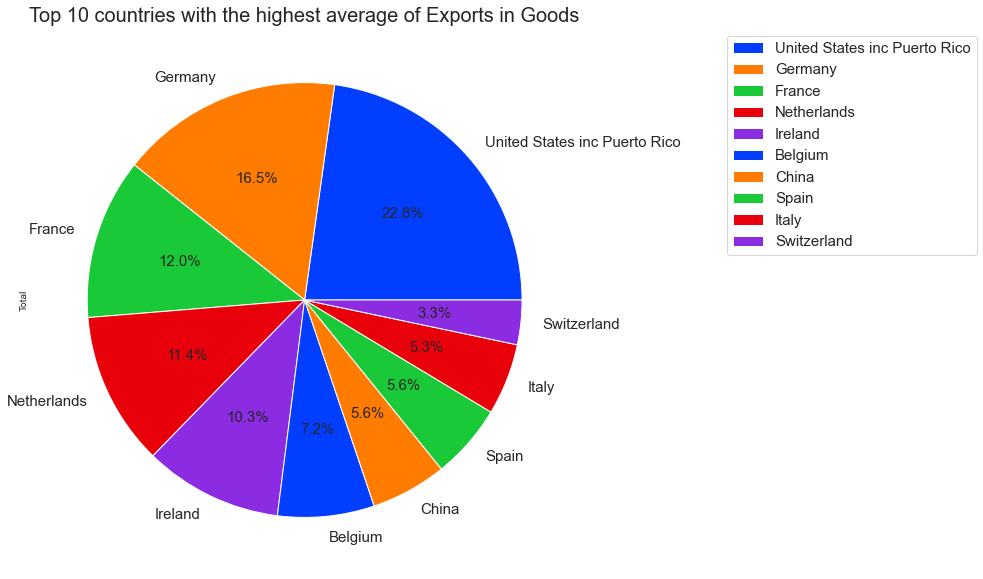

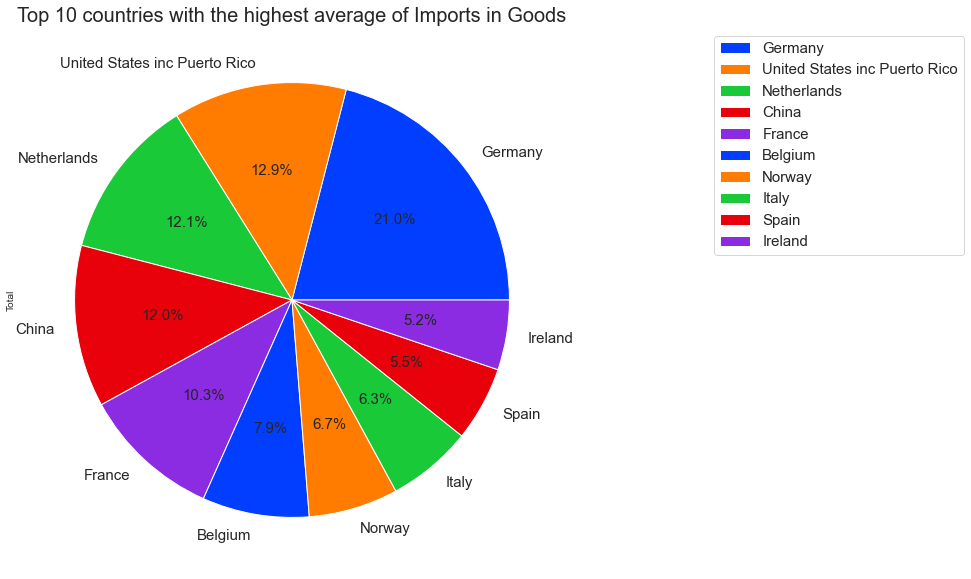

In [36]:
# Plot a pie Chart for ten higher countries that Exports Goods
Top10_expGA = expGA.sort_values(by='Total', ascending=False).head(10)
Top10_expGA = Top10_expGA.iloc[:,[0,25]]
Top10_expGA = Top10_expGA.set_index('Country')
colors = sns.color_palette('bright')[0:5]

def func(pct):
  return "{:1.1f}%".format(pct)

plot = Top10_expGA.plot.pie(y='Total', x = 'Country',figsize=(12, 10), autopct=lambda pct: func(pct),colors = colors,fontsize=15)
plt.legend(title = "Countries:",loc='upper right',fontsize=8)
plt.legend(bbox_to_anchor =(1.75, 1), ncol = 1,fontsize=15)
plt.title('Top 10 countries with the highest average of Exports in Goods',fontsize =20)


# Plot a pie Chart for ten higher countries that Imports Goods
Top10_impGA = impGA.sort_values(by='Total', ascending=False).head(10)
Top10_impGA = Top10_impGA.iloc[:,[0,25]]
Top10_impGA = Top10_impGA.set_index('Country')
colors = sns.color_palette('bright')[0:5]

def func(pct):
  return "{:1.1f}%".format(pct)

plot = Top10_impGA.plot.pie(y='Total', x = 'Country',figsize=(12, 10),autopct=lambda pct: func(pct),colors = colors,fontsize=15)
plt.legend(title = "Countries:",loc='upper right',fontsize=8)
plt.legend(bbox_to_anchor =(1.75, 1), ncol = 1,fontsize=15)
plt.title('Top 10 countries with the highest average of Imports in Goods',fontsize =20);




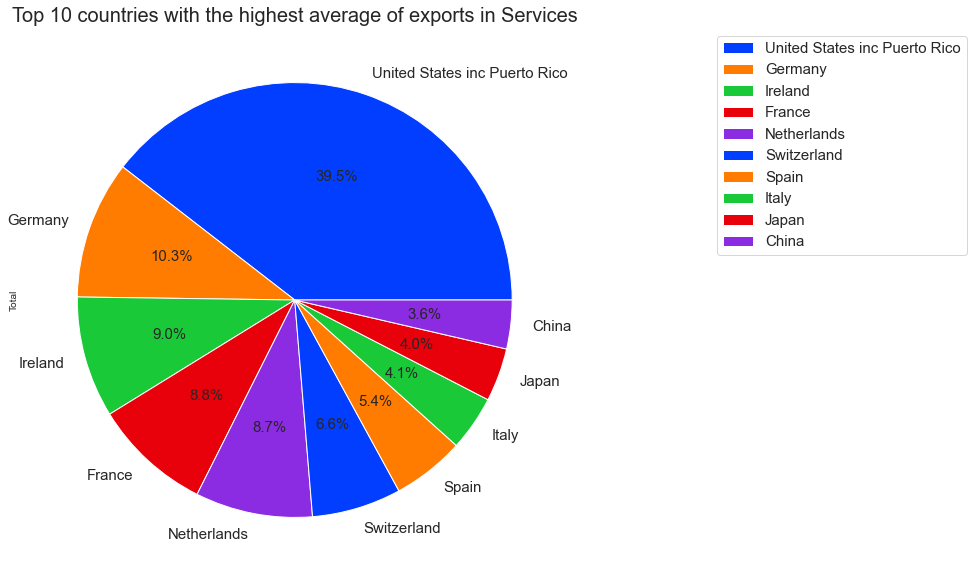

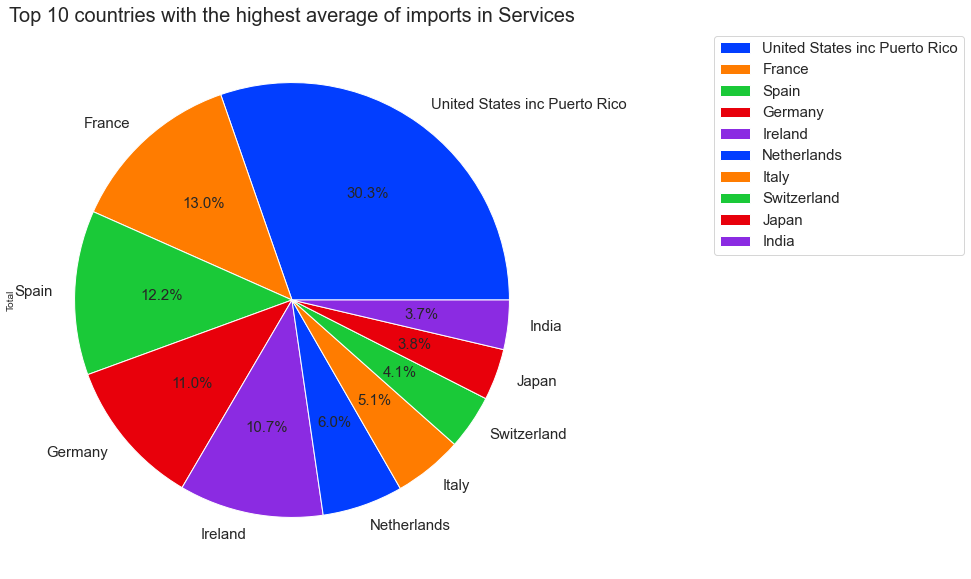

In [37]:
# Plot a pie Chart for ten higher countries that Exports Services
Top10_expSA = expSA.sort_values(by='Total', ascending=False).head(10)
Top10_expSA = Top10_expSA.iloc[:,[0,25]]
Top10_expSA = Top10_expSA.set_index('Country')
colors = sns.color_palette('bright')[0:5]

def func(pct):
  return "{:1.1f}%".format(pct)

plot = Top10_expSA.plot.pie(y='Total', x = 'Country',figsize=(12, 10), autopct=lambda pct: func(pct),colors = colors, fontsize=15)
plt.legend(title = "Countries:",loc='upper right',fontsize=8)
plt.legend(bbox_to_anchor =(1.75, 1), ncol = 1, fontsize=15)
plt.title('Top 10 countries with the highest average of exports in Services',fontsize =20)


# Plot a pie Chart for ten higher countries that Imports Goods
Top10_impSA = impSA.sort_values(by='Total', ascending=False).head(10)
Top10_impSA = Top10_impSA.iloc[:,[0,25]]
Top10_impSA = Top10_impSA.set_index('Country')
colors = sns.color_palette('bright')[0:5]

def func(pct):
  return "{:1.1f}%".format(pct)

plot = Top10_impSA.plot.pie(y='Total', x = 'Country',figsize=(12, 10),autopct=lambda pct: func(pct),colors = colors,fontsize=15)
plt.legend(title = "Countries:",loc='upper right',fontsize=8)
plt.legend(bbox_to_anchor =(1.75, 1), ncol = 1,fontsize=15)
plt.title('Top 10 countries with the highest average of imports in Services',fontsize =20);


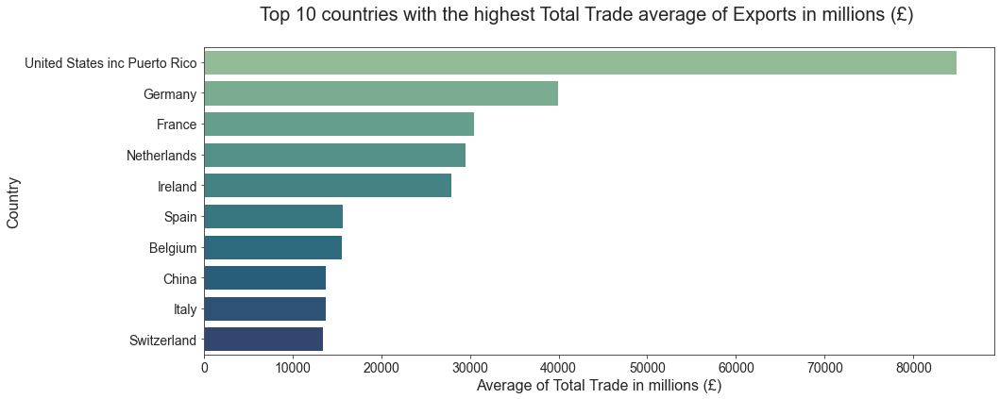

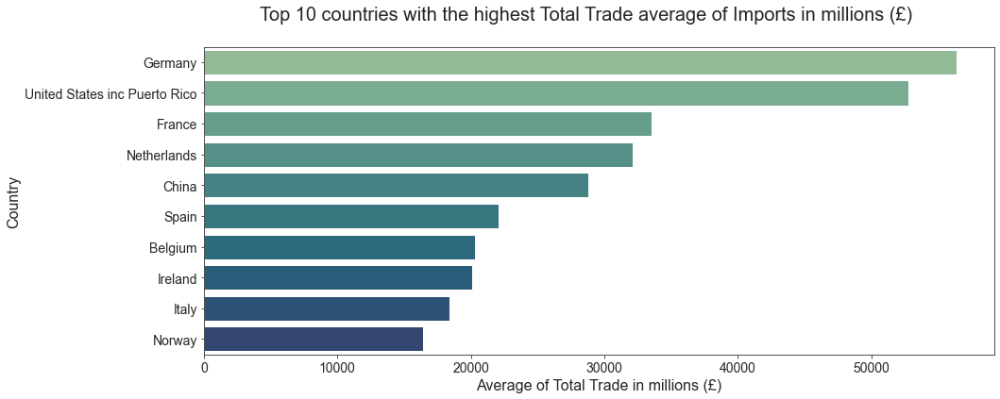

In [38]:
# Plot the mean of (Goods and Services) in Total Trade

fig, axes = plt.subplots(figsize=(15, 6))
fig.suptitle('Top 10 countries with the highest Total Trade average of Exports in millions (£)', fontsize = 20)


sns.barplot(y = 'Country', x = 'Mean', data = expTTA.sort_values(by='Mean', ascending=False).head(10),
           palette = "crest")
plt.xticks(rotation = 0, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Average of Total Trade in millions (£)",fontsize = 16)
plt.ylabel("Country",fontsize = 16);




fig, axes = plt.subplots(figsize=(15, 6))
fig.suptitle('Top 10 countries with the highest Total Trade average of Imports in millions (£)', fontsize = 20)


sns.barplot(y = 'Country', x = 'Mean', data = impTTA.sort_values(by='Mean', ascending=False).head(10),
           palette = "crest")

plt.xticks(rotation = 0, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Average of Total Trade in millions (£)",fontsize = 16)
plt.ylabel("Country",fontsize = 16);


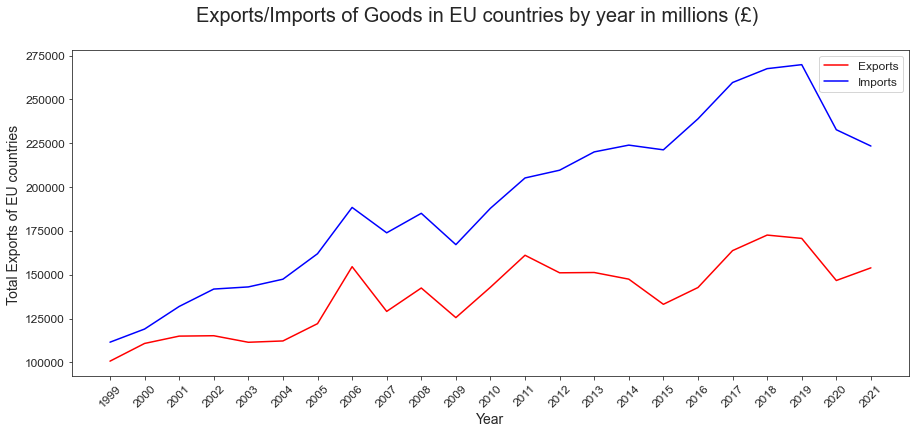

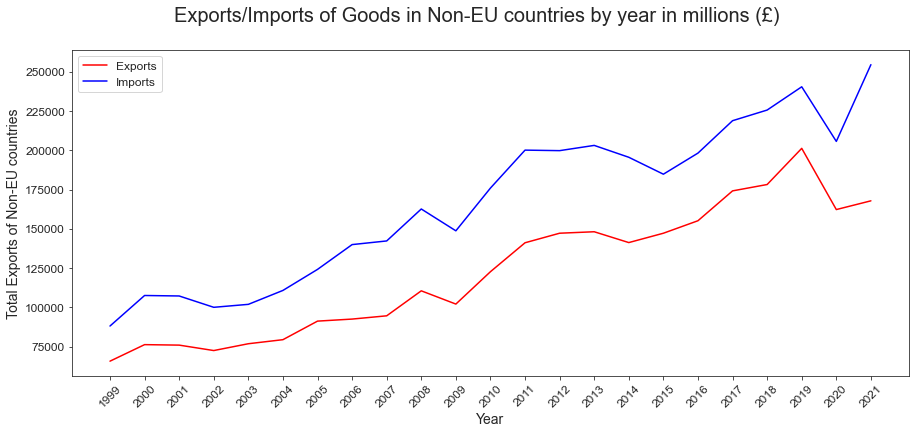

In [39]:
# Plot the Exports/Imports of Goods in EU and Non-EU countries by year

fig, axes = plt.subplots(figsize=(15, 6))
fig.suptitle('Exports/Imports of Goods in EU countries by year in millions (£)', fontsize = 20)


sns.lineplot(x = 'Year', y = 'Total Exports of EU27' ,data = expGA_TEU,color = 'red')
sns.lineplot(x = 'Year', y = 'Total Imports of EU27' ,data = impGA_TEU,color = 'blue')

plt.xticks(rotation = 45, fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel("Year",fontsize = 14)
plt.ylabel("Total Exports of EU countries ",fontsize = 14);
plt.legend(labels=["Exports","Imports"],fontsize = 'large');




fig, axes = plt.subplots(figsize=(15, 6))
fig.suptitle('Exports/Imports of Goods in Non-EU countries by year in millions (£)', fontsize = 20)

sns.lineplot(x = 'Year', y = 'Total Exports in the rest of the World' ,data = expGA_TRest, color = 'red')
sns.lineplot(x = 'Year', y = 'Total Imports in the rest of the World' ,data = impGA_TRest,color = 'blue')

plt.xticks(rotation = 45, fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel("Year",fontsize = 14)
plt.ylabel("Total Exports of Non-EU countries",fontsize = 14);
plt.legend(labels=["Exports","Imports"],fontsize = 'large');

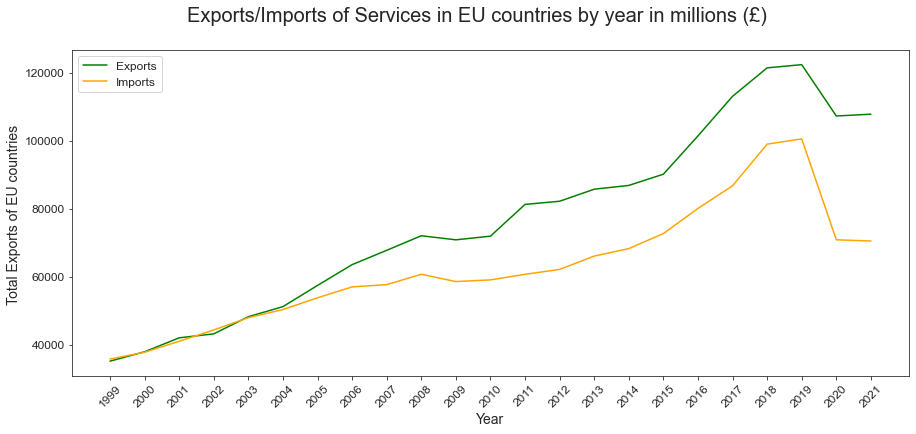

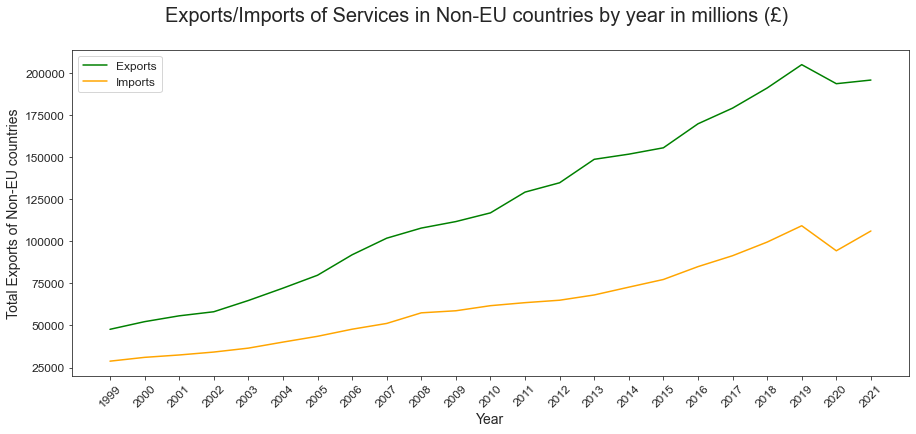

In [40]:
# Plot the Exports/Imports of Services in EU and Non-EU countries by year

fig, axes = plt.subplots(figsize=(15, 6))
fig.suptitle('Exports/Imports of Services in EU countries by year in millions (£)', fontsize = 20)


sns.lineplot(x = 'Year', y = 'Total Exports of EU27' ,data = expSA_TEU,color = 'green')
sns.lineplot(x = 'Year', y = 'Total Imports of EU27' ,data = impSA_TEU,color = 'orange')

plt.xticks(rotation = 45, fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel("Year",fontsize = 14)
plt.ylabel("Total Exports of EU countries ",fontsize = 14);
plt.legend(labels=["Exports","Imports"],fontsize = 'large');




fig, axes = plt.subplots(figsize=(15, 6))
fig.suptitle('Exports/Imports of Services in Non-EU countries by year in millions (£)', fontsize = 20)

sns.lineplot(x = 'Year', y = 'Total Exports in the rest of the World' ,data = expSA_TRest, color = 'green')
sns.lineplot(x = 'Year', y = 'Total Imports in the rest of the World' ,data = impSA_TRest,color = 'orange')

plt.xticks(rotation = 45, fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel("Year",fontsize = 14)
plt.ylabel("Total Exports of Non-EU countries",fontsize = 14);
plt.legend(labels=["Exports","Imports"],fontsize = 'large');

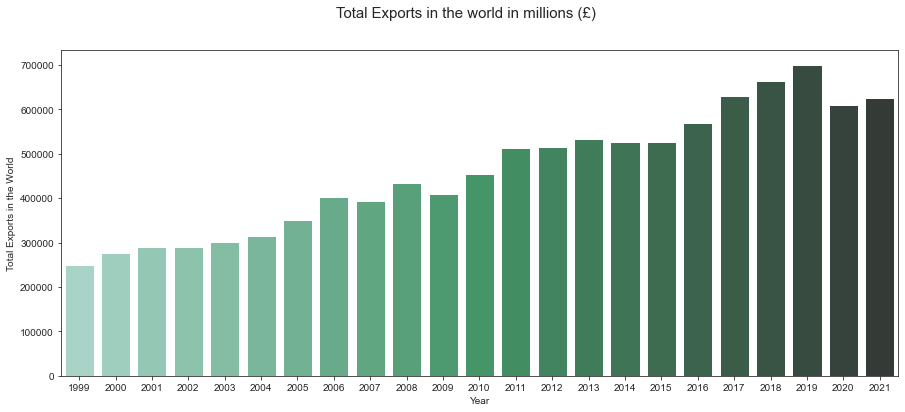

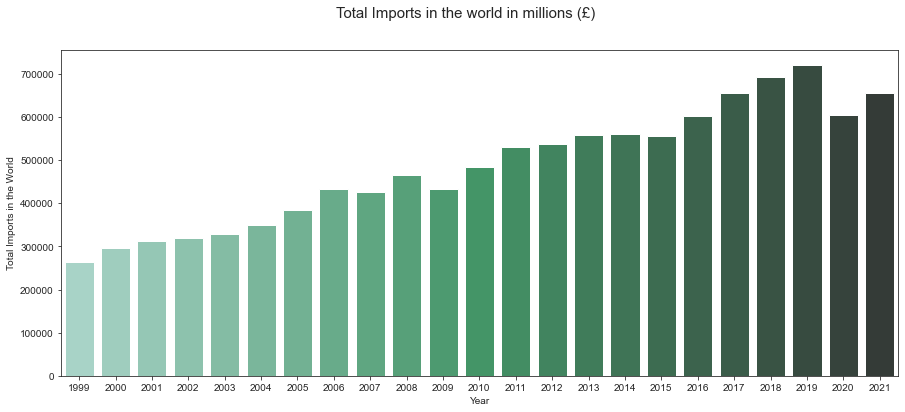

In [41]:
# Plot the Total Trade (Goods and Services) of Exports/Imports in the world

fig, axes = plt.subplots(figsize=(15, 6))
fig.suptitle('Total Exports in the world in millions (£)', fontsize = 15)
sns.barplot(x = 'Year', y = 'Total Exports in the World' ,data = expTTA_World, palette = 'BuGn_d')



fig, axes = plt.subplots(figsize=(15, 6))
fig.suptitle('Total Imports in the world in millions (£)', fontsize = 15)
sns.barplot(x = 'Year', y = 'Total Imports in the World' ,data = impTTA_World,  palette = 'BuGn_d');


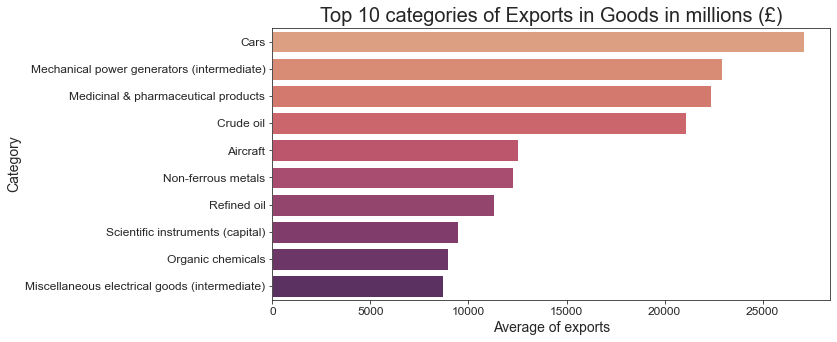

In [42]:
# Plot the average of exports in Goods WorldWide
sns.barplot(y = 'COMMODITY', x = 'Mean', data = exp_GA_WW.sort_values(by='Mean', ascending=False).head(10),
           palette = "flare",ci=None)
plt.title('Top 10 categories of Exports in Goods in millions (£)', fontsize = 20)
sns.set(rc={"figure.figsize":(15, 6)})

plt.xticks(rotation = 0, fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel("Average of exports",fontsize = 14)
plt.ylabel("Category",fontsize = 14);


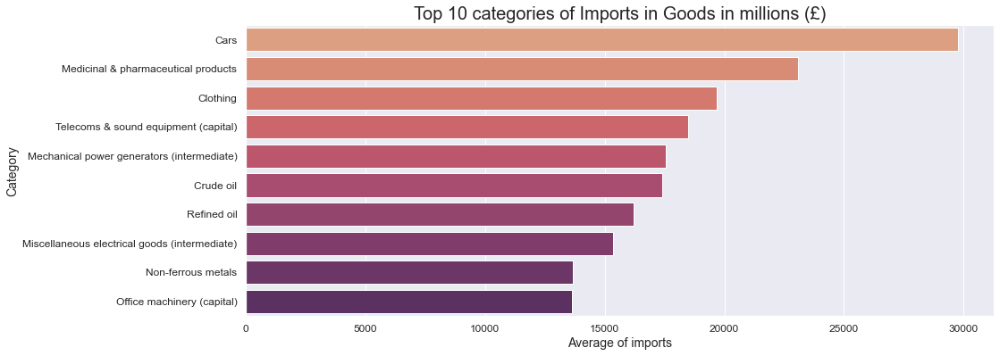

In [43]:
# Plot the average of imports in Goods WorldWide
sns.barplot(y = 'COMMODITY', x = 'Mean', data = imp_GA_WW.sort_values(by='Mean', ascending=False).head(10),
           palette = "flare",ci=None)
plt.title('Top 10 categories of Imports in Goods in millions (£)', fontsize = 20)
sns.set(rc={"figure.figsize":(15, 6)})


plt.xticks(rotation = 0, fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel("Average of imports",fontsize = 14)
plt.ylabel("Category",fontsize = 14);

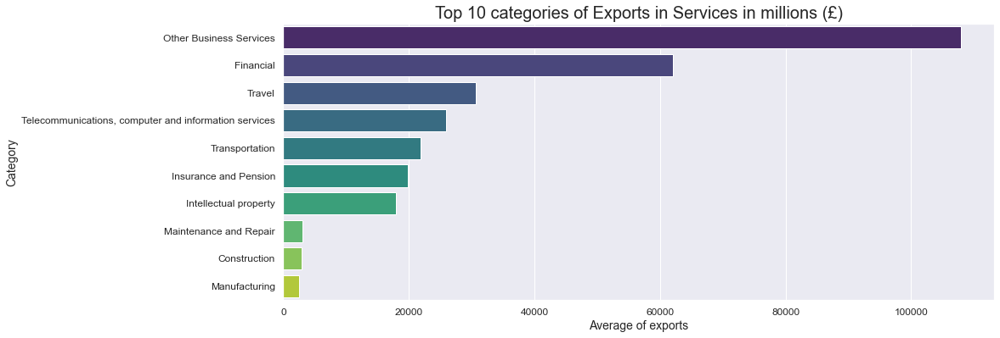

In [44]:
# Plot the average of exports in Services WorldWide
sns.barplot(y = 'Service type', x = 'Mean', data = exp_SWW.sort_values(by='Mean', ascending=False).head(10),
           palette = "viridis")
plt.title('Top 10 categories of Exports in Services in millions (£)', fontsize = 20)
sns.set(rc={"figure.figsize":(15, 6)})

plt.xticks(rotation = 0, fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel("Average of exports",fontsize = 14)
plt.ylabel("Category",fontsize = 14);

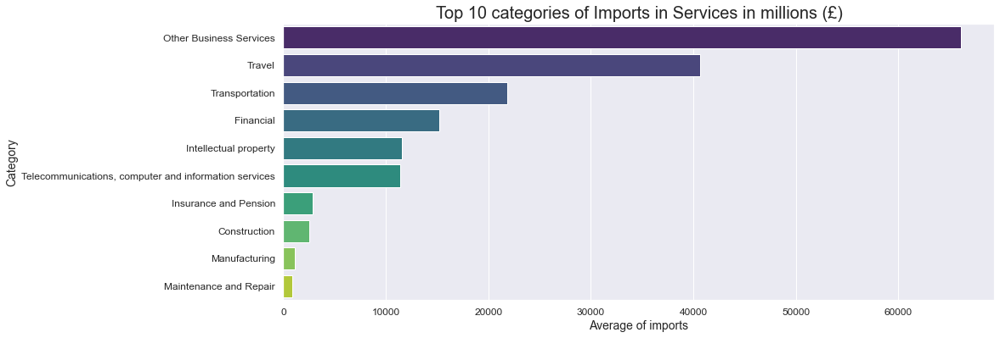

In [45]:
# Plot the average of Imports in Services WorldWide
sns.barplot(y = 'Service type', x = 'Mean', data = imp_SWW.sort_values(by='Mean', ascending=False).head(10),
           palette = "viridis")
plt.title('Top 10 categories of Imports in Services in millions (£)', fontsize = 20)
sns.set(rc={"figure.figsize":(15, 6)})


plt.xticks(rotation = 0, fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel("Average of imports",fontsize = 14)
plt.ylabel("Category",fontsize = 14);

12) Data Analysis of the period before Brexit (2009 - 2015) - Before the referendum (2016)

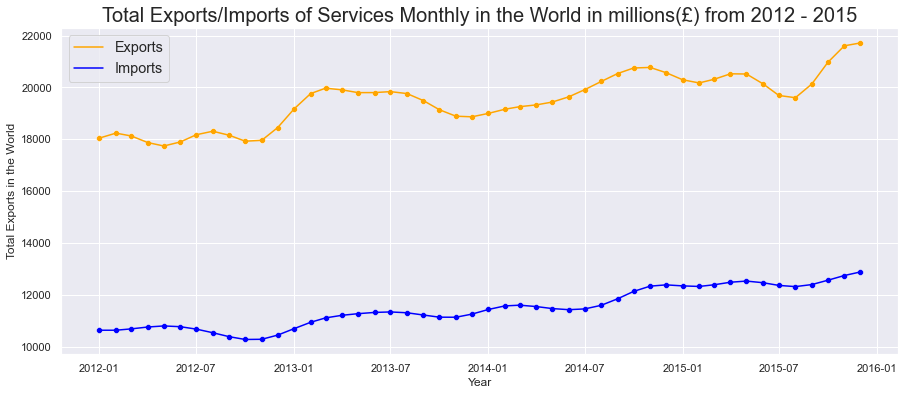

In [46]:
# Plot the monthly Exports/Imports of Services in the World (2012 - 2015)

fig, axes = plt.subplots(1, 1, figsize=(15, 6))


sns.lineplot(x = 'Year', y = 'Total Exports in the World' ,data = ES_WW_M.iloc[180:228,:], color = 'orange')
sns.scatterplot(x = 'Year', y = 'Total Exports in the World' ,data = ES_WW_M.iloc[180:228,:], color = 'orange')
sns.lineplot(x = 'Year', y = 'Total Imports in the World' ,data = IS_WW_M.iloc[180:228,:],color = 'blue')
sns.scatterplot(x = 'Year', y = 'Total Imports in the World' ,data = IS_WW_M.iloc[180:228,:],color = 'blue')
axes.set_title('Total Exports/Imports of Services Monthly in the World in millions(£) from 2012 - 2015', fontsize = 20)
axes.legend(labels=["Exports","Imports"],fontsize = 'large');


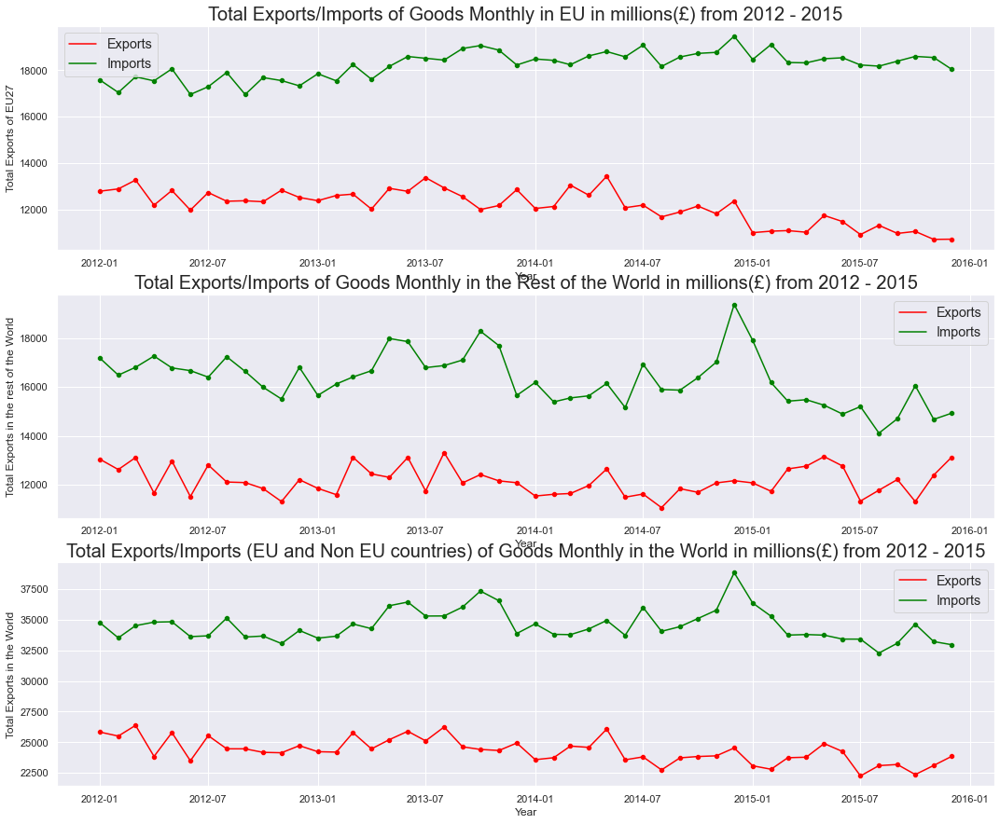

In [47]:
# Plot the monthly Exports/Imports of Goods in EU, non-EU and total countries from 2009 - 2015
fig, axes = plt.subplots(3, 1, figsize=(18, 15))


sns.lineplot(ax=axes[0],x = 'Year', y = 'Total Exports of EU27' ,data = expGM_TEU.iloc[180:228,:],color = 'red')
sns.scatterplot(ax=axes[0],x = 'Year', y = 'Total Exports of EU27' ,data = expGM_TEU.iloc[180:228,:],color = 'red')
sns.lineplot(ax=axes[0],x = 'Year', y = 'Total Imports of EU27' ,data = impGM_TEU.iloc[180:228,:],color = 'green')
sns.scatterplot(ax=axes[0],x = 'Year', y = 'Total Imports of EU27' ,data = impGM_TEU.iloc[180:228,:],color = 'green')
axes[0].set_title('Total Exports/Imports of Goods Monthly in EU in millions(£) from 2012 - 2015', fontsize = 20)
axes[0].legend(labels=["Exports","Imports"],fontsize = 'large')

sns.lineplot(ax=axes[1],x = 'Year', y = 'Total Exports in the rest of the World' ,data = expGM_TRest.iloc[180:228,:], color = 'red')
sns.scatterplot(ax=axes[1],x = 'Year', y = 'Total Exports in the rest of the World' ,data = expGM_TRest.iloc[180:228,:], color = 'red')
sns.lineplot(ax=axes[1],x = 'Year', y = 'Total Imports in the rest of the World' ,data = impGM_TRest.iloc[180:228,:],color = 'green')
sns.scatterplot(ax=axes[1],x = 'Year', y = 'Total Imports in the rest of the World' ,data = impGM_TRest.iloc[180:228,:],color = 'green')
axes[1].set_title('Total Exports/Imports of Goods Monthly in the Rest of the World in millions(£) from 2012 - 2015', fontsize = 20)
axes[1].legend(labels=["Exports","Imports"],fontsize = 'large')

sns.lineplot(ax=axes[2],x = 'Year', y = 'Total Exports in the World' ,data = expGM_World.iloc[180:228,:], color = 'red')
sns.scatterplot(ax=axes[2],x = 'Year', y = 'Total Exports in the World' ,data = expGM_World.iloc[180:228,:], color = 'red')
sns.lineplot(ax=axes[2],x = 'Year', y = 'Total Imports in the World' ,data = impGM_World.iloc[180:228,:],color = 'green')
sns.scatterplot(ax=axes[2],x = 'Year', y = 'Total Imports in the World' ,data = impGM_World.iloc[180:228,:],color = 'green')
axes[2].set_title('Total Exports/Imports (EU and Non EU countries) of Goods Monthly in the World in millions(£) from 2012 - 2015', fontsize = 20)
axes[2].legend(labels=["Exports","Imports"],fontsize = 'large');


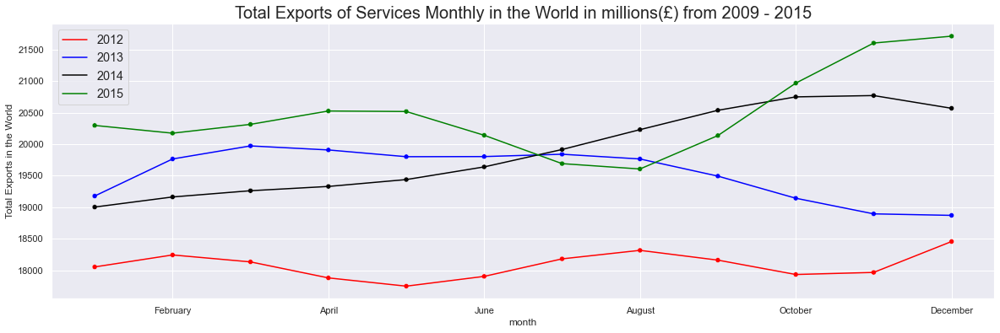

In [48]:
# Plot the monthly Exports of Services in the World (2011 - 2015)

data1 = ES_WW_M.iloc[180:228,:].copy()
data1["month"] = data1['Year'].map(lambda x: x.month)
data1["year"] = data1['Year'].map(lambda x: x.year)



fig, axes = plt.subplots(1, 1, figsize=(20, 6))

plot1 = sns.lineplot(x = 'month', y = 'Total Exports in the World', data = data1, hue = 'year', 
                     palette = ['red','blue','black','green'])
plot1 = sns.scatterplot(x = 'month', y = 'Total Exports in the World', data = data1, hue = 'year', 
                     palette = ['red','blue','black','green'])
plot1.set_xticklabels(['January','February','April','June','August','October','December'])

axes.set_title('Total Exports of Services Monthly in the World in millions(£) from 2009 - 2015', fontsize = 20)
axes.legend(labels=['2012','2013','2014','2015'],fontsize = 'large', loc='upper left');



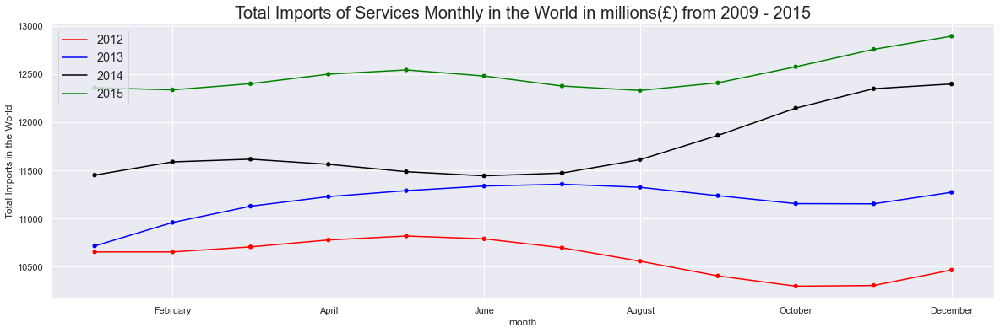

In [49]:
# Plot the monthly Imports of Services in the World (2011 - 2015)

data2 = IS_WW_M.iloc[180:228,:].copy()
data2["month"] = data1['Year'].map(lambda x: x.month)
data2["year"] = data1['Year'].map(lambda x: x.year)



fig, axes = plt.subplots(1, 1, figsize=(20, 6))

plot2 = sns.lineplot(x = 'month', y = 'Total Imports in the World', data = data2, hue = 'year', 
                     palette = ['red','blue','black','green'])
plot2 = sns.scatterplot(x = 'month', y = 'Total Imports in the World', data = data2, hue = 'year', 
                     palette = ['red','blue','black','green'])
plot2.set_xticklabels(['January','February','April','June','August','October','December'])

axes.set_title('Total Imports of Services Monthly in the World in millions(£) from 2009 - 2015', fontsize = 20)
axes.legend(labels=['2012','2013','2014','2015'],fontsize = 'large', loc='upper left');



13) Analysis of the period from the day that Brexit announced until it happened (2016 - 2020)

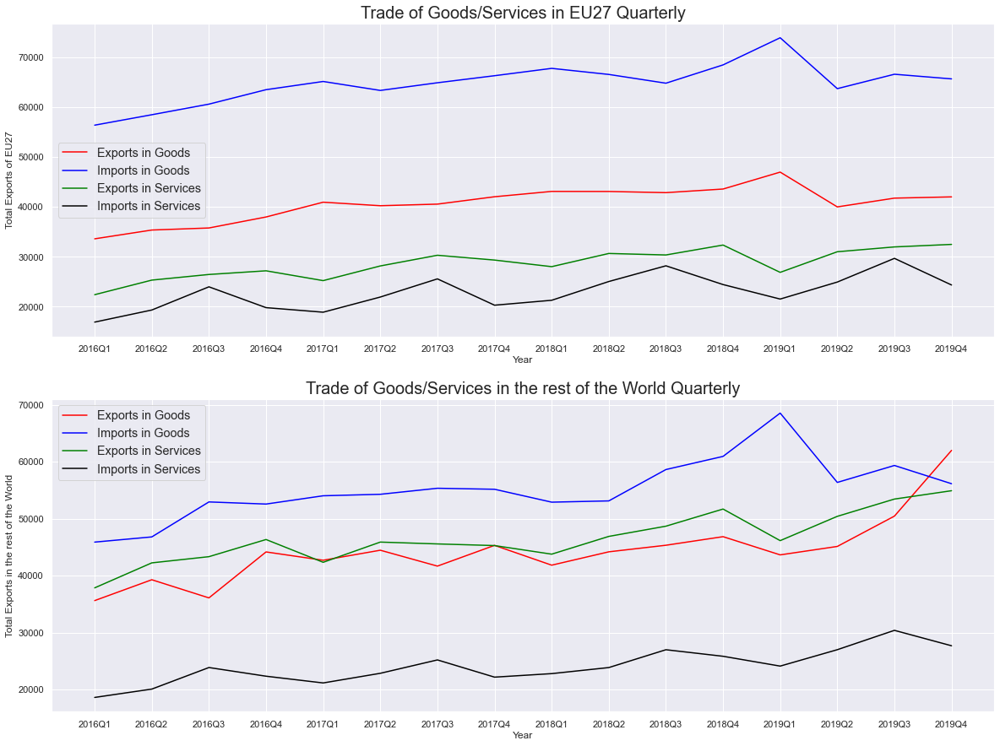

In [50]:
# Plot the Exports/Imports of Goods/Services in EU and Non-EU countries by year

fig, axes = plt.subplots(2, 1, figsize=(20, 15))

sns.lineplot(ax=axes[0],x = 'Year', y = 'Total Exports of EU27' ,data = expGQ_TEU[:16],color = 'red')
sns.lineplot(ax=axes[0],x = 'Year', y = 'Total Imports of EU27' ,data = impGQ_TEU[:16],color = 'blue')
sns.lineplot(ax=axes[0],x = 'Year', y = 'Total Exports of EU27' ,data = expSQ_TEU[:16],color = 'green')
sns.lineplot(ax=axes[0],x = 'Year', y = 'Total Imports of EU27' ,data = impSQ_TEU[:16],color = 'black')
axes[0].set_title('Trade of Goods/Services in EU27 Quarterly', fontsize = 20)
axes[0].legend(labels=["Exports in Goods","Imports in Goods","Exports in Services","Imports in Services"],fontsize = 'large')
sns.set_style("darkgrid")


sns.lineplot(ax=axes[1],x = 'Year', y = 'Total Exports in the rest of the World' ,data = expGQ_TRest[:16], color = 'red')
sns.lineplot(ax=axes[1],x = 'Year', y = 'Total Imports in the rest of the World' ,data = impGQ_TRest[:16],color = 'blue')
sns.lineplot(ax=axes[1],x = 'Year', y = 'Total Exports in the rest of the World' ,data = expSQ_TRest[:16],color = 'green')
sns.lineplot(ax=axes[1],x = 'Year', y = 'Total Imports in the rest of the World' ,data = impSQ_TRest[:16],color = 'black')
axes[1].set_title('Trade of Goods/Services in the rest of the World Quarterly', fontsize = 20)
axes[1].legend(labels=["Exports in Goods","Imports in Goods","Exports in Services","Imports in Services"],fontsize = 'large')
sns.set_style("darkgrid")


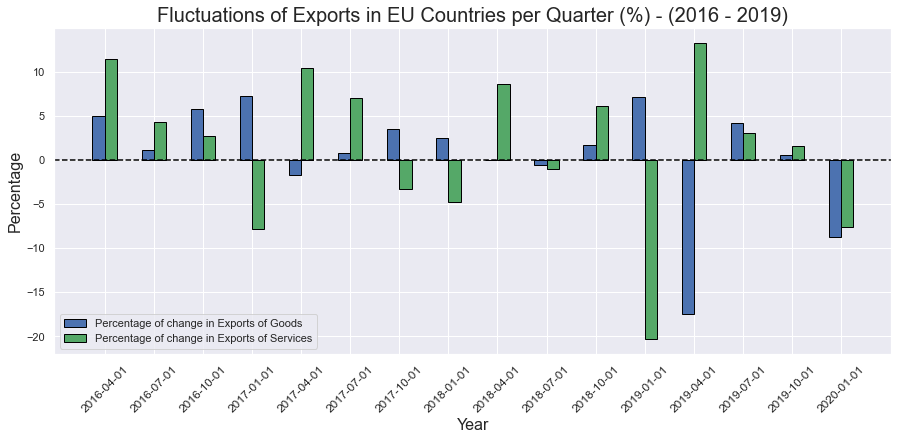

In [51]:
# Differencing and converting difference between Exports in percentage (EXPORTS IN GOODS IN EU27)



#EXPORTS IN GOODS
expGQ_TEU_2016 = expGQ_TEU.iloc[:-7].copy()
expGQ_TEU_2016['Year'] = pd.to_datetime(expGQ_TEU_2016['Year'])


expGQ_TEU_2016['Difference'] = expGQ_TEU_2016['Total Exports of EU27'] - expGQ_TEU_2016['Total Exports of EU27'].shift(1)
expGQ_TEU_2016 = expGQ_TEU_2016.dropna()



# Generate the Percentage that changed for each Quarter
count = range(0,len(expGQ_TEU_2016['Difference']))
list = []

for i in count:
    if i <= len(expGQ_TEU_2016['Difference']):
        percentage = (expGQ_TEU_2016.iloc[i,2] / expGQ_TEU_2016.iloc[i,1]) * 100
        percentage = ("%.2f" % percentage)
        list.append(percentage)

      
expGQ_TEU_2016['Percentage'] = list  
expGQ_TEU_2016 = expGQ_TEU_2016.drop(['Difference'], axis = 1)
expGQ_TEU_2016 = expGQ_TEU_2016.astype({'Percentage':'float'})
expGQ_TEU_2016 = expGQ_TEU_2016.astype({'Year':'str'})







#EXPORTS IN SERVICES

expSQ_TEU_2016 = expSQ_TEU.iloc[:-6].copy()
expSQ_TEU_2016['Year'] = pd.to_datetime(expSQ_TEU_2016['Year'])


expSQ_TEU_2016['Difference'] = expSQ_TEU_2016['Total Exports of EU27'] - expSQ_TEU_2016['Total Exports of EU27'].shift(1)
expSQ_TEU_2016 = expSQ_TEU_2016.dropna()



# Generate the Percentage that changed for each Quarter
count = range(0,len(expSQ_TEU_2016['Difference']))
list = []

for i in count:
    if i <= len(expSQ_TEU_2016['Difference']):
        percentage = (expSQ_TEU_2016.iloc[i,2] / expSQ_TEU_2016.iloc[i,1]) * 100
        percentage = ("%.2f" % percentage)
        list.append(percentage)

      
expSQ_TEU_2016['Percentage'] = list  
expSQ_TEU_2016 = expSQ_TEU_2016.drop(['Difference'], axis = 1)
expSQ_TEU_2016 = expSQ_TEU_2016.astype({'Percentage':'float'})
expSQ_TEU_2016 = expSQ_TEU_2016.astype({'Year':'str'})



# Plot the Percentages
import numpy as np
import matplotlib.pyplot as plt

fig = plt.subplots(figsize=(15,6))


n = len(expSQ_TEU_2016['Percentage'])
r = np.arange(n)
width = 0.25
  
  
plt.bar(r, expGQ_TEU_2016['Percentage'], color = 'b',
        width = width, edgecolor = 'black',
        label='Percentage of change in Exports of Goods')

plt.bar(r + width, expSQ_TEU_2016['Percentage'], color = 'g',
        width = width, edgecolor = 'black',
        label='Percentage of change in Exports of Services')
  
plt.xlabel("Year",fontsize = 16)
plt.ylabel("Percentage",fontsize = 16)
plt.title("Fluctuations of Exports in EU Countries per Quarter (%) - (2016 - 2019)",size = 20)
  
plt.axhline(0,linestyle='--', color = 'black')
plt.xticks(r + width/2,expSQ_TEU_2016['Year'].tolist(),rotation = 45,fontsize = 12)
plt.xticks(fontsize = 12)
plt.legend(loc = 'lower left')
  
plt.show()

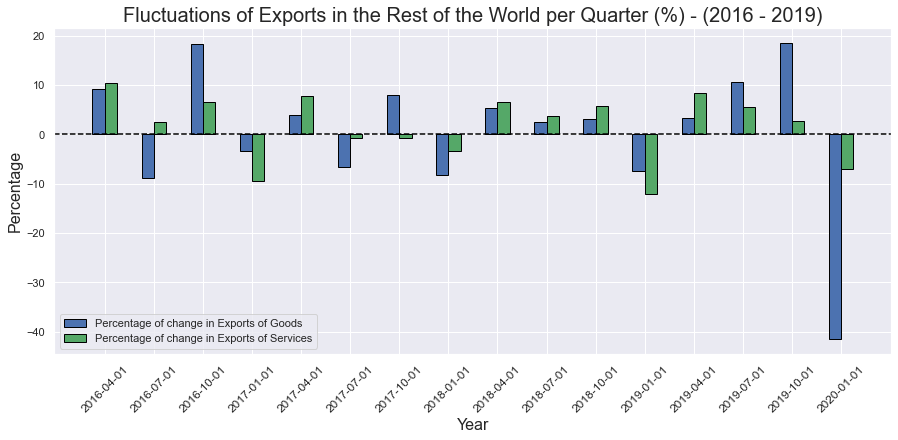

In [52]:
# Differencing and converting difference between Exports in percentage (EXPORTS IN GOODS IN THE REST OF THE WORLD)


# EXPORTS IN GOODS
expGQ_TRest_2016 = expGQ_TRest.iloc[:-7].copy()
expGQ_TRest_2016['Year'] = pd.to_datetime(expGQ_TRest_2016['Year'])


expGQ_TRest_2016['Difference'] = expGQ_TRest_2016['Total Exports in the rest of the World'] - expGQ_TRest_2016['Total Exports in the rest of the World'].shift(1)
expGQ_TRest_2016 = expGQ_TRest_2016.dropna()



# Generate the Percentage that changed for each Quarter
count = range(0,len(expGQ_TRest_2016['Difference']))
list = []

for i in count:
    if i <= len(expGQ_TRest_2016['Difference']):
        percentage = (expGQ_TRest_2016.iloc[i,2] / expGQ_TRest_2016.iloc[i,1]) * 100
        percentage = ("%.2f" % percentage)
        list.append(percentage)

      
expGQ_TRest_2016['Percentage'] = list  
expGQ_TRest_2016 = expGQ_TRest_2016.drop(['Difference'], axis = 1)
expGQ_TRest_2016 = expGQ_TRest_2016.astype({'Percentage':'float'})
expGQ_TRest_2016 = expGQ_TRest_2016.astype({'Year':'str'})






#EXPORTS IN SERVICES

expSQ_TRest_2016 = expSQ_TRest.iloc[:-6].copy()
expSQ_TRest_2016['Year'] = pd.to_datetime(expSQ_TRest_2016['Year'])


expSQ_TRest_2016['Difference'] = expSQ_TRest_2016['Total Exports in the rest of the World'] - expSQ_TRest_2016['Total Exports in the rest of the World'].shift(1)
expSQ_TRest_2016 = expSQ_TRest_2016.dropna()



# Generate the Percentage that changed for each Quarter
count = range(0,len(expSQ_TRest_2016['Difference']))
list = []

for i in count:
    if i <= len(expSQ_TRest_2016['Difference']):
        percentage = (expSQ_TRest_2016.iloc[i,2] / expSQ_TRest_2016.iloc[i,1]) * 100
        percentage = ("%.2f" % percentage)
        list.append(percentage)

      
expSQ_TRest_2016['Percentage'] = list  
expSQ_TRest_2016 = expSQ_TRest_2016.drop(['Difference'], axis = 1)
expSQ_TRest_2016 = expSQ_TRest_2016.astype({'Percentage':'float'})
expSQ_TRest_2016 = expSQ_TRest_2016.astype({'Year':'str'})




# Plot the Percentages

fig = plt.subplots(figsize=(15,6))

  
n = len(expGQ_TRest_2016['Percentage'])
r = np.arange(n)
width = 0.25
  
  
plt.bar(r, expGQ_TRest_2016['Percentage'], color = 'b',
        width = width, edgecolor = 'black',
        label='Percentage of change in Exports of Goods')

plt.bar(r + width, expSQ_TRest_2016['Percentage'], color = 'g',
        width = width, edgecolor = 'black',
        label='Percentage of change in Exports of Services')
  
plt.xlabel("Year",fontsize = 16)
plt.ylabel("Percentage",fontsize = 16)
plt.title("Fluctuations of Exports in the Rest of the World per Quarter (%) - (2016 - 2019)",size = 20)
  
plt.axhline(0,linestyle='--', color = 'black')
plt.xticks(r + width/2,expSQ_TEU_2016['Year'].tolist(),rotation = 45,fontsize = 12)
plt.xticks(fontsize = 12)
plt.legend(loc = 'lower left')
  
plt.show()

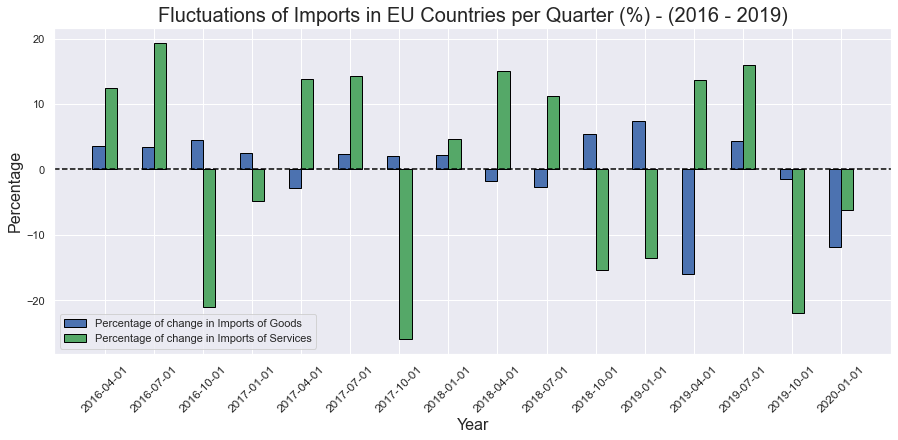

In [53]:
# Differencing and converting difference between Imports in percentage (IMPORTS IN GOODS IN EU27)


#IMPORTS IN GOODS
impGQ_TEU_2016 = impGQ_TEU.iloc[:-7].copy()
impGQ_TEU_2016['Year'] = pd.to_datetime(impGQ_TEU_2016['Year'])


impGQ_TEU_2016['Difference'] = impGQ_TEU_2016['Total Imports of EU27'] - impGQ_TEU_2016['Total Imports of EU27'].shift(1)
impGQ_TEU_2016 = impGQ_TEU_2016.dropna()



# Generate the Percentage that changed for each Quarter
count = range(0,len(impGQ_TEU_2016['Difference']))
list = []

for i in count:
    if i <= len(impGQ_TEU_2016['Difference']):
        percentage = (impGQ_TEU_2016.iloc[i,2] / impGQ_TEU_2016.iloc[i,1]) * 100
        percentage = ("%.2f" % percentage)
        list.append(percentage)

      
impGQ_TEU_2016['Percentage'] = list  
impGQ_TEU_2016 = impGQ_TEU_2016.drop(['Difference'], axis = 1)
impGQ_TEU_2016 = impGQ_TEU_2016.astype({'Percentage':'float'})
impGQ_TEU_2016 = impGQ_TEU_2016.astype({'Year':'str'})






#IMPORTS IN SERVICES

impSQ_TEU_2016 = impSQ_TEU.iloc[:-6].copy()
impSQ_TEU_2016['Year'] = pd.to_datetime(impSQ_TEU_2016['Year'])


impSQ_TEU_2016['Difference'] = impSQ_TEU_2016['Total Imports of EU27'] - impSQ_TEU_2016['Total Imports of EU27'].shift(1)
impSQ_TEU_2016 = impSQ_TEU_2016.dropna()



# Generate the Percentage that changed for each Quarter
count = range(0,len(impSQ_TEU_2016['Difference']))
list = []

for i in count:
    if i <= len(impSQ_TEU_2016['Difference']):
        percentage = (impSQ_TEU_2016.iloc[i,2] / impSQ_TEU_2016.iloc[i,1]) * 100
        percentage = ("%.2f" % percentage)
        list.append(percentage)

      
impSQ_TEU_2016['Percentage'] = list  
impSQ_TEU_2016 = impSQ_TEU_2016.drop(['Difference'], axis = 1)
impSQ_TEU_2016 = impSQ_TEU_2016.astype({'Percentage':'float'})
impSQ_TEU_2016 = impSQ_TEU_2016.astype({'Year':'str'})




# Plot the Percentages

fig = plt.subplots(figsize=(15,6))

  
n = len(impGQ_TEU_2016['Percentage'])
r = np.arange(n)
width = 0.25
  
  
plt.bar(r, impGQ_TEU_2016['Percentage'], color = 'b',
        width = width, edgecolor = 'black',
        label='Percentage of change in Imports of Goods')

plt.bar(r + width, impSQ_TEU_2016['Percentage'], color = 'g',
        width = width, edgecolor = 'black',
        label='Percentage of change in Imports of Services')
  
plt.xlabel("Year",fontsize = 16)
plt.ylabel("Percentage",fontsize = 16)
plt.title("Fluctuations of Imports in EU Countries per Quarter (%) - (2016 - 2019)",size = 20)
  
plt.axhline(0,linestyle='--', color = 'black')
plt.xticks(r + width/2,expSQ_TEU_2016['Year'].tolist(),rotation = 45,fontsize = 12)
plt.xticks(fontsize = 12)
plt.legend(loc = 'lower left')
  
plt.show()

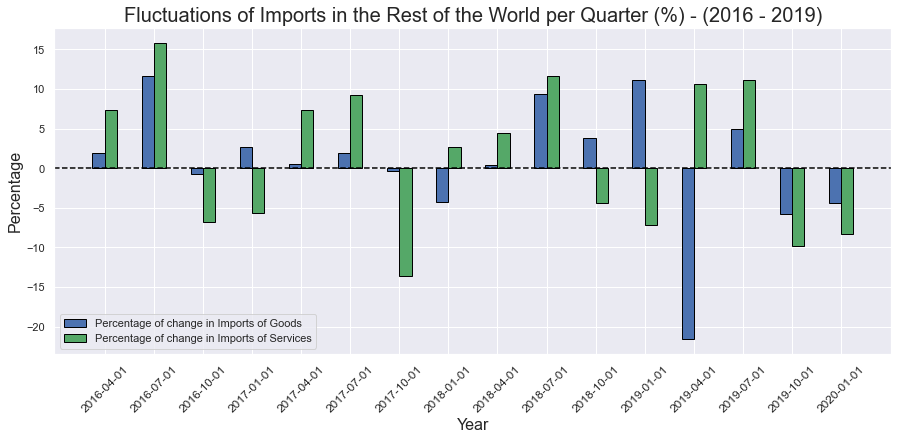

In [54]:
# Differencing and converting difference between Imports in percentage (IMPORTS IN GOODS IN EU27)


#IMPORTS IN GOODS
impGQ_TRest_2016 = impGQ_TRest.iloc[:-7].copy()
impGQ_TRest_2016['Year'] = pd.to_datetime(impGQ_TRest_2016['Year'])


impGQ_TRest_2016['Difference'] = impGQ_TRest_2016['Total Imports in the rest of the World'] - impGQ_TRest_2016['Total Imports in the rest of the World'].shift(1)
impGQ_TRest_2016 = impGQ_TRest_2016.dropna()



# Generate the Percentage that changed for each Quarter
count = range(0,len(impGQ_TRest_2016['Difference']))
list = []

for i in count:
    if i <= len(impGQ_TRest_2016['Difference']):
        percentage = (impGQ_TRest_2016.iloc[i,2] / impGQ_TRest_2016.iloc[i,1]) * 100
        percentage = ("%.2f" % percentage)
        list.append(percentage)

      
impGQ_TRest_2016['Percentage'] = list  
impGQ_TRest_2016 = impGQ_TRest_2016.drop(['Difference'], axis = 1)
impGQ_TRest_2016 = impGQ_TRest_2016.astype({'Percentage':'float'})
impGQ_TRest_2016 = impGQ_TRest_2016.astype({'Year':'str'})






#IMPORTS IN SERVICES

impSQ_TRest_2016 = impSQ_TRest.iloc[:-6].copy()
impSQ_TRest_2016['Year'] = pd.to_datetime(impSQ_TRest_2016['Year'])


impSQ_TRest_2016['Difference'] = impSQ_TRest_2016['Total Imports in the rest of the World'] - impSQ_TRest_2016['Total Imports in the rest of the World'].shift(1)
impSQ_TRest_2016 = impSQ_TRest_2016.dropna()



# Generate the Percentage that changed for each Quarter
count = range(0,len(impSQ_TRest_2016['Difference']))
list = []

for i in count:
    if i <= len(impSQ_TRest_2016['Difference']):
        percentage = (impSQ_TRest_2016.iloc[i,2] / impSQ_TRest_2016.iloc[i,1]) * 100
        percentage = ("%.2f" % percentage)
        list.append(percentage)

      
impSQ_TRest_2016['Percentage'] = list  
impSQ_TRest_2016 = impSQ_TRest_2016.drop(['Difference'], axis = 1)
impSQ_TRest_2016 = impSQ_TRest_2016.astype({'Percentage':'float'})
impSQ_TRest_2016 = impSQ_TRest_2016.astype({'Year':'str'})




#Plot the Percentages

fig = plt.subplots(figsize=(15,6))

  
n = len(impGQ_TRest_2016['Percentage'])
r = np.arange(n)
width = 0.25
  
  
plt.bar(r, impGQ_TRest_2016['Percentage'], color = 'b',
        width = width, edgecolor = 'black',
        label='Percentage of change in Imports of Goods')

plt.bar(r + width, impSQ_TRest_2016['Percentage'], color = 'g',
        width = width, edgecolor = 'black',
        label='Percentage of change in Imports of Services')
  
plt.xlabel("Year",fontsize = 16)
plt.ylabel("Percentage",fontsize = 16)
plt.title("Fluctuations of Imports in the Rest of the World per Quarter (%) - (2016 - 2019)",size = 20)
  
plt.axhline(0,linestyle='--', color = 'black')
plt.xticks(r + width/2,expSQ_TEU_2016['Year'].tolist(),rotation = 45,fontsize = 12)
plt.xticks(fontsize = 12)
plt.legend(loc = 'lower left')
  
plt.show()

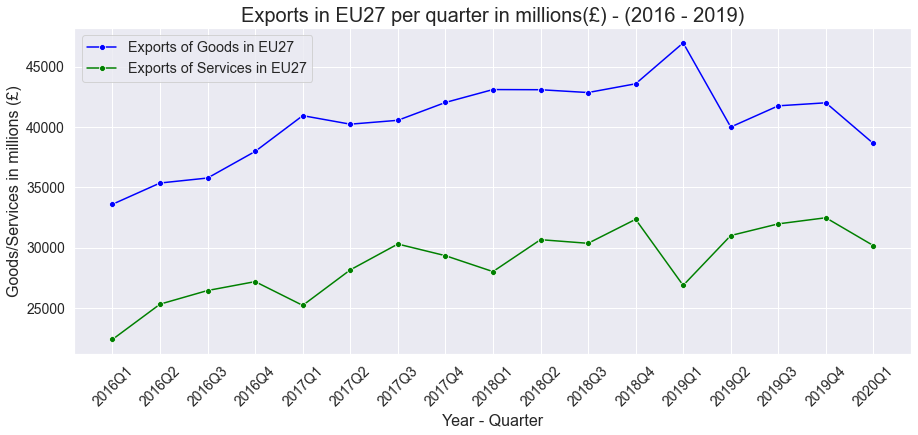

In [55]:
# Exports in EU27 per quarter in millions(£) - (2016 - 2019)

fig, axes = plt.subplots(figsize=(15,6))
plt.title('Exports in EU27 per quarter in millions(£) - (2016 - 2019)', size = 20)

sns.lineplot(x = 'Year', y = 'Total Exports of EU27' , data = expGQ_TEU.iloc[0:17,:], marker='o', color = 'blue')
sns.lineplot(x = 'Year', y = 'Total Exports of EU27' , data = expSQ_TEU.iloc[0:17,:], marker='o', color = 'green')

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Goods/Services in millions (£)",fontsize = 16);
plt.legend(labels=["Exports of Goods in EU27","Exports of Services in EU27"],fontsize = 'large');


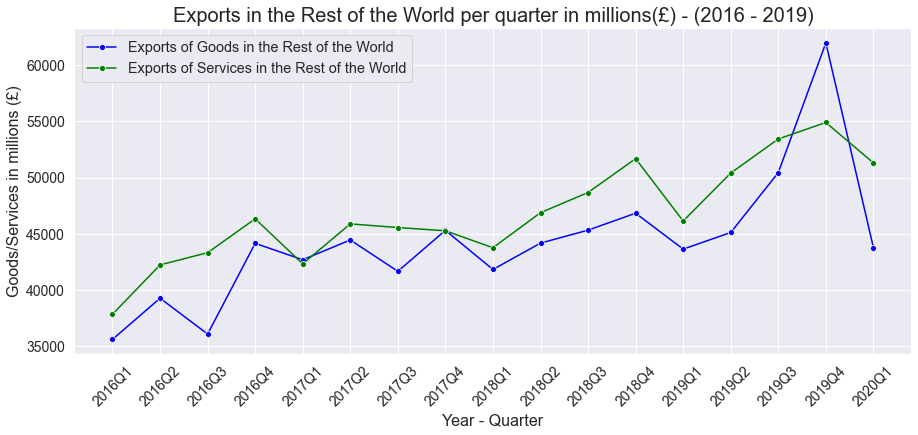

In [56]:
# Exports in the Rest of the World per quarter in millions(£) - (2016 - 2019)

fig, axes = plt.subplots(figsize=(15,6))
plt.title('Exports in the Rest of the World per quarter in millions(£) - (2016 - 2019)', size = 20)

sns.lineplot(x = 'Year', y = 'Total Exports in the rest of the World' , data = expGQ_TRest.iloc[0:17,:], marker='o', color = 'blue')
sns.lineplot(x = 'Year', y = 'Total Exports in the rest of the World' , data = expSQ_TRest.iloc[0:17,:], marker='o', color = 'green')

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Goods/Services in millions (£)",fontsize = 16);
plt.legend(labels=["Exports of Goods in the Rest of the World","Exports of Services in the Rest of the World"],fontsize = 'large');


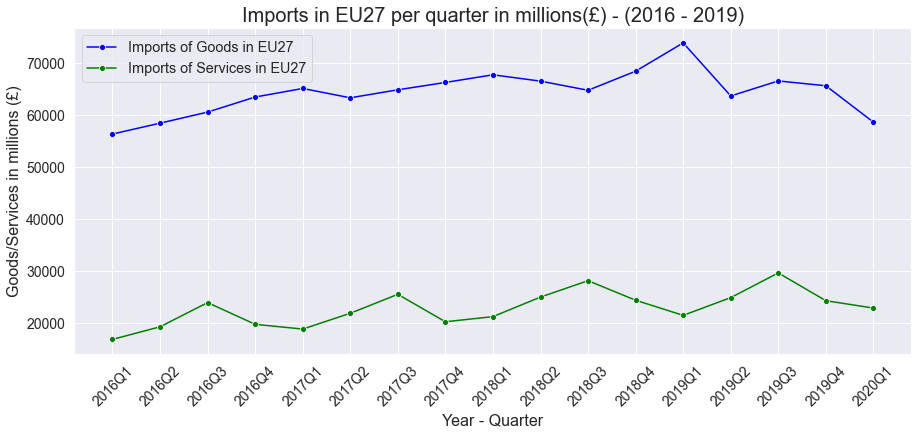

In [57]:
# Imports in EU27 per quarter in millions(£) - (2016 - 2019)

fig, axes = plt.subplots(figsize=(15,6))
plt.title('Imports in EU27 per quarter in millions(£) - (2016 - 2019)', size = 20)

sns.lineplot(x = 'Year', y = 'Total Imports of EU27' , data = impGQ_TEU.iloc[0:17,:], marker='o', color = 'blue')
sns.lineplot(x = 'Year', y = 'Total Imports of EU27' , data = impSQ_TEU.iloc[0:17,:], marker='o', color = 'green')

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Goods/Services in millions (£)",fontsize = 16);
plt.legend(labels=["Imports of Goods in EU27","Imports of Services in EU27"],fontsize = 'large');


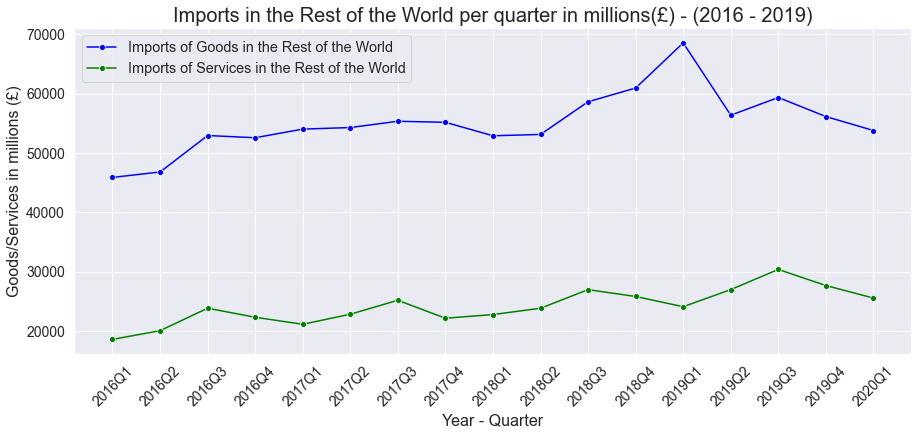

In [58]:
# Imports in the Rest of the World per quarter in millions(£) - (2016 - 2019)

fig, axes = plt.subplots(figsize=(15,6))
plt.title('Imports in the Rest of the World per quarter in millions(£) - (2016 - 2019)', size = 20)

sns.lineplot(x = 'Year', y = 'Total Imports in the rest of the World' , data = impGQ_TRest.iloc[0:17,:], marker='o', color = 'blue')
sns.lineplot(x = 'Year', y = 'Total Imports in the rest of the World' , data = impSQ_TRest.iloc[0:17,:], marker='o', color = 'green')

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Goods/Services in millions (£)",fontsize = 16);
plt.legend(labels=["Imports of Goods in the Rest of the World","Imports of Services in the Rest of the World"],fontsize = 'large');


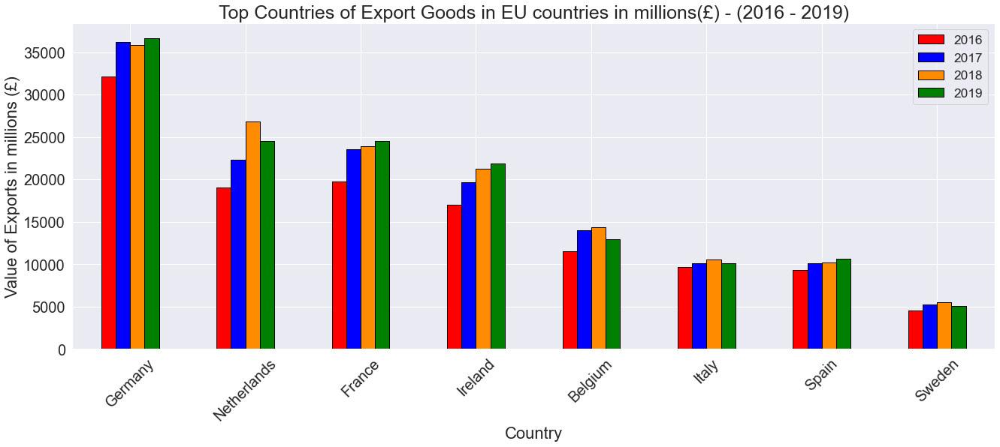

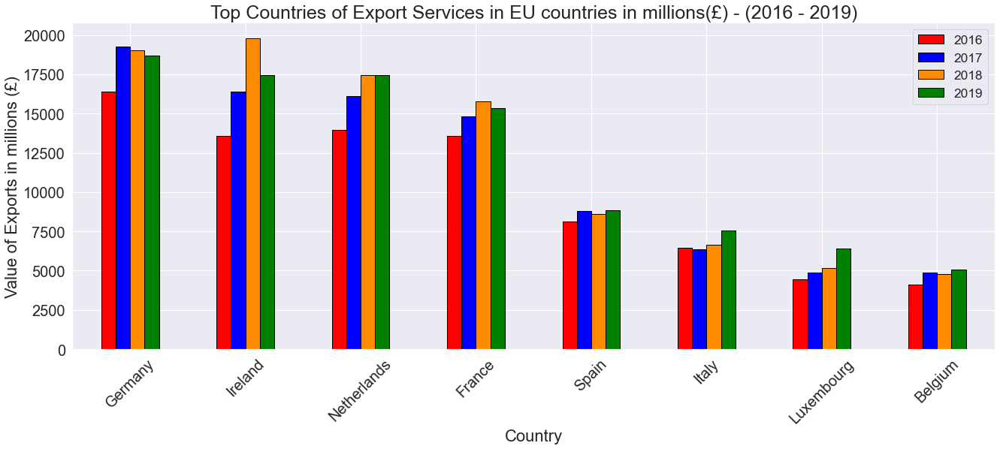

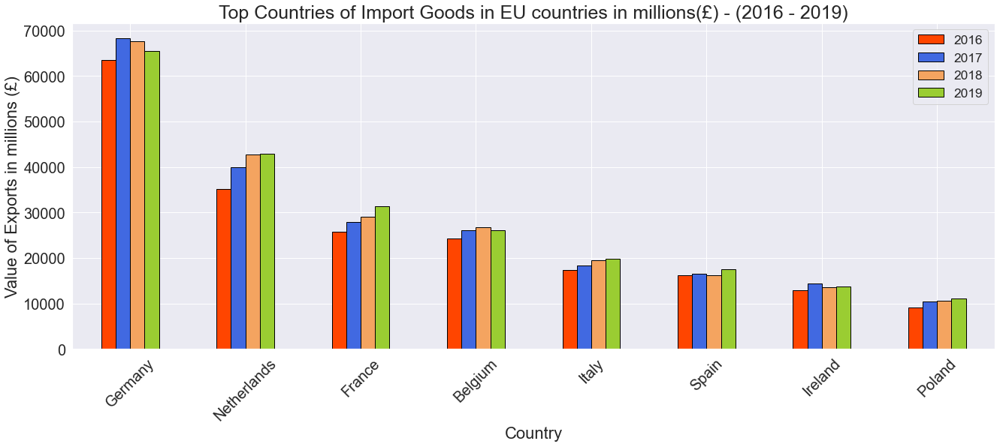

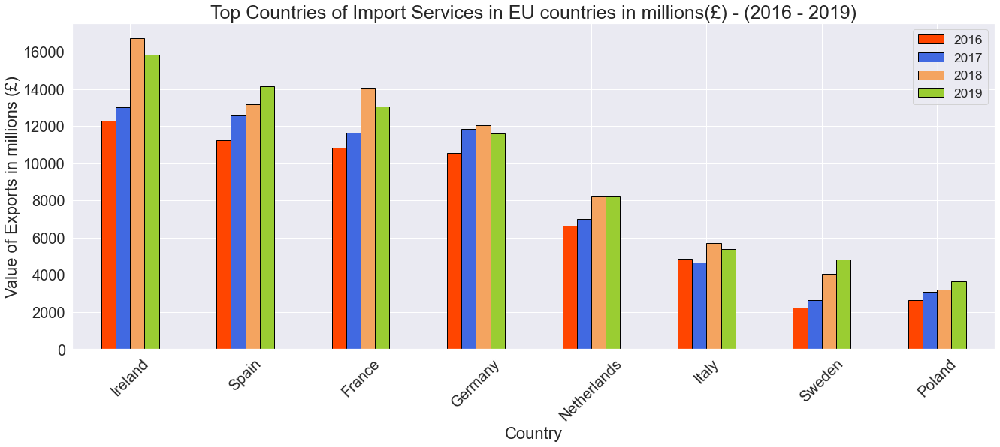

In [59]:
# Top Import/Exports of Goods/Services in EU countries (2016 - 2019)


# Find the average exports of goods from 2016 - 2019
Top_expGA_EU = expGA_EU.iloc[:,[0,18,19,20,21]]
Top_expGA_EU['Mean'] = Top_expGA_EU.mean(axis=1)
Top_expGA_EU = Top_expGA_EU.sort_values(by='Mean', ascending=False)
Top_expGA_EU = Top_expGA_EU.drop("Mean", axis=1)
Top_expGA_EU


# Find the average exports of services from 2016 - 2019
Top_expSA_EU = expSA_EU.iloc[:,[0,18,19,20,21]]
Top_expSA_EU['Mean'] = Top_expSA_EU.mean(axis=1)
Top_expSA_EU = Top_expSA_EU.sort_values(by='Mean', ascending=False)
Top_expSA_EU = Top_expSA_EU.drop("Mean", axis=1)
Top_expSA_EU


# Find the average imports of goods from 2016 - 2019
Top_impGA_EU = impGA_EU.iloc[:,[0,18,19,20,21]]
Top_impGA_EU['Mean'] = Top_impGA_EU.mean(axis=1)
Top_impGA_EU = Top_impGA_EU.sort_values(by='Mean', ascending=False)
Top_impGA_EU = Top_impGA_EU.drop("Mean", axis=1)
Top_impGA_EU


# Find the average imports of services from 2016 - 2019
Top_impSA_EU = impSA_EU.iloc[:,[0,18,19,20,21]]
Top_impSA_EU['Mean'] = Top_impSA_EU.mean(axis=1)
Top_impSA_EU = Top_impSA_EU.sort_values(by='Mean', ascending=False)
Top_impSA_EU = Top_impSA_EU.drop("Mean", axis=1)
Top_impSA_EU




# **********************************************************************



# Plot Top 8 Countries of Exports Goods in EU (2016-2019)


Top_expGA_EU.head(8).plot.bar(x = 'Country',rot=0, edgecolor = 'black',
                                color = ["red","blue","darkorange","green"],figsize=(22,8))

plt.title('Top Countries of Export Goods in EU countries in millions(£) - (2016 - 2019)', size = 25)
plt.xticks(rotation = 45, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Country",fontsize = 22)
plt.ylabel("Value of Exports in millions (£)",fontsize = 22);
plt.legend(fontsize = 'x-large');




# Plot Top 8 Countries of Exports Services in EU (2016-2019)



Top_expSA_EU.head(8).plot.bar(x = 'Country',rot=0, edgecolor = 'black',
                                color = ["red","blue","darkorange","green"],figsize=(22,8))

plt.title('Top Countries of Export Services in EU countries in millions(£) - (2016 - 2019)', size = 25)
plt.xticks(rotation = 45, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Country",fontsize = 22)
plt.ylabel("Value of Exports in millions (£)",fontsize = 22);
plt.legend(fontsize = 'x-large');




# Plot Top 8 Countries of Import Goods in EU (2016-2019)


Top_impGA_EU.head(8).plot.bar(x = 'Country',rot=0, edgecolor = 'black',
                                color = ["orangered","royalblue","sandybrown","yellowgreen"],figsize=(22,8))

plt.title('Top Countries of Import Goods in EU countries in millions(£) - (2016 - 2019)', size = 25)
plt.xticks(rotation = 45, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Country",fontsize = 22)
plt.ylabel("Value of Exports in millions (£)",fontsize = 22);
plt.legend(fontsize = 'x-large');




# Plot Top 8 Countries of Import Services in EU (2016-2019)


Top_impSA_EU.head(8).plot.bar(x = 'Country',rot=0, edgecolor = 'black',
                                color = ["orangered","royalblue","sandybrown","yellowgreen"],figsize=(22,8))

plt.title('Top Countries of Import Services in EU countries in millions(£) - (2016 - 2019)', size = 25)
plt.xticks(rotation = 45, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Country",fontsize = 22)
plt.ylabel("Value of Exports in millions (£)",fontsize = 22);
plt.legend(fontsize = 'x-large');


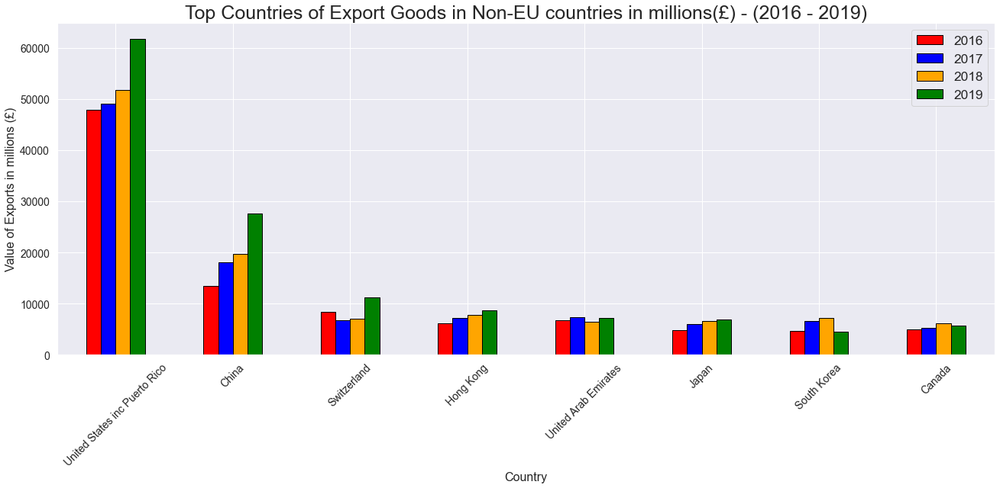

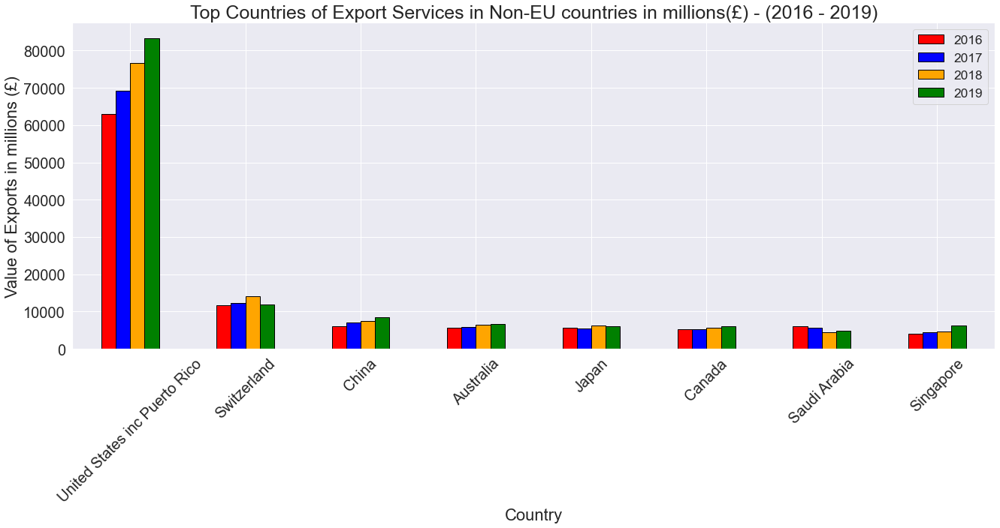

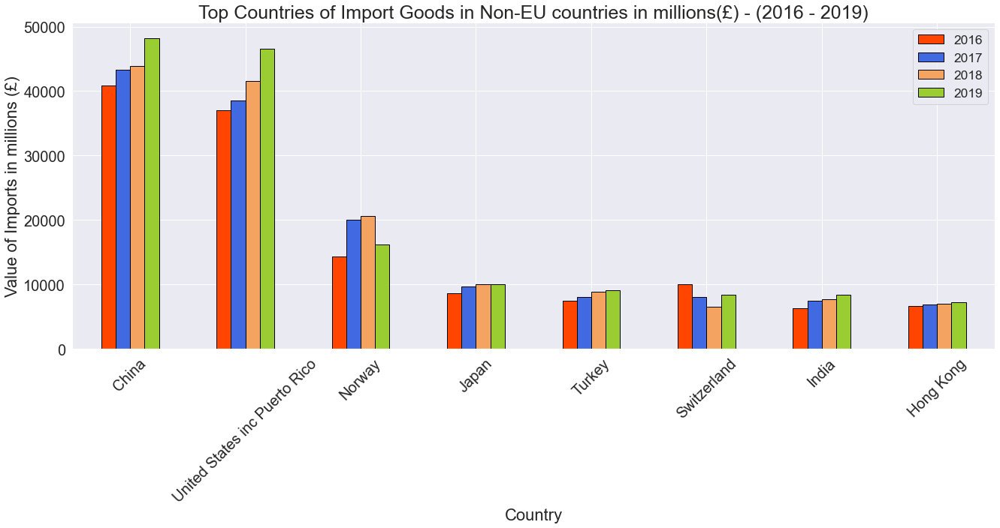

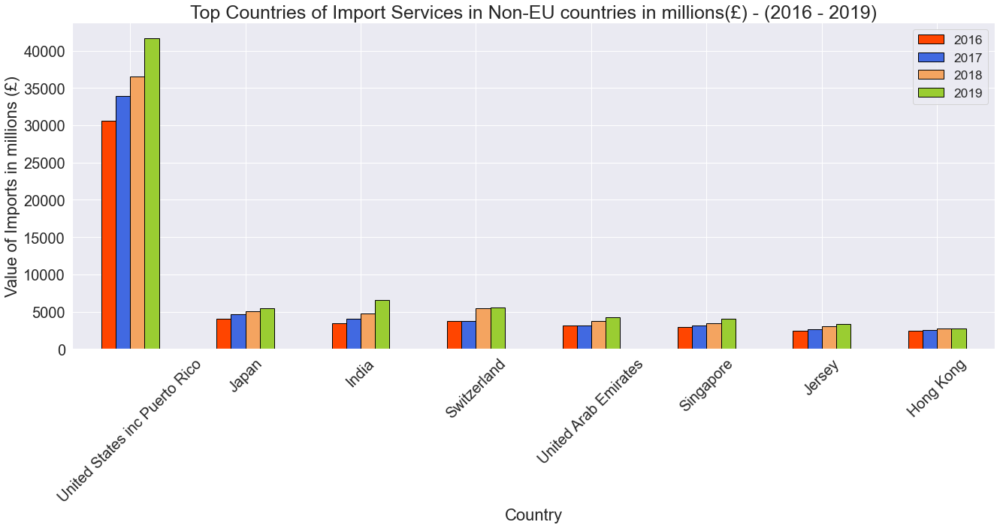

In [60]:
# Top Import/Exports of Goods/Services in Non-EU countries (2016 - 2019)



# Find the average exports of goods from 2016 - 2019
Top_expGA_Rest = expGA_Rest.iloc[:,[0,18,19,20,21]]
Top_expGA_Rest['Mean'] = Top_expGA_Rest.mean(axis=1)
Top_expGA_Rest = Top_expGA_Rest.sort_values(by='Mean', ascending=False)
Top_expGA_Rest = Top_expGA_Rest.drop("Mean", axis=1)
Top_expGA_Rest


# Find the average exports of services from 2016 - 2019
Top_expSA_Rest = expSA_Rest.iloc[:,[0,18,19,20,21]]
Top_expSA_Rest['Mean'] = Top_expSA_Rest.mean(axis=1)
Top_expSA_Rest = Top_expSA_Rest.sort_values(by='Mean', ascending=False)
Top_expSA_Rest = Top_expSA_Rest.drop("Mean", axis=1)
Top_expSA_Rest


# Find the average imports of goods from 2016 - 2019
Top_impGA_Rest = impGA_Rest.iloc[:,[0,18,19,20,21]]
Top_impGA_Rest['Mean'] = Top_impGA_Rest.mean(axis=1)
Top_impGA_Rest = Top_impGA_Rest.sort_values(by='Mean', ascending=False)
Top_impGA_Rest = Top_impGA_Rest.drop("Mean", axis=1)
Top_impGA_Rest


# Find the average imports of services from 2016 - 2019
Top_impSA_Rest = impSA_Rest.iloc[:,[0,18,19,20,21]]
Top_impSA_Rest['Mean'] = Top_impSA_Rest.mean(axis=1)
Top_impSA_Rest = Top_impSA_Rest.sort_values(by='Mean', ascending=False)
Top_impSA_Rest = Top_impSA_Rest.drop("Mean", axis=1)
Top_impSA_Rest



# **********************************************************************



# Plot Top 8 Countries of Exports Goods in Non-EU (2016-2019)



Top_expGA_Rest.head(8).plot.bar(x = 'Country',rot=0, edgecolor = 'black',
                                color = ["red","blue","orange","green"],figsize=(22,8))

plt.title('Top Countries of Export Goods in Non-EU countries in millions(£) - (2016 - 2019)', size = 25)
plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Country",fontsize = 16)
plt.ylabel("Value of Exports in millions (£)",fontsize = 16);
plt.legend(fontsize = 'x-large');




# Plot Top 8 Countries of Exports Services in Non-EU (2016-2019)



Top_expSA_Rest.head(8).plot.bar(x = 'Country',rot=0, edgecolor = 'black',
                                color = ["red","blue","orange","green"],figsize=(22,8))

plt.title('Top Countries of Export Services in Non-EU countries in millions(£) - (2016 - 2019)', size = 25)
plt.xticks(rotation = 45, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Country",fontsize = 22)
plt.ylabel("Value of Exports in millions (£)",fontsize = 22);
plt.legend(fontsize = 'x-large');




# Plot Top 8 Countries of Import Goods in Non-EU (2016-2019)


Top_impGA_Rest.head(8).plot.bar(x = 'Country',rot=0, edgecolor = 'black',
                                color = ["orangered","royalblue","sandybrown","yellowgreen"],figsize=(22,8))

plt.title('Top Countries of Import Goods in Non-EU countries in millions(£) - (2016 - 2019)', size = 25)
plt.xticks(rotation = 45, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Country",fontsize = 22)
plt.ylabel("Value of Imports in millions (£)",fontsize = 22);
plt.legend(fontsize = 'x-large');




# Plot Top 8 Countries of Import Services in Non-EU (2016-2019)



Top_impSA_Rest.head(8).plot.bar(x = 'Country',rot=0, edgecolor = 'black',
                                color = ["orangered","royalblue","sandybrown","yellowgreen"],figsize=(22,8))

plt.title('Top Countries of Import Services in Non-EU countries in millions(£) - (2016 - 2019)', size = 25)
plt.xticks(rotation = 45, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Country",fontsize = 22)
plt.ylabel("Value of Imports in millions (£)",fontsize = 22);
plt.legend(fontsize = 'x-large');


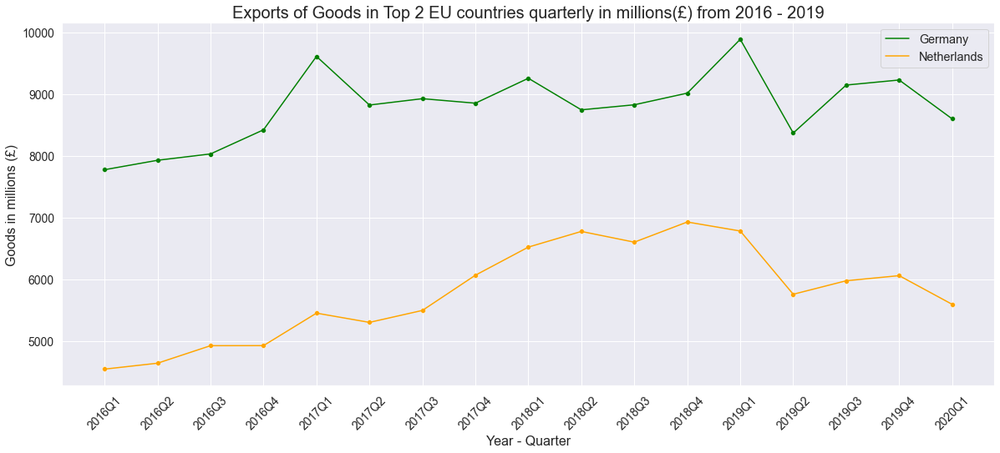

In [61]:
# TOP 2 EU countries of Exports in Goods


# Germany
Germany_expGQ_EU= expGQ_EU.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
Germany_expGQ_EU = Germany_expGQ_EU[Germany_expGQ_EU['Country'].isin(['Germany'])]
Germany_expGQ_EU = Germany_expGQ_EU.transpose()
Germany_expGQ_EU = Germany_expGQ_EU.reset_index(level=0)
Germany_expGQ_EU = Germany_expGQ_EU.tail(-1)
Germany_expGQ_EU = Germany_expGQ_EU.rename(columns = {'index' : "Year"})
Germany_expGQ_EU = Germany_expGQ_EU.rename(columns = {10 : "Exports in Goods"})

# Netherlands
Netherlands_expGQ_EU= expGQ_EU.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
Netherlands_expGQ_EU = Netherlands_expGQ_EU[Netherlands_expGQ_EU['Country'].isin(['Netherlands'])]
Netherlands_expGQ_EU = Netherlands_expGQ_EU.transpose()
Netherlands_expGQ_EU = Netherlands_expGQ_EU.reset_index(level=0)
Netherlands_expGQ_EU = Netherlands_expGQ_EU.tail(-1)
Netherlands_expGQ_EU = Netherlands_expGQ_EU.rename(columns = {'index' : "Year"})
Netherlands_expGQ_EU = Netherlands_expGQ_EU.rename(columns = {19 : "Exports in Goods"})




fig, axes = plt.subplots(figsize=(20,8))
plt.title('Exports of Goods in Top 2 EU countries quarterly in millions(£) from 2016 - 2019', size = 20)

sns.lineplot(x = 'Year', y = 'Exports in Goods' ,data = Germany_expGQ_EU,color = 'green')
sns.scatterplot(x = 'Year', y = 'Exports in Goods' ,data = Germany_expGQ_EU,color = 'green')
sns.lineplot(x = 'Year', y = 'Exports in Goods' ,data = Netherlands_expGQ_EU,color = 'orange')
sns.scatterplot(x = 'Year', y = 'Exports in Goods' ,data = Netherlands_expGQ_EU,color = 'orange')

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Goods in millions (£)",fontsize = 16);
plt.legend(labels=["Germany","Netherlands"],fontsize = 'large');

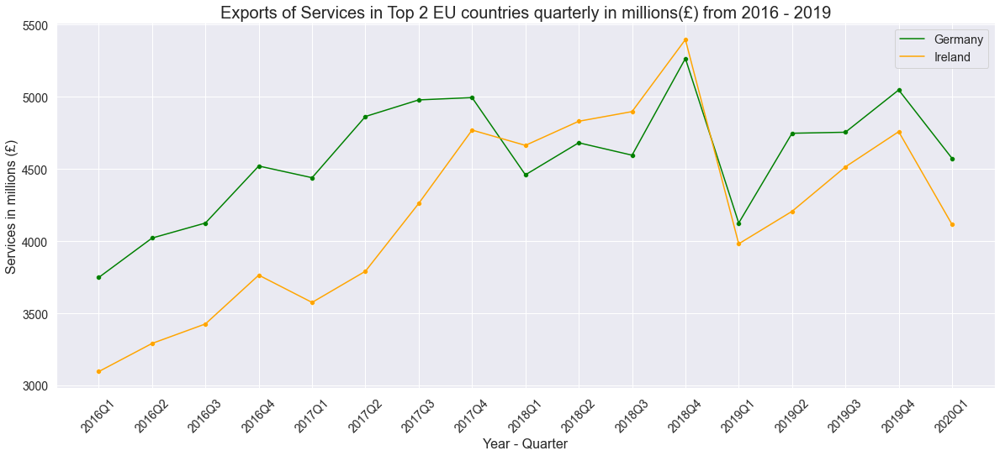

In [62]:
# TOP 2 EU countries of Exports in Services


# Germany
Germany_expSQ_EU= expSQ_EU.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
Germany_expSQ_EU = Germany_expSQ_EU[Germany_expSQ_EU['Country'].isin(['Germany'])]
Germany_expSQ_EU = Germany_expSQ_EU.transpose()
Germany_expSQ_EU = Germany_expSQ_EU.reset_index(level=0)
Germany_expSQ_EU = Germany_expSQ_EU.tail(-1)
Germany_expSQ_EU = Germany_expSQ_EU.rename(columns = {'index' : "Year"})
Germany_expSQ_EU = Germany_expSQ_EU.rename(columns = {10 : "Exports in Services"})


# Ireland
Ireland_expSQ_EU= expSQ_EU.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
Ireland_expSQ_EU = Ireland_expSQ_EU[Ireland_expSQ_EU['Country'].isin(['Ireland'])]
Ireland_expSQ_EU = Ireland_expSQ_EU.transpose()
Ireland_expSQ_EU = Ireland_expSQ_EU.reset_index(level=0)
Ireland_expSQ_EU = Ireland_expSQ_EU.tail(-1)
Ireland_expSQ_EU = Ireland_expSQ_EU.rename(columns = {'index' : "Year"})
Ireland_expSQ_EU = Ireland_expSQ_EU.rename(columns = {13 : "Exports in Services"})





fig, axes = plt.subplots(figsize=(20,8))
plt.title('Exports of Services in Top 2 EU countries quarterly in millions(£) from 2016 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Exports in Services' ,data = Germany_expSQ_EU,color = 'green')
sns.scatterplot(x = 'Year', y = 'Exports in Services' ,data = Germany_expSQ_EU,color = 'green')
sns.lineplot(x = 'Year', y = 'Exports in Services' ,data = Ireland_expSQ_EU,color = 'orange')
sns.scatterplot(x = 'Year', y = 'Exports in Services' ,data = Ireland_expSQ_EU,color = 'orange')

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Services in millions (£)",fontsize = 16);
plt.legend(labels=["Germany","Ireland"],fontsize = 'large');

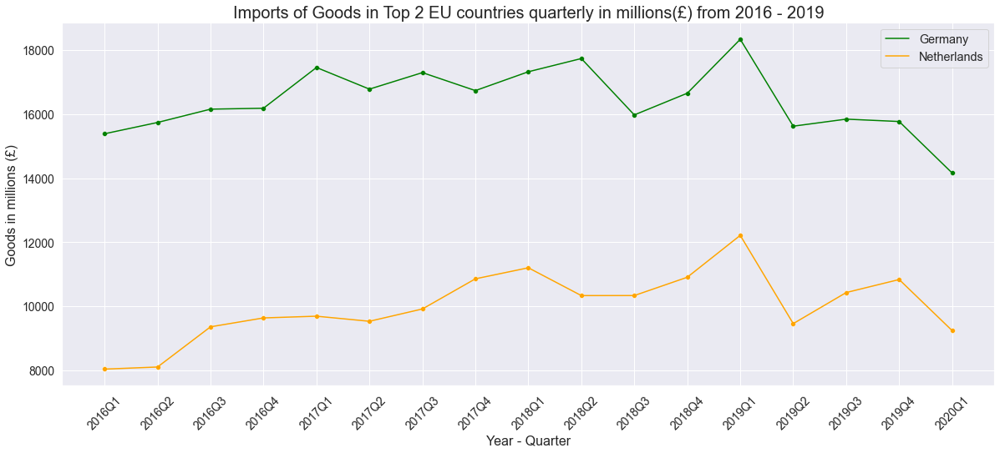

In [63]:
# TOP 2 EU countries of Imports in Goods


# Germany
Germany_impGQ_EU = impGQ_EU.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
Germany_impGQ_EU = Germany_impGQ_EU[Germany_impGQ_EU['Country'].isin(['Germany'])]
Germany_impGQ_EU = Germany_impGQ_EU.transpose()
Germany_impGQ_EU = Germany_impGQ_EU.reset_index(level=0)
Germany_impGQ_EU = Germany_impGQ_EU.tail(-1)
Germany_impGQ_EU = Germany_impGQ_EU.rename(columns = {'index' : "Year"})
Germany_impGQ_EU = Germany_impGQ_EU.rename(columns = {251 : "Imports in Goods"})


#Netherlands
Netherlands_impGQ_EU = impGQ_EU.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
Netherlands_impGQ_EU = Netherlands_impGQ_EU[Netherlands_impGQ_EU['Country'].isin(['Netherlands'])]
Netherlands_impGQ_EU = Netherlands_impGQ_EU.transpose()
Netherlands_impGQ_EU = Netherlands_impGQ_EU.reset_index(level=0)
Netherlands_impGQ_EU = Netherlands_impGQ_EU.tail(-1)
Netherlands_impGQ_EU = Netherlands_impGQ_EU.rename(columns = {'index' : "Year"})
Netherlands_impGQ_EU = Netherlands_impGQ_EU.rename(columns = {260 : "Imports in Goods"})



fig, axes = plt.subplots(figsize=(20,8))
plt.title('Imports of Goods in Top 2 EU countries quarterly in millions(£) from 2016 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Imports in Goods' ,data = Germany_impGQ_EU,color = 'green')
sns.scatterplot(x = 'Year', y = 'Imports in Goods' ,data = Germany_impGQ_EU,color = 'green')
sns.lineplot(x = 'Year', y = 'Imports in Goods' ,data = Netherlands_impGQ_EU,color = 'orange')
sns.scatterplot(x = 'Year', y = 'Imports in Goods' ,data = Netherlands_impGQ_EU,color = 'orange')

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Goods in millions (£)",fontsize = 16);
plt.legend(labels=["Germany","Netherlands"],fontsize = 'large');

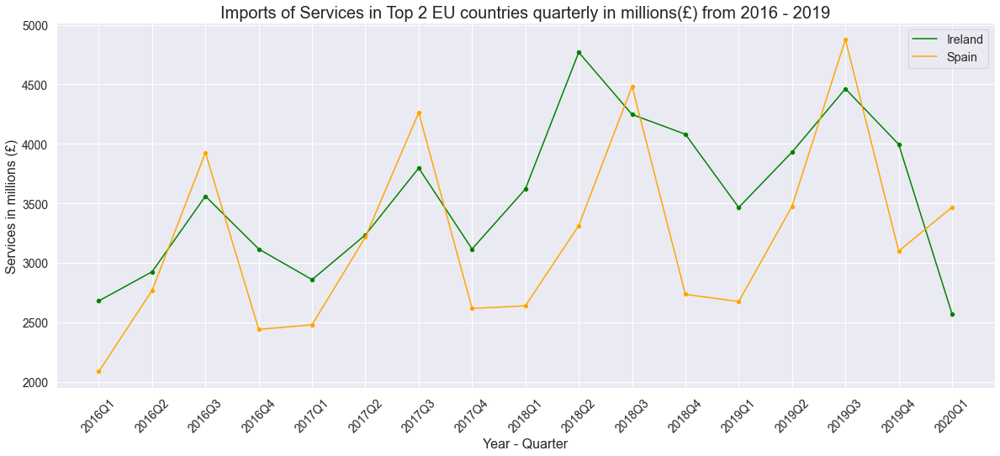

In [64]:
# TOP 2 EU countries of Imports in Services


# Ireland
Ireland_impSQ_EU = impSQ_EU.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
Ireland_impSQ_EU = Ireland_impSQ_EU[Ireland_impSQ_EU['Country'].isin(['Ireland'])]
Ireland_impSQ_EU = Ireland_impSQ_EU.transpose()
Ireland_impSQ_EU = Ireland_impSQ_EU.reset_index(level=0)
Ireland_impSQ_EU = Ireland_impSQ_EU.tail(-1)
Ireland_impSQ_EU = Ireland_impSQ_EU.rename(columns = {'index' : "Year"})
Ireland_impSQ_EU = Ireland_impSQ_EU.rename(columns = {257 : "Imports in Services"})


# Spain
Spain_impSQ_EU = impSQ_EU.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
Spain_impSQ_EU = Spain_impSQ_EU[Spain_impSQ_EU['Country'].isin(['Spain'])]
Spain_impSQ_EU = Spain_impSQ_EU.transpose()
Spain_impSQ_EU = Spain_impSQ_EU.reset_index(level=0)
Spain_impSQ_EU = Spain_impSQ_EU.tail(-1)
Spain_impSQ_EU = Spain_impSQ_EU.rename(columns = {'index' : "Year"})
Spain_impSQ_EU = Spain_impSQ_EU.rename(columns = {269 : "Imports in Services"})




fig, axes = plt.subplots(figsize=(20,8))
plt.title('Imports of Services in Top 2 EU countries quarterly in millions(£) from 2016 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Imports in Services' ,data = Ireland_impSQ_EU,color = 'green')
sns.scatterplot(x = 'Year', y = 'Imports in Services' ,data = Ireland_impSQ_EU,color = 'green')
sns.lineplot(x = 'Year', y = 'Imports in Services' ,data = Spain_impSQ_EU,color = 'orange')
sns.scatterplot(x = 'Year', y = 'Imports in Services' ,data = Spain_impSQ_EU,color = 'orange')

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Services in millions (£)",fontsize = 16);
plt.legend(labels=["Ireland","Spain"],fontsize = 'large');



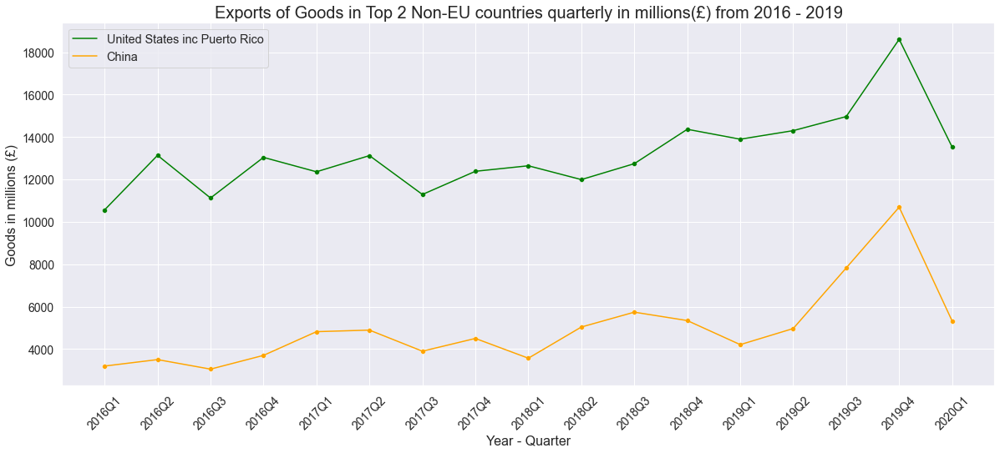

In [65]:
# TOP 2 Non-EU countries of Exports in Goods


# United States inc Puerto Rico
USA_expGQ_Rest= expGQ_Rest.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
USA_expGQ_Rest = USA_expGQ_Rest[USA_expGQ_Rest['Country'].isin(['United States inc Puerto Rico'])]
USA_expGQ_Rest = USA_expGQ_Rest.transpose()
USA_expGQ_Rest = USA_expGQ_Rest.reset_index(level=0)
USA_expGQ_Rest = USA_expGQ_Rest.tail(-1)
USA_expGQ_Rest = USA_expGQ_Rest.rename(columns = {'index' : "Year"})
USA_expGQ_Rest = USA_expGQ_Rest.rename(columns = {224 : "Exports in Goods"})



# China
China_expGQ_Rest = expGQ_Rest.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
China_expGQ_Rest = China_expGQ_Rest[China_expGQ_Rest['Country'].isin(['China'])]
China_expGQ_Rest = China_expGQ_Rest.transpose()
China_expGQ_Rest = China_expGQ_Rest.reset_index(level=0)
China_expGQ_Rest = China_expGQ_Rest.tail(-1)
China_expGQ_Rest = China_expGQ_Rest.rename(columns = {'index' : "Year"})
China_expGQ_Rest = China_expGQ_Rest.rename(columns = {70 : "Exports in Goods"})





fig, axes = plt.subplots(figsize=(20,8))
plt.title('Exports of Goods in Top 2 Non-EU countries quarterly in millions(£) from 2016 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Exports in Goods' ,data = USA_expGQ_Rest,color = 'green')
sns.scatterplot(x = 'Year', y = 'Exports in Goods' ,data = USA_expGQ_Rest,color = 'green')
sns.lineplot(x = 'Year', y = 'Exports in Goods' ,data = China_expGQ_Rest,color = 'orange')
sns.scatterplot(x = 'Year', y = 'Exports in Goods' ,data = China_expGQ_Rest,color = 'orange')

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Goods in millions (£)",fontsize = 16);
plt.legend(labels=["United States inc Puerto Rico","China"],fontsize = 'large');



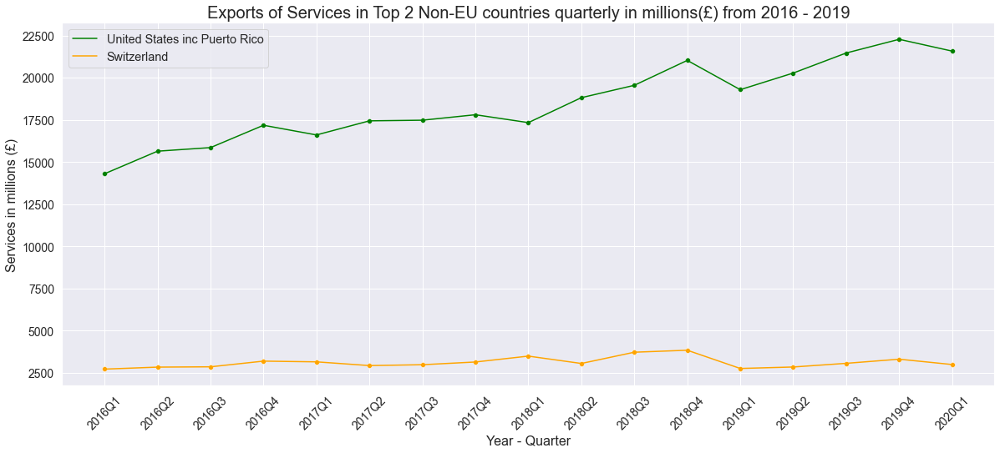

In [66]:
# TOP 2 Non-EU countries of Exports in Services


# United States inc Puerto Rico
USA_expSQ_Rest= expSQ_Rest.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
USA_expSQ_Rest = USA_expSQ_Rest[USA_expSQ_Rest['Country'].isin(['United States inc Puerto Rico'])]
USA_expSQ_Rest = USA_expSQ_Rest.transpose()
USA_expSQ_Rest = USA_expSQ_Rest.reset_index(level=0)
USA_expSQ_Rest = USA_expSQ_Rest.tail(-1)
USA_expSQ_Rest = USA_expSQ_Rest.rename(columns = {'index' : "Year"})
USA_expSQ_Rest = USA_expSQ_Rest.rename(columns = {226 : "Exports in Services"})



# Switzerland
Switzerland_expSQ_Rest= expSQ_Rest.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
Switzerland_expSQ_Rest = Switzerland_expSQ_Rest[Switzerland_expSQ_Rest['Country'].isin(['Switzerland'])]
Switzerland_expSQ_Rest = Switzerland_expSQ_Rest.transpose()
Switzerland_expSQ_Rest = Switzerland_expSQ_Rest.reset_index(level=0)
Switzerland_expSQ_Rest = Switzerland_expSQ_Rest.tail(-1)
Switzerland_expSQ_Rest = Switzerland_expSQ_Rest.rename(columns = {'index' : "Year"})
Switzerland_expSQ_Rest = Switzerland_expSQ_Rest.rename(columns = {208 : "Exports in Services"})





fig, axes = plt.subplots(figsize=(20,8))
plt.title('Exports of Services in Top 2 Non-EU countries quarterly in millions(£) from 2016 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Exports in Services' ,data = USA_expSQ_Rest,color = 'green')
sns.scatterplot(x = 'Year', y = 'Exports in Services' ,data = USA_expSQ_Rest,color = 'green')
sns.lineplot(x = 'Year', y = 'Exports in Services' ,data = Switzerland_expSQ_Rest,color = 'orange')
sns.scatterplot(x = 'Year', y = 'Exports in Services' ,data = Switzerland_expSQ_Rest,color = 'orange')

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Services in millions (£)",fontsize = 16);
plt.legend(labels=["United States inc Puerto Rico","Switzerland"],fontsize = 'large');



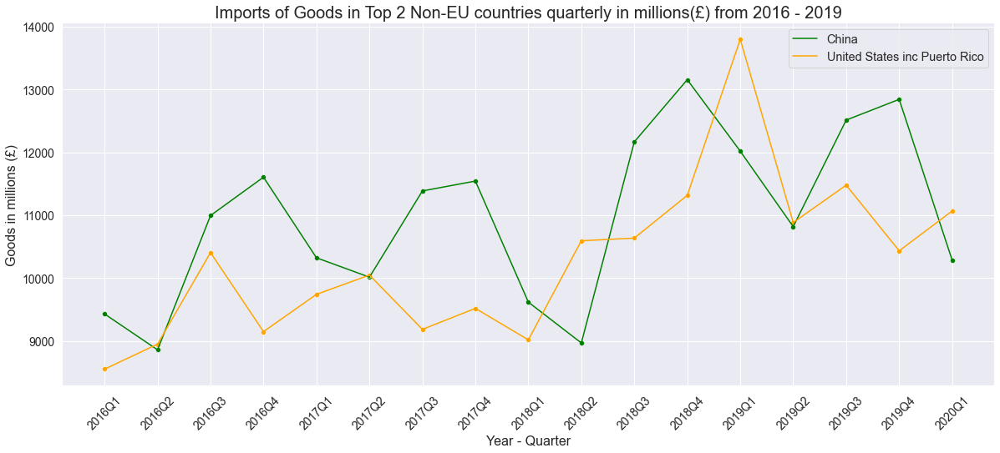

In [67]:
# TOP 2 Non-EU countries of Imports in Goods


# China
China_impGQ_Rest = impGQ_Rest.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
China_impGQ_Rest = China_impGQ_Rest[China_impGQ_Rest['Country'].isin(['China'])]
China_impGQ_Rest = China_impGQ_Rest.transpose()
China_impGQ_Rest = China_impGQ_Rest.reset_index(level=0)
China_impGQ_Rest = China_impGQ_Rest.tail(-1)
China_impGQ_Rest = China_impGQ_Rest.rename(columns = {'index' : "Year"})
China_impGQ_Rest = China_impGQ_Rest.rename(columns = {311 : "Imports in Goods"})


# United States inc Puerto Rico
USA_impGQ_Rest= impGQ_Rest.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
USA_impGQ_Rest = USA_impGQ_Rest[USA_impGQ_Rest['Country'].isin(['United States inc Puerto Rico'])]
USA_impGQ_Rest = USA_impGQ_Rest.transpose()
USA_impGQ_Rest = USA_impGQ_Rest.reset_index(level=0)
USA_impGQ_Rest = USA_impGQ_Rest.tail(-1)
USA_impGQ_Rest = USA_impGQ_Rest.rename(columns = {'index' : "Year"})
USA_impGQ_Rest = USA_impGQ_Rest.rename(columns = {465 : "Imports in Goods"})



fig, axes = plt.subplots(figsize=(20,8))
plt.title('Imports of Goods in Top 2 Non-EU countries quarterly in millions(£) from 2016 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Imports in Goods' ,data = China_impGQ_Rest,color = 'green')
sns.scatterplot(x = 'Year', y = 'Imports in Goods' ,data = China_impGQ_Rest,color = 'green')
sns.lineplot(x = 'Year', y = 'Imports in Goods' ,data = USA_impGQ_Rest,color = 'orange')
sns.scatterplot(x = 'Year', y = 'Imports in Goods' ,data = USA_impGQ_Rest,color = 'orange')

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Goods in millions (£)",fontsize = 16);
plt.legend(labels=["China","United States inc Puerto Rico"],fontsize = 'large');


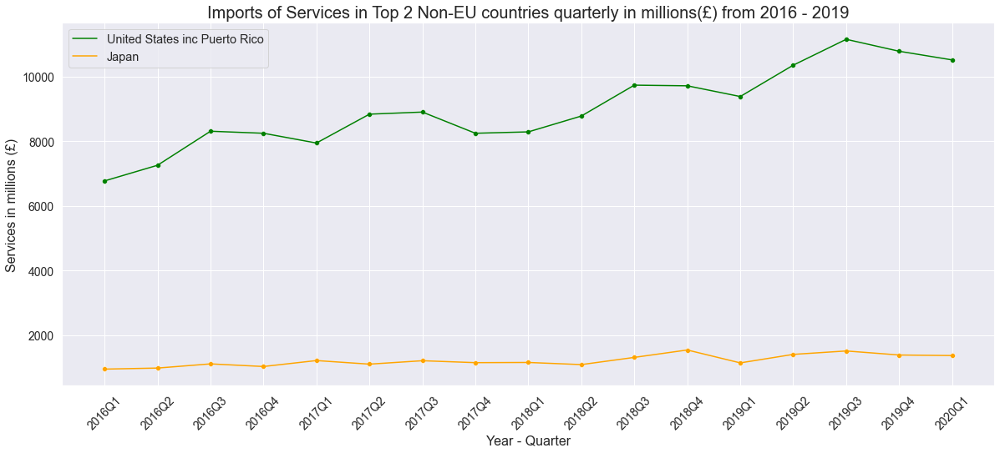

In [68]:
# TOP 2 Non-EU countries of Imports in Services


# United States inc Puerto Rico
USA_impSQ_Rest= impSQ_Rest.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
USA_impSQ_Rest = USA_impSQ_Rest[USA_impSQ_Rest['Country'].isin(['United States inc Puerto Rico'])]
USA_impSQ_Rest = USA_impSQ_Rest.transpose()
USA_impSQ_Rest = USA_impSQ_Rest.reset_index(level=0)
USA_impSQ_Rest = USA_impSQ_Rest.tail(-1)
USA_impSQ_Rest = USA_impSQ_Rest.rename(columns = {'index' : "Year"})
USA_impSQ_Rest = USA_impSQ_Rest.rename(columns = {470 : "Imports in Services"})


# Japan
Japan_impSQ_Rest= impSQ_Rest.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
Japan_impSQ_Rest = Japan_impSQ_Rest[Japan_impSQ_Rest['Country'].isin(['Japan'])]
Japan_impSQ_Rest = Japan_impSQ_Rest.transpose()
Japan_impSQ_Rest = Japan_impSQ_Rest.reset_index(level=0)
Japan_impSQ_Rest = Japan_impSQ_Rest.tail(-1)
Japan_impSQ_Rest = Japan_impSQ_Rest.rename(columns = {'index' : "Year"})
Japan_impSQ_Rest = Japan_impSQ_Rest.rename(columns = {369 : "Imports in Services"})



fig, axes = plt.subplots(figsize=(20,8))
plt.title('Imports of Services in Top 2 Non-EU countries quarterly in millions(£) from 2016 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Imports in Services' ,data = USA_impSQ_Rest,color = 'green')
sns.scatterplot(x = 'Year', y = 'Imports in Services' ,data = USA_impSQ_Rest,color = 'green')
sns.lineplot(x = 'Year', y = 'Imports in Services' ,data = Japan_impSQ_Rest,color = 'orange')
sns.scatterplot(x = 'Year', y = 'Imports in Services' ,data = Japan_impSQ_Rest,color = 'orange')

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Services in millions (£)",fontsize = 16);
plt.legend(labels=["United States inc Puerto Rico","Japan"],fontsize = 'large');

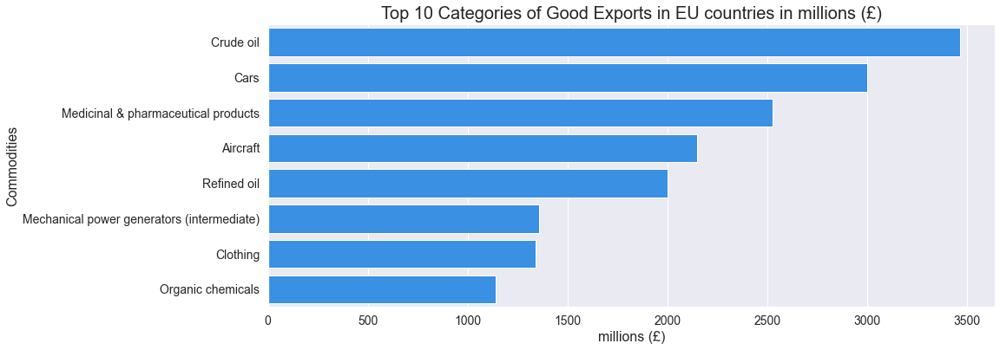

In [69]:
# Top 10 Categories of Good Exports in EU (2018 - 2019)
sns.barplot(y = 'COMMODITY', x = 'Mean18', data = exp_GQ_EU.sort_values(by='Mean18', ascending=False).head(8),
           color = "dodgerblue",ci=None)
plt.title('Top 10 Categories of Good Exports in EU countries in millions (£)', fontsize = 20)
sns.set(rc={"figure.figsize":(15, 6)})

plt.xticks(rotation = 0, fontsize = 14)
plt.yticks(rotation = 0,fontsize = 14)
plt.xlabel("millions (£)",fontsize = 16)
plt.ylabel("Commodities",fontsize = 16);


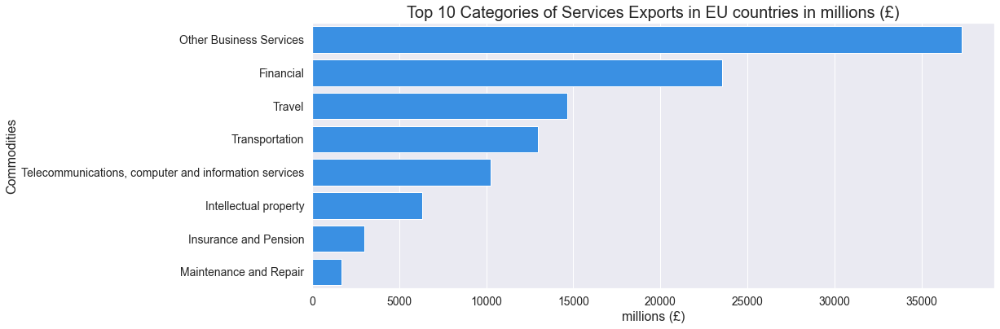

In [70]:
# Top 10 Categories of Services Exports in EU (2018 - 2019)
sns.barplot(y = 'Service type', x = 'Mean18', data = exp_SEU.sort_values(by='Mean18', ascending=False).head(8),
           color = "dodgerblue",ci=None)
plt.title('Top 10 Categories of Services Exports in EU countries in millions (£)', fontsize = 20)
sns.set(rc={"figure.figsize":(15, 6)})

plt.xticks(rotation = 0, fontsize = 14)
plt.yticks(rotation = 0,fontsize = 14)
plt.xlabel("millions (£)",fontsize = 16)
plt.ylabel("Commodities",fontsize = 16);


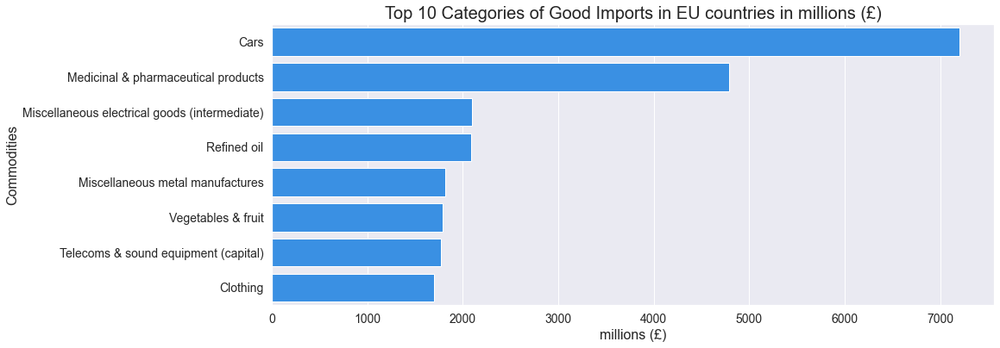

In [71]:
# Top 10 Categories of Good Imports in EU (2018 - 2019)
sns.barplot(y = 'COMMODITY', x = 'Mean18', data = imp_GQ_EU.sort_values(by='Mean18', ascending=False).head(8),
           color = "dodgerblue",ci=None)
plt.title('Top 10 Categories of Good Imports in EU countries in millions (£)', fontsize = 20)
sns.set(rc={"figure.figsize":(15, 6)})

plt.xticks(rotation = 0, fontsize = 14)
plt.yticks(rotation = 0,fontsize = 14)
plt.xlabel("millions (£)",fontsize = 16)
plt.ylabel("Commodities",fontsize = 16);

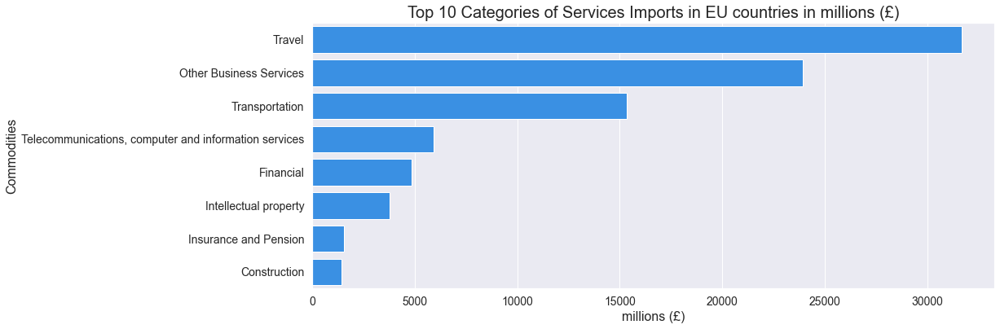

In [72]:
# Top 10 Categories of Services Imports in EU (2018 - 2019)
sns.barplot(y = 'Service type', x = 'Mean18', data = imp_SEU.sort_values(by='Mean18', ascending=False).head(8),
           color = "dodgerblue",ci=None)
plt.title('Top 10 Categories of Services Imports in EU countries in millions (£)', fontsize = 20)
sns.set(rc={"figure.figsize":(15, 6)})

plt.xticks(rotation = 0, fontsize = 14)
plt.yticks(rotation = 0,fontsize = 14)
plt.xlabel("millions (£)",fontsize = 16)
plt.ylabel("Commodities",fontsize = 16);

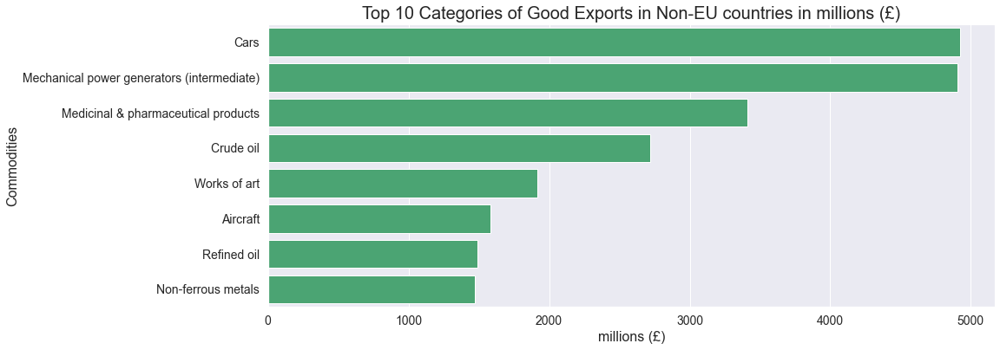

In [73]:
# Top 10 Categories of Good Exports in Non-EU countries (2018 - 2019)
sns.barplot(y = 'COMMODITY', x = 'Mean18', data = exp_GQ_RW.sort_values(by='Mean18', ascending=False).head(8),
           color = "mediumseagreen",ci=None)
plt.title('Top 10 Categories of Good Exports in Non-EU countries in millions (£)', fontsize = 20)
sns.set(rc={"figure.figsize":(15, 6)})

plt.xticks(rotation = 0, fontsize = 14)
plt.yticks(rotation = 0,fontsize = 14)
plt.xlabel("millions (£)",fontsize = 16)
plt.ylabel("Commodities",fontsize = 16);

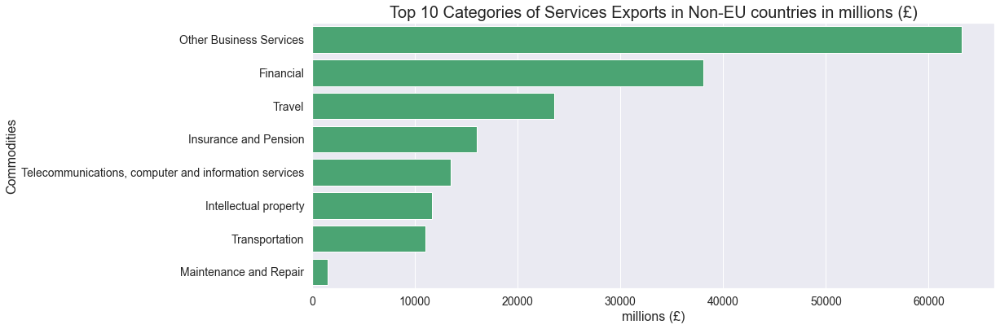

In [74]:
# Top 10 Categories of Services Exports in Non-EU countries (2018 - 2019)
sns.barplot(y = 'Service type', x = 'Mean18', data = exp_SRW.sort_values(by='Mean18', ascending=False).head(8),
           color = "mediumseagreen",ci=None)
plt.title('Top 10 Categories of Services Exports in Non-EU countries in millions (£)', fontsize = 20)
sns.set(rc={"figure.figsize":(15, 6)})

plt.xticks(rotation = 0, fontsize = 14)
plt.yticks(rotation = 0,fontsize = 14)
plt.xlabel("millions (£)",fontsize = 16)
plt.ylabel("Commodities",fontsize = 16);

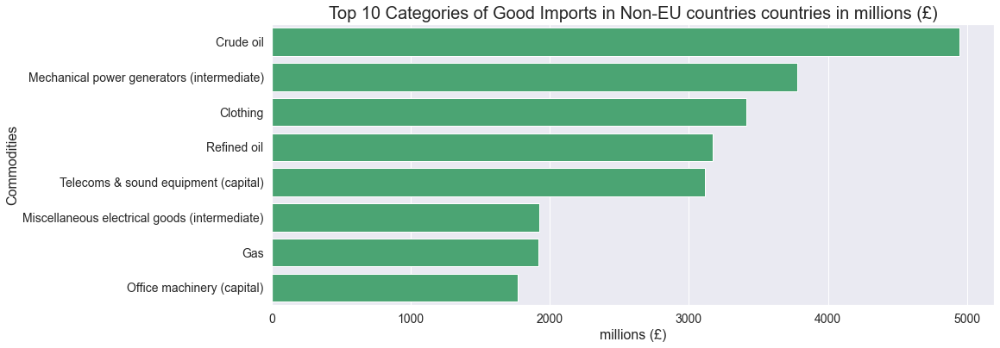

In [75]:
# Top 10 Categories of Good Imports in Non-EU countries (2018 - 2019)
sns.barplot(y = 'COMMODITY', x = 'Mean18', data = imp_GQ_RW.sort_values(by='Mean18', ascending=False).head(8),
           color = "mediumseagreen",ci=None)
plt.title('Top 10 Categories of Good Imports in Non-EU countries countries in millions (£)', fontsize = 20)
sns.set(rc={"figure.figsize":(15, 6)})

plt.xticks(rotation = 0, fontsize = 14)
plt.yticks(rotation = 0,fontsize = 14)
plt.xlabel("millions (£)",fontsize = 16)
plt.ylabel("Commodities",fontsize = 16);

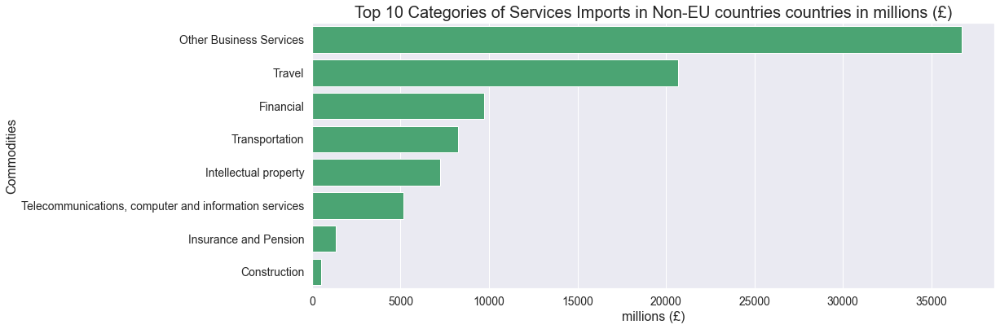

In [76]:
# Top 10 Categories of Services Imports in Non-EU countries (2018 - 2019)
sns.barplot(y = 'Service type', x = 'Mean18', data = imp_SRW.sort_values(by='Mean18', ascending=False).head(8),
           color = "mediumseagreen",ci=None)
plt.title('Top 10 Categories of Services Imports in Non-EU countries countries in millions (£)', fontsize = 20)
sns.set(rc={"figure.figsize":(15, 6)})

plt.xticks(rotation = 0, fontsize = 14)
plt.yticks(rotation = 0,fontsize = 14)
plt.xlabel("millions (£)",fontsize = 16)
plt.ylabel("Commodities",fontsize = 16);

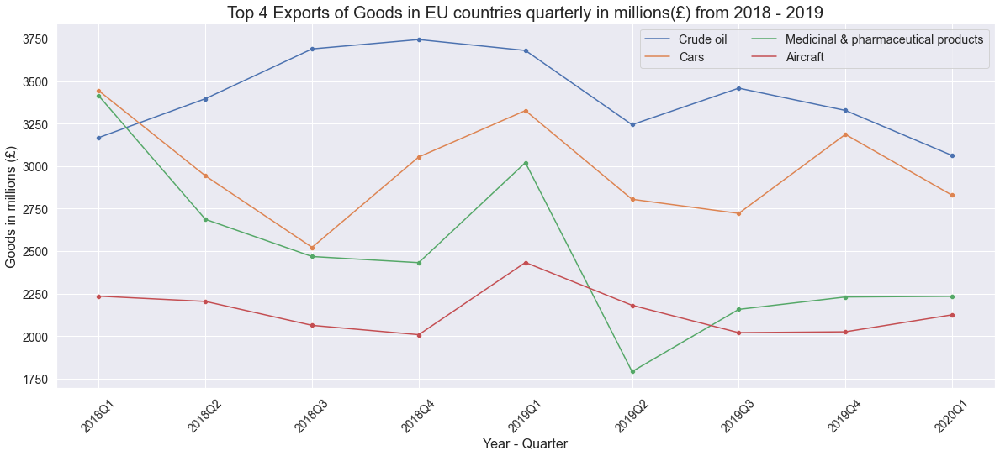

In [77]:
# Top 4 Exports of Goods in EU countries (2018 - 2019)

exp_GQ_EU_18 = exp_GQ_EU.iloc[:,[0,1,2,3,4,5,6,7,8,9,18]]
exp_GQ_EU_18 = exp_GQ_EU_18.sort_values(by='Mean18', ascending=False).head(4)
exp_GQ_EU_18 = exp_GQ_EU_18.transpose()
exp_GQ_EU_18 = exp_GQ_EU_18.reset_index(level=0)
exp_GQ_EU_18.columns = exp_GQ_EU_18.iloc[0]
exp_GQ_EU_18 = exp_GQ_EU_18.rename(columns = {'COMMODITY' : "Year"})
exp_GQ_EU_18 = exp_GQ_EU_18.tail(-1)
exp_GQ_EU_18 = exp_GQ_EU_18.head(-1)



# Plot the figure

fig, axes = plt.subplots(figsize=(20,8))
plt.title('Top 4 Exports of Goods in EU countries quarterly in millions(£) from 2018 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Crude oil' ,data = exp_GQ_EU_18)
sns.scatterplot(x = 'Year', y = 'Crude oil' ,data = exp_GQ_EU_18)
sns.lineplot(x = 'Year', y = 'Cars' ,data = exp_GQ_EU_18)
sns.scatterplot(x = 'Year', y = 'Cars' ,data = exp_GQ_EU_18)
sns.lineplot(x = 'Year', y = 'Medicinal & pharmaceutical products' ,data = exp_GQ_EU_18)
sns.scatterplot(x = 'Year', y = 'Medicinal & pharmaceutical products' ,data = exp_GQ_EU_18)
sns.lineplot(x = 'Year', y = 'Aircraft' ,data = exp_GQ_EU_18)
sns.scatterplot(x = 'Year', y = 'Aircraft' ,data = exp_GQ_EU_18)

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Goods in millions (£)",fontsize = 16);
plt.legend(labels=["Crude oil","Cars","Medicinal & pharmaceutical products","Aircraft"],
           fontsize = 'large',loc='best',ncol = 2);

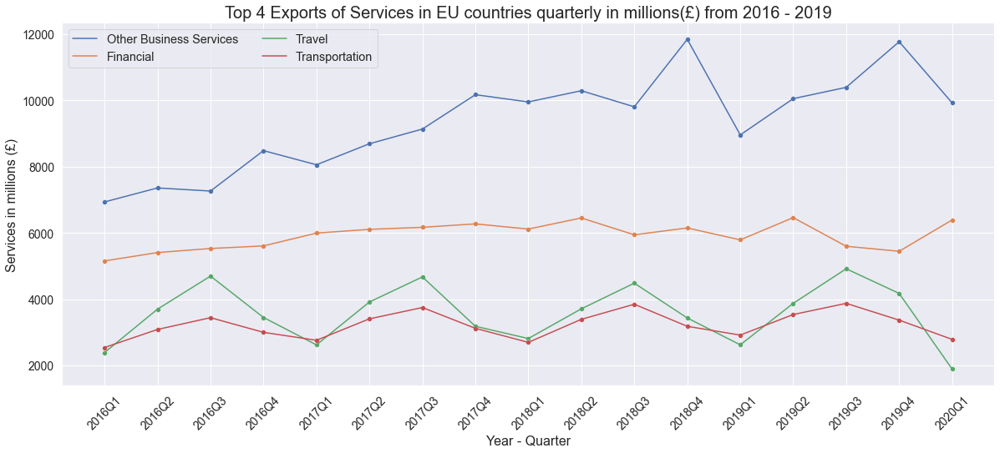

In [78]:
# Top 4 Exports of Services in EU countries (2016 - 2019)

exp_SEU_18 = exp_SEU.iloc[:,[0,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,32]] 
exp_SEU_18 = exp_SEU_18.sort_values(by='Mean18', ascending=False).head(4)
exp_SEU_18 = exp_SEU_18.transpose()
exp_SEU_18 = exp_SEU_18.reset_index(level=0)
exp_SEU_18.columns = exp_SEU_18.iloc[0]
exp_SEU_18 = exp_SEU_18.rename(columns = {'Service type' : "Year"})
exp_SEU_18 = exp_SEU_18.tail(-1)
exp_SEU_18 = exp_SEU_18.head(-1)



# Plot the figure

fig, axes = plt.subplots(figsize=(20,8))
plt.title('Top 4 Exports of Services in EU countries quarterly in millions(£) from 2016 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Other Business Services' ,data = exp_SEU_18)
sns.scatterplot(x = 'Year', y = 'Other Business Services' ,data = exp_SEU_18)
sns.lineplot(x = 'Year', y = 'Financial' ,data = exp_SEU_18)
sns.scatterplot(x = 'Year', y = 'Financial' ,data = exp_SEU_18)
sns.lineplot(x = 'Year', y = 'Travel' ,data = exp_SEU_18)
sns.scatterplot(x = 'Year', y = 'Travel' ,data = exp_SEU_18)
sns.lineplot(x = 'Year', y = 'Transportation' ,data = exp_SEU_18)
sns.scatterplot(x = 'Year', y = 'Transportation' ,data = exp_SEU_18)

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Services in millions (£)",fontsize = 16);
plt.legend(labels=["Other Business Services","Financial","Travel","Transportation"],
           fontsize = 'large',loc='best',ncol = 2);

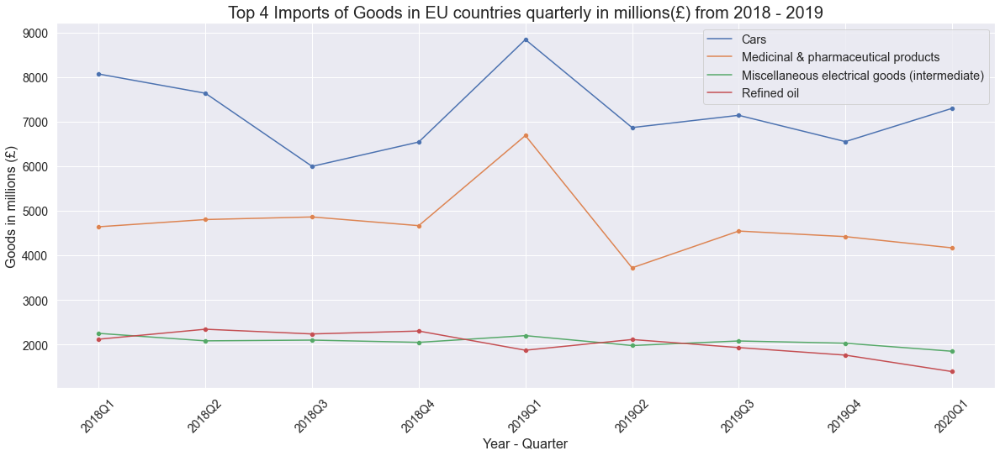

In [79]:
# Top 4 Imports of Goods in EU countries (2018 - 2019)

imp_GQ_EU_18 = imp_GQ_EU.iloc[:,[0,1,2,3,4,5,6,7,8,9,18]]
imp_GQ_EU_18 = imp_GQ_EU_18.sort_values(by='Mean18', ascending=False).head(4)
imp_GQ_EU_18 = imp_GQ_EU_18.transpose()
imp_GQ_EU_18 = imp_GQ_EU_18.reset_index(level=0)
imp_GQ_EU_18.columns = imp_GQ_EU_18.iloc[0]
imp_GQ_EU_18 = imp_GQ_EU_18.rename(columns = {'COMMODITY' : "Year"})
imp_GQ_EU_18 = imp_GQ_EU_18.tail(-1)
imp_GQ_EU_18 = imp_GQ_EU_18.head(-1)



# Plot the figure

fig, axes = plt.subplots(figsize=(20,8))
plt.title('Top 4 Imports of Goods in EU countries quarterly in millions(£) from 2018 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Cars' ,data = imp_GQ_EU_18)
sns.scatterplot(x = 'Year', y = 'Cars' ,data = imp_GQ_EU_18)
sns.lineplot(x = 'Year', y = 'Medicinal & pharmaceutical products' ,data = imp_GQ_EU_18)
sns.scatterplot(x = 'Year', y = 'Medicinal & pharmaceutical products' ,data = imp_GQ_EU_18)
sns.lineplot(x = 'Year', y = 'Miscellaneous electrical goods (intermediate)' ,data = imp_GQ_EU_18)
sns.scatterplot(x = 'Year', y = 'Miscellaneous electrical goods (intermediate)' ,data = imp_GQ_EU_18)
sns.lineplot(x = 'Year', y = 'Refined oil' ,data = imp_GQ_EU_18)
sns.scatterplot(x = 'Year', y = 'Refined oil' ,data = imp_GQ_EU_18)

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Goods in millions (£)",fontsize = 16);
plt.legend(labels=["Cars","Medicinal & pharmaceutical products","Miscellaneous electrical goods (intermediate)",
                   "Refined oil"],fontsize = 'large',loc='best',ncol = 1);



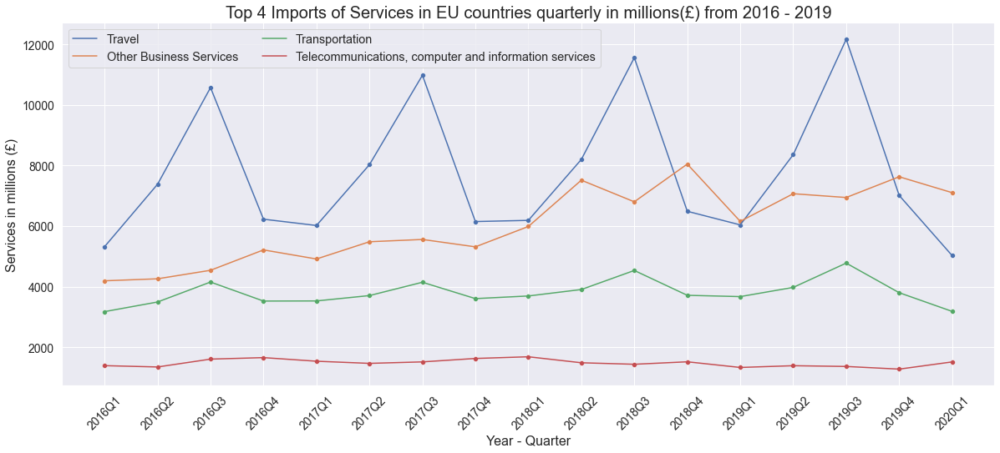

In [80]:
# Top 4 Imports of Services in EU countries (2016 - 2019)

imp_SEU_18 = imp_SEU.iloc[:,[0,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,32]] 
imp_SEU_18 = imp_SEU_18.sort_values(by='Mean18', ascending=False).head(4)
imp_SEU_18 = imp_SEU_18.transpose()
imp_SEU_18 = imp_SEU_18.reset_index(level=0)
imp_SEU_18.columns = imp_SEU_18.iloc[0]
imp_SEU_18 = imp_SEU_18.rename(columns = {'Service type' : "Year"})
imp_SEU_18 = imp_SEU_18.tail(-1)
imp_SEU_18 = imp_SEU_18.head(-1)



# Plot the figure

fig, axes = plt.subplots(figsize=(20,8))
plt.title('Top 4 Imports of Services in EU countries quarterly in millions(£) from 2016 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Travel' ,data = imp_SEU_18)
sns.scatterplot(x = 'Year', y = 'Travel' ,data = imp_SEU_18)
sns.lineplot(x = 'Year', y = 'Other Business Services' ,data = imp_SEU_18)
sns.scatterplot(x = 'Year', y = 'Other Business Services' ,data = imp_SEU_18)
sns.lineplot(x = 'Year', y = 'Transportation' ,data = imp_SEU_18)
sns.scatterplot(x = 'Year', y = 'Transportation' ,data = imp_SEU_18)
sns.lineplot(x = 'Year', y = 'Telecommunications, computer and information services' ,data = imp_SEU_18)
sns.scatterplot(x = 'Year', y = 'Telecommunications, computer and information services' ,data = imp_SEU_18)

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Services in millions (£)",fontsize = 16);
plt.legend(labels=["Travel","Other Business Services","Transportation","Telecommunications, computer and information services"],
           fontsize = 'large',loc='best',ncol = 2);

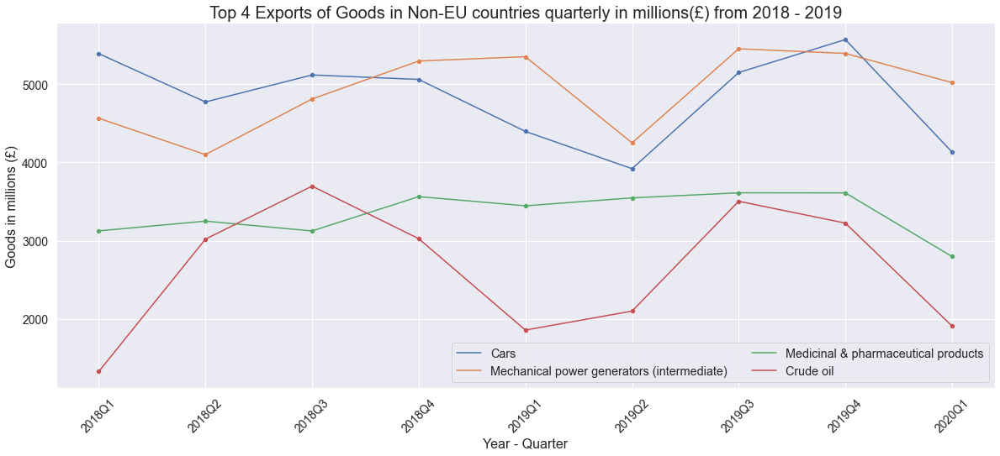

In [81]:
# Top 4 Exports of Goods in Non-EU countries (2018 - 2019)

exp_GQ_RW_18 = exp_GQ_RW.iloc[:,[0,1,2,3,4,5,6,7,8,9,18]]
exp_GQ_RW_18 = exp_GQ_RW_18.sort_values(by='Mean18', ascending=False).head(4)
exp_GQ_RW_18 = exp_GQ_RW_18.transpose()
exp_GQ_RW_18 = exp_GQ_RW_18.reset_index(level=0)
exp_GQ_RW_18.columns = exp_GQ_RW_18.iloc[0]
exp_GQ_RW_18 = exp_GQ_RW_18.rename(columns = {'COMMODITY' : "Year"})
exp_GQ_RW_18 = exp_GQ_RW_18.tail(-1)
exp_GQ_RW_18 = exp_GQ_RW_18.head(-1)



# Plot the figure

fig, axes = plt.subplots(figsize=(20,8))
plt.title('Top 4 Exports of Goods in Non-EU countries quarterly in millions(£) from 2018 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Cars' ,data = exp_GQ_RW_18)
sns.scatterplot(x = 'Year', y = 'Cars' ,data = exp_GQ_RW_18)
sns.lineplot(x = 'Year', y = 'Mechanical power generators (intermediate)' ,data = exp_GQ_RW_18)
sns.scatterplot(x = 'Year', y = 'Mechanical power generators (intermediate)' ,data = exp_GQ_RW_18)
sns.lineplot(x = 'Year', y = 'Medicinal & pharmaceutical products' ,data = exp_GQ_RW_18)
sns.scatterplot(x = 'Year', y = 'Medicinal & pharmaceutical products' ,data = exp_GQ_RW_18)
sns.lineplot(x = 'Year', y = 'Crude oil' ,data = exp_GQ_RW_18)
sns.scatterplot(x = 'Year', y = 'Crude oil' ,data = exp_GQ_RW_18)

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Goods in millions (£)",fontsize = 16);
plt.legend(labels=["Cars","Mechanical power generators (intermediate)","Medicinal & pharmaceutical products","Crude oil"],
           fontsize = 'large',loc='best',ncol = 2);

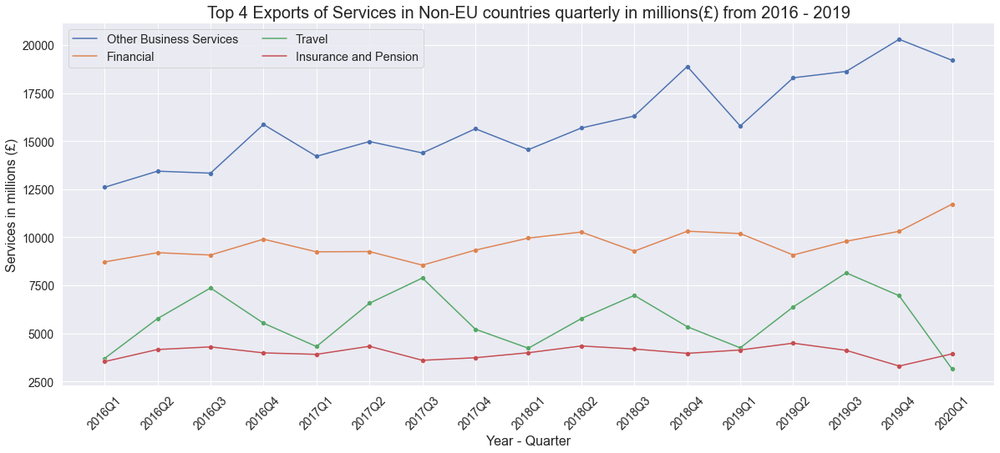

In [82]:
# Top 4 Exports of Services in Non-EU countries (2016 - 2019)

exp_SRW_18 = exp_SRW.iloc[:,[0,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,32]] 
exp_SRW_18 = exp_SRW_18.sort_values(by='Mean18', ascending=False).head(4)
exp_SRW_18 = exp_SRW_18.transpose()
exp_SRW_18 = exp_SRW_18.reset_index(level=0)
exp_SRW_18.columns = exp_SRW_18.iloc[0]
exp_SRW_18 = exp_SRW_18.rename(columns = {'Service type' : "Year"})
exp_SRW_18 = exp_SRW_18.tail(-1)
exp_SRW_18 = exp_SRW_18.head(-1)



# Plot the figure

fig, axes = plt.subplots(figsize=(20,8))
plt.title('Top 4 Exports of Services in Non-EU countries quarterly in millions(£) from 2016 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Other Business Services' ,data = exp_SRW_18)
sns.scatterplot(x = 'Year', y = 'Other Business Services' ,data = exp_SRW_18)
sns.lineplot(x = 'Year', y = 'Financial' ,data = exp_SRW_18)
sns.scatterplot(x = 'Year', y = 'Financial' ,data = exp_SRW_18)
sns.lineplot(x = 'Year', y = 'Travel' ,data = exp_SRW_18)
sns.scatterplot(x = 'Year', y = 'Travel' ,data = exp_SRW_18)
sns.lineplot(x = 'Year', y = 'Insurance and Pension' ,data = exp_SRW_18)
sns.scatterplot(x = 'Year', y = 'Insurance and Pension' ,data = exp_SRW_18)

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Services in millions (£)",fontsize = 16);
plt.legend(labels=["Other Business Services","Financial","Travel","Insurance and Pension"],
           fontsize = 'large',loc='best',ncol = 2);

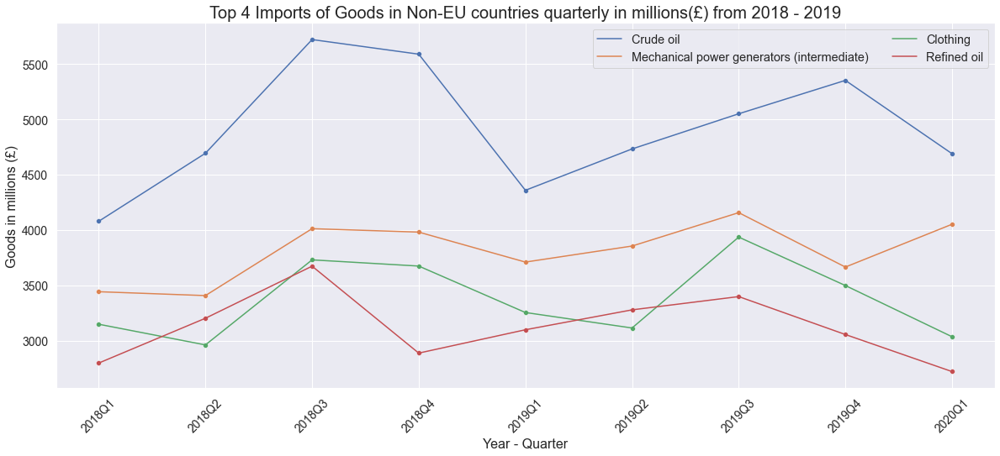

In [83]:
# Top 4 Imports of Goods in Non-EU countries (2018 - 2019)

imp_GQ_RW_18 = imp_GQ_RW.iloc[:,[0,1,2,3,4,5,6,7,8,9,18]]
imp_GQ_RW_18 = imp_GQ_RW_18.sort_values(by='Mean18', ascending=False).head(4)
imp_GQ_RW_18 = imp_GQ_RW_18.transpose()
imp_GQ_RW_18 = imp_GQ_RW_18.reset_index(level=0)
imp_GQ_RW_18.columns = imp_GQ_RW_18.iloc[0]
imp_GQ_RW_18 = imp_GQ_RW_18.rename(columns = {'COMMODITY' : "Year"})
imp_GQ_RW_18 = imp_GQ_RW_18.tail(-1)
imp_GQ_RW_18 = imp_GQ_RW_18.head(-1)




# Plot the figure

fig, axes = plt.subplots(figsize=(20,8))
plt.title('Top 4 Imports of Goods in Non-EU countries quarterly in millions(£) from 2018 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Crude oil' ,data = imp_GQ_RW_18)
sns.scatterplot(x = 'Year', y = 'Crude oil' ,data = imp_GQ_RW_18)
sns.lineplot(x = 'Year', y = 'Mechanical power generators (intermediate)' ,data = imp_GQ_RW_18)
sns.scatterplot(x = 'Year', y = 'Mechanical power generators (intermediate)' ,data = imp_GQ_RW_18)
sns.lineplot(x = 'Year', y = 'Clothing' ,data = imp_GQ_RW_18)
sns.scatterplot(x = 'Year', y = 'Clothing' ,data = imp_GQ_RW_18)
sns.lineplot(x = 'Year', y = 'Refined oil' ,data = imp_GQ_RW_18)
sns.scatterplot(x = 'Year', y = 'Refined oil' ,data = imp_GQ_RW_18)

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Goods in millions (£)",fontsize = 16);
plt.legend(labels=["Crude oil","Mechanical power generators (intermediate)","Clothing",
                   "Refined oil"],fontsize = 'large',loc='best',ncol = 2);


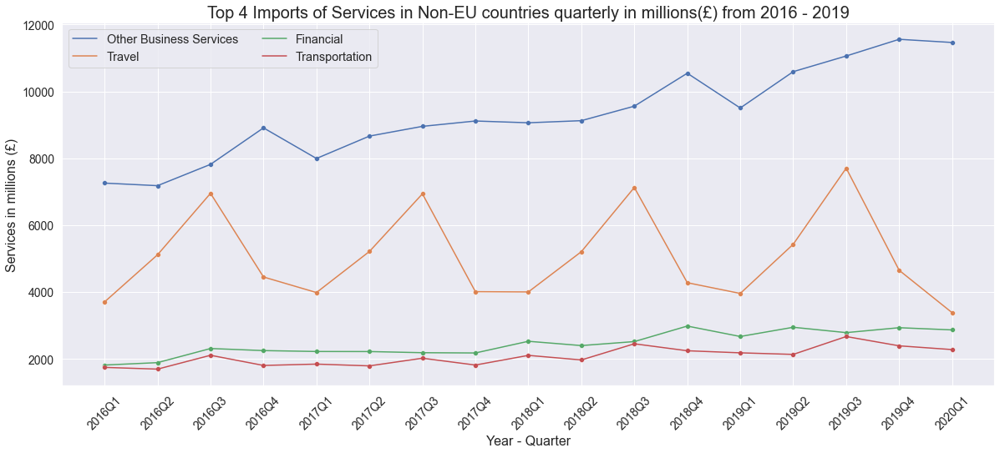

In [84]:
# Top 4 Imports of Services in Non-EU countries (2016 - 2019)

imp_SRW_18 = imp_SRW.iloc[:,[0,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,32]] 
imp_SRW_18 = imp_SRW_18.sort_values(by='Mean18', ascending=False).head(4)
imp_SRW_18 = imp_SRW_18.transpose()
imp_SRW_18 = imp_SRW_18.reset_index(level=0)
imp_SRW_18.columns = imp_SRW_18.iloc[0]
imp_SRW_18 = imp_SRW_18.rename(columns = {'Service type' : "Year"})
imp_SRW_18 = imp_SRW_18.tail(-1)
imp_SRW_18 = imp_SRW_18.head(-1)



# Plot the figure

fig, axes = plt.subplots(figsize=(20,8))
plt.title('Top 4 Imports of Services in Non-EU countries quarterly in millions(£) from 2016 - 2019', size = 20)


sns.lineplot(x = 'Year', y = 'Other Business Services' ,data = imp_SRW_18)
sns.scatterplot(x = 'Year', y = 'Other Business Services' ,data = imp_SRW_18)
sns.lineplot(x = 'Year', y = 'Travel' ,data = imp_SRW_18)
sns.scatterplot(x = 'Year', y = 'Travel' ,data = imp_SRW_18)
sns.lineplot(x = 'Year', y = 'Financial' ,data = imp_SRW_18)
sns.scatterplot(x = 'Year', y = 'Financial' ,data = imp_SRW_18)
sns.lineplot(x = 'Year', y = 'Transportation' ,data = imp_SRW_18)
sns.scatterplot(x = 'Year', y = 'Transportation' ,data = imp_SRW_18)

plt.xticks(rotation = 45, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Year - Quarter",fontsize = 16)
plt.ylabel("Services in millions (£)",fontsize = 16);
plt.legend(labels=["Other Business Services","Travel","Financial","Transportation"],
           fontsize = 'large',loc='best',ncol = 2);

14) Analysis of the period from the day that Brexit happened until today (2020 - 2021)

In [85]:
# Top Countries Export Goods (2020 - 2021)
expGA.iloc[:,[0,22,23]].sort_values(by='2021', ascending=False).head(10)

,Country,2020,2021
224,United States inc Puerto Rico,45973.0,47098.0
10,Germany,32635.0,29595.0
19,Netherlands,20160.0,27085.0
13,Ireland,21923.0,21834.0
9,France,18786.0,19441.0
70,China,18049.0,18793.0
1,Belgium,10701.0,14939.0
206,Switzerland,12101.0,10309.0
14,Italy,8726.0,9112.0
25,Spain,8148.0,7878.0


In [86]:
# Top Countries Export Services (2020 - 2021)
expSA.iloc[:,[0,22,23]].sort_values(by='2021', ascending=False).head(10)

,Country,2020,2021
226,United States inc Puerto Rico,82709.0,85102.0
13,Ireland,17461.0,19491.0
10,Germany,17020.0,16988.0
19,Netherlands,15607.0,14870.0
9,France,12778.0,12246.0
208,Switzerland,12236.0,12146.0
72,China,8127.0,8168.0
17,Luxembourg,6386.0,8086.0
66,Canada,5790.0,6077.0
192,Singapore,5450.0,5676.0


In [87]:
# Top Countries Import Goods (2020 - 2021)
impGA.iloc[:,[0,22,23]].sort_values(by='2021', ascending=False).head(10)

,Country,2020,2021
311,China,54801.0,63557.0
251,Germany,56853.0,53759.0
465,United States inc Puerto Rico,37323.0,39379.0
260,Netherlands,36466.0,31786.0
409,Norway,11246.0,27112.0
242,Belgium,23266.0,23331.0
250,France,24389.0,23128.0
255,Italy,17540.0,17604.0
266,Spain,14988.0,14472.0
254,Ireland,13420.0,13861.0


In [88]:
# Top Countries Import Services (2020 - 2021)
impSA.iloc[:,[0,22,23]].sort_values(by='2021', ascending=False).head(10)

,Country,2020,2021
470,United States inc Puerto Rico,38738.0,43657.0
253,France,11154.0,10607.0
254,Germany,9364.0,8896.0
269,Spain,7243.0,7964.0
361,India,5558.0,7479.0
452,Switzerland,4870.0,6279.0
257,Ireland,7991.0,6207.0
263,Netherlands,5967.0,6159.0
261,Luxembourg,4484.0,4871.0
370,Jersey,3406.0,4220.0


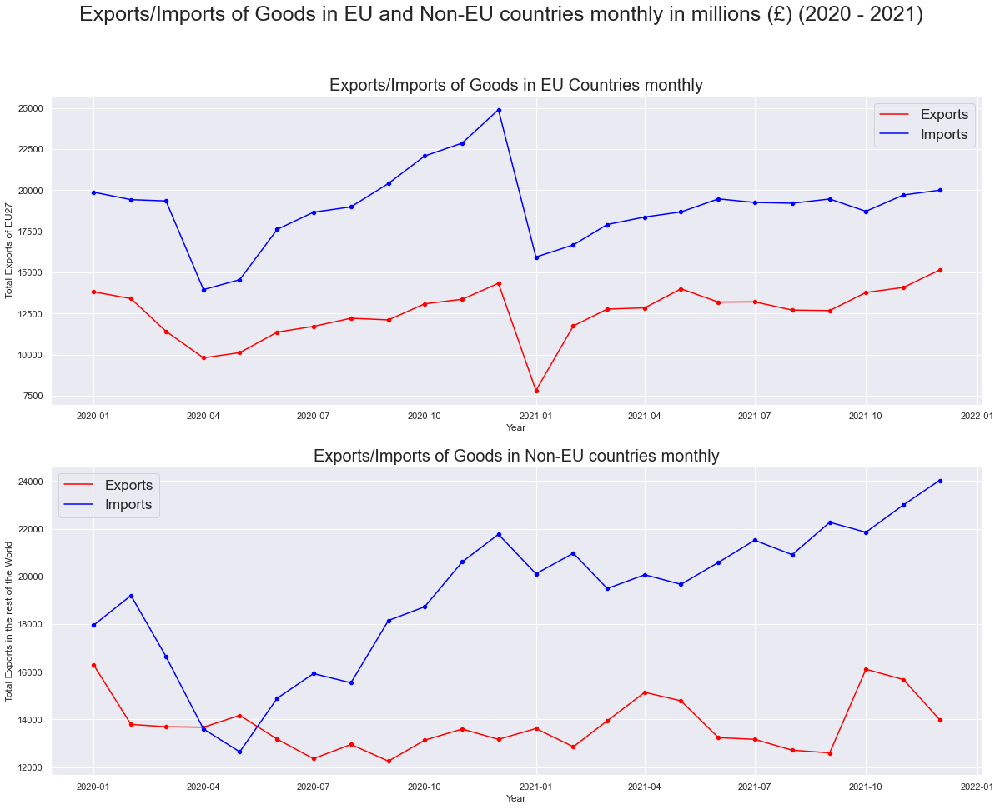

In [89]:
# Plot the Exports/Imports of Goods in EU and Non-EU countries monthly (2020 - 2021)
fig, axes = plt.subplots(2, 1, figsize=(20, 15))
fig.suptitle('Exports/Imports of Goods in EU and Non-EU countries monthly in millions (£) (2020 - 2021)', fontsize = 25)


sns.lineplot(ax=axes[0],x = 'Year', y = 'Total Exports of EU27' ,data = expGM_TEU.iloc[276:300],color = 'red')
sns.scatterplot(ax=axes[0],x = 'Year', y = 'Total Exports of EU27' ,data = expGM_TEU.iloc[276:300],color = 'red')
sns.lineplot(ax=axes[0],x = 'Year', y = 'Total Imports of EU27' ,data = impGM_TEU.iloc[276:300],color = 'blue')
sns.scatterplot(ax=axes[0],x = 'Year', y = 'Total Imports of EU27' ,data = impGM_TEU.iloc[276:300],color = 'blue')
axes[0].set_title('Exports/Imports of Goods in EU Countries monthly', fontsize = 20)
axes[0].legend(labels=["Exports","Imports"],fontsize = 'x-large')
sns.set_style("darkgrid")


sns.lineplot(ax=axes[1],x = 'Year', y = 'Total Exports in the rest of the World' ,data = expGM_TRest.iloc[276:300], color = 'red')
sns.scatterplot(ax=axes[1],x = 'Year', y = 'Total Exports in the rest of the World' ,data = expGM_TRest.iloc[276:300], color = 'red')
sns.lineplot(ax=axes[1],x = 'Year', y = 'Total Imports in the rest of the World' ,data = impGM_TRest.iloc[276:300],color = 'blue')
sns.scatterplot(ax=axes[1],x = 'Year', y = 'Total Imports in the rest of the World' ,data = impGM_TRest.iloc[276:300],color = 'blue')
axes[1].set_title('Exports/Imports of Goods in Non-EU countries monthly', fontsize = 20)
axes[1].legend(labels=["Exports","Imports"],fontsize = 'x-large')
sns.set_style("darkgrid")


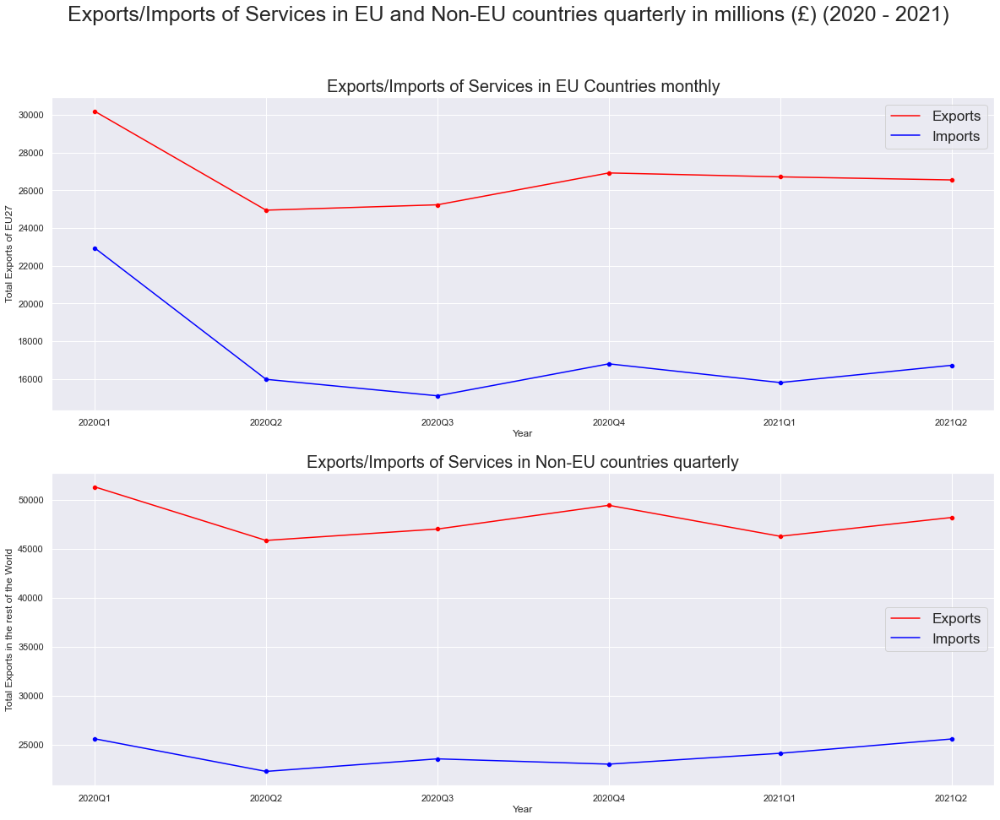

In [90]:
# Plot the Exports/Imports of Services in EU and Non-EU countries quarterly (2020 - 2021)
fig, axes = plt.subplots(2, 1, figsize=(20, 15))
fig.suptitle('Exports/Imports of Services in EU and Non-EU countries quarterly in millions (£) (2020 - 2021)', fontsize = 25)


sns.lineplot(ax=axes[0],x = 'Year', y = 'Total Exports of EU27' ,data = expSQ_TEU.iloc[16:22],color = 'red')
sns.scatterplot(ax=axes[0],x = 'Year', y = 'Total Exports of EU27' ,data = expSQ_TEU.iloc[16:22],color = 'red')
sns.lineplot(ax=axes[0],x = 'Year', y = 'Total Imports of EU27' ,data = impSQ_TEU.iloc[16:22],color = 'blue')
sns.scatterplot(ax=axes[0],x = 'Year', y = 'Total Imports of EU27' ,data = impSQ_TEU.iloc[16:22],color = 'blue')
axes[0].set_title('Exports/Imports of Services in EU Countries monthly', fontsize = 20)
axes[0].legend(labels=["Exports","Imports"],fontsize = 'x-large')
sns.set_style("darkgrid")


sns.lineplot(ax=axes[1],x = 'Year', y = 'Total Exports in the rest of the World' ,data = expSQ_TRest.iloc[16:22], color = 'red')
sns.scatterplot(ax=axes[1],x = 'Year', y = 'Total Exports in the rest of the World' ,data = expSQ_TRest.iloc[16:22], color = 'red')
sns.lineplot(ax=axes[1],x = 'Year', y = 'Total Imports in the rest of the World' ,data = impSQ_TRest.iloc[16:22],color = 'blue')
sns.scatterplot(ax=axes[1],x = 'Year', y = 'Total Imports in the rest of the World' ,data = impSQ_TRest.iloc[16:22],color = 'blue')
axes[1].set_title('Exports/Imports of Services in Non-EU countries quarterly', fontsize = 20)
axes[1].legend(labels=["Exports","Imports"],fontsize = 'x-large')
sns.set_style("darkgrid")

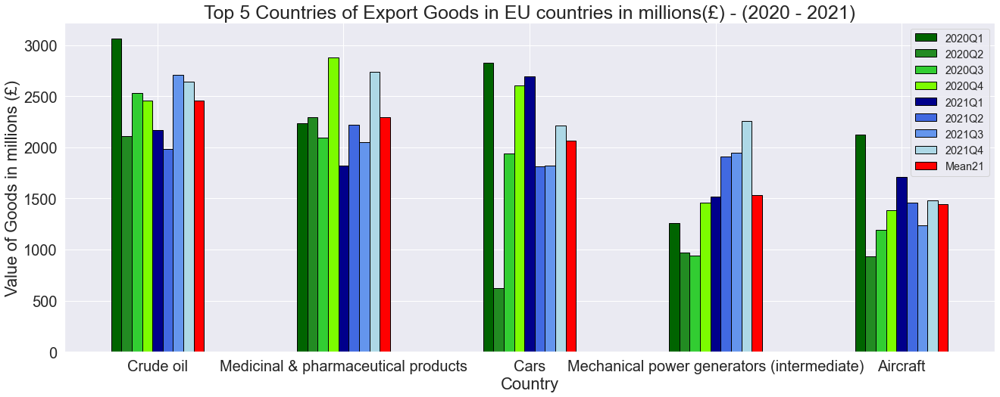

In [91]:
# Plot Top 5 Countries of Export Goods in EU countries (2020-2021)


exp_GQ_EU.iloc[:,[0,9,10,11,12,13,14,15,16,19]].sort_values(by='Mean21', ascending=False).head(5).plot.bar(x = 'COMMODITY',rot=0, edgecolor = 'black',
                                                 color = ["darkgreen","forestgreen","limegreen","lawngreen",
                                                         "darkblue","royalblue","cornflowerblue","lightblue","red"],figsize=(22,8))

plt.title('Top 5 Countries of Export Goods in EU countries in millions(£) - (2020 - 2021)', size = 25)
plt.xticks(rotation = 0, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Country",fontsize = 22)
plt.ylabel("Value of Goods in millions (£)",fontsize = 22);
plt.legend(fontsize = 'large');

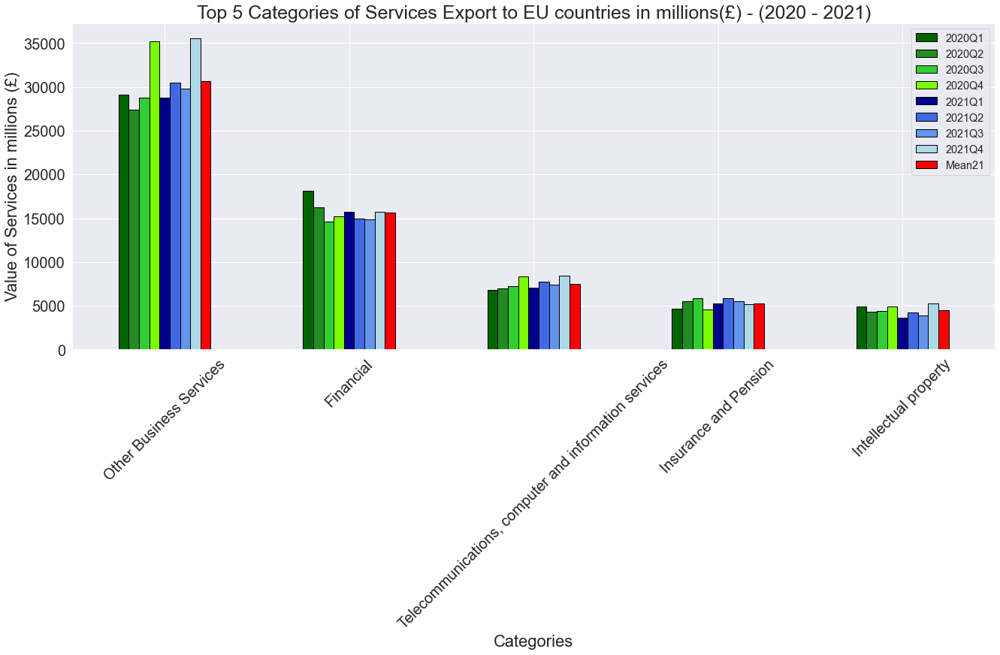

In [92]:
# Plot Top 5 Categories of Services Export to EU countries (2020-2021)



exp_SWW.iloc[:,[0,23,24,25,26,27,28,29,30,33]].sort_values(by='Mean21', ascending=False).head(5).plot.bar(x = 'Service type',rot=0, edgecolor = 'black',
                                                 color = ["darkgreen","forestgreen","limegreen","lawngreen",
                                                         "darkblue","royalblue","cornflowerblue","lightblue","red"],figsize=(22,8))

plt.title('Top 5 Categories of Services Export to EU countries in millions(£) - (2020 - 2021)', size = 25)
plt.xticks(rotation = 45, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Categories",fontsize = 22)
plt.ylabel("Value of Services in millions (£)",fontsize = 22);
plt.legend(fontsize = 'large');

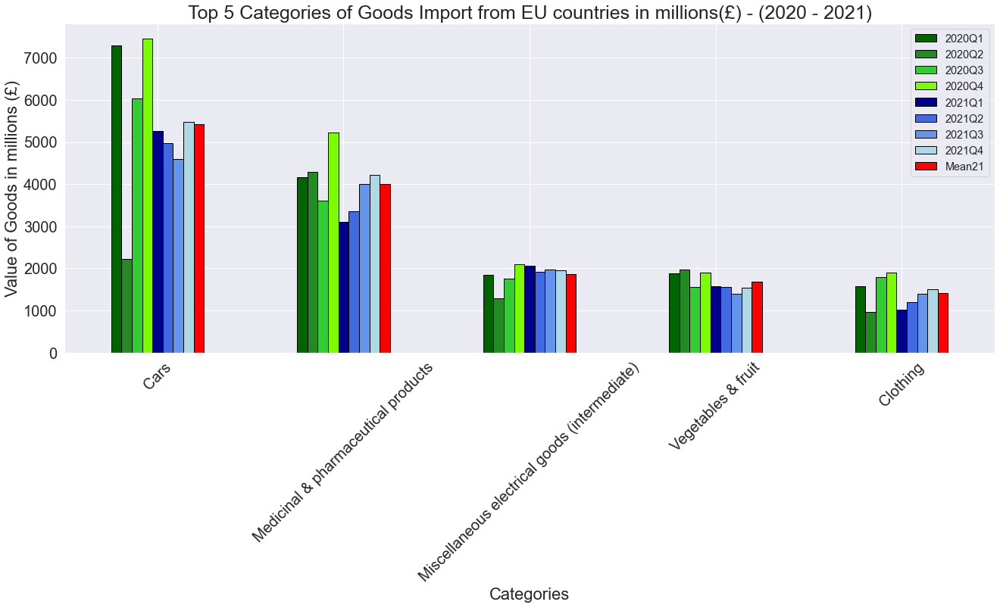

In [93]:
# Plot Top 5 Categories of Goods Import from EU countries (2020-2021)



imp_GQ_EU.iloc[:,[0,9,10,11,12,13,14,15,16,19]].sort_values(by='Mean21', ascending=False).head(5).plot.bar(x = 'COMMODITY',rot=0, edgecolor = 'black',
                                                 color = ["darkgreen","forestgreen","limegreen","lawngreen",
                                                         "darkblue","royalblue","cornflowerblue","lightblue","red"],figsize=(22,8))

plt.title('Top 5 Categories of Goods Import from EU countries in millions(£) - (2020 - 2021)', size = 25)
plt.xticks(rotation = 45, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Categories",fontsize = 22)
plt.ylabel("Value of Goods in millions (£)",fontsize = 22);
plt.legend(fontsize = 'large');

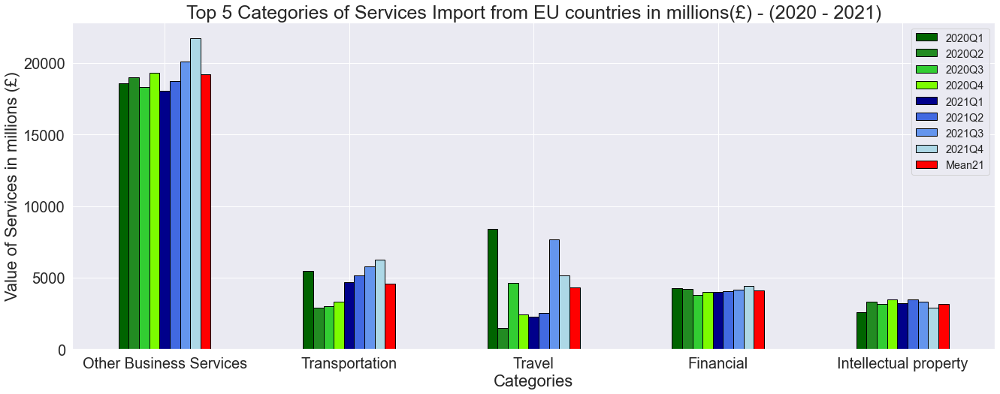

In [94]:
# Plot Top 5 Categories of Services Import from EU countries (2020-2021)



imp_SWW.iloc[:,[0,23,24,25,26,27,28,29,30,33]].sort_values(by='Mean21', ascending=False).head(5).plot.bar(x = 'Service type',rot=0, edgecolor = 'black',
                                                 color = ["darkgreen","forestgreen","limegreen","lawngreen",
                                                         "darkblue","royalblue","cornflowerblue","lightblue","red"],figsize=(22,8))

plt.title('Top 5 Categories of Services Import from EU countries in millions(£) - (2020 - 2021)', size = 25)
plt.xticks(rotation = 0, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Categories",fontsize = 22)
plt.ylabel("Value of Services in millions (£)",fontsize = 22);
plt.legend(fontsize = 'large');

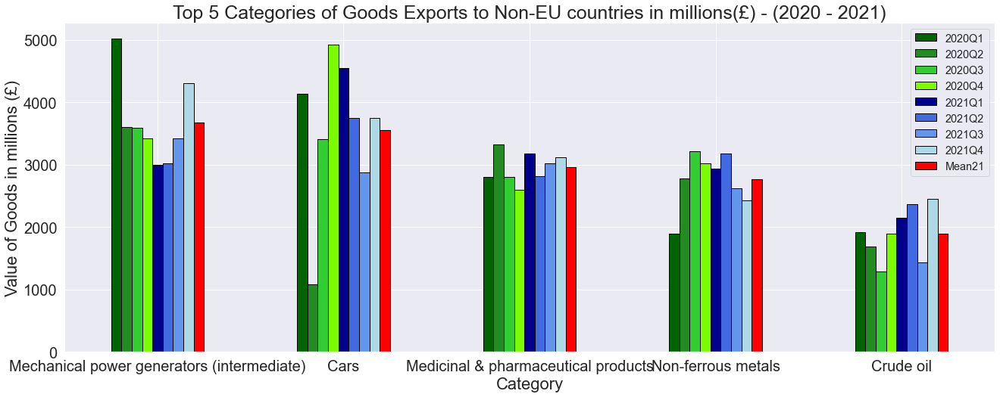

In [95]:
# Plot Top 5 Categories of Goods Exports to Non-EU countries (2020-2021)



exp_GQ_RW.iloc[:,[0,9,10,11,12,13,14,15,16,19]].sort_values(by='Mean21', ascending=False).head(5).plot.bar(x = 'COMMODITY',rot=0, edgecolor = 'black',
                                                 color = ["darkgreen","forestgreen","limegreen","lawngreen",
                                                         "darkblue","royalblue","cornflowerblue","lightblue","red"],figsize=(22,8))

plt.title('Top 5 Categories of Goods Exports to Non-EU countries in millions(£) - (2020 - 2021)', size = 25)
plt.xticks(rotation = 0, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Category",fontsize = 22)
plt.ylabel("Value of Goods in millions (£)",fontsize = 22);
plt.legend(fontsize = 'large');

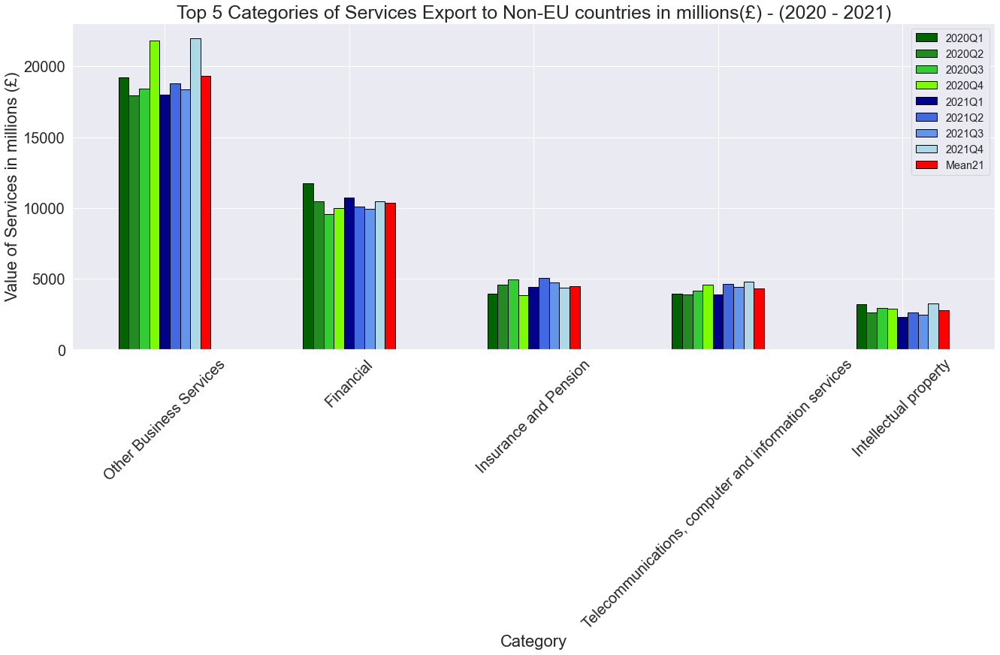

In [96]:
# Plot Top 5 Categories of Services Export to Non-EU countries (2020-2021)



exp_SRW.iloc[:,[0,23,24,25,26,27,28,29,30,33]].sort_values(by='Mean21', ascending=False).head(5).plot.bar(x = 'Service type',rot=0, edgecolor = 'black',
                                                 color = ["darkgreen","forestgreen","limegreen","lawngreen",
                                                         "darkblue","royalblue","cornflowerblue","lightblue","red"],figsize=(22,8))

plt.title('Top 5 Categories of Services Export to Non-EU countries in millions(£) - (2020 - 2021)', size = 25)
plt.xticks(rotation = 45, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Category",fontsize = 22)
plt.ylabel("Value of Services in millions (£)",fontsize = 22);
plt.legend(fontsize = 'large');

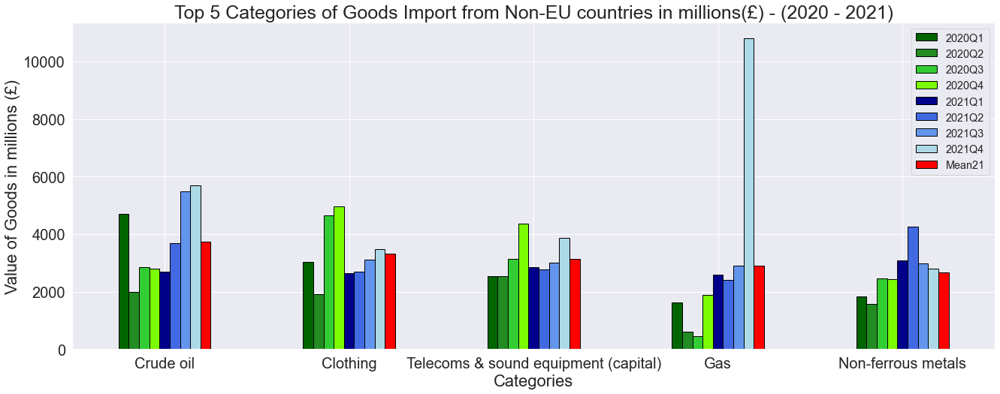

In [97]:
# Plot Top 5 Categories of Goods Import from Non-EU countries (2020-2021)



imp_GQ_RW.iloc[:,[0,9,10,11,12,13,14,15,16,19]].sort_values(by='Mean21', ascending=False).head(5).plot.bar(x = 'COMMODITY',rot=0, edgecolor = 'black',
                                                 color = ["darkgreen","forestgreen","limegreen","lawngreen",
                                                         "darkblue","royalblue","cornflowerblue","lightblue","red"],figsize=(22,8))

plt.title('Top 5 Categories of Goods Import from Non-EU countries in millions(£) - (2020 - 2021)', size = 25)
plt.xticks(rotation = 0, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Categories",fontsize = 22)
plt.ylabel("Value of Goods in millions (£)",fontsize = 22);
plt.legend(fontsize = 'large');

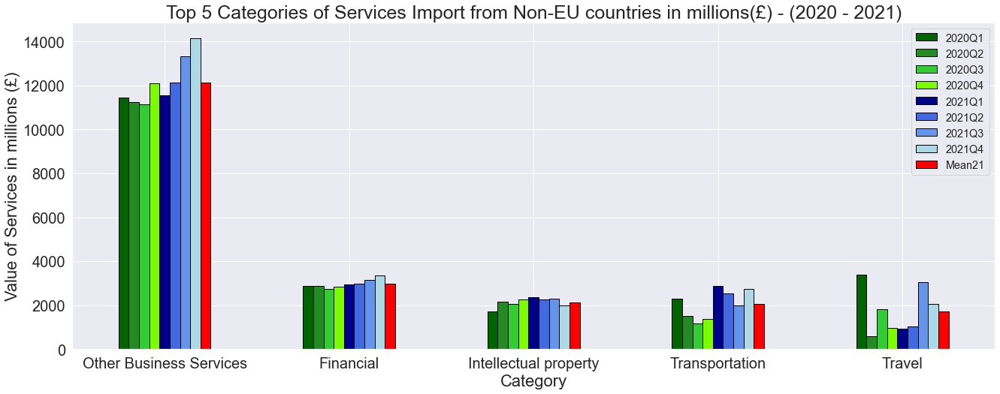

In [98]:
# Plot Top 5 Categories of Services Import from Non-EU countries (2020-2021)


imp_SRW.iloc[:,[0,23,24,25,26,27,28,29,30,33]].sort_values(by='Mean21', ascending=False).head(5).plot.bar(x = 'Service type',rot=0, edgecolor = 'black',
                                                 color = ["darkgreen","forestgreen","limegreen","lawngreen",
                                                         "darkblue","royalblue","cornflowerblue","lightblue","red"],figsize=(22,8))

plt.title('Top 5 Categories of Services Import from Non-EU countries in millions(£) - (2020 - 2021)', size = 25)
plt.xticks(rotation = 0, fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Category",fontsize = 22)
plt.ylabel("Value of Services in millions (£)",fontsize = 22);
plt.legend(fontsize = 'large');

15) Predictions if the Brexit never happened

15.a) Exports in Services (Worldwide)

In [99]:
# Export in Services Monthly 

predWW_S1 = ES_WW_M.iloc[:228]
predWW_S1 = predWW_S1.set_index('Year')
predWW_S1 = predWW_S1.astype({'Total Exports in the World':'int'})

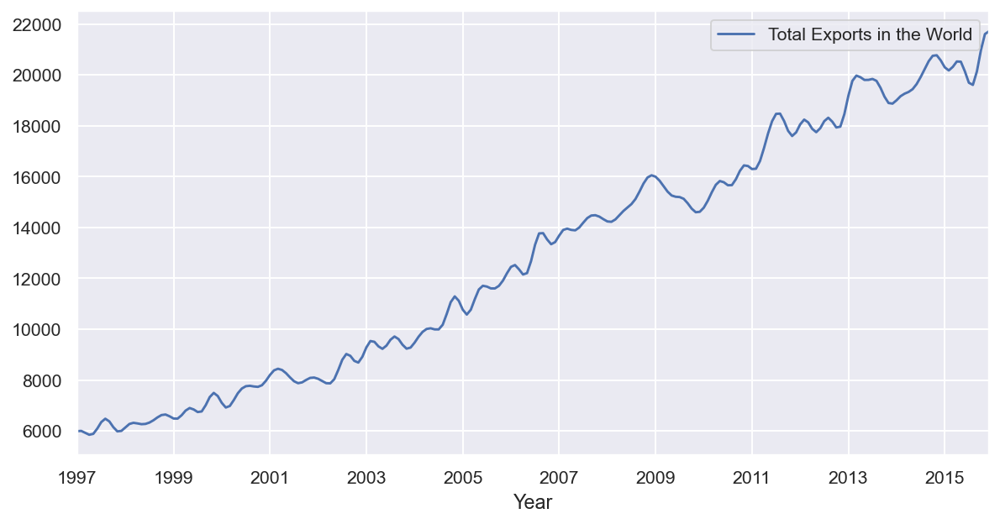

In [100]:
# Plot the data

plt.rcParams.update({'figure.figsize':(10,5), 'figure.dpi':140})
predWW_S1.plot();

In [101]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_S1['Total Exports in the World'], autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                   0.555646
p-value                          0.986470
Number of Lags Used             15.000000
Number of Observations Used    212.000000
Critical Value (1%)             -3.461578
Critical Value (5%)             -2.875272
Critical Value (10%)            -2.574089
dtype: float64


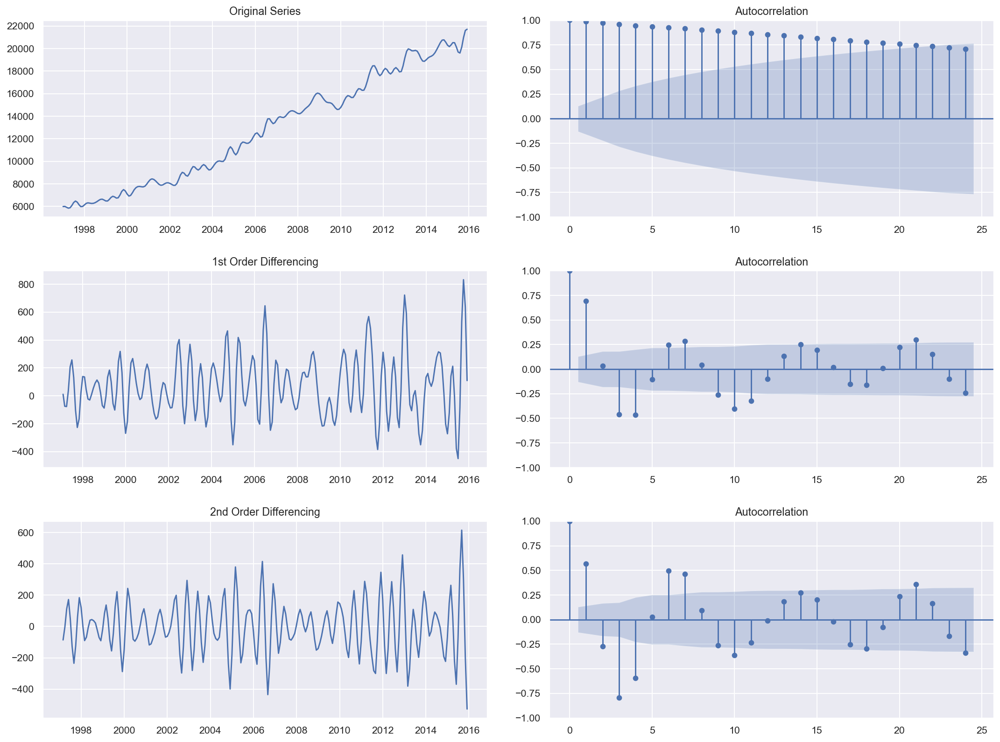

In [102]:
# How to find the order of differencing (d) in ARIMA model


plt.rcParams.update({'figure.figsize':(16,12), 'figure.dpi':140})


# Original Series
fig, axes = plt.subplots(3, 2)
fig.tight_layout(pad = 3.0)


axes[0, 0].plot(predWW_S1['Total Exports in the World']); axes[0, 0].set_title('Original Series')
plot_acf(predWW_S1['Total Exports in the World'], ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(predWW_S1['Total Exports in the World'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(predWW_S1['Total Exports in the World'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(predWW_S1['Total Exports in the World'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(predWW_S1['Total Exports in the World'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

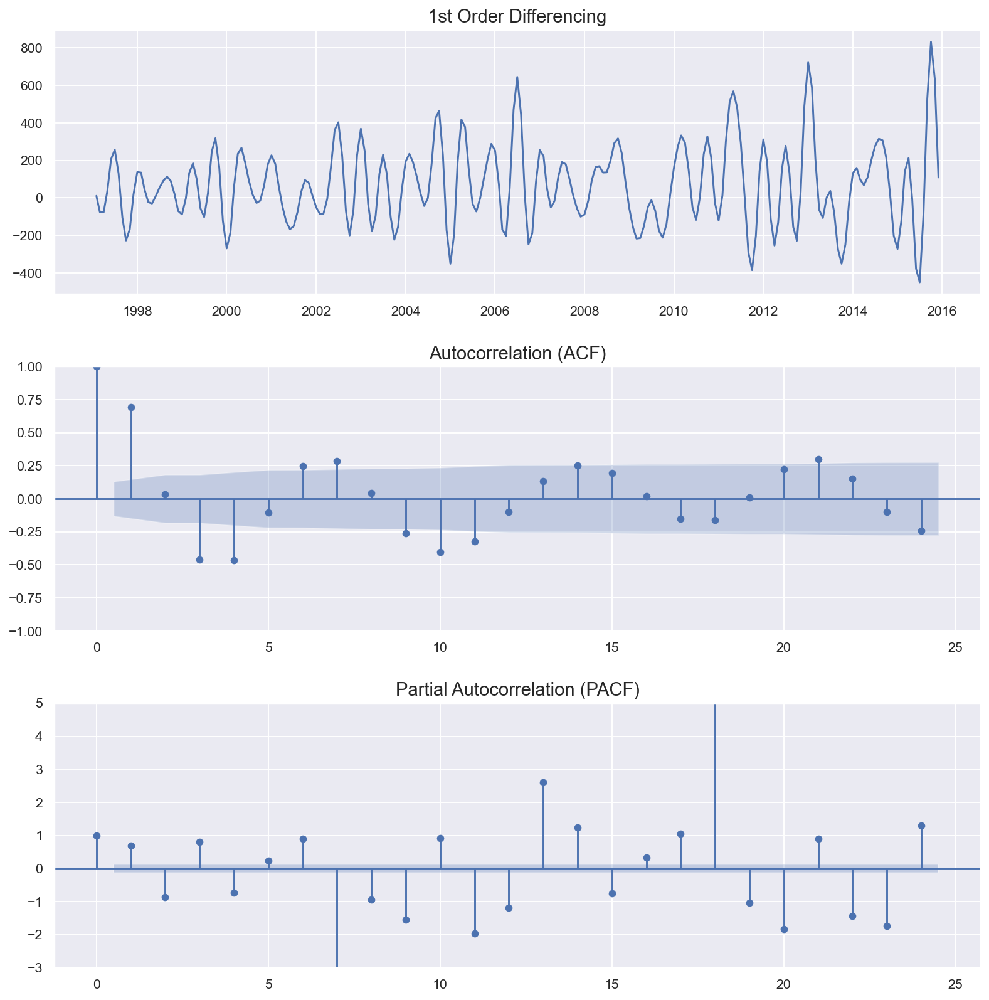

In [103]:
# How to find the order of PACF (p) and ACF (q) in ARIMA model based on the number of differencing


plt.rcParams.update({'figure.figsize':(12,12), 'figure.dpi':140})


fig, axes = plt.subplots(3, 1)
fig.tight_layout(pad = 3.0)



# 2nd Differencing
axes[0].plot(predWW_S1['Total Exports in the World'].diff())
axes[0].set_title('1st Order Differencing', size=15)

# ACF
plot_acf(predWW_S1['Total Exports in the World'].diff().dropna(), ax=axes[1])
axes[1].set_title('Autocorrelation (ACF)',size=15)

# PACF
plot_pacf(predWW_S1['Total Exports in the World'].diff().dropna(), ax=axes[2])
axes[2].set_title('Partial Autocorrelation (PACF)',size=15)
axes[2].set(ylim=(-3,5))


plt.show()

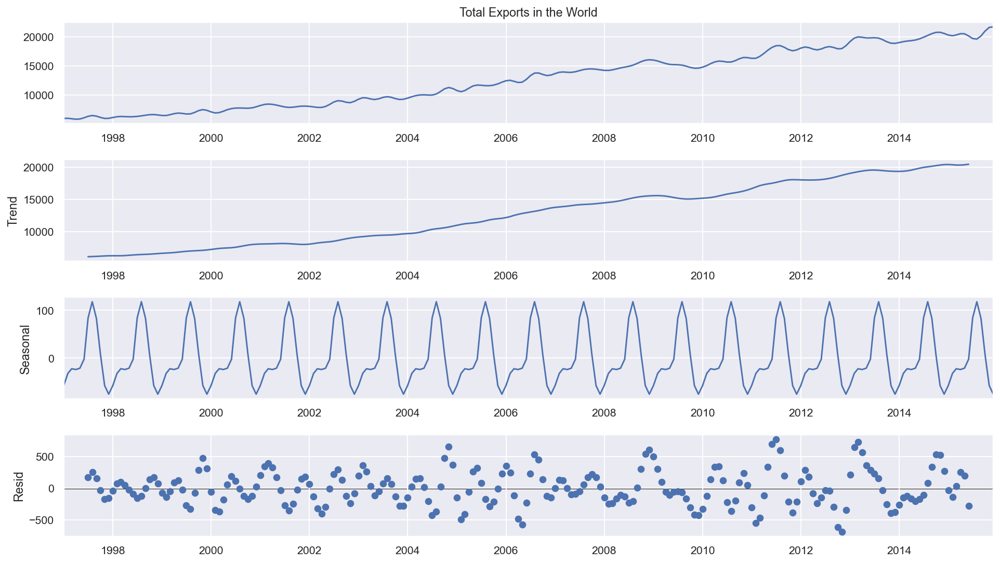

In [104]:
# Check if there is any seasonality

plt.rc('figure',figsize=(14,8))
plt.rc('font',size=15)

result = seasonal_decompose(predWW_S1['Total Exports in the World'].dropna(),model='additive')
fig = result.plot()

In [105]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_S1['Total Exports in the World'].diff().dropna(), autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);
   

Dickey Fuller Test:
Test Statistic                  -3.843285
p-value                          0.002494
Number of Lags Used             14.000000
Number of Observations Used    212.000000
Critical Value (1%)             -3.461578
Critical Value (5%)             -2.875272
Critical Value (10%)            -2.574089
dtype: float64


In [106]:
# Split the data into train and test set
train_data1 = predWW_S1[:len(predWW_S1)-60]
test_data1 = predWW_S1[len(predWW_S1)-60:]

In [107]:

model = auto_arima(train_data1['Total Exports in the World'].astype(int), start_p=1, start_q=1,
                      test='adf',
                      max_p=5, max_q=5,
                      m=12,             
                      d=1,
                      seasonal=True,   
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1943.351, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2204.632, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2101.686, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2014.080, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2222.447, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1956.331, Time=0.07 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=1924.903, Time=1.71 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=2.22 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=2074.751, Time=1.15 sec
 ARIMA(2,1,1)(0,0,2)[12] intercept   : AIC=1748.467, Time=2.29 sec
 ARIMA(2,1,1)(0,0,1)[12] intercept   : AIC=1750.965, Time=0.29 sec
 ARIMA(2,1,1)(1,0,2)[12] intercept   : AIC=1753.178, Time=2.60 sec
 ARIMA(2,1,1)(1,0,1)[12] intercept

In [108]:
# Predictions of the SARIMAX model
sarima_model1 = SARIMAX(train_data1['Total Exports in the World'].astype(int), order=(5,1,2),seasonal_order=(1,1,1,12))
sarima_model_fit1 = sarima_model1.fit(disp=0)
print(sarima_model_fit1.summary())

                                      SARIMAX Results                                       
Dep. Variable:           Total Exports in the World   No. Observations:                  168
Model:             SARIMAX(5, 1, 2)x(1, 1, [1], 12)   Log Likelihood                -719.614
Date:                              Thu, 22 Sep 2022   AIC                           1459.228
Time:                                      19:50:06   BIC                           1489.662
Sample:                                  01-01-1997   HQIC                          1471.590
                                       - 12-01-2010                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3910      0.082     16.951      0.000       1.230       1.552
ar.L2         -0.76

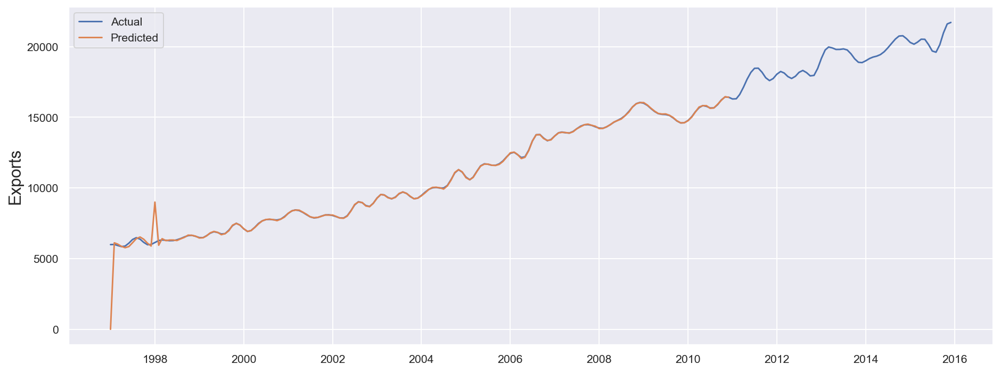

In [109]:
# Prediction on the test data

sarima_predictions_test1 = sarima_model_fit1.predict()
sarima_predictions_test1

plt.figure(figsize=(16,6))
plt.plot(predWW_S1, label="Actual")
plt.plot(sarima_predictions_test1, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

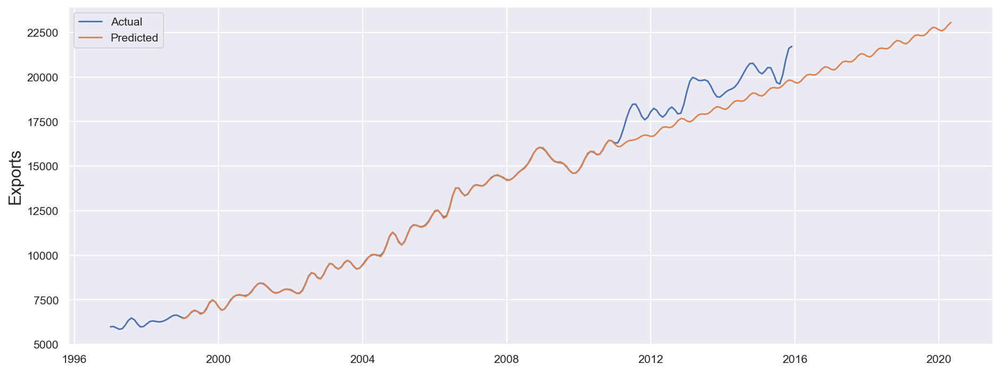

In [110]:
# Prediction for the Future

sarima_predictions_future1 = sarima_model_fit1.predict(24,280)
sarima_predictions_future1

plt.figure(figsize=(16,6))
plt.plot(predWW_S1, label="Actual")
plt.plot(sarima_predictions_future1, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

In [111]:
pd.DataFrame(sarima_predictions_future1).tail(24)

,predicted_mean
2018-06-01,21621.983910
2018-07-01,21583.082085
2018-08-01,21591.976351
2018-09-01,21721.578252
2018-10-01,21916.609013
2018-11-01,22041.382020
2018-12-01,22017.937960
2019-01-01,21907.186603
2019-02-01,21857.262293
2019-03-01,21957.749908


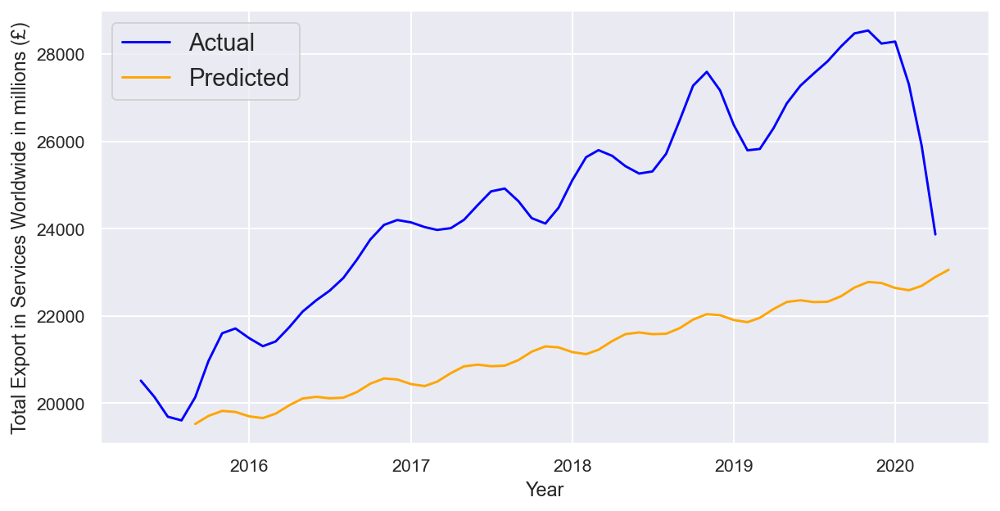

In [112]:
# Total Actual and Predicted Export in Services Worldwide in millions (£)

fig, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(x = 'Year', y = 'Total Exports in the World' ,data = ES_WW_M.iloc[220:280],color = 'blue',label="Actual")
sns.lineplot(data = sarima_predictions_future1.iloc[200:280],color = 'orange',label="Predicted")
plt.legend(fontsize = 'medium')
plt.ylabel('Total Export in Services Worldwide in millions (£)');

In [113]:
# Calculation of Mean AND RMSE

start=len(train_data1)
end=len(train_data1)+len(test_data1)-1

mean = test_data1.mean()
rmse = sqrt(mean_squared_error(sarima_model_fit1.predict(start=start,end=end,typ='levels'),test_data1))
print(mean)
print(rmse)

Total Exports in the World    19102.716667
dtype: float64
1319.8845277664484


15.b) Imports of Services (Worldwide)

In [114]:
# Trade in Services Monthly (1997 - 2022)

predWW_S2 = IS_WW_M.iloc[:228]
predWW_S2 = predWW_S2.set_index('Year')
predWW_S2 = predWW_S2.astype({'Total Imports in the World':'int'})

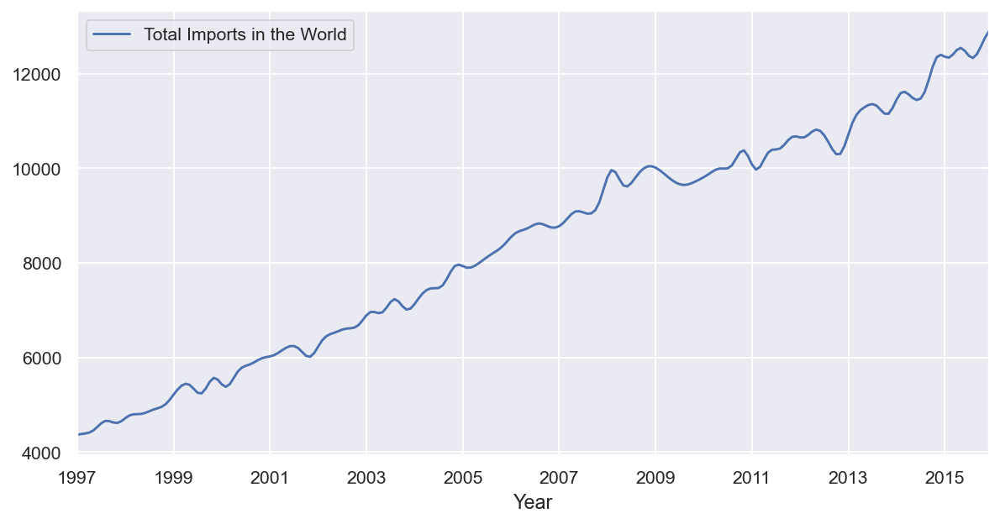

In [115]:
# Plot the data

plt.rcParams.update({'figure.figsize':(10,5), 'figure.dpi':140})
predWW_S2.plot();

In [116]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:of EU27
print('Dickey Fuller Test:')
dftest = adfuller(predWW_S2['Total Imports in the World'], autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                   0.479219
p-value                          0.984228
Number of Lags Used             15.000000
Number of Observations Used    212.000000
Critical Value (1%)             -3.461578
Critical Value (5%)             -2.875272
Critical Value (10%)            -2.574089
dtype: float64


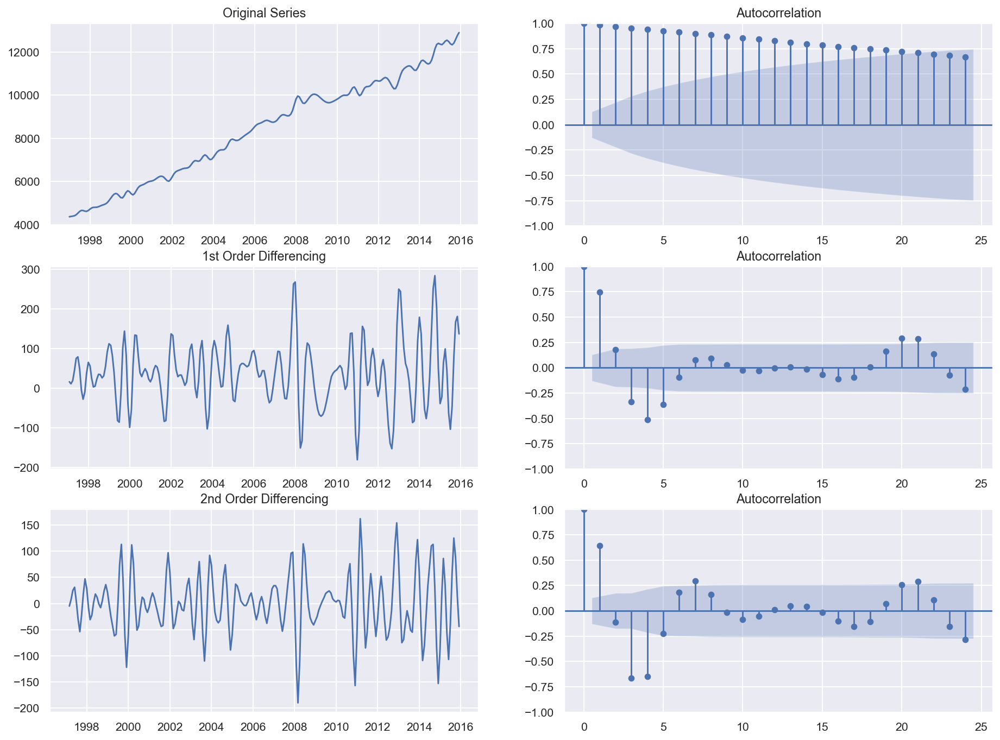

In [117]:
# How to find the order of differencing (d) in ARIMA model

plt.rcParams.update({'figure.figsize':(16,12), 'figure.dpi':140})


# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(predWW_S2['Total Imports in the World']); axes[0, 0].set_title('Original Series')
plot_acf(predWW_S2['Total Imports in the World'], ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(predWW_S2['Total Imports in the World'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(predWW_S2['Total Imports in the World'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(predWW_S2['Total Imports in the World'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(predWW_S2['Total Imports in the World'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

In [118]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_S2['Total Imports in the World'].diff().diff().dropna(), autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                -7.770832e+00
p-value                        8.930572e-12
Number of Lags Used            1.500000e+01
Number of Observations Used    2.100000e+02
Critical Value (1%)           -3.461879e+00
Critical Value (5%)           -2.875404e+00
Critical Value (10%)          -2.574159e+00
dtype: float64


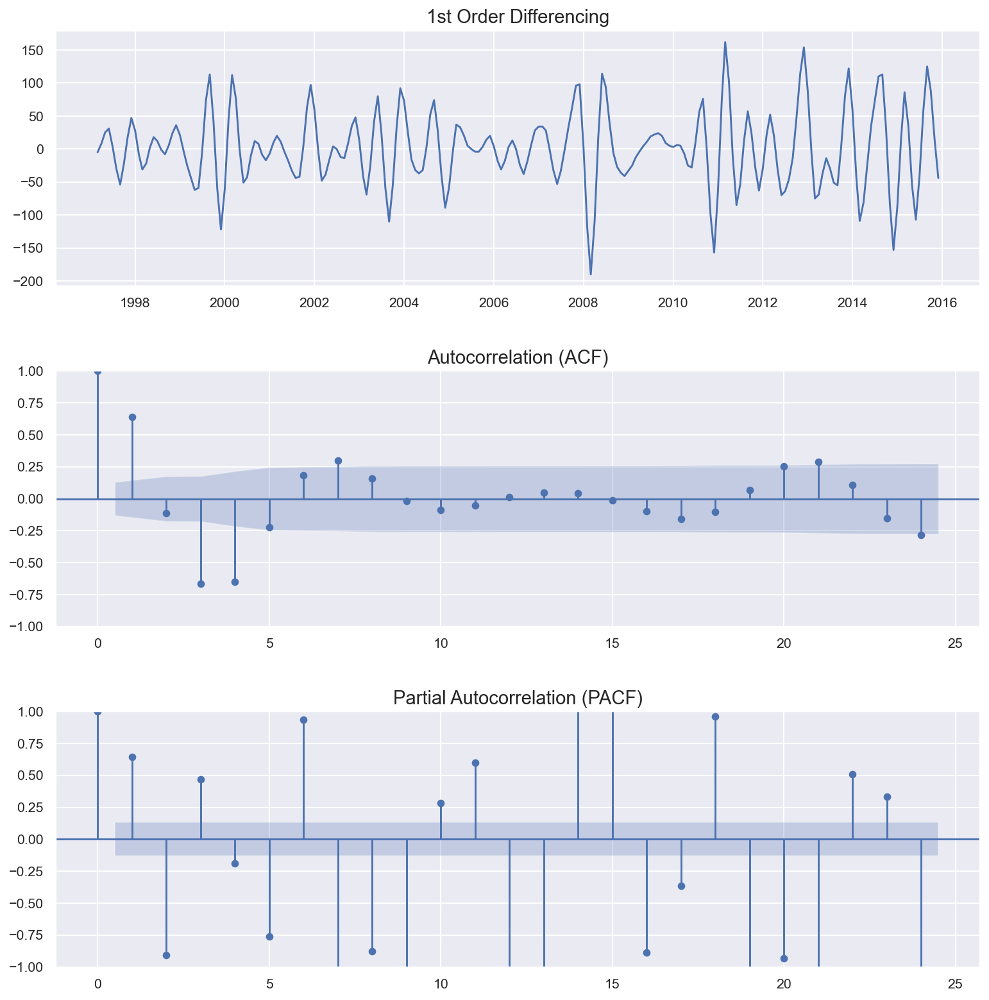

In [119]:
# How to find the order of PACF (p) and ACF (q) in ARIMA model based on the number of differencing

plt.rcParams.update({'figure.figsize':(12,12), 'figure.dpi':140})


fig, axes = plt.subplots(3, 1)
fig.tight_layout(pad = 3.0)



# 1st Differencing
axes[0].plot(predWW_S2['Total Imports in the World'].diff().diff())
axes[0].set_title('1st Order Differencing', size=15)

# ACF
plot_acf(predWW_S2['Total Imports in the World'].diff().diff().dropna(), ax=axes[1])
axes[1].set_title('Autocorrelation (ACF)',size=15)

# PACF
plot_pacf(predWW_S2['Total Imports in the World'].diff().diff().dropna(), ax=axes[2])
axes[2].set_title('Partial Autocorrelation (PACF)',size=15)


plt.show()

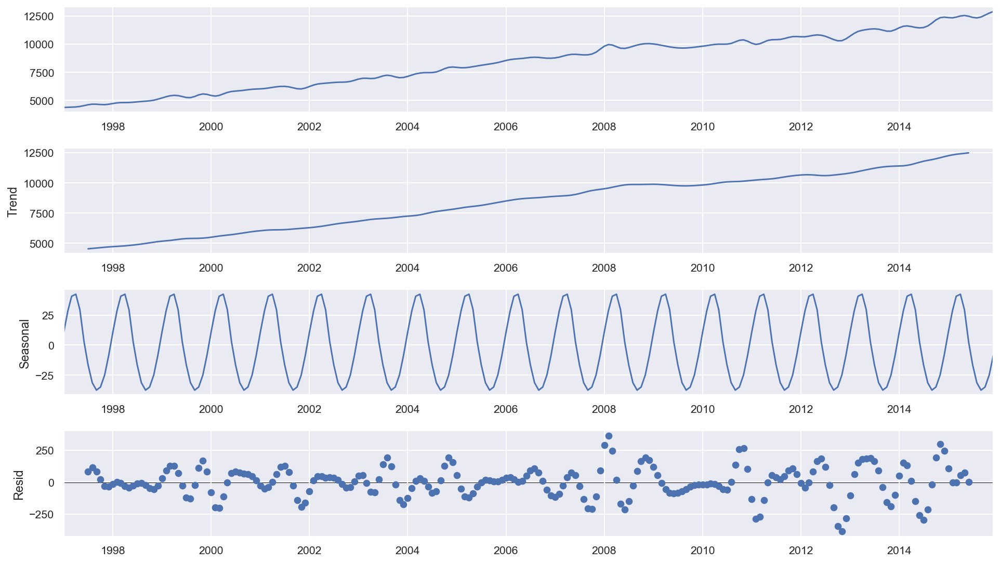

In [120]:
# Check if there is any seasonality

plt.rc('figure',figsize=(14,8))
plt.rc('font',size=15)

result = seasonal_decompose(predWW_S2,model='additive')
fig = result.plot()

In [121]:
# Split the data into train and test set
train_data2 = predWW_S2[:len(predWW_S2)-60]
test_data2 = predWW_S2[len(predWW_S2)-60:]

In [122]:
# Automatic search for the best parameters
model = auto_arima(train_data2['Total Imports in the World'], start_p=0, start_q=0,
                      test='adf',
                      max_p=5, max_q=5,
                      m=12,             
                      d=2,          
                      seasonal=True,   
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(0,2,0)(0,0,1)[12]             : AIC=1755.547, Time=0.09 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=1755.925, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=1669.568, Time=0.06 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=1604.233, Time=0.17 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=1603.315, Time=0.03 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=1604.611, Time=0.17 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=1600.056, Time=0.34 sec
 ARIMA(0,2,1)(2,0,1)[12]             : AIC=1599.512, Time=1.08 sec
 ARIMA(0,2,1)(2,0,0)[12]             : AIC=1603.515, Time=0.69 sec
 ARIMA(0,2,1)(2,0,2)[12]             : AIC=inf, Time=1.52 sec
 ARIMA(0,2,1)(1,0,2)[12]             : AIC=1600.613, Time=1.63 sec
 ARIMA(0,2,0)(2,0,1)[12]             : AIC=1752.542, Time=0.85 sec
 ARIMA(1,2,1)(2,0,1)[12]             : AIC=1541.098, Time=1.32 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=1543.951, Time=0.39 sec
 ARIMA(1,2,1)(2,0,0)[12]

In [123]:
# Manual search for the parameters
sarima_model2 = SARIMAX(train_data2['Total Imports in the World'].astype(int), order=(0,2,1),seasonal_order=(0,0,3,12))
sarima_model_fit2 = sarima_model2.fit(disp=0)
print(sarima_model_fit2.summary())

                                         SARIMAX Results                                          
Dep. Variable:                 Total Imports in the World   No. Observations:                  168
Model:             SARIMAX(0, 2, 1)x(0, 0, [1, 2, 3], 12)   Log Likelihood                -793.634
Date:                                    Thu, 22 Sep 2022   AIC                           1597.267
Time:                                            19:51:28   BIC                           1612.827
Sample:                                        01-01-1997   HQIC                          1603.583
                                             - 12-01-2010                                         
Covariance Type:                                      opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.8767      0.049     17.971      0

In [124]:
# Final parameters for the model
sarima_model2 = SARIMAX(train_data2['Total Imports in the World'].astype(int), order=(5,2,2),seasonal_order=(0,1,1,12))
sarima_model_fit2 = sarima_model2.fit(disp=0)
print(sarima_model_fit2.summary())

                                      SARIMAX Results                                       
Dep. Variable:           Total Imports in the World   No. Observations:                  168
Model:             SARIMAX(5, 2, 2)x(0, 1, [1], 12)   Log Likelihood                -586.900
Date:                              Thu, 22 Sep 2022   AIC                           1191.800
Time:                                      19:51:31   BIC                           1219.133
Sample:                                  01-01-1997   HQIC                          1202.903
                                       - 12-01-2010                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.1906      0.086     13.820      0.000       1.022       1.359
ar.L2         -0.90

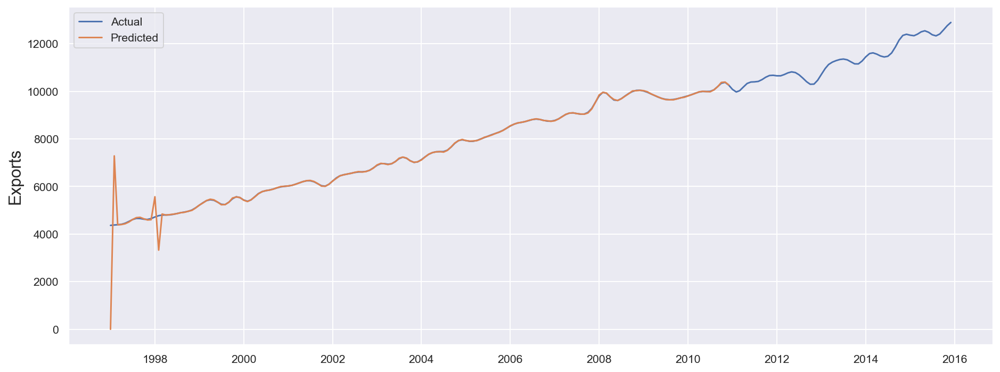

In [125]:
# Prediction on the test data

sarima_predictions_test2 = sarima_model_fit2.predict()
sarima_predictions_test2

plt.figure(figsize=(16,6))
plt.plot(predWW_S2, label="Actual")
plt.plot(sarima_predictions_test2, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

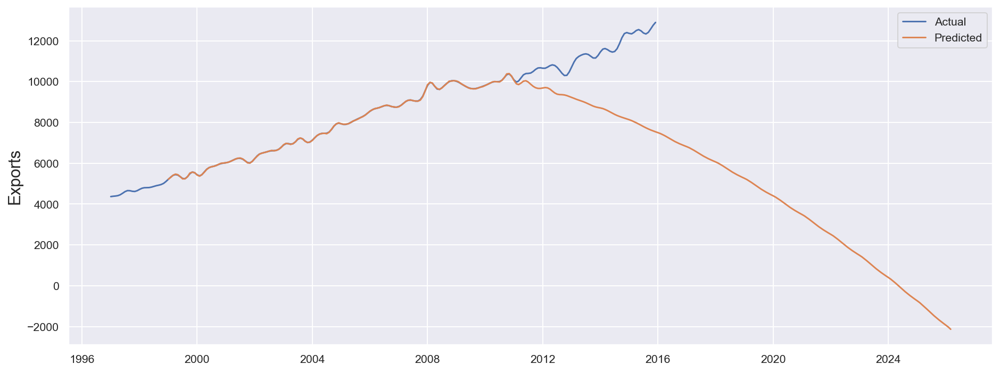

In [126]:
# Prediction for the Future

sarima_predictions_future2 = sarima_model_fit2.predict(24,350)
sarima_predictions_future2

plt.figure(figsize=(16,6))
plt.plot(predWW_S2, label="Actual")
plt.plot(sarima_predictions_future2, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

In [127]:
pd.DataFrame(sarima_predictions_future2).tail(24)

,predicted_mean
2024-04-01,127.232506
2024-05-01,22.935363
2024-06-01,-83.807623
2024-07-01,-190.529122
2024-08-01,-293.329539
2024-09-01,-390.445720
2024-10-01,-482.531981
2024-11-01,-570.754799
2024-12-01,-655.559631
2025-01-01,-739.987470


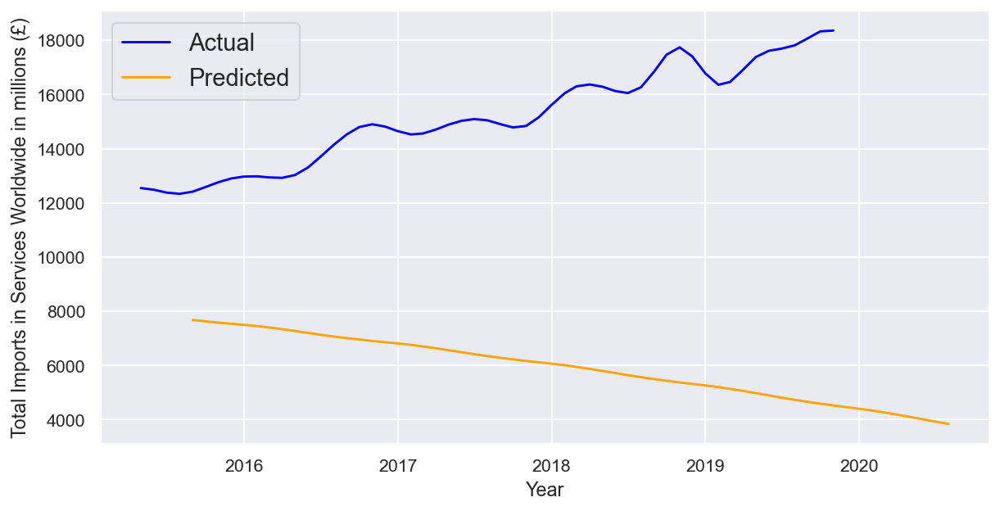

In [128]:
# Total Actual and Predicted Imports in Services Worldwide in millions (£)

fig, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(x = 'Year', y = 'Total Imports in the World' ,data = IS_WW_M.iloc[220:275],color = 'blue',label="Actual")
sns.lineplot(data = sarima_predictions_future2.iloc[200:260],color = 'orange',label="Predicted")
plt.legend(fontsize = 'medium')

plt.ylabel('Total Imports in Services Worldwide in millions (£)');


In [129]:
# Calculation of Mean and RMSE

start=len(train_data2)
end=len(train_data2)+len(test_data2)-1

mean = test_data2.mean()
rmse = sqrt(mean_squared_error(sarima_model_fit2.predict(start=start,end=end,typ='levels'),test_data2))
print(mean)
print(rmse)

Total Imports in the World    11276.733333
dtype: float64
2818.016818588902


15.c) Import of Goods (Worldwide)

In [130]:
# Trade in Services Monthly (1997 - 2022)

predWW_G1 = impGM_World.iloc[:228]
predWW_G1 = predWW_G1.set_index('Year')
predWW_G1 = predWW_G1.astype({'Total Imports in the World':'int'})


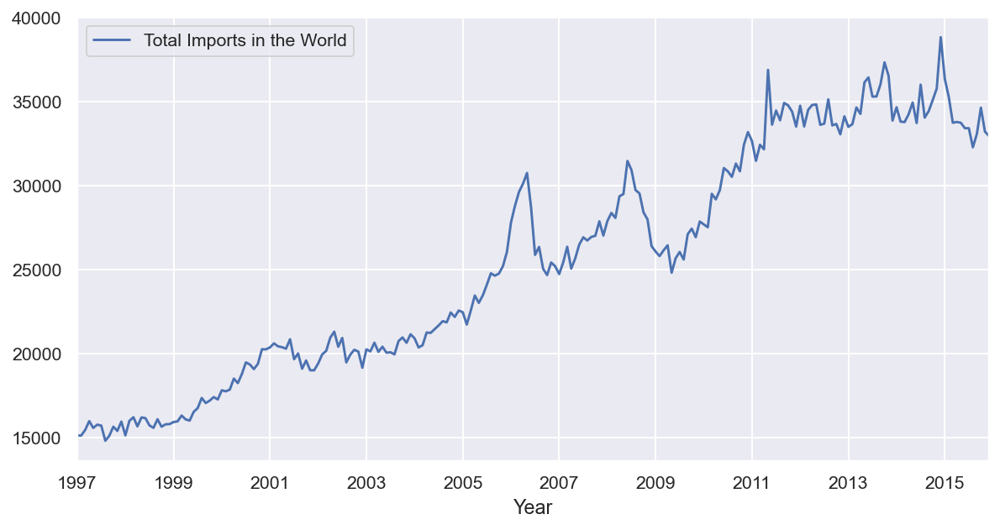

In [131]:
# Plot the data

plt.rcParams.update({'figure.figsize':(10,5), 'figure.dpi':140})
predWW_G1.plot();

In [132]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_G1['Total Imports in the World'], autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                  -1.143520
p-value                          0.697408
Number of Lags Used              1.000000
Number of Observations Used    226.000000
Critical Value (1%)             -3.459620
Critical Value (5%)             -2.874415
Critical Value (10%)            -2.573632
dtype: float64


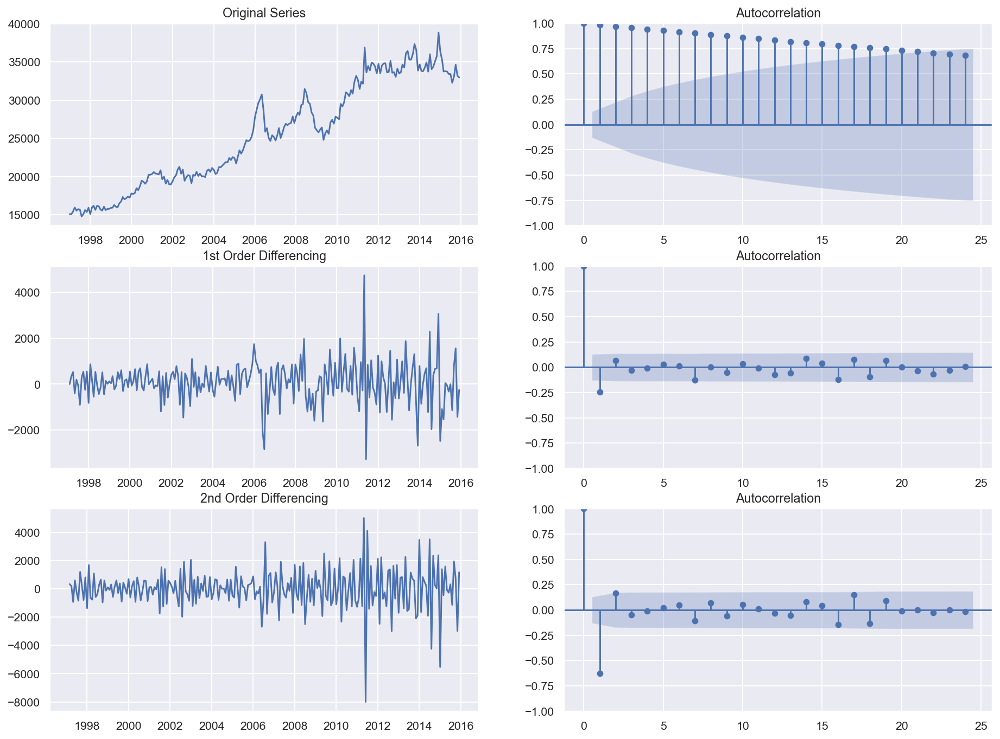

In [133]:
# How to find the order of differencing (d) in ARIMA model

plt.rcParams.update({'figure.figsize':(16,12), 'figure.dpi':140})


# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(predWW_G1['Total Imports in the World']); axes[0, 0].set_title('Original Series')
plot_acf(predWW_G1['Total Imports in the World'], ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(predWW_G1['Total Imports in the World'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(predWW_G1['Total Imports in the World'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(predWW_G1['Total Imports in the World'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(predWW_G1['Total Imports in the World'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

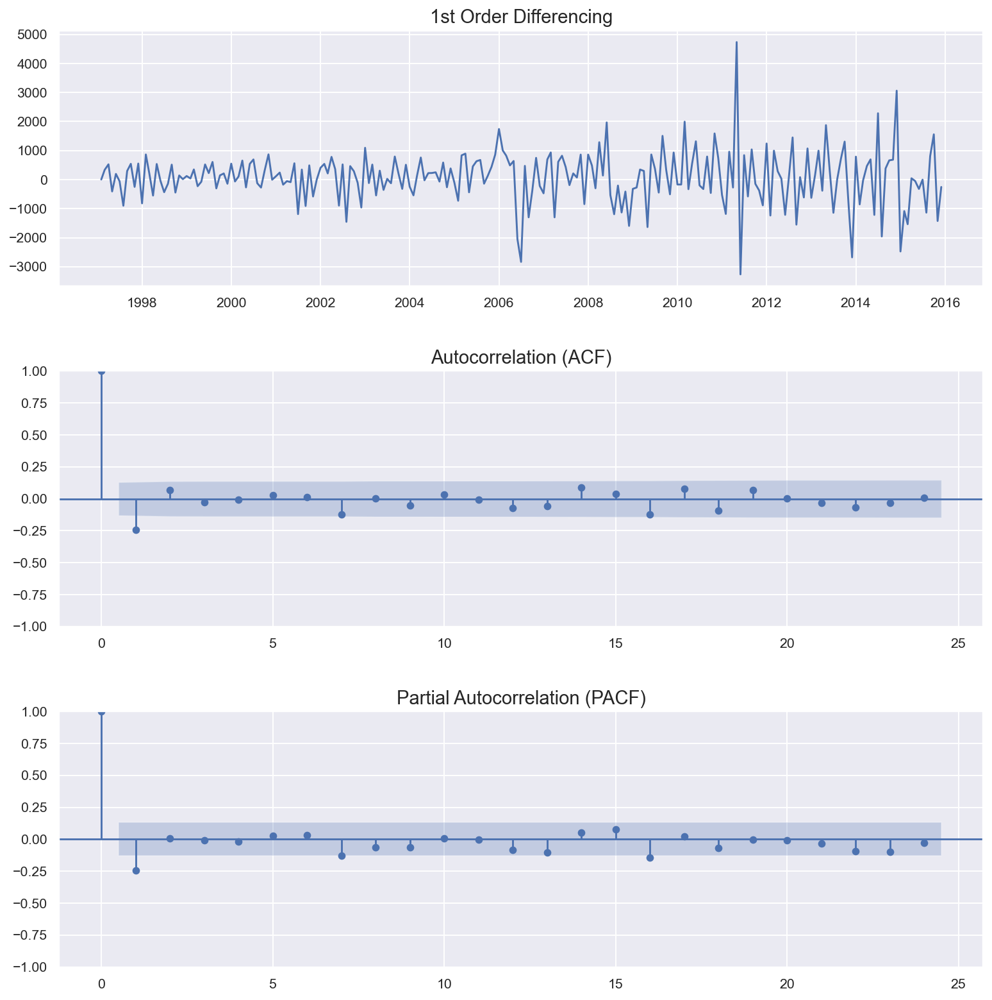

In [134]:
# How to find the order of PACF (p) and ACF (q) in ARIMA model based on the number of differencing

plt.rcParams.update({'figure.figsize':(12,12), 'figure.dpi':140})


fig, axes = plt.subplots(3, 1)
fig.tight_layout(pad = 3.0)



# 1st Differencing
axes[0].plot(predWW_G1['Total Imports in the World'].diff())
axes[0].set_title('1st Order Differencing', size=15)

# ACF
plot_acf(predWW_G1['Total Imports in the World'].diff().dropna(), ax=axes[1])
axes[1].set_title('Autocorrelation (ACF)',size=15)

# PACF
plot_pacf(predWW_G1['Total Imports in the World'].diff().dropna(), ax=axes[2])
axes[2].set_title('Partial Autocorrelation (PACF)',size=15)


plt.show()

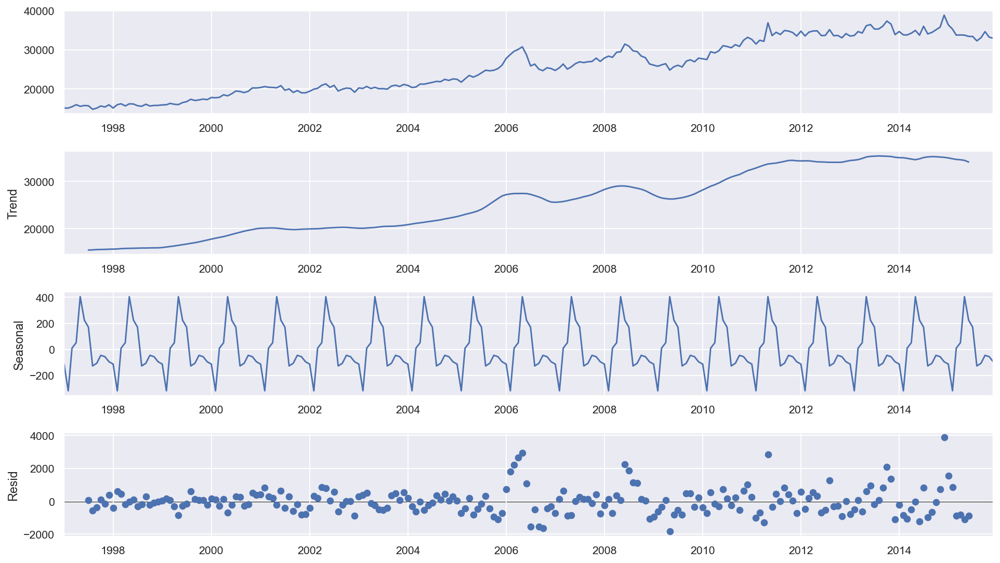

In [135]:
# Check if there is any seasonality

plt.rc('figure',figsize=(14,8))
plt.rc('font',size=15)

result = seasonal_decompose(predWW_G1,model='additive')
fig = result.plot()

In [136]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_G1['Total Imports in the World'].diff().dropna(), autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                 -19.173674
p-value                          0.000000
Number of Lags Used              0.000000
Number of Observations Used    226.000000
Critical Value (1%)             -3.459620
Critical Value (5%)             -2.874415
Critical Value (10%)            -2.573632
dtype: float64


In [137]:
# Split the data into train and test set
train_data3 = predWW_G1[:len(predWW_G1)-60]
test_data3 = predWW_G1[len(predWW_G1)-60:]

In [138]:
# Automatic search for the parameters
model = auto_arima(train_data3['Total Imports in the World'], start_p=0, start_q=0,
                      test='adf',
                      max_p=5, max_q=5,
                      m=12,             
                      d=1,          
                      seasonal=True,   
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2664.728, Time=0.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2664.458, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2666.318, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2666.100, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2666.445, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2665.042, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2665.439, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2665.831, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2665.925, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2667.882, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 0.399 seconds


In [139]:
# Manual search for the parameters
sarima_model3 = SARIMAX(train_data3['Total Imports in the World'].astype(int), order=(0,1,0),seasonal_order=(1,1,0,12))
sarima_model_fit3 = sarima_model3.fit(disp=0)
print(sarima_model_fit3.summary())


                                     SARIMAX Results                                      
Dep. Variable:         Total Imports in the World   No. Observations:                  168
Model:             SARIMAX(0, 1, 0)x(1, 1, 0, 12)   Log Likelihood               -1274.959
Date:                            Thu, 22 Sep 2022   AIC                           2553.918
Time:                                    19:51:34   BIC                           2560.005
Sample:                                01-01-1997   HQIC                          2556.391
                                     - 12-01-2010                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12      -0.3845      0.042     -9.153      0.000      -0.467      -0.302
sigma2      8.202e+05   7.89e+04   

In [140]:
# Final parameters for the model
sarima_model3 = SARIMAX(train_data3['Total Imports in the World'].astype(int), order=(0,1,0),seasonal_order=(1,1,1,12))
sarima_model_fit3 = sarima_model3.fit(disp=0)
print(sarima_model_fit3.summary())


                                      SARIMAX Results                                       
Dep. Variable:           Total Imports in the World   No. Observations:                  168
Model:             SARIMAX(0, 1, 0)x(1, 1, [1], 12)   Log Likelihood               -1254.826
Date:                              Thu, 22 Sep 2022   AIC                           2515.652
Time:                                      19:51:35   BIC                           2524.783
Sample:                                  01-01-1997   HQIC                          2519.361
                                       - 12-01-2010                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12       0.0774      0.064      1.204      0.228      -0.049       0.203
ma.S.L12      -0.99

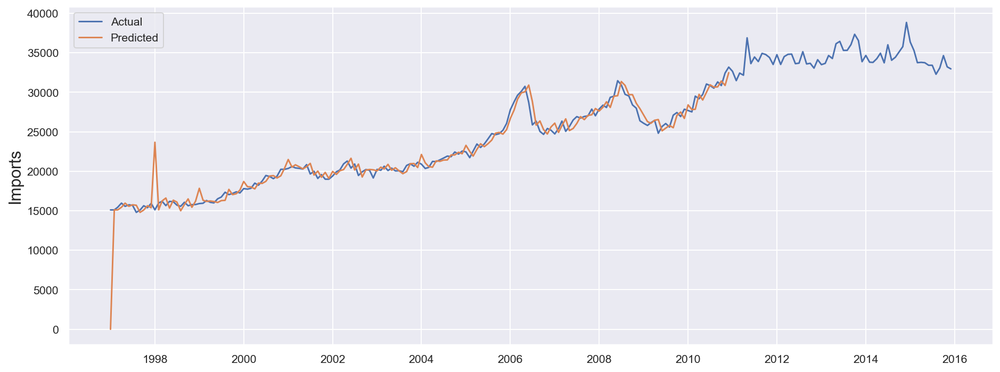

In [141]:
# Prediction on the test data

sarima_predictions_test3 = sarima_model_fit3.predict()
sarima_predictions_test3

plt.figure(figsize=(16,6))
plt.plot(predWW_G1, label="Actual")
plt.plot(sarima_predictions_test3, label="Predicted")
plt.ylabel('Imports', fontsize=16)
plt.legend();

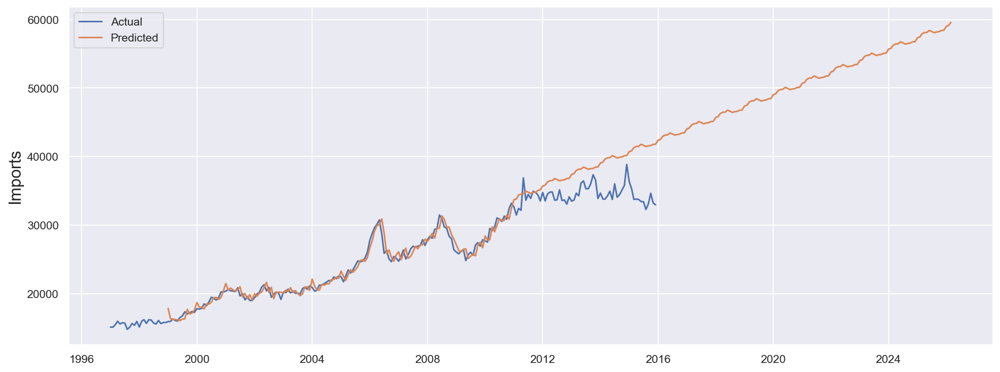

In [142]:
# Prediction for the Future

sarima_predictions_future3 = sarima_model_fit3.predict(24,350)
sarima_predictions_future3

plt.figure(figsize=(16,6))
plt.plot(predWW_G1, label="Actual")
plt.plot(sarima_predictions_future3, label="Predicted")
plt.ylabel('Imports', fontsize=16)
plt.legend();

In [143]:
pd.DataFrame(sarima_predictions_future3).tail(24)

,predicted_mean
2024-04-01,56434.114936
2024-05-01,56449.777834
2024-06-01,56742.816354
2024-07-01,56594.950331
2024-08-01,56412.949645
2024-09-01,56513.954825
2024-10-01,56561.329173
2024-11-01,56736.068386
2024-12-01,56758.262570
2025-01-01,57325.898367


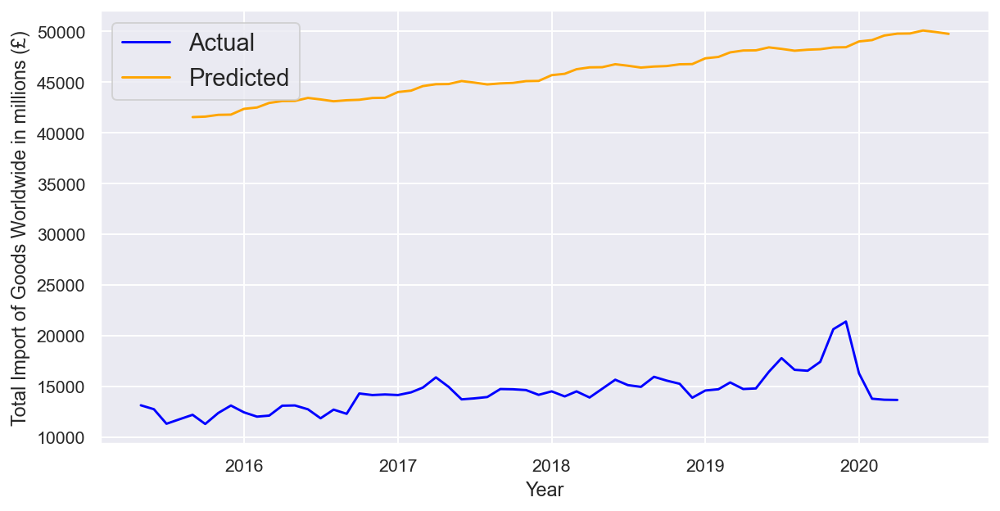

In [144]:
# Total Actual and Predicted Import of Goods Worldwide in millions (£)

fig, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(x = 'Year', y = 'Total Exports in the rest of the World' ,data = expGM_TRest.iloc[220:280],color = 'blue',label="Actual")
sns.lineplot(data = sarima_predictions_future3.iloc[200:260],color = 'orange',label="Predicted")
plt.legend(fontsize = 'medium')
plt.ylabel('Total Import of Goods Worldwide in millions (£)');


In [145]:
# Calculation of Meand and RMSE
start=len(train_data3)
end=len(train_data3)+len(test_data3)-1

mean = test_data3.mean()
rmse = sqrt(mean_squared_error(sarima_model_fit3.predict(start=start,end=end,typ='levels'),test_data3))
print(mean)
print(rmse)

Total Imports in the World    34388.083333
dtype: float64
4531.291356658561


15.d) Export in Goods (Worldwide)

In [146]:
# Trade in Services Monthly (1997 - 2022)

predWW_G2 = expGM_World.iloc[:228]
predWW_G2 = predWW_G2.set_index('Year')
predWW_G2 = predWW_G2.astype({'Total Exports in the World':'int'})


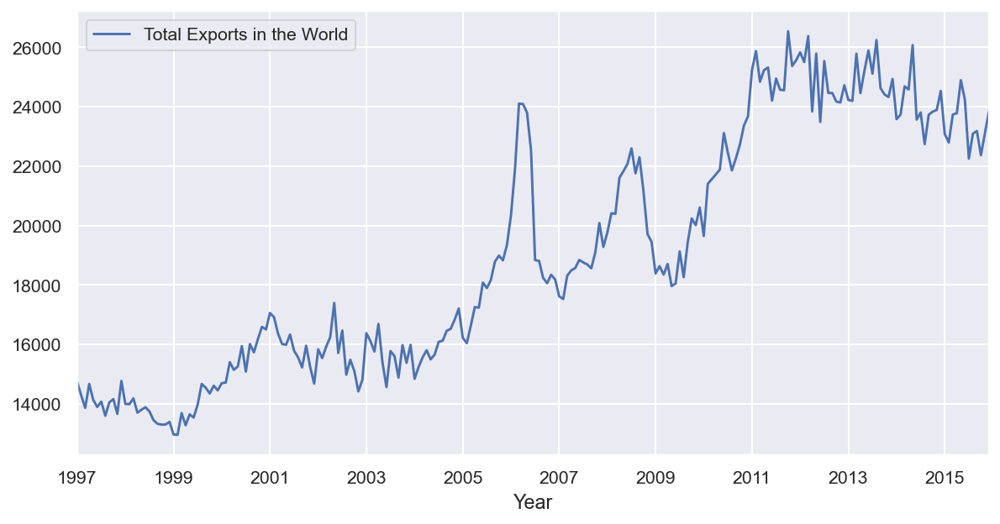

In [147]:
# Plot the data

plt.rcParams.update({'figure.figsize':(10,5), 'figure.dpi':140})
predWW_G2.plot();

In [148]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_G2['Total Exports in the World'], autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                  -1.193055
p-value                          0.676576
Number of Lags Used              4.000000
Number of Observations Used    223.000000
Critical Value (1%)             -3.460019
Critical Value (5%)             -2.874590
Critical Value (10%)            -2.573725
dtype: float64


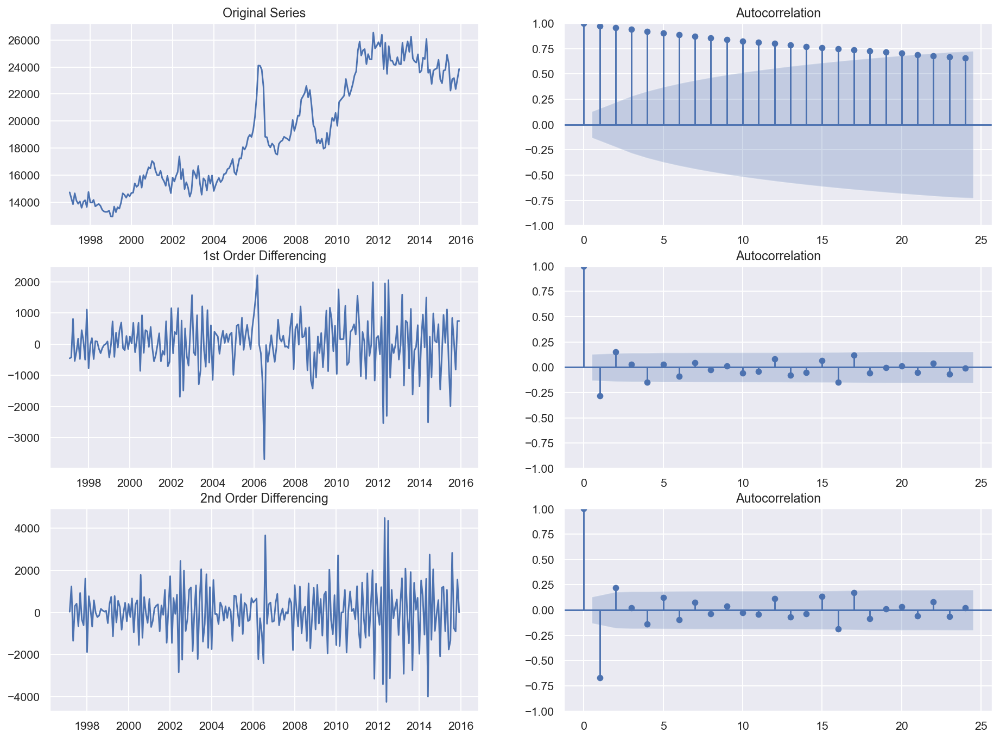

In [149]:
# How to find the order of differencing (d) in ARIMA model

plt.rcParams.update({'figure.figsize':(16,12), 'figure.dpi':140})


# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(predWW_G2['Total Exports in the World']); axes[0, 0].set_title('Original Series')
plot_acf(predWW_G2['Total Exports in the World'], ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(predWW_G2['Total Exports in the World'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(predWW_G2['Total Exports in the World'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(predWW_G2['Total Exports in the World'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(predWW_G2['Total Exports in the World'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

In [150]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_G2['Total Exports in the World'].diff().dropna(), autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                -8.089770e+00
p-value                        1.388358e-12
Number of Lags Used            3.000000e+00
Number of Observations Used    2.230000e+02
Critical Value (1%)           -3.460019e+00
Critical Value (5%)           -2.874590e+00
Critical Value (10%)          -2.573725e+00
dtype: float64


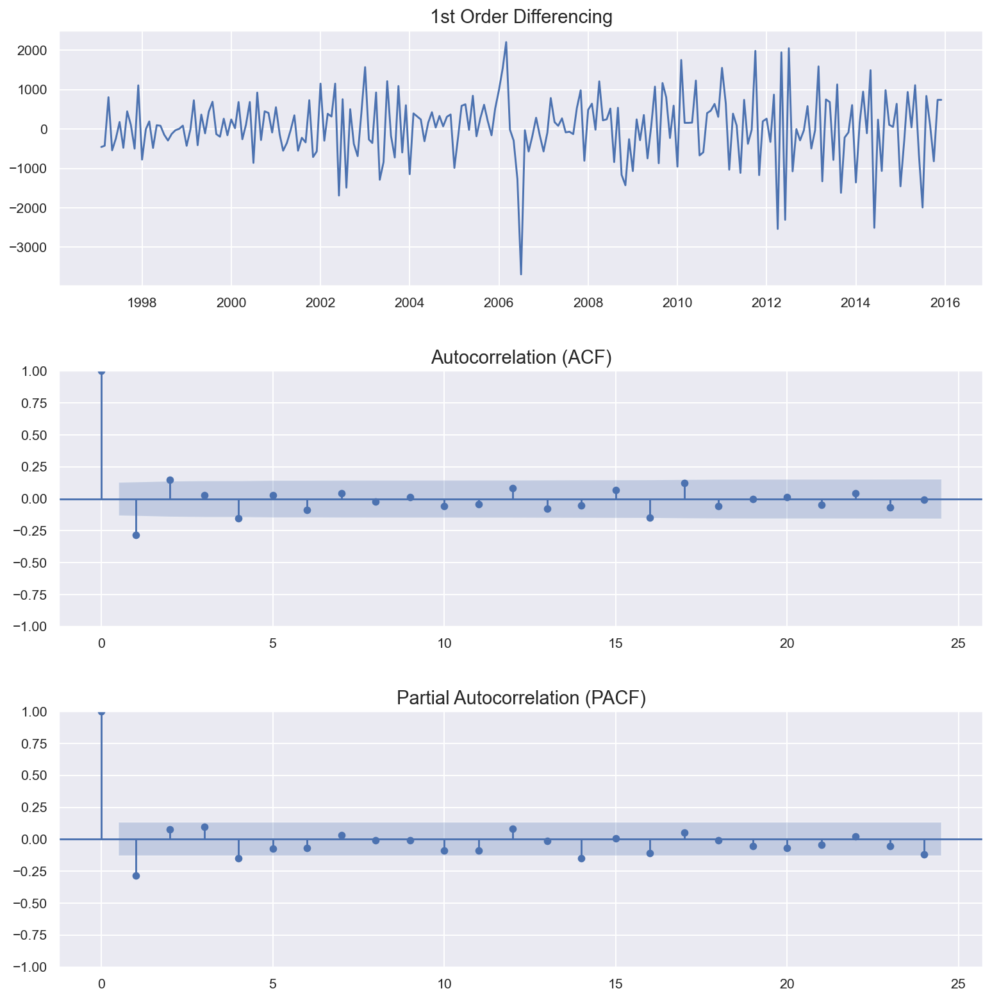

In [151]:
# How to find the order of PACF (p) and ACF (q) in ARIMA model based on the number of differencing

plt.rcParams.update({'figure.figsize':(12,12), 'figure.dpi':140})


fig, axes = plt.subplots(3, 1)
fig.tight_layout(pad = 3.0)



# 1st Differencing
axes[0].plot(predWW_G2['Total Exports in the World'].diff())
axes[0].set_title('1st Order Differencing', size=15)

# ACF
plot_acf(predWW_G2['Total Exports in the World'].diff().dropna(), ax=axes[1])
axes[1].set_title('Autocorrelation (ACF)',size=15)

# PACF
plot_pacf(predWW_G2['Total Exports in the World'].diff().dropna(), ax=axes[2])
axes[2].set_title('Partial Autocorrelation (PACF)',size=15)


plt.show()

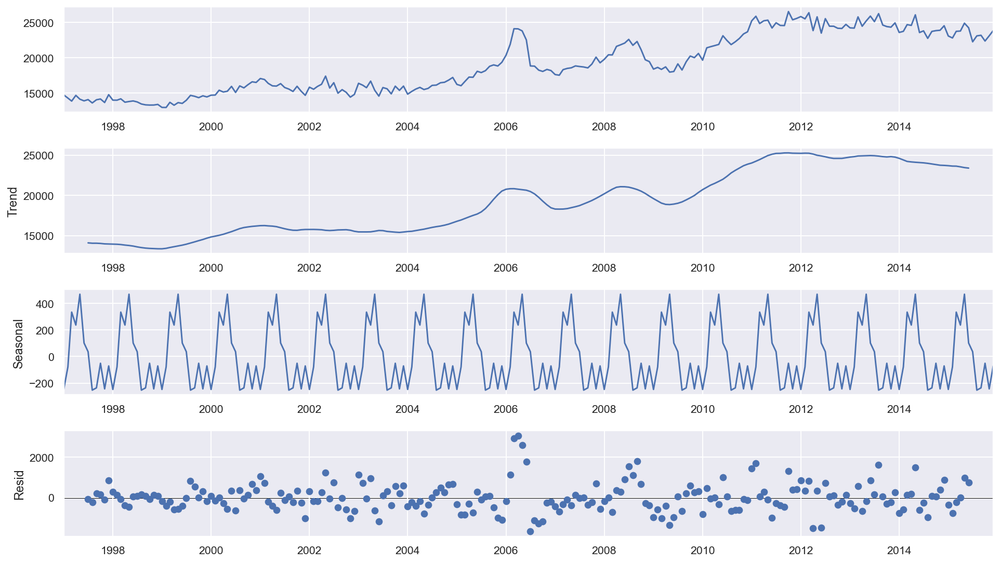

In [152]:
# Check if there is any seasonality

plt.rc('figure',figsize=(14,8))
plt.rc('font',size=15)

result = seasonal_decompose(predWW_G2,model='additive')
fig = result.plot()

In [153]:
# Split the data into train and test set
train_data4 = predWW_G2[:len(predWW_G2)-60]
test_data4 = predWW_G2[len(predWW_G2)-60:]

In [154]:

model = auto_arima(train_data4['Total Exports in the World'], start_p=0, start_q=0,
                      test='adf',
                      max_p=5, max_q=5,
                      m=12,             
                      d=1,          
                      seasonal=True,   
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2672.819, Time=0.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2670.905, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2673.266, Time=0.04 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2673.460, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2669.854, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2672.841, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2674.546, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2671.268, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2671.464, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2673.161, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.318 seconds


In [155]:
# Final Selection of parameters for the ARIMA model
sarima_model4 = SARIMAX(train_data4['Total Exports in the World'].astype(int), order=(0,1,0),seasonal_order=(1,1,1,12))
sarima_model_fit4 = sarima_model4.fit(disp=0)
print(sarima_model_fit4.summary())

                                      SARIMAX Results                                       
Dep. Variable:           Total Exports in the World   No. Observations:                  168
Model:             SARIMAX(0, 1, 0)x(1, 1, [1], 12)   Log Likelihood               -1257.304
Date:                              Thu, 22 Sep 2022   AIC                           2520.609
Time:                                      19:51:38   BIC                           2529.739
Sample:                                  01-01-1997   HQIC                          2524.317
                                       - 12-01-2010                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12       0.2114      0.070      3.028      0.002       0.075       0.348
ma.S.L12      -0.99

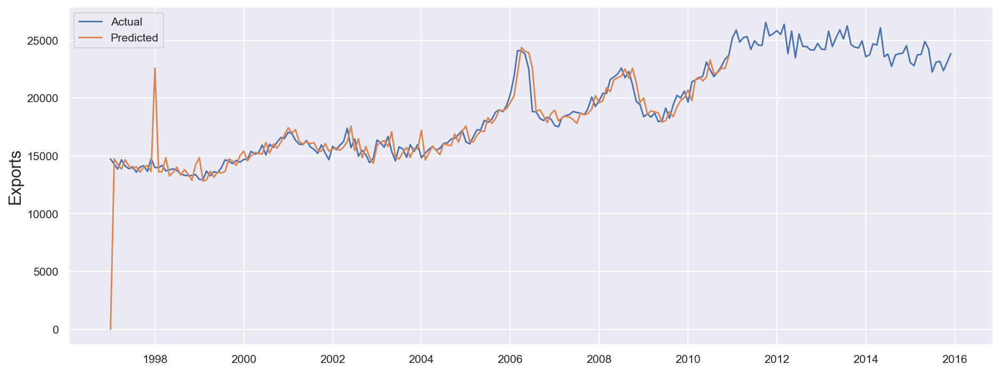

In [156]:
# Prediction on the test data

sarima_predictions_test4 = sarima_model_fit4.predict()
sarima_predictions_test4

plt.figure(figsize=(16,6))
plt.plot(predWW_G2, label="Actual")
plt.plot(sarima_predictions_test4, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

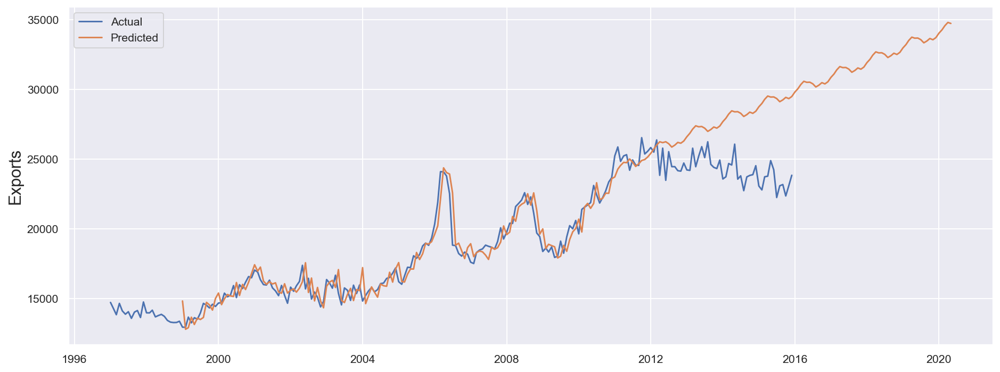

In [157]:
# Prediction for the Future

sarima_predictions_future4 = sarima_model_fit4.predict(24,280)
sarima_predictions_future4

plt.figure(figsize=(16,6))
plt.plot(predWW_G2, label="Actual")
plt.plot(sarima_predictions_future4, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

In [158]:
pd.DataFrame(sarima_predictions_future4).tail(24)

,predicted_mean
2018-06-01,32628.192242
2018-07-01,32513.270597
2018-08-01,32287.086090
2018-09-01,32416.332810
2018-10-01,32596.069347
2018-11-01,32507.772720
2018-12-01,32657.835239
2019-01-01,32974.718546
2019-02-01,33215.402829
2019-03-01,33511.813856


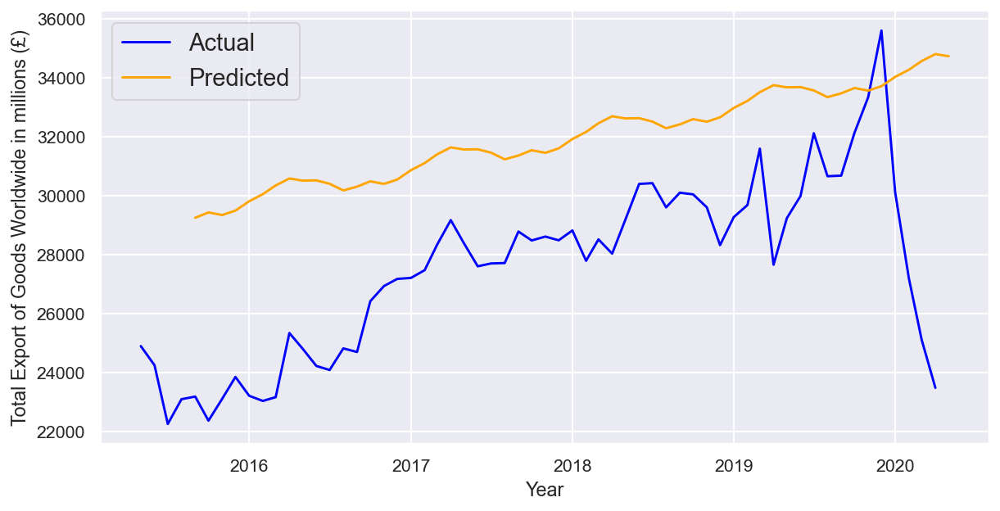

In [159]:
# Total Actual and Predicted Export of Goods Worldwide in millions (£)

fig, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(x = 'Year', y = 'Total Exports in the World' ,data = expGM_World.iloc[220:280],color = 'blue',label="Actual")
sns.lineplot(data = sarima_predictions_future4.iloc[200:260],color = 'orange',label="Predicted")
plt.legend(fontsize = 'medium')
plt.ylabel('Total Export of Goods Worldwide in millions (£)');


In [160]:
# Calculation of Mean and RMSE
start=len(train_data4)
end=len(train_data4)+len(test_data4)-1

mean = test_data4.mean()
rmse = sqrt(mean_squared_error(sarima_model_fit4.predict(start=start,end=end,typ='levels'),test_data4))
print(mean)
print(rmse)

Total Exports in the World    24488.133333
dtype: float64
3518.7148653041663


16) Predictions of the future (after Brexit)

16.a) Export of Services

In [161]:
# Trade in Services Monthly 

predWW_FS1 = ES_WW_M
predWW_FS1 = predWW_FS1.set_index('Year')
predWW_FS1 = predWW_FS1.astype({'Total Exports in the World':'int'})


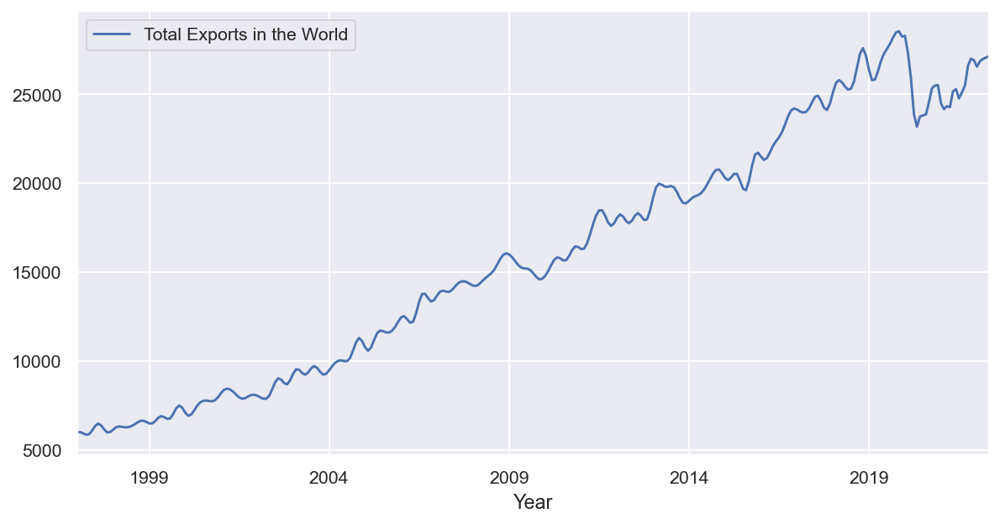

In [162]:
# Plot the data

plt.rcParams.update({'figure.figsize':(10,5), 'figure.dpi':140})
predWW_FS1.plot();

In [163]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_FS1['Total Exports in the World'], autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                  -0.293333
p-value                          0.926443
Number of Lags Used             16.000000
Number of Observations Used    288.000000
Critical Value (1%)             -3.453262
Critical Value (5%)             -2.871628
Critical Value (10%)            -2.572146
dtype: float64


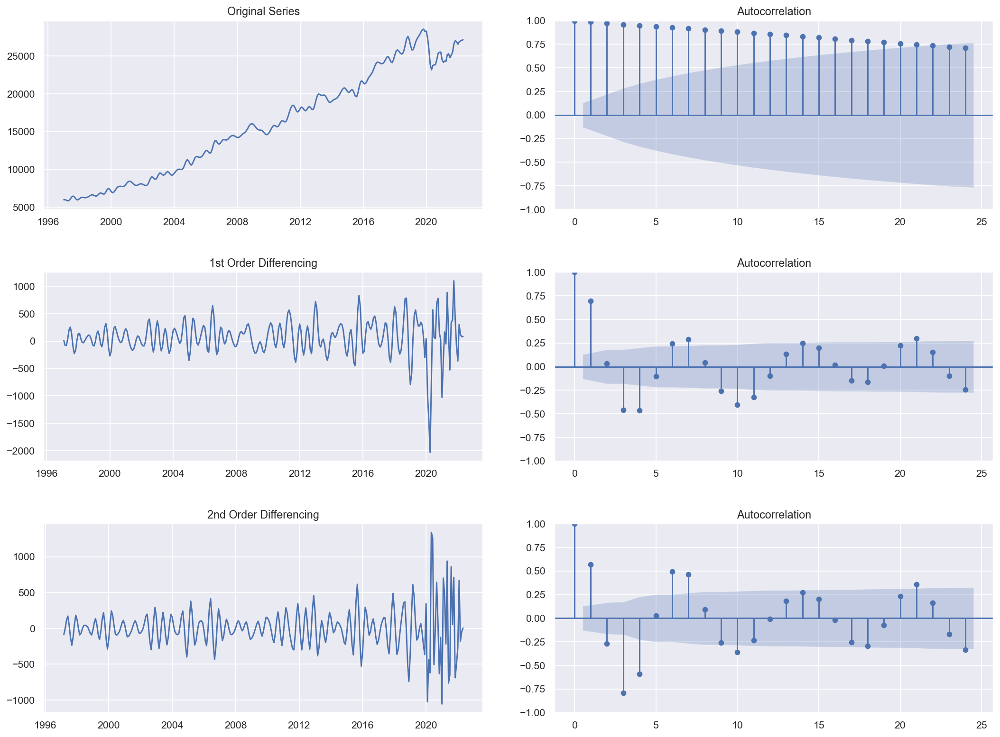

In [164]:
# How to find the order of differencing (d) in ARIMA model

plt.rcParams.update({'figure.figsize':(16,12), 'figure.dpi':140})


# Original Series
fig, axes = plt.subplots(3, 2)
fig.tight_layout(pad = 3.0)


axes[0, 0].plot(predWW_FS1['Total Exports in the World']); axes[0, 0].set_title('Original Series')
plot_acf(predWW_S1['Total Exports in the World'], ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(predWW_FS1['Total Exports in the World'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(predWW_S1['Total Exports in the World'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(predWW_FS1['Total Exports in the World'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(predWW_S1['Total Exports in the World'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

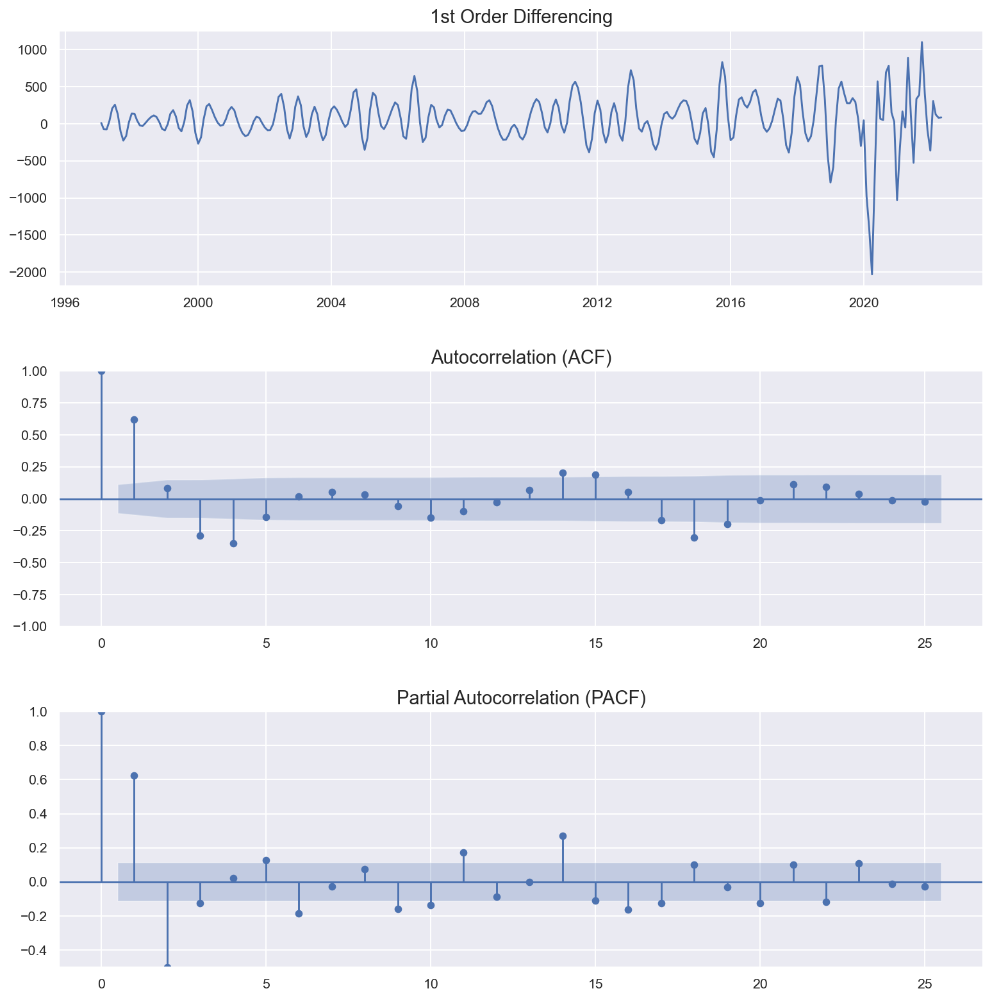

In [165]:
# How to find the order of PACF (p) and ACF (q) in ARIMA model based on the number of differencing

plt.rcParams.update({'figure.figsize':(12,12), 'figure.dpi':140})


fig, axes = plt.subplots(3, 1)
fig.tight_layout(pad = 3.0)



# 1st Differencing
axes[0].plot(predWW_FS1['Total Exports in the World'].diff())
axes[0].set_title('1st Order Differencing', size=15)

# ACF
plot_acf(predWW_FS1['Total Exports in the World'].diff().dropna(), ax=axes[1])
axes[1].set_title('Autocorrelation (ACF)',size=15)

# PACF
plot_pacf(predWW_FS1['Total Exports in the World'].diff().dropna(), ax=axes[2])
axes[2].set_title('Partial Autocorrelation (PACF)',size=15)
axes[2].set(ylim=(-0.5,1))


plt.show()

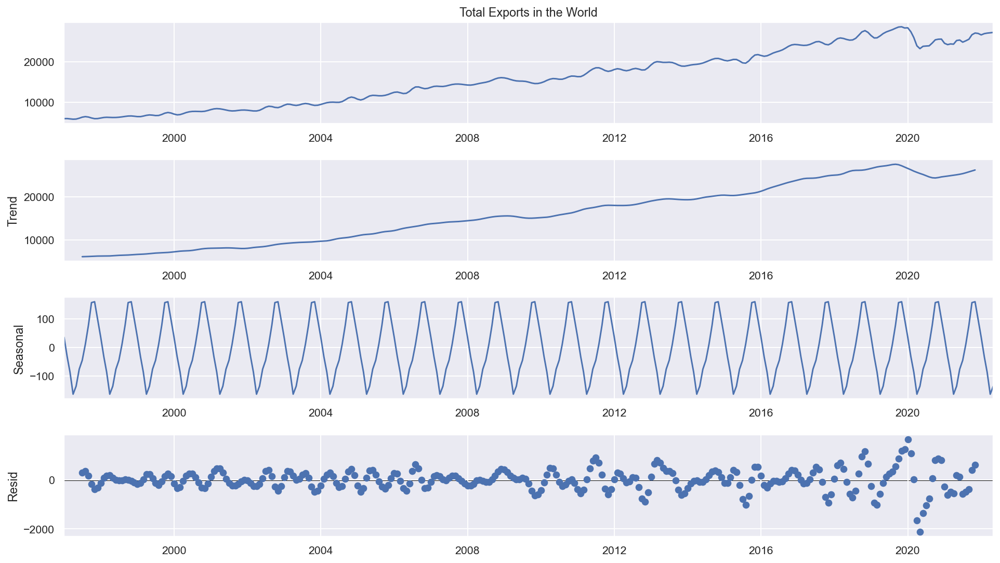

In [166]:
# Check if there is any seasonality

plt.rc('figure',figsize=(14,8))
plt.rc('font',size=15)

result = seasonal_decompose(predWW_FS1['Total Exports in the World'].dropna(),model='additive')
fig = result.plot()

In [167]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_FS1['Total Exports in the World'].diff().dropna(), autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);
   

Dickey Fuller Test:
Test Statistic                  -4.828777
p-value                          0.000048
Number of Lags Used             15.000000
Number of Observations Used    288.000000
Critical Value (1%)             -3.453262
Critical Value (5%)             -2.871628
Critical Value (10%)            -2.572146
dtype: float64


In [168]:
# Split the data into train and test set
train_dataF1 = predWW_FS1[:len(predWW_FS1)-60]
test_dataF1 = predWW_FS1[len(predWW_FS1)-60:]

In [169]:
# Automatic Search for the best parameters
modeFl = auto_arima(train_dataF1['Total Exports in the World'], start_p=1, start_q=1,
                      test='adf',
                      max_p=5, max_q=5,
                      m=12,             
                      d=1,
                      seasonal=True,   
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=2935.765, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3312.938, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3155.646, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3051.976, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3339.178, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2937.471, Time=0.08 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=2923.753, Time=0.39 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2938.038, Time=0.25 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=2893.618, Time=2.56 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=2907.338, Time=2.03 sec
 ARIMA(1,1,1)(2,0,2)[12] intercept   : AIC=2887.504, Time=2.89 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=2894.758, Time=2.62 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=3.42 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=3117.683, Time=2.22 sec
 ARIMA(2,1,1)(2,0,2)[12]

In [170]:
# Manuall selection of the parameters
sarima_modelF1 = SARIMAX(train_dataF1['Total Exports in the World'].astype(int), order=(1,1,1),seasonal_order=(2,0,2,12))
sarima_model_fitF1 = sarima_modelF1.fit(disp=0)
print(sarima_model_fitF1.summary())

                                        SARIMAX Results                                        
Dep. Variable:              Total Exports in the World   No. Observations:                  245
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 12)   Log Likelihood               -1445.394
Date:                                 Thu, 22 Sep 2022   AIC                           2904.787
Time:                                         19:52:23   BIC                           2929.267
Sample:                                     01-01-1997   HQIC                          2914.646
                                          - 05-01-2017                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7514      0.046     16.256      0.000       0.661       0

In [171]:
# Final parameters for the model
sarima_modelF1 = SARIMAX(train_dataF1['Total Exports in the World'].astype(int), order=(1,1,1),seasonal_order=(2,1,2,12))
sarima_model_fitF1 = sarima_modelF1.fit(disp=0)
print(sarima_model_fitF1.summary())

                                        SARIMAX Results                                        
Dep. Variable:              Total Exports in the World   No. Observations:                  245
Model:             SARIMAX(1, 1, 1)x(2, 1, [1, 2], 12)   Log Likelihood               -1386.172
Date:                                 Thu, 22 Sep 2022   AIC                           2786.343
Time:                                         19:52:54   BIC                           2810.470
Sample:                                     01-01-1997   HQIC                          2796.073
                                          - 05-01-2017                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6989      0.054     12.852      0.000       0.592       0

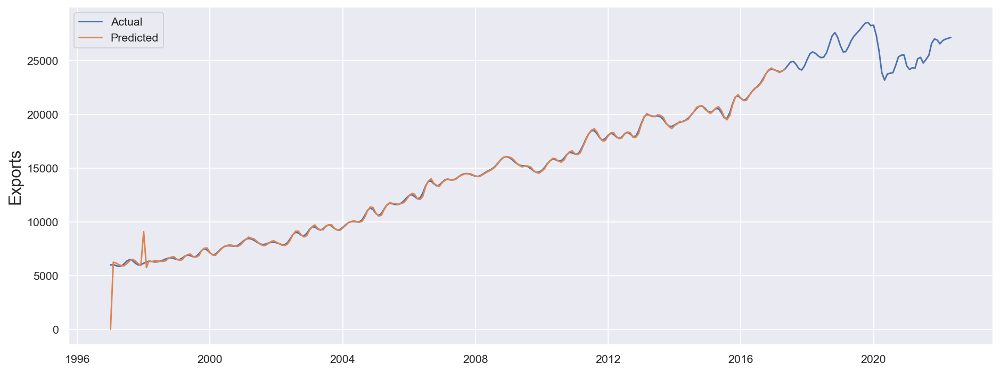

In [172]:
# Prediction on the test data

sarima_predictions_testF1 = sarima_model_fitF1.predict()
sarima_predictions_testF1

plt.figure(figsize=(16,6))
plt.plot(predWW_FS1, label="Actual")
plt.plot(sarima_predictions_testF1, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

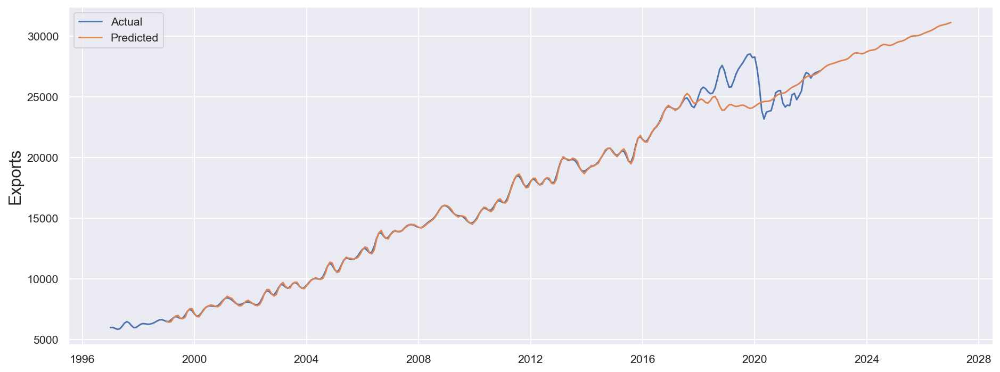

In [173]:
# Prediction for the Future

sarima_predictions_futureF1 = sarima_model_fitF1.predict(24,360)
sarima_predictions_futureF1

plt.figure(figsize=(16,6))
plt.plot(predWW_FS1, label="Actual")
plt.plot(sarima_predictions_futureF1, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

In [174]:
pd.DataFrame(sarima_predictions_futureF1).tail(24)

,predicted_mean
2025-02-01,29494.928595
2025-03-01,29554.784862
2025-04-01,29598.907713
2025-05-01,29666.420537
2025-06-01,29774.580615
2025-07-01,29895.183753
2025-08-01,29986.724984
2025-09-01,30024.818705
2025-10-01,30033.434506
2025-11-01,30053.480156


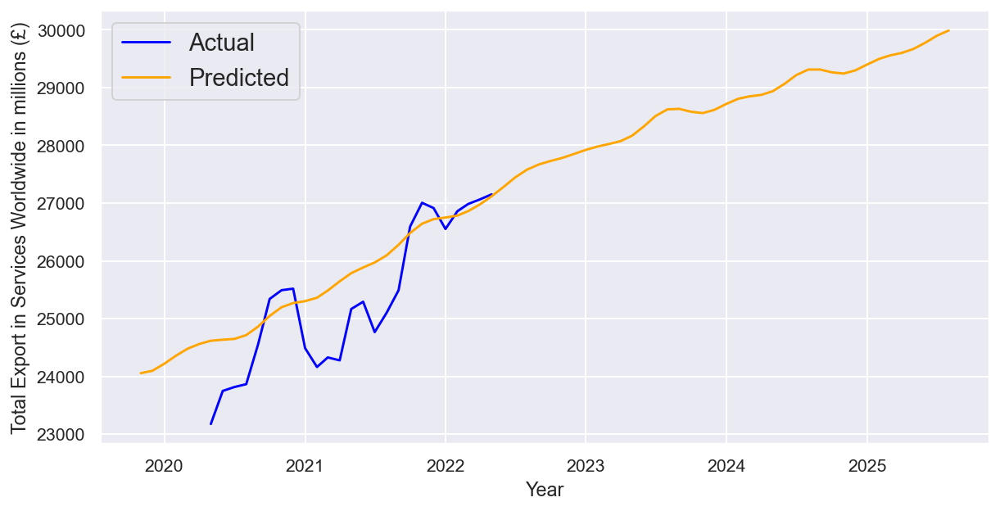

In [175]:
# Total Actual and Predicted Export in Services Worldwide in millions (£)

fig, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(x = 'Year', y = 'Total Exports in the World' ,data = ES_WW_M.iloc[280:],color = 'blue',label="Actual")
sns.lineplot(data = sarima_predictions_futureF1.iloc[250:320],color = 'orange',label="Predicted")
plt.legend(fontsize = 'medium')
plt.ylabel('Total Export in Services Worldwide in millions (£)');


In [176]:
# Calculation of Mean and RMSE
start=len(train_dataF1)
end=len(train_dataF1)+len(test_dataF1)-1

mean = test_dataF1.mean()
rmse = sqrt(mean_squared_error(sarima_model_fitF1.predict(start=start,end=end,typ='levels'),test_dataF1))
print(mean)
print(rmse)

Total Exports in the World    25844.016667
dtype: float64
1863.6618864733273


16.b) Import of Services (Worldwide)

In [177]:
# Trade in Services Monthly (1997 - 2022)

predWW_FS2 = IS_WW_M
predWW_FS2 = predWW_FS2.set_index('Year')
predWW_FS2 = predWW_FS2.astype({'Total Imports in the World':'int'})

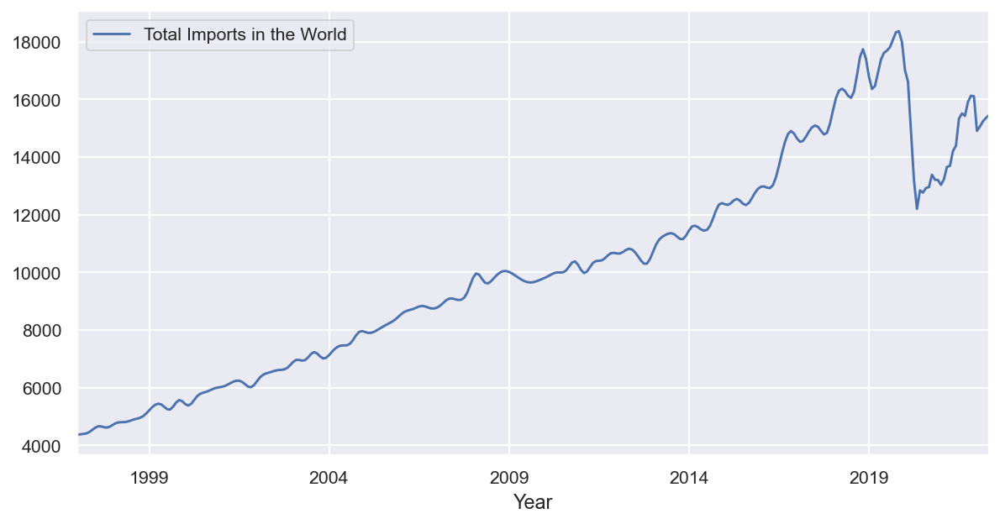

In [178]:
# Plot the data

plt.rcParams.update({'figure.figsize':(10,5), 'figure.dpi':140})
predWW_FS2.plot();

In [179]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:of EU27
print('Dickey Fuller Test:')
dftest = adfuller(predWW_FS2['Total Imports in the World'], autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                  -0.764750
p-value                          0.829258
Number of Lags Used             14.000000
Number of Observations Used    290.000000
Critical Value (1%)             -3.453102
Critical Value (5%)             -2.871559
Critical Value (10%)            -2.572108
dtype: float64


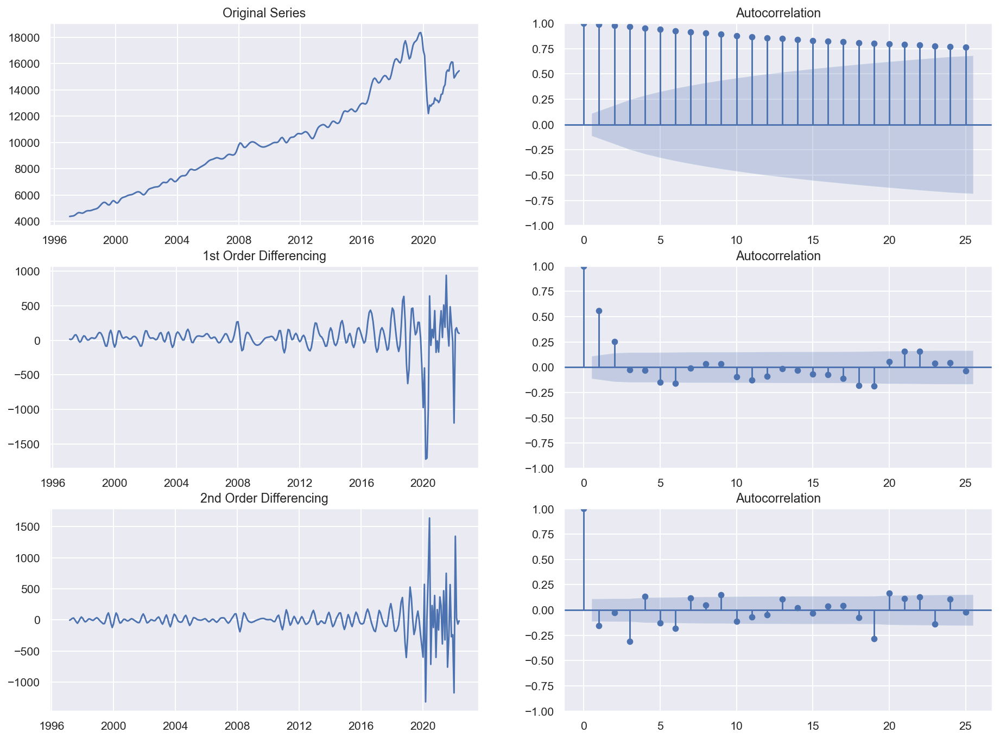

In [180]:
# How to find the order of differencing (d) in ARIMA model

plt.rcParams.update({'figure.figsize':(16,12), 'figure.dpi':140})


# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(predWW_FS2['Total Imports in the World']); axes[0, 0].set_title('Original Series')
plot_acf(predWW_FS2['Total Imports in the World'], ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(predWW_FS2['Total Imports in the World'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(predWW_FS2['Total Imports in the World'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(predWW_FS2['Total Imports in the World'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(predWW_FS2['Total Imports in the World'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

In [181]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_FS2['Total Imports in the World'].diff().dropna(), autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                  -5.139355
p-value                          0.000012
Number of Lags Used             13.000000
Number of Observations Used    290.000000
Critical Value (1%)             -3.453102
Critical Value (5%)             -2.871559
Critical Value (10%)            -2.572108
dtype: float64


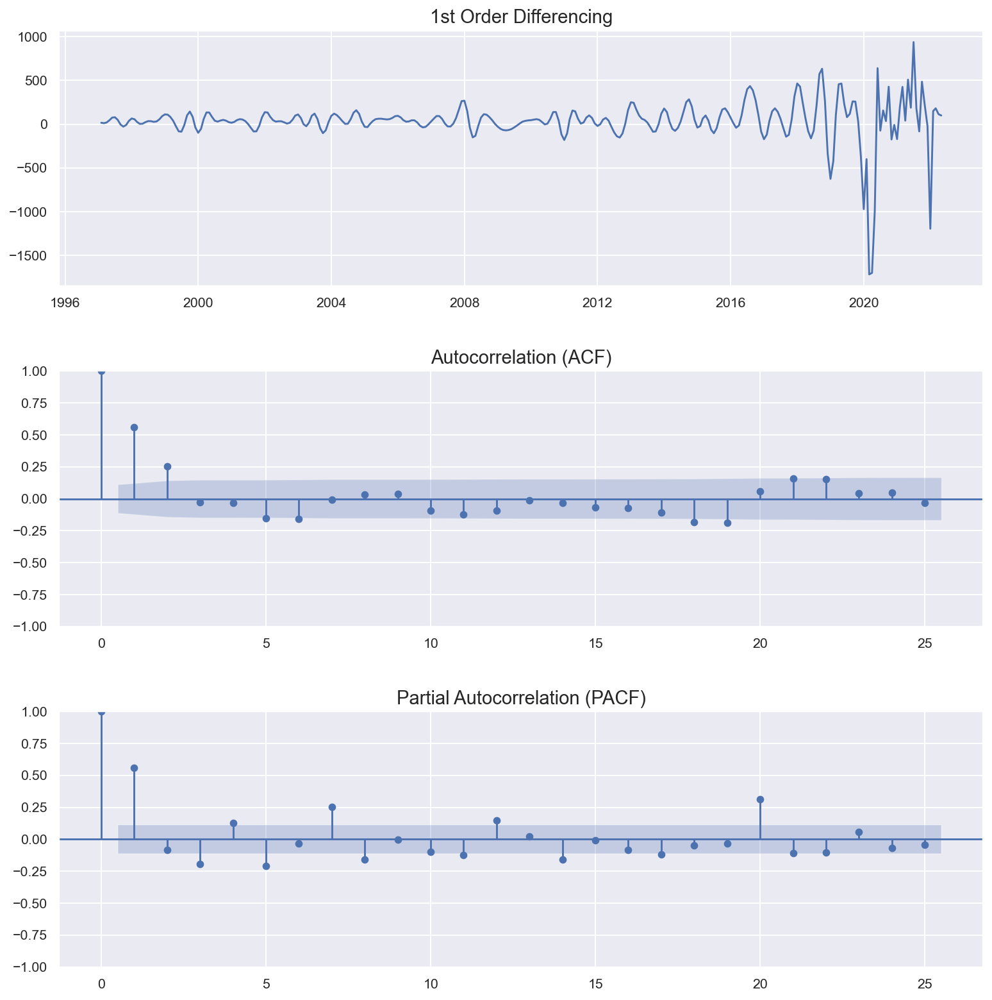

In [182]:
# How to find the order of PACF (p) and ACF (q) in ARIMA model based on the number of differencing

plt.rcParams.update({'figure.figsize':(12,12), 'figure.dpi':140})


fig, axes = plt.subplots(3, 1)
fig.tight_layout(pad = 3.0)



# 1st Differencing
axes[0].plot(predWW_FS2['Total Imports in the World'].diff())
axes[0].set_title('1st Order Differencing', size=15)

# ACF
plot_acf(predWW_FS2['Total Imports in the World'].diff().dropna(), ax=axes[1])
axes[1].set_title('Autocorrelation (ACF)',size=15)

# PACF
plot_pacf(predWW_FS2['Total Imports in the World'].diff().dropna(), ax=axes[2])
axes[2].set_title('Partial Autocorrelation (PACF)',size=15)


plt.show()

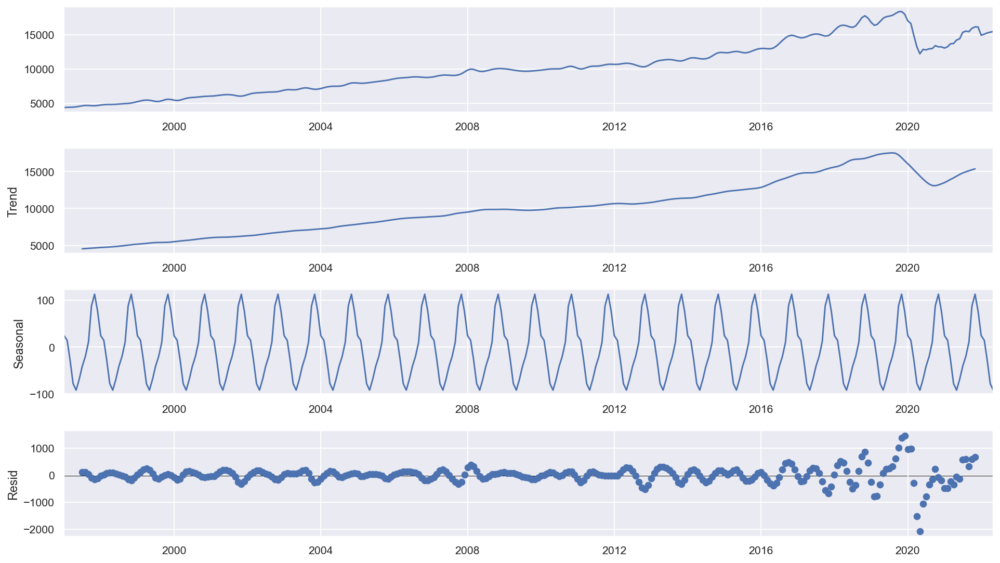

In [183]:
# Check if there is any seasonality

plt.rc('figure',figsize=(14,8))
plt.rc('font',size=15)

result = seasonal_decompose(predWW_FS2,model='additive')
fig = result.plot()

In [184]:
# Split the data into train and test set
train_dataF2 = predWW_FS2[:len(predWW_FS2)-60]
test_dataF2 = predWW_FS2[len(predWW_FS2)-60:]

In [185]:
# Automatic search for the best parameters
model = auto_arima(train_dataF2['Total Imports in the World'], start_p=0, start_q=0,
                      test='adf',
                      max_p=4, max_q=5,
                      m=12,             
                      d=1,          
                      seasonal=True,   
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2903.256, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2901.824, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2676.392, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2948.502, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2674.655, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=2676.259, Time=0.14 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=2324.819, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=2326.662, Time=0.26 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=2326.593, Time=0.19 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=2150.679, Time=0.06 sec
 ARIMA(3,1,0)(1,0,0)[12] intercept   : AIC=2152.678, Time=0.17 sec
 ARIMA(3,1,0)(0,0,1)[12] intercept

In [186]:
# Manual selection for the parameters
sarima_modelF2 = SARIMAX(train_dataF2['Total Imports in the World'].astype(int), order=(1,1,2),seasonal_order=(4,1,2,12))
sarima_model_fitF2 = sarima_modelF2.fit(disp=0)
print(sarima_model_fitF2.summary())



                                     SARIMAX Results                                      
Dep. Variable:         Total Imports in the World   No. Observations:                  245
Model:             SARIMAX(1, 1, 2)x(4, 1, 2, 12)   Log Likelihood               -1059.895
Date:                            Thu, 22 Sep 2022   AIC                           2139.789
Time:                                    19:54:24   BIC                           2174.257
Sample:                                01-01-1997   HQIC                          2153.690
                                     - 05-01-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7016      0.045     15.672      0.000       0.614       0.789
ma.L1          1.6466      0.315   

In [187]:
# Final model selection
sarima_modelF2 = SARIMAX(train_dataF2['Total Imports in the World'].astype(int), order=(5,1,1),seasonal_order=(2,1,0,12))
sarima_model_fitF2 = sarima_modelF2.fit(disp=0)
print(sarima_model_fitF2.summary())

                                      SARIMAX Results                                      
Dep. Variable:          Total Imports in the World   No. Observations:                  245
Model:             SARIMAX(5, 1, 1)x(2, 1, [], 12)   Log Likelihood               -1001.041
Date:                             Thu, 22 Sep 2022   AIC                           2020.081
Time:                                     19:54:35   BIC                           2051.102
Sample:                                 01-01-1997   HQIC                          2032.592
                                      - 05-01-2017                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.6815      0.060     28.153      0.000       1.564       1.799
ar.L2         -0.9398      

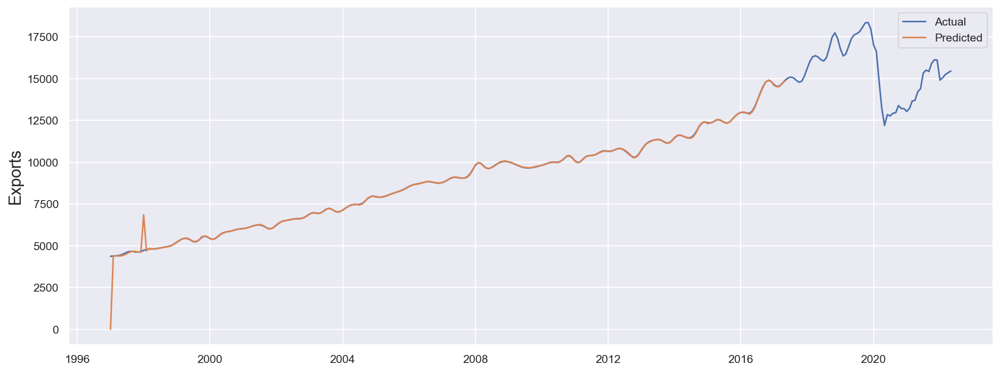

In [188]:
# Prediction on the test data

sarima_predictions_testF2 = sarima_model_fitF2.predict()
sarima_predictions_testF2

plt.figure(figsize=(16,6))
plt.plot(predWW_FS2, label="Actual")
plt.plot(sarima_predictions_testF2, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

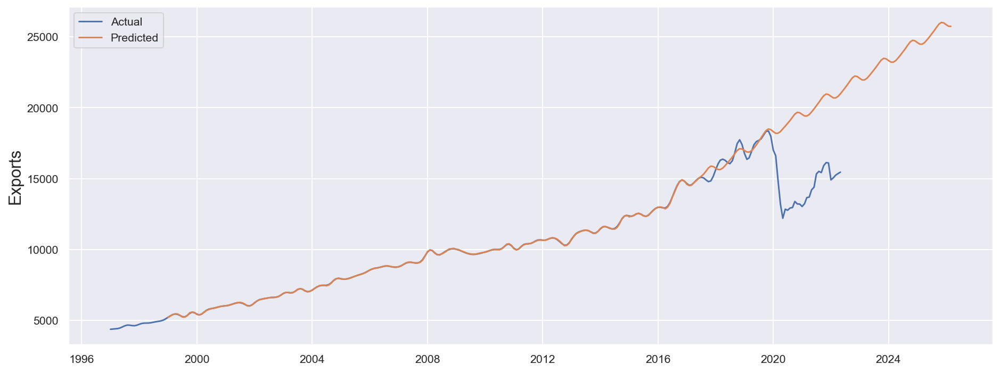

In [189]:
# Prediction for the Future

sarima_predictions_futureF2 = sarima_model_fitF2.predict(24,350)
sarima_predictions_futureF2

plt.figure(figsize=(16,6))
plt.plot(predWW_FS2, label="Actual")
plt.plot(sarima_predictions_futureF2, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

In [190]:
pd.DataFrame(sarima_predictions_futureF2).tail(24)

,predicted_mean
2024-04-01,23322.870887
2024-05-01,23507.775845
2024-06-01,23720.474595
2024-07-01,23940.056260
2024-08-01,24169.510021
2024-09-01,24419.105414
2024-10-01,24640.605937
2024-11-01,24758.880849
2024-12-01,24723.899831
2025-01-01,24598.143846


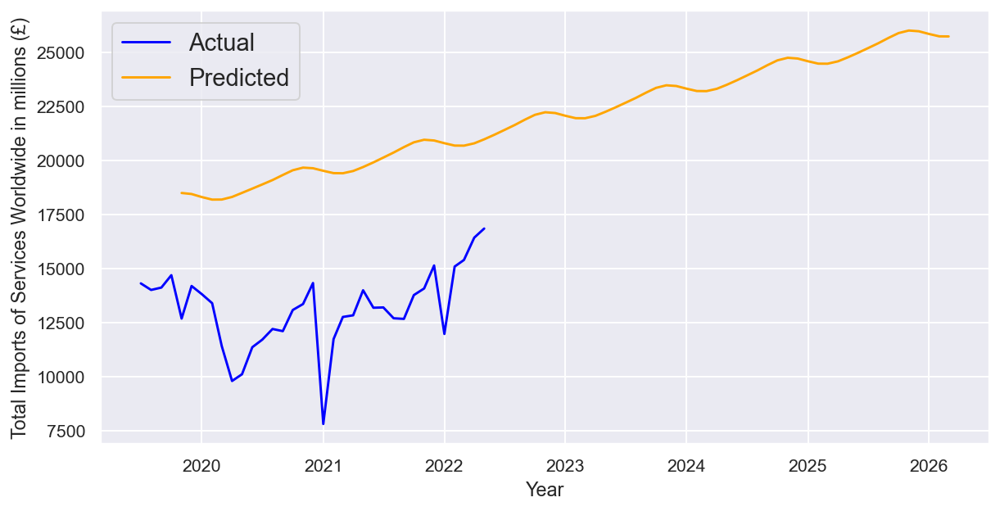

In [191]:
# Total Actual and Predicted Imports of Services Worldwide in millions (£)

fig, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(x = 'Year', y = 'Total Exports of EU27' ,data = expGM_TEU.iloc[270:],color = 'blue',label="Actual")
sns.lineplot(data = sarima_predictions_futureF2.iloc[250:350],color = 'orange',label="Predicted")
plt.legend(fontsize = 'medium')
plt.ylabel('Total Imports of Services Worldwide in millions (£)');


In [192]:
# Calculation of Mean and RMSE
start=len(train_dataF2)
end=len(train_dataF2)+len(test_dataF2)-1

mean = test_dataF2.mean()
rmse = sqrt(mean_squared_error(sarima_model_fitF2.predict(start=start,end=end,typ='levels'),test_dataF2))
print(mean)
print(rmse)

Total Imports in the World    15516.766667
dtype: float64
3805.3170438699176


16.c) Import of Goods (Worldwide)

In [193]:
# Trade in Services Monthly (1997 - 2022)

predWW_FG1 = impGM_World
predWW_FG1 = predWW_FG1.set_index('Year')
predWW_FG1 = predWW_FG1.astype({'Total Imports in the World':'int'})


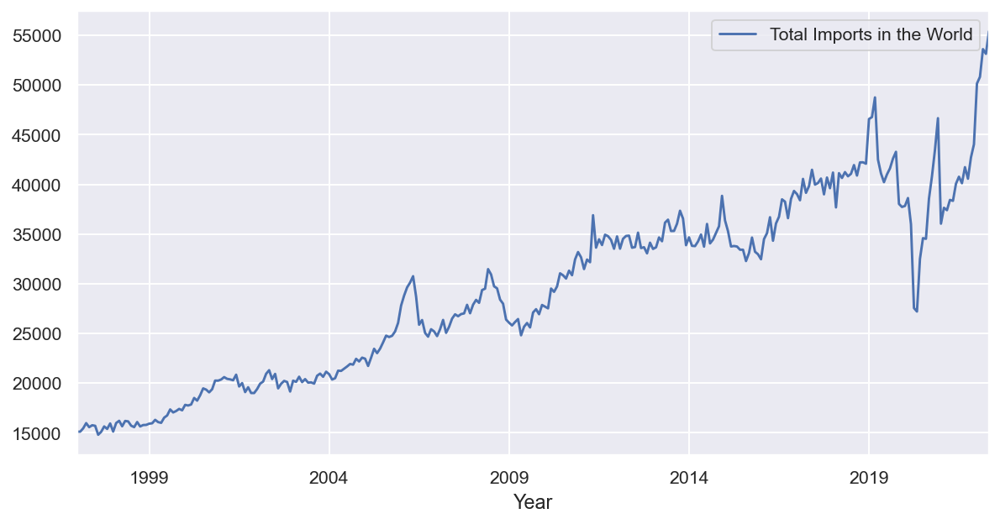

In [194]:
# Plot the data

plt.rcParams.update({'figure.figsize':(10,5), 'figure.dpi':140})
predWW_FG1.plot();

In [195]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_FG1['Total Imports in the World'], autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                   0.101881
p-value                          0.966189
Number of Lags Used              9.000000
Number of Observations Used    295.000000
Critical Value (1%)             -3.452713
Critical Value (5%)             -2.871388
Critical Value (10%)            -2.572017
dtype: float64


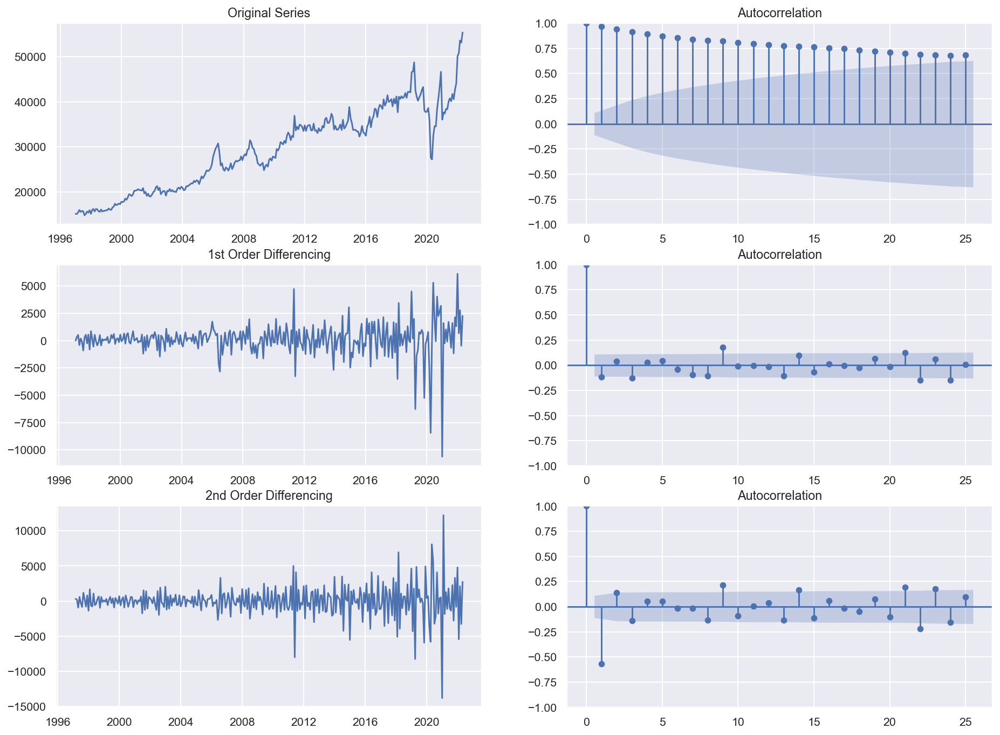

In [196]:
# How to find the order of differencing (d) in ARIMA model

plt.rcParams.update({'figure.figsize':(16,12), 'figure.dpi':140})


# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(predWW_FG1['Total Imports in the World']); axes[0, 0].set_title('Original Series')
plot_acf(predWW_FG1['Total Imports in the World'], ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(predWW_FG1['Total Imports in the World'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(predWW_FG1['Total Imports in the World'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(predWW_FG1['Total Imports in the World'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(predWW_FG1['Total Imports in the World'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

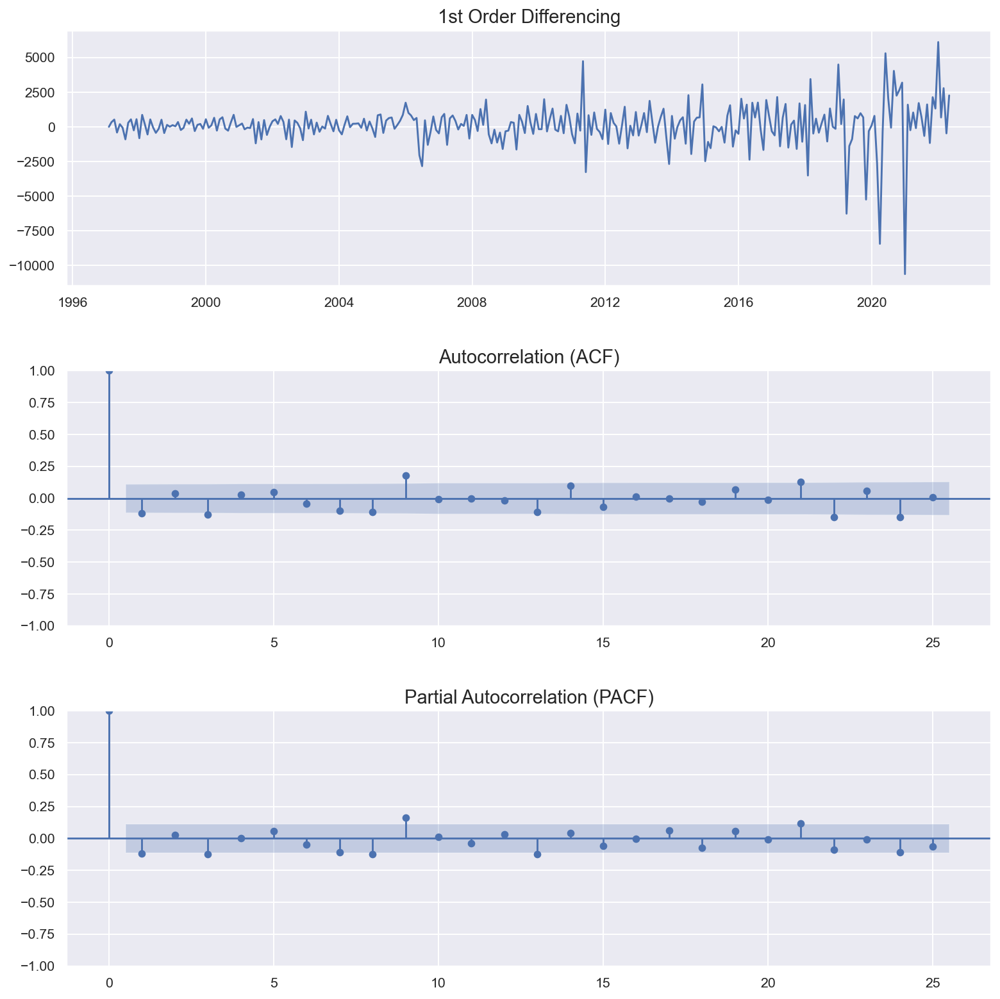

In [197]:
# How to find the order of PACF (p) and ACF (q) in ARIMA model based on the number of differencing

plt.rcParams.update({'figure.figsize':(12,12), 'figure.dpi':140})


fig, axes = plt.subplots(3, 1)
fig.tight_layout(pad = 3.0)



# 1st Differencing
axes[0].plot(predWW_FG1['Total Imports in the World'].diff())
axes[0].set_title('1st Order Differencing', size=15)

# ACF
plot_acf(predWW_FG1['Total Imports in the World'].diff().dropna(), ax=axes[1])
axes[1].set_title('Autocorrelation (ACF)',size=15)

# PACF
plot_pacf(predWW_FG1['Total Imports in the World'].diff().dropna(), ax=axes[2])
axes[2].set_title('Partial Autocorrelation (PACF)',size=15)


plt.show()

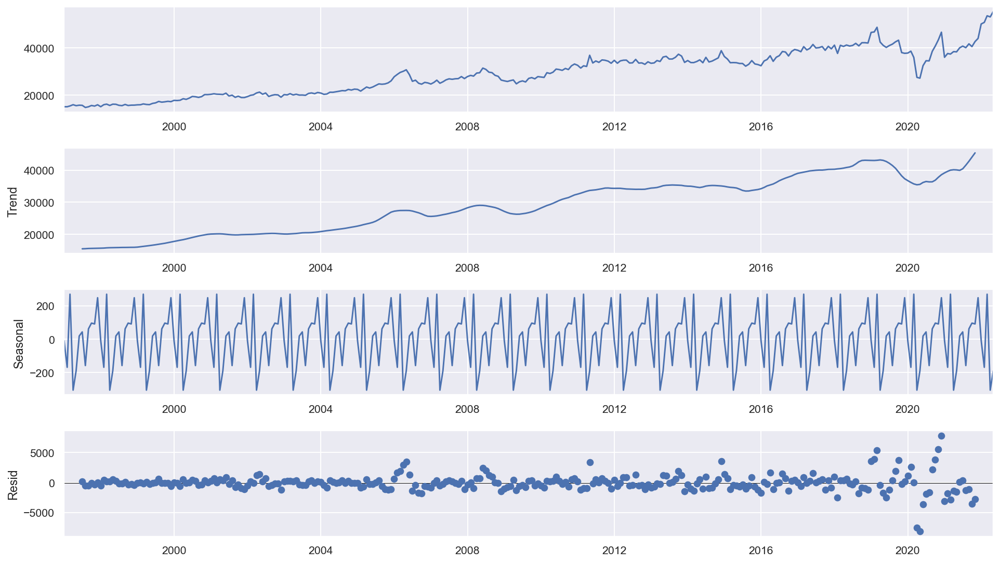

In [198]:
# Check if there is any seasonality

plt.rc('figure',figsize=(14,8))
plt.rc('font',size=15)

result = seasonal_decompose(predWW_FG1,model='additive')
fig = result.plot()

In [199]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_FG1['Total Imports in the World'].diff().dropna(), autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                  -5.584682
p-value                          0.000001
Number of Lags Used              8.000000
Number of Observations Used    295.000000
Critical Value (1%)             -3.452713
Critical Value (5%)             -2.871388
Critical Value (10%)            -2.572017
dtype: float64


In [200]:
# Split the data into train and test set
train_dataF3 = predWW_FG1[:len(predWW_FG1)-60]
test_dataF3 = predWW_FG1[len(predWW_FG1)-60:]

In [201]:
# Automatically search for the best model
model = auto_arima(train_dataF3['Total Imports in the World'], start_p=0, start_q=0,
                      test='adf',
                      max_p=5, max_q=5,
                      m=12,             
                      d=1,          
                      seasonal=True,   
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=4039.778, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=4043.187, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=4025.974, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=4027.238, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4043.937, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=4030.694, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=4028.164, Time=0.99 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=4027.707, Time=0.12 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=4025.671, Time=0.14 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=4027.712, Time=0.83 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=4029.668, Time=1.22 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=4027.828, Time=0.06 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=4027.911, Time=0.11 sec
 ARIMA(2,1,1)(0,0,1)[12] intercept   : AIC=4029.845, Time=0.14 sec
 ARIMA(1,1,0)(0,0,1

In [202]:
# Manual selection for the model
sarima_modelF3 = SARIMAX(train_dataF3['Total Imports in the World'].astype(int), order=(1,1,1),seasonal_order=(2,0,1,12))
sarima_model_fitF3 = sarima_modelF3.fit(disp=0)
print(sarima_model_fitF3.summary())

                                     SARIMAX Results                                      
Dep. Variable:         Total Imports in the World   No. Observations:                  245
Model:             SARIMAX(1, 1, 1)x(2, 0, 1, 12)   Log Likelihood               -2011.633
Date:                            Thu, 22 Sep 2022   AIC                           4035.266
Time:                                    19:54:43   BIC                           4056.249
Sample:                                01-01-1997   HQIC                          4043.717
                                     - 05-01-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3864      0.276     -1.401      0.161      -0.927       0.154
ma.L1          0.1873      0.291   

In [203]:
# The Final model selected
sarima_modelF3 = SARIMAX(train_dataF3['Total Imports in the World'].astype(int), order=(1,1,1),seasonal_order=(2,1,1,12))
sarima_model_fitF3 = sarima_modelF3.fit(disp=0)
print(sarima_model_fitF3.summary())

                                     SARIMAX Results                                      
Dep. Variable:         Total Imports in the World   No. Observations:                  245
Model:             SARIMAX(1, 1, 1)x(2, 1, 1, 12)   Log Likelihood               -1940.249
Date:                            Thu, 22 Sep 2022   AIC                           3892.498
Time:                                    19:55:05   BIC                           3913.178
Sample:                                01-01-1997   HQIC                          3900.838
                                     - 05-01-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1448      0.248     -0.583      0.560      -0.631       0.342
ma.L1         -0.0955      0.249   

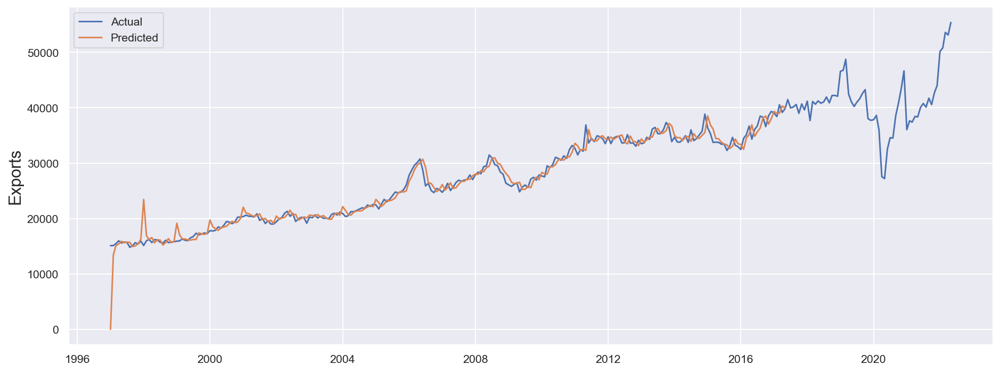

In [204]:
# Prediction on the test data

sarima_predictions_testF3 = sarima_model_fitF3.predict()
sarima_predictions_testF3

plt.figure(figsize=(16,6))
plt.plot(predWW_FG1, label="Actual")
plt.plot(sarima_predictions_testF3, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

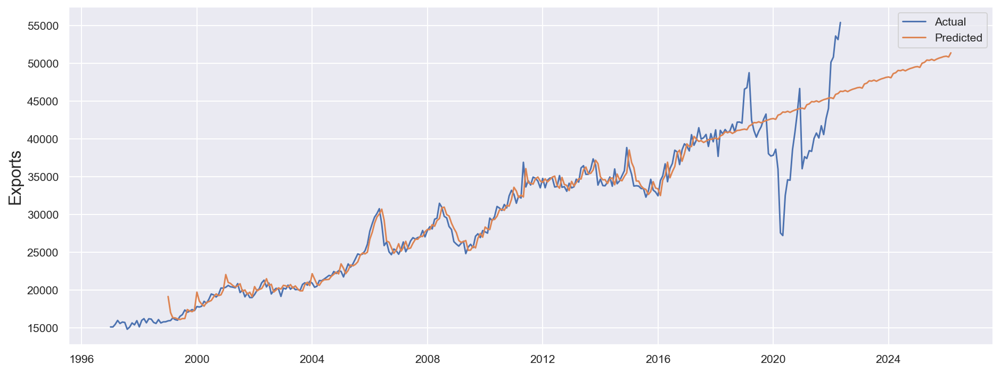

In [205]:
# Prediction for the Future

sarima_predictions_futureF3 = sarima_model_fitF3.predict(24,350)
sarima_predictions_futureF3

plt.figure(figsize=(16,6))
plt.plot(predWW_FG1, label="Actual")
plt.plot(sarima_predictions_futureF3, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

In [206]:
pd.DataFrame(sarima_predictions_futureF3).tail(24)

,predicted_mean
2024-04-01,48751.855041
2024-05-01,49053.001747
2024-06-01,49017.285379
2024-07-01,49147.149718
2024-08-01,48998.276784
2024-09-01,49173.400856
2024-10-01,49306.757310
2024-11-01,49404.417430
2024-12-01,49513.647321
2025-01-01,49564.002232


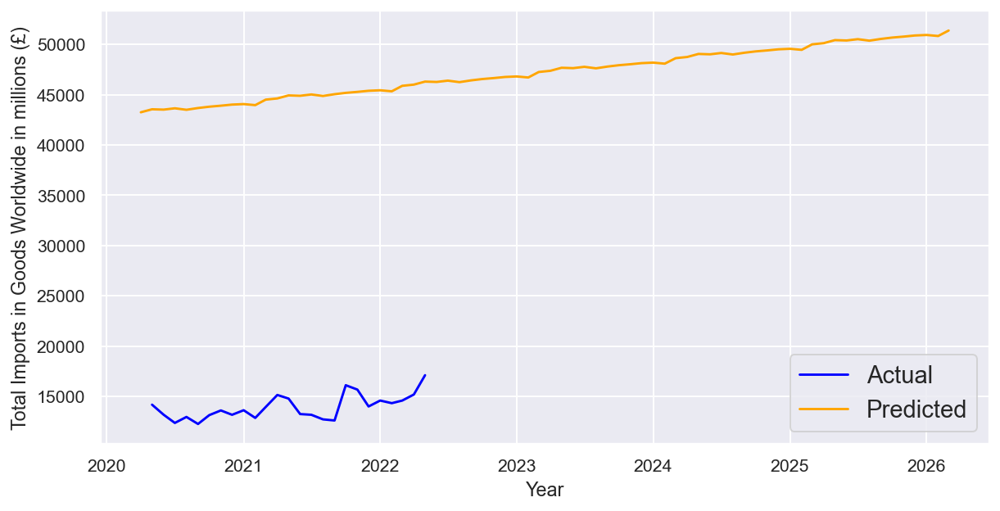

In [207]:
# Total Actual and Predicted Imports in Goods Worldwide in millions (£)
fig, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(x = 'Year', y = 'Total Exports in the rest of the World' ,data = expGM_TRest.iloc[280:],color = 'blue',label="Actual")
sns.lineplot(data = sarima_predictions_futureF3.iloc[255:350],color = 'orange',label="Predicted")
plt.legend(fontsize = 'medium')
plt.ylabel('Total Imports in Goods Worldwide in millions (£)');


In [208]:
# Calculation of Mean and RMSE
start=len(train_dataF3)
end=len(train_dataF3)+len(test_dataF3)-1

mean = test_dataF3.mean()
rmse = sqrt(mean_squared_error(sarima_model_fitF3.predict(start=start,end=end,typ='levels'),test_dataF3))
print(mean)
print(rmse)

Total Imports in the World    41067.316667
dtype: float64
5316.2907235917355


16.d) Export of Goods (Worldwide)

In [209]:
# Trade in Services Monthly (1997 - 2022)

predWW_FG2 = expGM_World
predWW_FG2 = predWW_FG2.set_index('Year')
predWW_FG2 = predWW_FG2.astype({'Total Exports in the World':'int'})


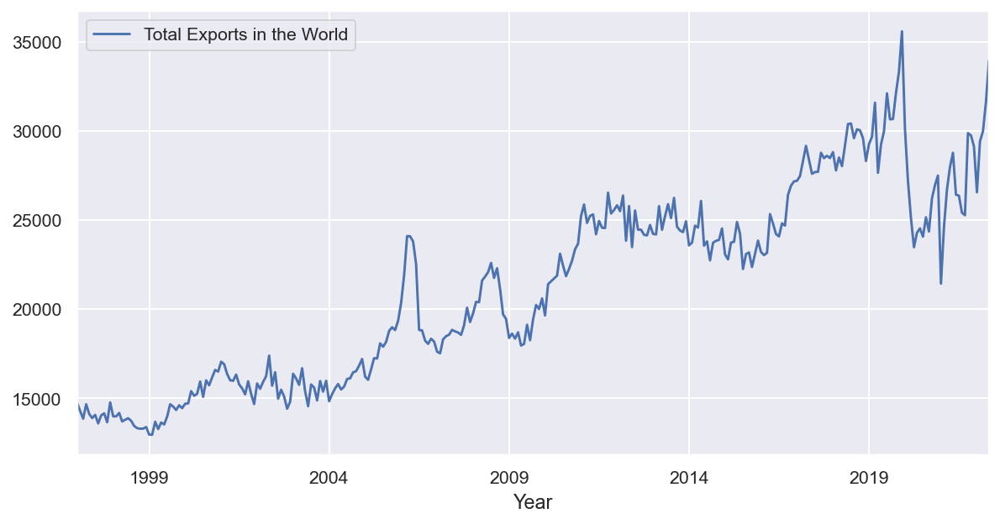

In [210]:
# Plot the data

plt.rcParams.update({'figure.figsize':(10,5), 'figure.dpi':140})
predWW_FG2.plot();

In [211]:
# Check if the data are stationary 
predWW_FG2
#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_FG2['Total Exports in the World'], autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                  -0.507280
p-value                          0.890588
Number of Lags Used             14.000000
Number of Observations Used    290.000000
Critical Value (1%)             -3.453102
Critical Value (5%)             -2.871559
Critical Value (10%)            -2.572108
dtype: float64


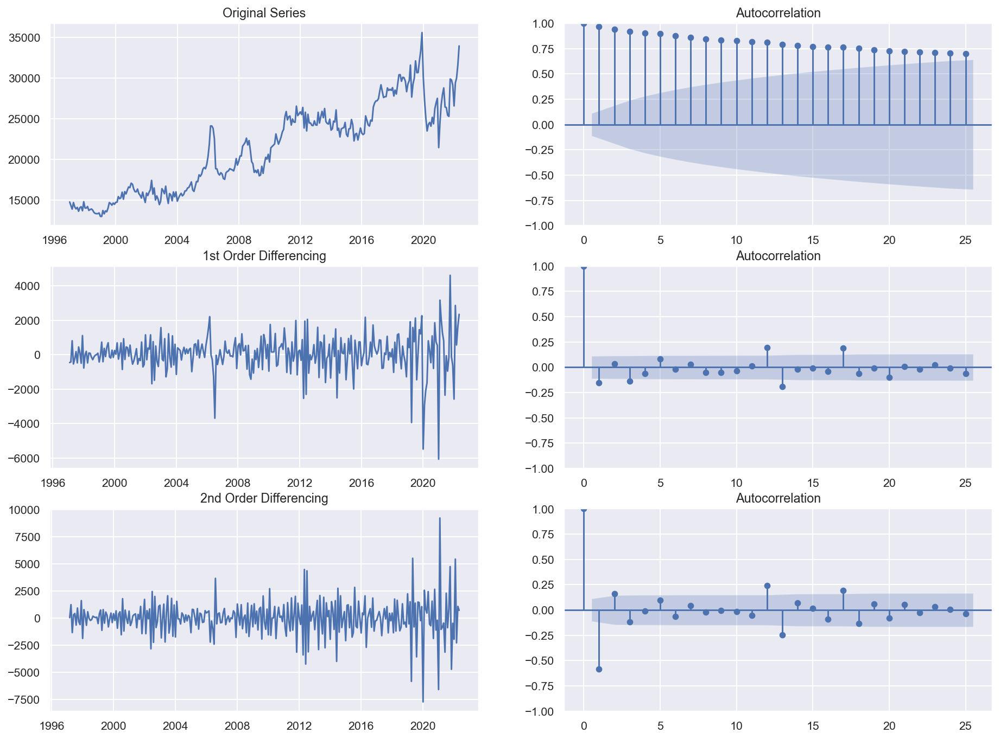

In [212]:
# How to find the order of differencing (d) in ARIMA model

plt.rcParams.update({'figure.figsize':(16,12), 'figure.dpi':140})


# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(predWW_FG2['Total Exports in the World']); axes[0, 0].set_title('Original Series')
plot_acf(predWW_FG2['Total Exports in the World'], ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(predWW_FG2['Total Exports in the World'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(predWW_FG2['Total Exports in the World'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(predWW_FG2['Total Exports in the World'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(predWW_FG2['Total Exports in the World'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

In [213]:
# Check if the data are stationary 

#Perform Dickey–Fuller test:
print('Dickey Fuller Test:')
dftest = adfuller(predWW_FG2['Total Exports in the World'].diff().dropna(), autolag='AIC')
output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Number of Lags Used','Number of Observations Used'])

for key,value in dftest[4].items():
    output['Critical Value (%s)'%key] = value
print(output);

Dickey Fuller Test:
Test Statistic                  -4.136182
p-value                          0.000843
Number of Lags Used             16.000000
Number of Observations Used    287.000000
Critical Value (1%)             -3.453342
Critical Value (5%)             -2.871664
Critical Value (10%)            -2.572164
dtype: float64


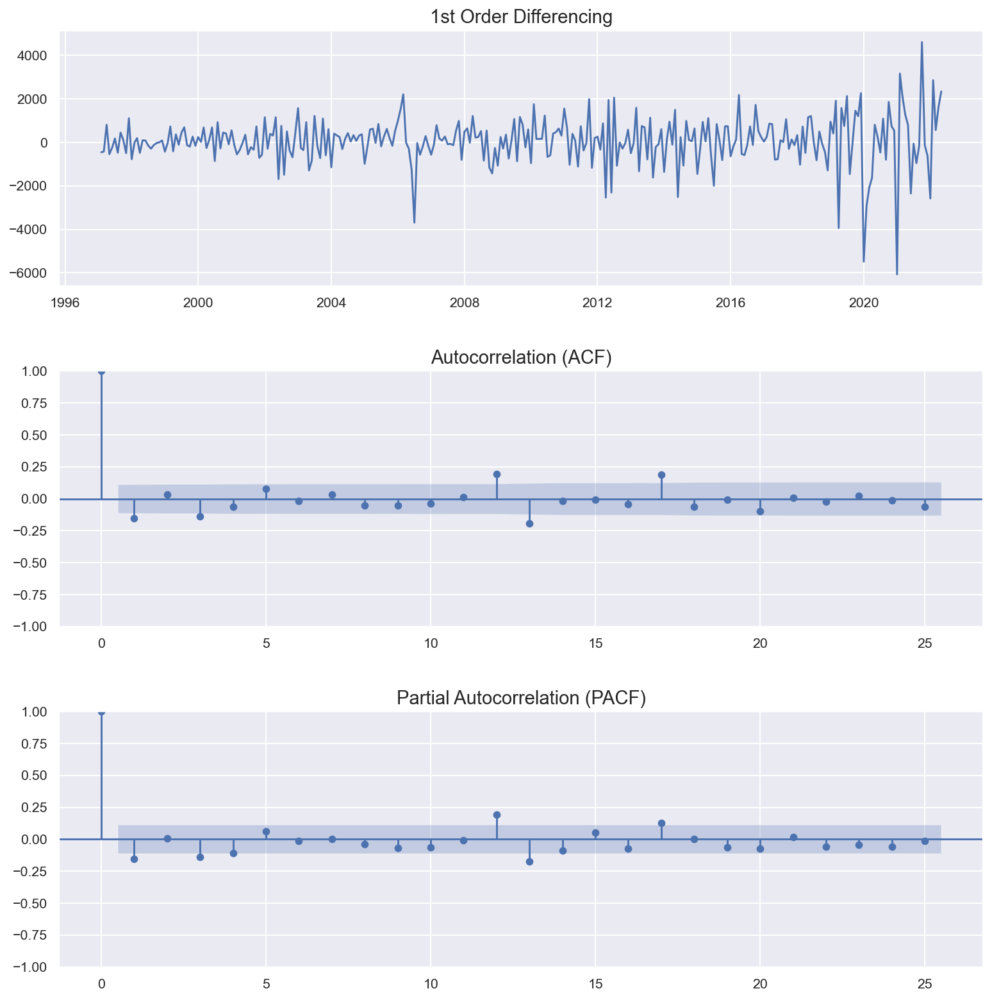

In [214]:
# How to find the order of PACF (p) and ACF (q) in ARIMA model based on the number of differencing

plt.rcParams.update({'figure.figsize':(12,12), 'figure.dpi':140})


fig, axes = plt.subplots(3, 1)
fig.tight_layout(pad = 3.0)



# 1st Differencing
axes[0].plot(predWW_FG2['Total Exports in the World'].diff())
axes[0].set_title('1st Order Differencing', size=15)

# ACF
plot_acf(predWW_FG2['Total Exports in the World'].diff().dropna(), ax=axes[1])
axes[1].set_title('Autocorrelation (ACF)',size=15)

# PACF
plot_pacf(predWW_FG2['Total Exports in the World'].diff().dropna(), ax=axes[2])
axes[2].set_title('Partial Autocorrelation (PACF)',size=15)


plt.show()

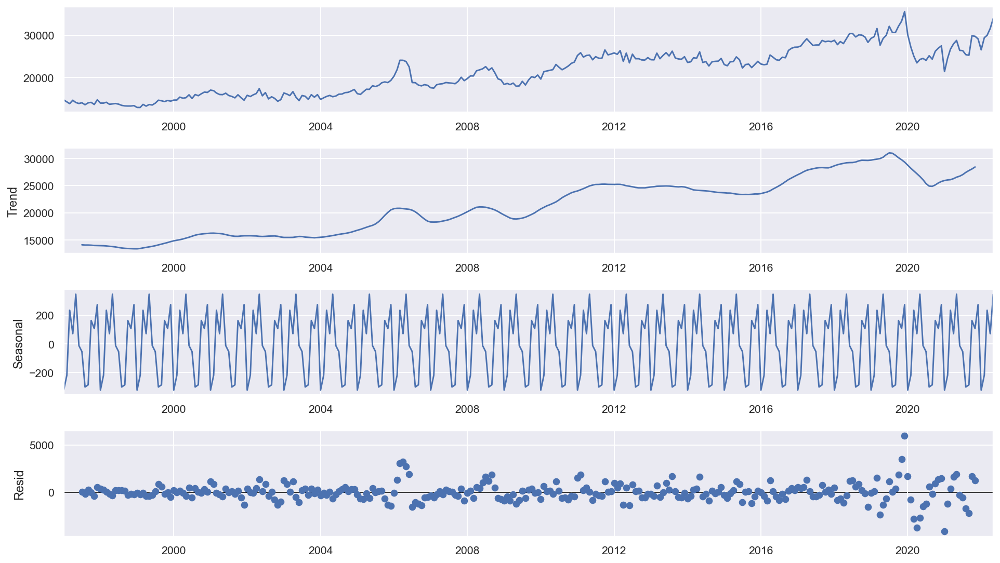

In [215]:
# Check if there is any seasonality

plt.rc('figure',figsize=(14,8))
plt.rc('font',size=15)

result = seasonal_decompose(predWW_FG2,model='additive')
fig = result.plot()

In [216]:
# Split the data into train and test set
train_dataF4 = predWW_FG2[:len(predWW_FG2)-60]
test_dataF4 = predWW_FG2[len(predWW_FG2)-60:]

In [217]:
# Automatic search for the best model
model = auto_arima(train_dataF4['Total Exports in the World'], start_p=0, start_q=0,
                      test='adf',
                      max_p=5, max_q=5,
                      m=12,             
                      d=1,          
                      seasonal=True,   
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=3973.063, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3972.035, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3958.429, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3960.747, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3971.162, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3957.087, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=3958.393, Time=0.06 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=3960.376, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=3958.759, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3958.933, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3959.152, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=3960.565, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=3957.256, Time=0.01 sec

Best model:  ARIMA(1,1,0)(0,0,0)[12] intercept
Total fit time: 0.527 seconds


In [218]:
# Final selected parameters
sarima_modelF4 = SARIMAX(train_dataF4['Total Exports in the World'].astype(int), order=(1,1,0),seasonal_order=(1,1,1,12))
sarima_model_fitF4 = sarima_modelF4.fit(disp=0)
print(sarima_model_fitF4.summary())

                                      SARIMAX Results                                       
Dep. Variable:           Total Exports in the World   No. Observations:                  245
Model:             SARIMAX(1, 1, 0)x(1, 1, [1], 12)   Log Likelihood               -1898.858
Date:                              Thu, 22 Sep 2022   AIC                           3805.716
Time:                                      19:55:09   BIC                           3819.503
Sample:                                  01-01-1997   HQIC                          3811.276
                                       - 05-01-2017                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2418      0.049     -4.948      0.000      -0.338      -0.146
ar.S.L12       0.16

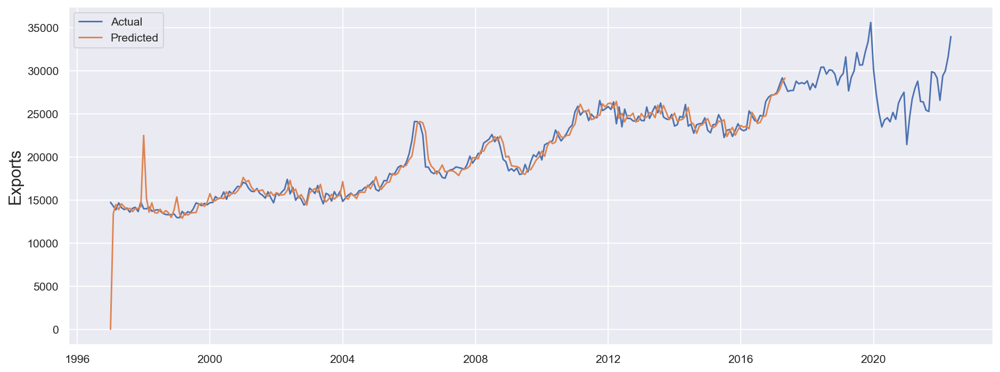

In [219]:
# Prediction on the test data

sarima_predictions_testF4 = sarima_model_fitF4.predict()
sarima_predictions_testF4

plt.figure(figsize=(16,6))
plt.plot(predWW_FG2, label="Actual")
plt.plot(sarima_predictions_testF4, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

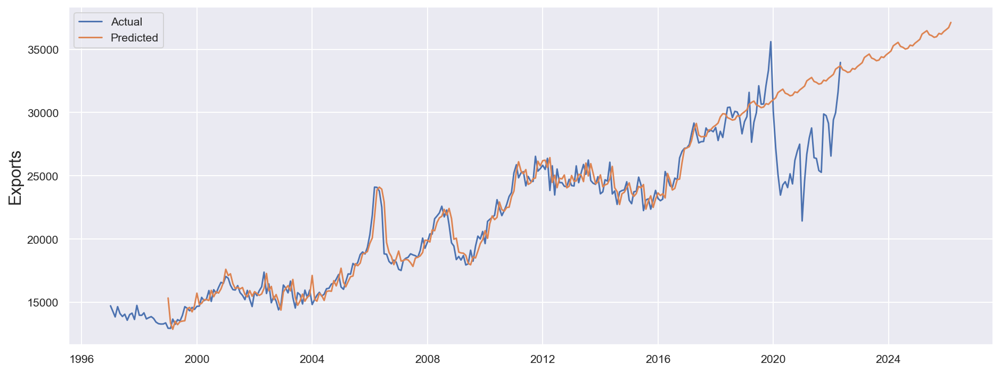

In [220]:
# Prediction for the Future

sarima_predictions_futureF4 = sarima_model_fitF4.predict(24,350)
sarima_predictions_futureF4

plt.figure(figsize=(16,6))
plt.plot(predWW_FG2, label="Actual")
plt.plot(sarima_predictions_futureF4, label="Predicted")
plt.ylabel('Exports', fontsize=16)
plt.legend();

In [221]:
pd.DataFrame(sarima_predictions_futureF4).tail(24)

,predicted_mean
2024-04-01,35413.842179
2024-05-01,35543.448557
2024-06-01,35227.423727
2024-07-01,35153.606797
2024-08-01,35017.995538
2024-09-01,35069.669641
2024-10-01,35327.642299
2024-11-01,35270.593063
2024-12-01,35476.155251
2025-01-01,35626.924226


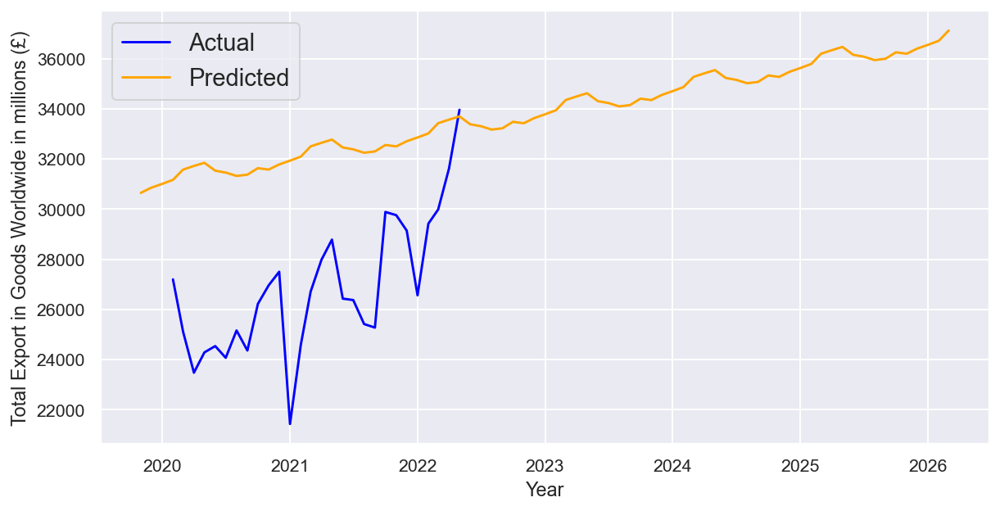

In [222]:
# Total Actual and Predicted Export in Goods Worldwide in millions (£)

fig, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(x = 'Year', y = 'Total Exports in the World' ,data = expGM_World.iloc[277:],color = 'blue',label="Actual")
sns.lineplot(data = sarima_predictions_futureF4.iloc[250:350],color = 'orange',label="Predicted")
plt.legend(fontsize = 'medium')
plt.ylabel('Total Export in Goods Worldwide in millions (£)');


In [223]:
# Calculation of Mean and RMSE
start=len(train_dataF4)
end=len(train_dataF4)+len(test_dataF4)-1

mean = test_dataF4.mean()
rmse = sqrt(mean_squared_error(sarima_model_fitF4.predict(start=start,end=end,typ='levels'),test_dataF4))
print(mean)
print(rmse)

Total Exports in the World    28375.516667
dtype: float64
4096.1438763803535
